### External Libraries

In [3]:
import subprocess
import sys

def install_package(package_name):
    try:
        # Check if the package is installed
        subprocess.check_output([sys.executable, '-m', 'pip', 'show', package_name])

    except subprocess.CalledProcessError:
        # If the package is not installed, install it
        subprocess.call([sys.executable, '-m', 'pip', 'install','--user', package_name])

install_package('spacepy')
install_package('pandas')
install_package('numpy')
install_package('matplotlib')
install_package('basemap')
install_package('requests')
install_package('cartopy')
install_package('pymsis')
install_package('spacepy')
install_package('pickle5')
install_package('seaborn')
install_package('xarray')
install_package('cdflib')
install_package('apexpy')
install_package('netcdf4')
install_package('nrlmsise00')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.1/132.1 kB 2.7 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Running setup.py clean for pickle5


  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [20 lines of output]
      running bdist_wheel
      running build
      running build_py
      creating build
      creating build/lib.linux-x86_64-cpython-311
      creating build/lib.linux-x86_64-cpython-311/pickle5
      copying pickle5/pickle.py -> build/lib.linux-x86_64-cpython-311/pickle5
      copying pickle5/__init__.py -> build/lib.linux-x86_64-cpython-311/pickle5
      copying pickle5/pickletools.py -> build/lib.linux-x86_64-cpython-311/pickle5
      creating build/lib.linux-x86_64-cpython-311/pickle5/test
      copying pickle5/test/test_pickle.py -> build/lib.linux-x86_64-cpython-311/pickle5/test
      copying pickle5/test/pickletester.py -> build/lib.linux-x86_64-cpython-311/pickle5/test
      copying pickle5/test/__init__.py -> build/lib.linux-x86_64-cpython-311/pickle5/test
      copying pickle5/test/test_picklebuffer.py -> build/lib.linux-x86_64-cpyt

Failed to build pickle5


ERROR: Could not build wheels for pickle5, which is required to install pyproject.toml-based projects


  Using cached apexpy-2.0.1.tar.gz (328 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Installing backend dependencies: started
  Installing backend dependencies: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'error'


  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> [20 lines of output]
      + meson setup /tmp/pip-install-i4l1usf3/apexpy_c500e4f639404dd9978090344a088c1f /tmp/pip-install-i4l1usf3/apexpy_c500e4f639404dd9978090344a088c1f/.mesonpy-uqr9z2_c -Dbuildtype=release -Db_ndebug=if-release -Db_vscrt=md --native-file=/tmp/pip-install-i4l1usf3/apexpy_c500e4f639404dd9978090344a088c1f/.mesonpy-uqr9z2_c/meson-python-native-file.ini
      The Meson build system
      Version: 1.6.0
      Source dir: /tmp/pip-install-i4l1usf3/apexpy_c500e4f639404dd9978090344a088c1f
      Build dir: /tmp/pip-install-i4l1usf3/apexpy_c500e4f639404dd9978090344a088c1f/.mesonpy-uqr9z2_c
      Build type: native build
      Project name: apexpy
      Project version: 2.0.1
      
      ../meson.build:1:0: ERROR: Unknown compiler(s): [['cc'], ['gcc'], ['clang'], ['nvc'], ['pgcc'], ['icc'], ['icx']]
      The following exception(s) were encountere

In [5]:
import os
os.environ["CDF_LIB"] = "C:/Users/jose_ne/Downloads/cdf3.8.0_64bit_VS2015/lib"
from spacepy import pycdf
import pandas as pd
from pymsis import msis
import numpy as np
import spacepy.pycdf as pycdf
import matplotlib.pyplot as plt
from scipy import stats
from scipy.interpolate import griddata
from datetime import datetime
import pickle
import seaborn as sns
import xarray as xr
import nrlmsise00
import os.path
from datetime import datetime, timedelta
from matplotlib.colors import Normalize
from matplotlib.ticker import FuncFormatter

### Function for Outlier detection and save the cleaned data to folder

In [ ]:

def remove_outliers_from_merged_dfs(merged_dfs, low_threshold=1e-14, high_threshold=1e6, window_size=50, threshold=3):
    cleaned_dfs = {}
    
    for year, df in merged_dfs.items():
        # Step 1: Apply low and high density thresholds
        df = df[(df['density'] > low_threshold) & (df['density'] < high_threshold)]
        
        # Step 2: Initial outlier check using z-scores
        z_scores = (df['density'] - df['density'].mean()) / df['density'].std()
        df.loc[abs(z_scores) > threshold, 'density'] = np.nan
        
        # Step 3: Secondary outlier check using rolling median and std
        df['rolling_median'] = df['density'].rolling(window=window_size, min_periods=20, center=True).median()
        df['rolling_std'] = df['density'].rolling(window=window_size, min_periods=20, center=True).std()
        
        df['outlier'] = (abs(df['density'] - df['rolling_median']) / df['rolling_std']) > threshold
        df.loc[df['outlier'], 'density'] = np.nan
        
        # Drop the temporary columns used for outlier detection
        df.drop(columns=['rolling_median', 'rolling_std', 'outlier'], inplace=True)
        
        # Store the cleaned DataFrame
        cleaned_dfs[year] = df
    
    return cleaned_dfs

# Function to load the pickle file
def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

pickle_file_path = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/merged_dfs.pkl'
loaded_data = load_pickle_file(pickle_file_path)

cleaned_merged_dfs = remove_outliers_from_merged_dfs(loaded_data)
print(cleaned_merged_dfs)
# Function to save the cleaned data back to a pickle file
def save_to_pickle(cleaned_merged_dfs, cleaned_pickle_file_path):
    os.makedirs(os.path.dirname(cleaned_pickle_file_path), exist_ok=True)
    with open(cleaned_pickle_file_path, 'wb') as file:
        pickle.dump(cleaned_merged_dfs, file)


cleaned_pickle_file_path = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/cleaned_merged_dfs.pkl'

save_to_pickle(cleaned_merged_dfs, cleaned_pickle_file_path)
loaded_cleaned_data = load_pickle_file(cleaned_pickle_file_path)
#print(loaded_cleaned_data)


In [ ]:
import pickle
def remove_outliers_from_merged_dfs(merged_dfs, low_threshold=1e-14, high_threshold=1e6, window_size=50, threshold=3):
    cleaned_dfs = {}
    
    for year, df in merged_dfs.items():
        # Step 1: Apply low and high density thresholds
        df = df[(df['density'] > low_threshold) & (df['density'] < high_threshold)]
        
        # Step 2: Initial outlier check using z-scores
        z_scores = (df['density'] - df['density'].mean()) / df['density'].std()
        df = df[abs(z_scores) <= threshold]
        
        # Step 3: Secondary outlier check using rolling median and std
        df['rolling_median'] = df['density'].rolling(window=window_size, min_periods=20, center=True).median()
        df['rolling_std'] = df['density'].rolling(window=window_size, min_periods=20, center=True).std()
        
        df['outlier'] = (abs(df['density'] - df['rolling_median']) / df['rolling_std']) > threshold
        df = df[~df['outlier']]
        
        # Drop the temporary columns used for outlier detection
        df.drop(columns=['rolling_median', 'rolling_std', 'outlier'], inplace=True)
        
        # Store the cleaned DataFrame
        cleaned_dfs[year] = df
    
    return cleaned_dfs

# Function to load the pickle file
def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

pickle_file_path = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/merged_dfs.pkl'
loaded_data = load_pickle_file(pickle_file_path)

cleaned_merged_dfs = remove_outliers_from_merged_dfs(loaded_data)
print(cleaned_merged_dfs)








In [ ]:
import pickle
# Function to load the pickle file
def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

pickle_file_path = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/merged_dfs.pkl'
loaded_data = load_pickle_file(pickle_file_path)

cleaned_merged_dfs = remove_outliers_from_merged_dfs(loaded_data)

# Function to save the cleaned data back to a pickle file
def save_to_pickle(cleaned_merged_dfs, cleaned_pickle_file_path):
    os.makedirs(os.path.dirname(cleaned_pickle_file_path), exist_ok=True)
    with open(cleaned_pickle_file_path, 'wb') as file:
        pickle.dump(cleaned_merged_dfs, file)


cleaned_pickle_file_path = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/cleaned_merged_dfs.pkl'

save_to_pickle(cleaned_merged_dfs, cleaned_pickle_file_path)
loaded_cleaned_data = load_pickle_file(cleaned_pickle_file_path)
print(loaded_cleaned_data)

In [ ]:
import pickle
import os
import pandas as pd
import matplotlib.pyplot as plt

# Function to load the pickle file
def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

# Path to the cleaned pickle file
cleaned_pickle_file_path = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/cleaned_merged_dfs.pkl'

# Load the cleaned data
loaded_data = load_pickle_file(cleaned_pickle_file_path)

# Concatenate all DataFrames into one DataFrame
combined_df_10yrs = pd.concat(loaded_data.values(), ignore_index=True)

# Ensure the DataFrame contains the 'altitude' and 'density' columns
if 'altitude' in combined_df_10yrs.columns and 'density' in combined_df_10yrs.columns:
    # Step 1: Explore Altitude Distribution
    altitude_distribution = combined_df_10yrs['altitude'].describe()
    print("Altitude Distribution Summary:")
    print(altitude_distribution)

    # Step 2: Identify Relevant Altitude Range
    relevant_altitude_range = (420, 520)  # Define your relevant altitude range

    # Step 3: Calculate Density Statistics
    density_statistics = combined_df_10yrs.groupby(pd.cut(combined_df_10yrs['altitude'], bins=10))[['density']].mean()
    print("\nDensity Statistics by Altitude Range:")
    print(density_statistics)

    # Step 4: Select Normalization Altitude
    normalization_altitude = altitude_distribution['50%']  # Example: Use median altitude as normalization point
    print("\nSelected Normalization Altitude:", normalization_altitude)

    # Convert altitude from meters to kilometers
    normalization_altitude_km = normalization_altitude / 1000
    print("Selected Normalization Altitude (km):", normalization_altitude_km)

    # Plot histogram of altitude values
    plt.figure(figsize=(10, 6))
    plt.hist(combined_df_10yrs['altitude'], bins=50, alpha=0.7, color='blue', edgecolor='black')

    # Add a vertical line for the median (normalization altitude)
    plt.axvline(normalization_altitude, color='red', linestyle='dashed', linewidth=2, label=f'Median Altitude: {normalization_altitude:.2f} m')

    # Add labels and title
    plt.xlabel('Altitude (meters)')
    plt.ylabel('Frequency')
    plt.title('Altitude Distribution with Normalization Point for Combined Data')
    plt.legend()

    # Show plot
    plt.show()
else:
    print("The combined DataFrame does not contain the required 'altitude' and/or 'density' columns.")


In [2]:
import os
import pandas as pd
import cdflib
import pickle

# Custom outlier removal function
def remove_outliers(df, low_threshold=1e-14, high_threshold=1e6, window_size=50, threshold=3):
    # Step 1: Apply low and high density thresholds
    df = df[(df['density'] > low_threshold) & (df['density'] < high_threshold)]
    
    # Step 2: Initial outlier check using z-scores
    z_scores = (df['density'] - df['density'].mean()) / df['density'].std()
    df = df[abs(z_scores) <= threshold]
    
    # Step 3: Secondary outlier check using rolling median and std
    df['rolling_median'] = df['density'].rolling(window=window_size, min_periods=20, center=True).median()
    df['rolling_std'] = df['density'].rolling(window=window_size, min_periods=20, center=True).std()
    
    df['outlier'] = (abs(df['density'] - df['rolling_median']) / df['rolling_std']) > threshold
    df = df[~df['outlier']]
    
    # Drop the temporary columns used for outlier detection
    df.drop(columns=['rolling_median', 'rolling_std', 'outlier'], inplace=True)
    
    return df

# Function to process a single CDF file and return the cleaned DataFrame
def process_cdf_file(file_path):
    # Load CDF file
    cdf_file = cdflib.CDF(file_path)
    
    # Extract all variable names
    variable_names = cdf_file.cdf_info().rVariables + cdf_file.cdf_info().zVariables
    
    # Extract all variables into a dictionary
    data_dict = {var: cdf_file[var][...] for var in variable_names}
    
    # Convert dictionary to DataFrame
    df = pd.DataFrame(data_dict)
    
    # Apply outlier removal
    cleaned_df = remove_outliers(df)
    
    return cleaned_df

# Define the input and output directories
input_directory = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/SAT_C_0201'
output_directory = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/daily_out_removed'

# Create output directory if it doesn't exist
os.makedirs(output_directory, exist_ok=True)

# Process each CDF file in the input directory
for file_name in os.listdir(input_directory):
    if file_name.endswith('.cdf'):
        file_path = os.path.join(input_directory, file_name)
        
        # Process the CDF file and remove outliers
        cleaned_data = process_cdf_file(file_path)
        
        # Save the cleaned data to a pickle file
        output_file_path = os.path.join(output_directory, file_name.replace('.cdf', '.pkl'))
        with open(output_file_path, 'wb') as output_file:
            pickle.dump(cleaned_data, output_file)

print("Processing complete. Cleaned data saved in pickle format.")


Processing complete. Cleaned data saved in pickle format.


In [3]:
pip install numpy --force-reinstall

  Using cached numpy-2.1.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
Using cached numpy-2.1.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
basemap 1.4.1 requires matplotlib<3.9,>=1.5; python_version >= "3.5", but you have matplotlib 3.9.2 which is incompatible.
basemap 1.4.1 requires numpy<1.27,>=1.21; python_version >= "3.8", but you have numpy 2.1.2 which is incompatible.
basemap 1.4.1 requires packaging<24.0,>=16.0; python_version >= "3.5", but you have packaging 24.0 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


/tmp/ipykernel_110/1179935778.py:54: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/tmp/ipykernel_110/1179935778.py:55: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('data_comparison.png')
/opt/conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


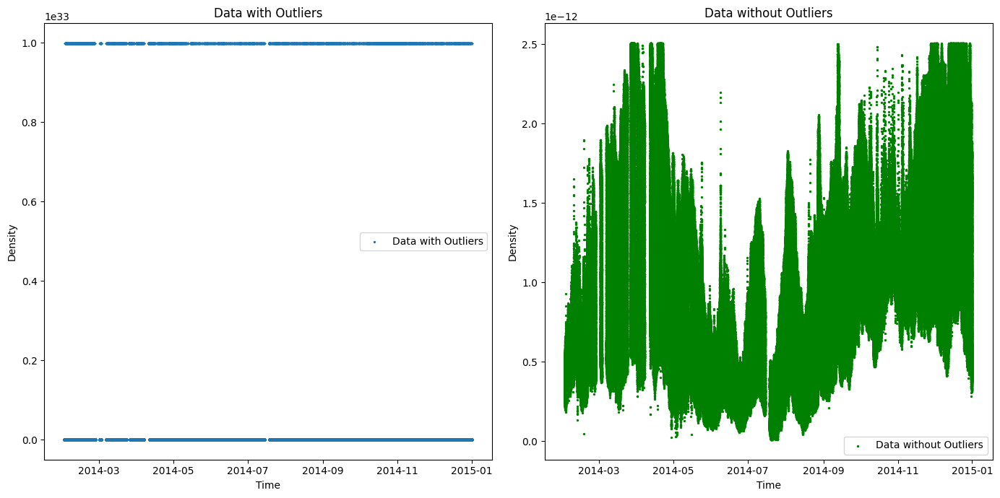

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import numpy as np
def load_pickle_file(cleaned_pickle_file_path):
    with open(cleaned_pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

# Path to the cleaned pickle file
cleaned_pickle_file_path = '/mnt/sofs01/mirroreddata/SWARM-DISS/DNS/ACC/cleaned_merged_dfs.pkl'

def load_merged_pickle_file(merged_pickle_file_path):
    with open(merged_pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

# Path to the cleaned pickle file
merged_pickle_file_path = '/mnt/sofs01/mirroreddata/SWARM-DISS/DNS/ACC/merged_dfs.pkl'

# Load the cleaned data
merged_df_dict = load_merged_pickle_file(merged_pickle_file_path)
cleaned_df_dict = load_pickle_file(cleaned_pickle_file_path)
year_to_plot = 2014

# Extract the DataFrame for the specified year
merged_df = merged_df_dict[year_to_plot]
cleaned_df = cleaned_df_dict[year_to_plot]
# Ensure 'time' column is in datetime format
# Ensure 'time' is in datetime format
merged_df['time'] = pd.to_datetime(merged_df['time'])
cleaned_df['time'] = pd.to_datetime(cleaned_df['time'])


plt.figure(figsize=(14, 7))

# Subplot for the data with outliers
plt.subplot(1, 2, 1)
plt.scatter(merged_df['time'], merged_df['density'], s=2, label='Data with Outliers')
plt.xlabel('Time')
plt.ylabel('Density')
plt.title('Data with Outliers')
plt.legend()

# Subplot for the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_df['time'], cleaned_df['density'], s=2, label='Data without Outliers', color='green')
plt.xlabel('Time')
plt.ylabel('Density')
plt.title('Data without Outliers')
plt.legend()

# Save the figure
plt.tight_layout()
plt.savefig('data_comparison.png')

plt.show()


In [4]:
print("NaN values in merged_df['density']:", merged_df['density'].isna().sum())

# Check for Inf values
print("Inf values in merged_df['density']:", np.isinf(merged_df['density']).sum())
# Remove NaN and Inf values from the 'density' column
merged_df = merged_df.replace([np.inf, -np.inf], np.nan)  # Replace Inf with NaN
merged_df = merged_df.dropna(subset=['density'])  # Drop NaN values

# Do the same for the cleaned_df if needed
cleaned_df = cleaned_df.replace([np.inf, -np.inf], np.nan)  # Replace Inf with NaN
cleaned_df = cleaned_df.dropna(subset=['density'])  # Drop NaN values


NaN values in merged_df['density']: 0
Inf values in merged_df['density']: 1


In [5]:
print("Density range in merged_df:", merged_df['density'].min(), merged_df['density'].max())
print("Density range in cleaned_df:", cleaned_df['density'].min(), cleaned_df['density'].max())


Density range in merged_df: -1.3497351931095602e-12 9.99e+32
Density range in cleaned_df: 1.0002938977229575e-14 2.5074579535100007e-12


In [47]:
import xarray as xr

# Define the path to your NetCDF file
filename = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/SW_OPER_DNSCACC_2__20230731T000000_20230731T235950_normalt_453km.nc'

# Open the NetCDF file as an xarray Dataset
ds = xr.open_dataset(filename)

# Display information about the dataset (optional)
print(ds)

<xarray.Dataset> Size: 415kB
Dimensions:                (time: 8640)
Coordinates:
  * time                   (time) datetime64[ns] 69kB 2023-07-31 ... 2023-07-...
Data variables:
    msis_density_orbit     (time) float64 69kB ...
    msis_density_hgt453km  (time) float64 69kB ...
    density_hgt453km       (time) float64 69kB ...
    latitude               (time) float64 69kB ...
    longitude              (time) float64 69kB ...


In [6]:
# Define a reasonable range based on the cleaned data
min_density = cleaned_df['density'].min()
max_density = cleaned_df['density'].max()

# Filter merged_df to remove values outside the cleaned_df's range
filtered_merged_df = merged_df[(merged_df['density'] >= min_density) & (merged_df['density'] <= max_density)]

print("Filtered density range in merged_df:", filtered_merged_df['density'].min(), filtered_merged_df['density'].max())


Filtered density range in merged_df: 1.0002938977229575e-14 2.5074579535100007e-12


/tmp/ipykernel_1580/2906967269.py:20: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/tmp/ipykernel_1580/2906967269.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('data_comparison.png')
/opt/conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


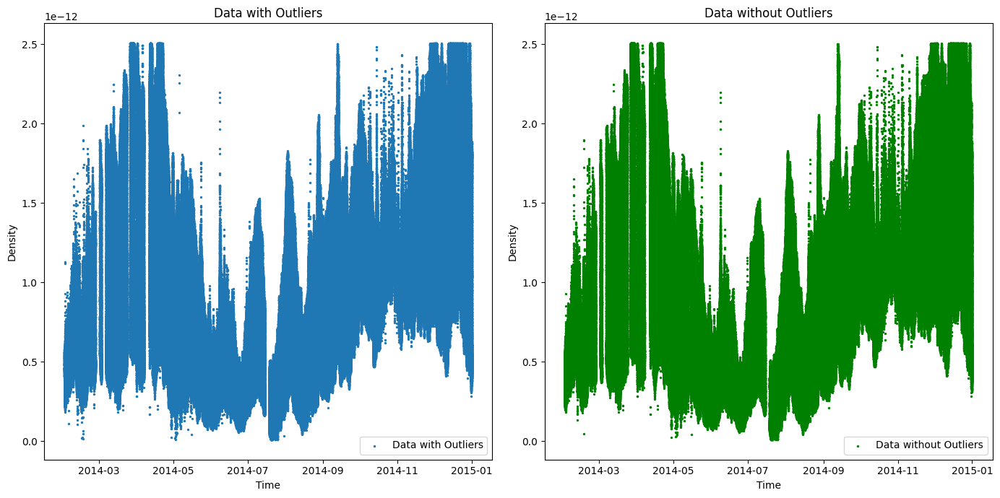

In [7]:
plt.figure(figsize=(14, 7))

# Subplot for the data with outliers
plt.subplot(1, 2, 1)
plt.scatter(filtered_merged_df['time'], filtered_merged_df['density'], s=2, label='Data with Outliers')
plt.xlabel('Time')
plt.ylabel('Density')
plt.title('Data with Outliers')
plt.legend()

# Subplot for the cleaned data
plt.subplot(1, 2, 2)
plt.scatter(cleaned_df['time'], cleaned_df['density'], s=2, label='Data without Outliers', color='green')
plt.xlabel('Time')
plt.ylabel('Density')
plt.title('Data without Outliers')
plt.legend()

# Save the figure
plt.tight_layout()
plt.savefig('data_comparison.png')

plt.show()


/opt/conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


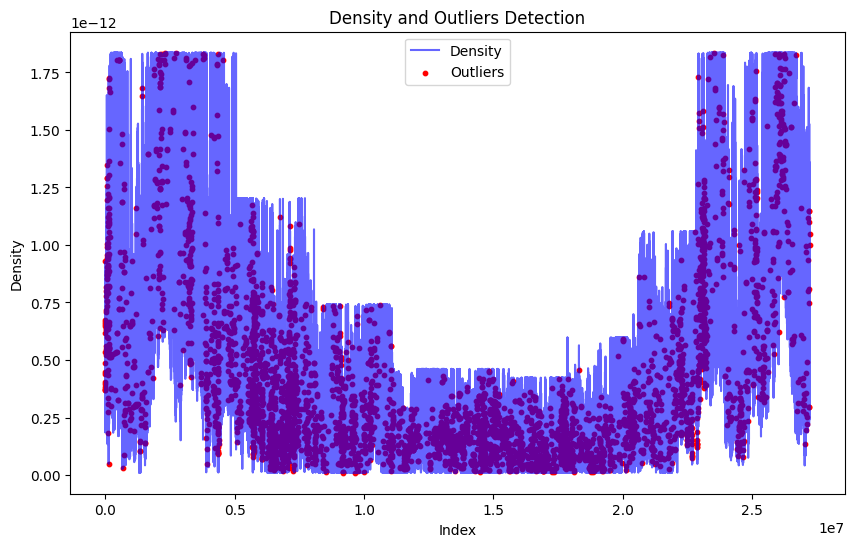

In [5]:
import os
import pandas as pd
import cdflib
import pickle
import matplotlib.pyplot as plt

# Custom outlier removal function
def remove_outliers(df, low_threshold=1e-14, high_threshold=1e6, window_size=50, threshold=3):
    # Step 1: Apply low and high density thresholds
    df = df[(df['density'] > low_threshold) & (df['density'] < high_threshold)]
    
    # Step 2: Initial outlier check using z-scores
    z_scores = (df['density'] - df['density'].mean()) / df['density'].std()
    df = df[abs(z_scores) <= threshold]
    
    # Step 3: Secondary outlier check using rolling median and std
    df['rolling_median'] = df['density'].rolling(window=window_size, min_periods=20, center=True).median()
    df['rolling_std'] = df['density'].rolling(window=window_size, min_periods=20, center=True).std()
    
    # Mark the outliers
    df['outlier'] = (abs(df['density'] - df['rolling_median']) / df['rolling_std']) > threshold
    
    return df

# Load your pickle file
def load_pickle_file(cleaned_pickle_file_path):
    with open(cleaned_pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

# Path to the cleaned pickle file
cleaned_pickle_file_path = '/mnt/sofs01/mirroreddata/SWARM-DISS/DNS/ACC/cleaned_merged_dfs.pkl'

# Load the data
loaded_data = load_pickle_file(cleaned_pickle_file_path)

# Concatenate all DataFrames into one DataFrame
combined_df_10yrs = pd.concat(loaded_data.values(), ignore_index=True)

# Apply outlier removal function
processed_df = remove_outliers(combined_df_10yrs)

# Plot the data and highlight outliers
plt.figure(figsize=(10, 6))
plt.plot(processed_df.index, processed_df['density'], label='Density', color='blue', alpha=0.6)

# Plot outliers in red
outliers = processed_df[processed_df['outlier'] == True]
plt.scatter(outliers.index, outliers['density'], color='red', label='Outliers', s=10)

# Adding labels and legend
plt.title('Density and Outliers Detection')
plt.xlabel('Index')
plt.ylabel('Density')
plt.legend()
plt.show()


/tmp/ipykernel_110/1686853024.py:19: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()  # Adjust layout to prevent label cut-off


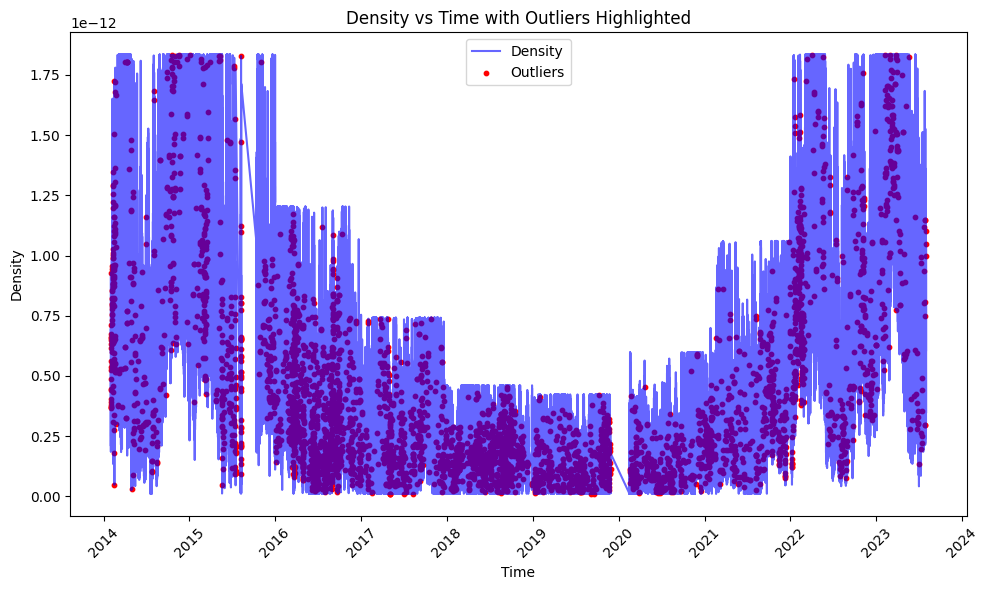

In [6]:
# Convert time column to datetime if it's not already
if not pd.api.types.is_datetime64_any_dtype(processed_df['time']):
    processed_df['time'] = pd.to_datetime(processed_df['time'])

# Plot the data and highlight outliers
plt.figure(figsize=(10, 6))
plt.plot(processed_df['time'], processed_df['density'], label='Density', color='blue', alpha=0.6)

# Plot outliers in red
outliers = processed_df[processed_df['outlier'] == True]
plt.scatter(outliers['time'], outliers['density'], color='red', label='Outliers', s=10)

# Adding labels and legend
plt.title('Density vs Time with Outliers Highlighted')
plt.xlabel('Time')
plt.ylabel('Density')
plt.legend()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent label cut-off
plt.show()

In [8]:
import pandas as pd

# Define the path to the pickle file
pickle_file_path = '/mnt/sofs01/workcache/SO-MirroredData/SWARM-DISS/DNS/ACC/daily_out_removed/SW_OPER_DNSCACC_2__20140201T000000_20140201T235950_0201.pkl'

# Read the pickle file
df = pd.read_pickle(pickle_file_path)

# Display the first few rows of the DataFrame
print(df)

# Display information about the DataFrame


              time       density       altitude   latitude  longitude  \
0     6.355843e+13  5.184454e-13  494739.849495  -6.712439 -54.571835   
1     6.355843e+13  5.173494e-13  494892.962741  -7.350848 -54.586020   
2     6.355843e+13  5.178510e-13  495050.712763  -7.989212 -54.600126   
3     6.355843e+13  5.099569e-13  495213.057146  -8.627530 -54.614148   
4     6.355843e+13  5.106715e-13  495379.955465  -9.265799 -54.628078   
...            ...           ...            ...        ...        ...   
8635  6.355852e+13  4.885602e-13  524038.760554 -85.329056 -24.516611   
8636  6.355852e+13  4.819704e-13  524110.934032 -85.852045 -20.006840   
8637  6.355852e+13  4.785112e-13  524177.630182 -86.341594 -14.236125   
8638  6.355852e+13  4.822021e-13  524238.832750 -86.782416  -6.778956   
8639  6.355852e+13  4.767876e-13  524294.528001 -87.151808   2.826676   

      local_solar_time  
0            20.136653  
1            20.138484  
2            20.140321  
3            20.142164 

readESASwarm.readDNS read  2015-01-01 00:00:00
2015-01-01 density normalisation complete
readESASwarm.readDNS read  2015-01-01 00:00:00
readESASwarm.readDNS read  2015-01-02 00:00:00
2015-01-02 density normalisation complete
readESASwarm.readDNS read  2015-01-02 00:00:00
readESASwarm.readDNS read  2015-01-03 00:00:00
2015-01-03 density normalisation complete
readESASwarm.readDNS read  2015-01-03 00:00:00
readESASwarm.readDNS read  2015-01-04 00:00:00
2015-01-04 density normalisation complete
readESASwarm.readDNS read  2015-01-04 00:00:00
readESASwarm.readDNS read  2015-01-05 00:00:00
2015-01-05 density normalisation complete
readESASwarm.readDNS read  2015-01-05 00:00:00
readESASwarm.readDNS read  2015-01-06 00:00:00
2015-01-06 density normalisation complete
readESASwarm.readDNS read  2015-01-06 00:00:00
readESASwarm.readDNS read  2015-01-07 00:00:00
2015-01-07 density normalisation complete
readESASwarm.readDNS read  2015-01-07 00:00:00
readESASwarm.readDNS read  2015-01-08 00:00:00
2

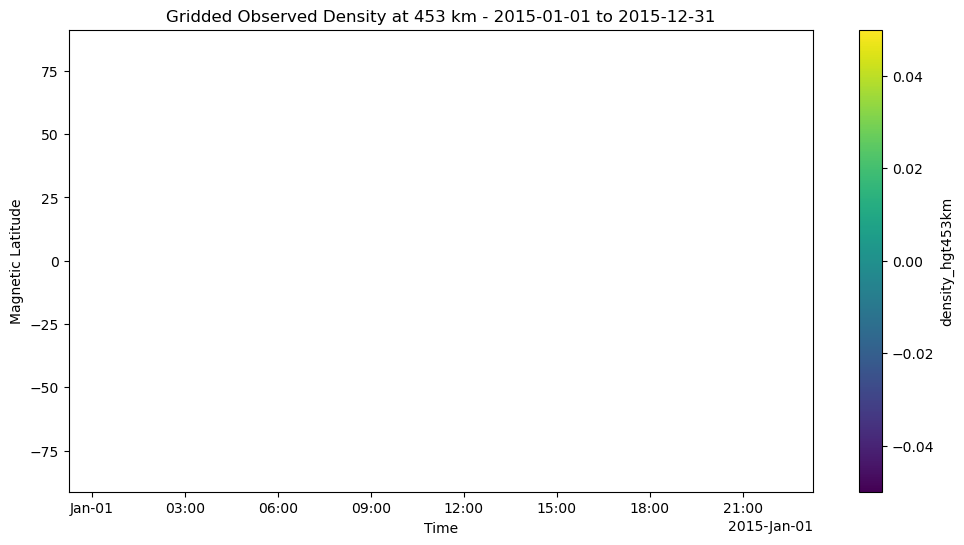

In [1]:
import sys
import datetime
import xarray as xr
import cdflib.xarray
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from scipy.stats import zscore

sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
import readESASwarm
sys.path.append('/home/jose_ne/Documents/swe_data_processing_routines')
import processESASwarm

def remove_outliers(data, zscore_threshold=3, rolling_window=10, rolling_threshold=3):
    # Remove outliers using z-score
    z_scores = zscore(data)
    abs_z_scores = np.abs(z_scores)
    filtered_entries = abs_z_scores < zscore_threshold
    data = data[filtered_entries]

    # Remove outliers using rolling median and std
    data_series = pd.Series(data)
    rolling_median = data_series.rolling(window=rolling_window, center=True).median()
    rolling_std = data_series.rolling(window=rolling_window, center=True).std()
    diff = np.abs(data_series - rolling_median)
    outliers = diff > (rolling_threshold * rolling_std)
    data = data_series[~outliers].values

    return data

tstart = datetime.datetime(2015, 1, 1, 0, 0, 0)
tend = datetime.datetime(2015, 12, 31, 23, 59, 59)
sat = 'SAT_C'
instr = 'ACC'
hgt = 453
mag_model = 'qd'

dlat = 2.5
dslt = 2  # hours
fs = int(24 * 60 / 90)  # 90 minutes sampling

ut_out = [np.datetime64(tstart + datetime.timedelta(minutes=int(dt * 24 * 60 / fs)), 'ns') for dt in range(fs)]
slt = list(range(0, 24, dslt))
mlat = [x / 10 for x in range(-900, 901, int(dlat * 10))]

da_obs_sum = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                          coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                  'solar_local_time': ('solar_local_time', slt)})
da_model_sum = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                            coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                    'solar_local_time': ('solar_local_time', slt)})
da_weight = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                         coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                 'solar_local_time': ('solar_local_time', slt)})

for dx in range((tend - tstart).days + 1):
    day = tstart + datetime.timedelta(days=dx)
    processESASwarm.calculateNormalisedDNS(day, sat, instr, hgt)
    xr_dns = readESASwarm.readDNS(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, download_missing_data=False)
    xr_mcoord = readESASwarm.readDNS_magCoord(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, mag_model=mag_model)
    xr_norm = readESASwarm.readDNS_normalized(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, norm_alt=hgt)

    if len(list(xr_norm.keys())) > 0:
        # Remove outliers using the combined function
        d_obs = remove_outliers(xr_norm['density_hgt' + str(hgt) + 'km'].values)
        d_model = xr_norm['msis_density_hgt' + str(hgt) + 'km'].values

        mlat = xr_mcoord[mag_model + '_latitude'].values
        slt = xr_dns.local_solar_time.values
        t = xr_norm.time.values

        for x in range(len(d_obs)):
            grid_mlat = np.round(mlat[x] / dlat) * dlat
            grid_slt = int(np.floor(slt[x] / dslt) * dslt)
            dt = np.floor((t[x] - ut_out[0]).astype('timedelta64[ns]') / np.timedelta64(1, 'ns') * 10 ** -9 / (24 * 60 * 60) * fs) / fs  # [days]
            grid_t = ut_out[0] + np.timedelta64(int(dt * 24 * 60), 'm').astype('timedelta64[ns]')
            da_obs_sum.loc[grid_t, grid_mlat, grid_slt] += d_obs[x]
            da_model_sum.loc[grid_t, grid_mlat, grid_slt] += d_model[x]
            da_weight.loc[grid_t, grid_mlat, grid_slt] += 1

        da_obs_mean_density = (da_obs_sum / da_weight).assign_attrs(xr_norm['density_hgt' + str(hgt) + 'km'].attrs)
        da_model_mean_density = (da_model_sum / da_weight).assign_attrs(xr_norm['msis_density_hgt' + str(hgt) + 'km'].attrs)
        ds_out = xr.Dataset({})
        ds_out['density_hgt' + str(hgt) + 'km'] = da_obs_mean_density
        ds_out['msis_density_hgt' + str(hgt) + 'km'] = da_model_mean_density
        ds_out[mag_model + '_latitude'].attrs = xr_mcoord[mag_model + '_latitude'].attrs
        ds_out['solar_local_time'].attrs = xr_dns.local_solar_time.attrs

        # Commented out writing the files to the folder
        ds_out.to_netcdf(fn_out)

# Plotting the gridded observational data
plt.figure(figsize=(12, 6))
ds_out['density_hgt' + str(hgt) + 'km'].mean(dim='solar_local_time').plot(
    x='time', 
    y=mag_model + '_latitude', 
    cmap='viridis', 
    robust=True
)
plt.title(f'Gridded Observed Density at {hgt} km - {tstart.strftime("%Y-%m-%d")} to {tend.strftime("%Y-%m-%d")}')
plt.xlabel('Time')
plt.ylabel('Magnetic Latitude')
plt.show()


In [56]:
import xarray as xr

# Define the path to your NetCDF file
filename = 'data/SAT_C/CorrectedGridData/SAT_C_ACC_GridData_2017-12-31_qd_Altitude.nc'

# Open the NetCDF file as an xarray Dataset
ds = xr.open_dataset(filename)

# Display information about the dataset (optional)
print(ds)



<xarray.Dataset> Size: 3MB
Dimensions:           (time: 16, qd_latitude: 73, solar_local_time: 12,
                       altitude: 13)
Coordinates:
  * time              (time) datetime64[ns] 128B 2017-12-31 ... 2017-12-31T22...
  * qd_latitude       (qd_latitude) float64 584B -90.0 -87.5 -85.0 ... 87.5 90.0
  * solar_local_time  (solar_local_time) int64 96B 0 2 4 6 8 ... 14 16 18 20 22
  * altitude          (altitude) int64 104B 420 430 440 450 ... 510 520 530 540
Data variables:
    density           (time, qd_latitude, solar_local_time, altitude) float64 1MB ...
    msis_density      (time, qd_latitude, solar_local_time, altitude) float64 1MB ...


In [6]:
import sys
import datetime
import xarray as xr
import cdflib.xarray
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from scipy.stats import zscore

sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
import readESASwarm
sys.path.append('/home/jose_ne/Documents/swe_data_processing_routines')
import processESASwarm

def remove_outliers(data, zscore_threshold=3, rolling_window=10, rolling_threshold=3):
    # Remove outliers using z-score
    z_scores = zscore(data)
    abs_z_scores = np.abs(z_scores)
    filtered_entries = abs_z_scores < zscore_threshold
    data = data[filtered_entries]

    # Remove outliers using rolling median and std
    data_series = pd.Series(data)
    rolling_median = data_series.rolling(window=rolling_window, center=True).median()
    rolling_std = data_series.rolling(window=rolling_window, center=True).std()
    diff = np.abs(data_series - rolling_median)
    outliers = diff > (rolling_threshold * rolling_std)
    data = data_series[~outliers].values

    return data

tstart = datetime.datetime(2018, 1, 1, 0, 0, 0)
tend = datetime.datetime(2018, 12, 31, 23, 59, 59)
sat = 'SAT_C'
instr = 'ACC'
hgt = 453
mag_model = 'qd'

dlat = 2.5
dslt = 2  # hours
fs = int(24 * 60 / 90)  # 90 minutes sampling
df_norm_save_path = 'df_norm1.pkl'

ut_out = [np.datetime64(tstart + datetime.timedelta(minutes=int(dt * 24 * 60 / fs)), 'ns') for dt in range(fs)]
slt = list(range(0, 24, dslt))
mlat = [x / 10 for x in range(-900, 901, int(dlat * 10))]

da_obs_sum = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                          coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                  'solar_local_time': ('solar_local_time', slt)})
da_model_sum = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                            coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                    'solar_local_time': ('solar_local_time', slt)})
da_weight = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                         coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                 'solar_local_time': ('solar_local_time', slt)})

for dx in range((tend - tstart).days + 1):
    day = tstart + datetime.timedelta(days=dx)
    processESASwarm.calculateNormalisedDNS(day, sat, instr, hgt)
    xr_dns = readESASwarm.readDNS(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, download_missing_data=False)
    xr_mcoord = readESASwarm.readDNS_magCoord(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, mag_model=mag_model)
    xr_norm = readESASwarm.readDNS_normalized(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, norm_alt=hgt)
    df_norm = xr_norm.to_dataframe()
    df_dns = xr_dns.to_dataframe()
    print(df_dns)
    print(df_norm)
    




readESASwarm.readDNS read  2018-01-01 00:00:00


/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-01 density normalisation complete
readESASwarm.readDNS read  2018-01-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-01 00:00:00  2.791008e-13  448178.105941  67.373435  172.919747   
2018-01-01 00:00:10  2.886620e-13  448073.126743  66.736871  173.071819   
2018-01-01 00:00:20  2.784228e-13  447966.039700  66.100023  173.214137   
2018-01-01 00:00:30  2.927500e-13  447856.916213  65.462905  173.347458   
2018-01-01 00:00:40  2.802017e-13  447745.824100  64.825532  173.472464   
...                           ...            ...        ...         ...   
2018-01-01 23:59:10  3.111440e-13  467452.632961 -79.274655 -167.826997   
2018-01-01 23:59:20  2.972942e-13  467539.483709 -79.890547 -166.972903   
2018-01-01 23:59:30  2.858575e-13  467620.982606 -80.503674 -166.004181   
2018-01-01 23:59:40  2.849925e-13  467697.095598 -81.113476 -164.897788   
2018-01-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-02 density normalisation complete
readESASwarm.readDNS read  2018-01-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-02 00:00:00  2.627939e-13  467833.024717 -82.319976 -162.145799   
2018-01-02 00:00:10  2.728315e-13  467892.794177 -82.914461 -160.412467   
2018-01-02 00:00:20  2.730120e-13  467947.060822 -83.500972 -158.358284   
2018-01-02 00:00:30  2.601927e-13  467995.801038 -84.077148 -155.894411   
2018-01-02 00:00:40  2.661336e-13  468038.992908 -84.639667 -152.899971   
...                           ...            ...        ...         ...   
2018-01-02 23:59:10  1.052403e-13  444642.547471  49.699696   -0.124421   
2018-01-02 23:59:20  9.884175e-14  444777.824440  50.341021   -0.094663   
2018-01-02 23:59:30  1.103632e-13  444913.124914  50.982220   -0.062955   
2018-01-02 23:59:40  9.788596e-14  445048.358320  51.623293   -0.029197   
2018-01-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-03 density normalisation complete
readESASwarm.readDNS read  2018-01-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-03 00:00:00  1.196779e-13  445318.225702  52.905047    0.044901   
2018-01-03 00:00:10  1.226523e-13  445452.705018  53.545726    0.085478   
2018-01-03 00:00:20  1.122946e-13  445586.752067  54.186267    0.128577   
2018-01-03 00:00:30  1.275265e-13  445720.275302  54.826670    0.174337   
2018-01-03 00:00:40  1.199325e-13  445853.184647  55.466931    0.222910   
...                           ...            ...        ...         ...   
2018-01-03 23:59:10  2.500976e-13  446294.996447 -20.114697  176.381266   
2018-01-03 23:59:20  2.446981e-13  446522.767100 -20.758874  176.373204   
2018-01-03 23:59:30  2.299291e-13  446753.528776 -21.402964  176.365426   
2018-01-03 23:59:40  2.331378e-13  446987.200905 -22.046965  176.357945   
2018-01-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-04 density normalisation complete
readESASwarm.readDNS read  2018-01-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-04 00:00:00  2.292690e-13  447462.995537 -23.334694  176.343925   
2018-01-04 00:00:10  2.303609e-13  447704.896928 -23.978419  176.337413   
2018-01-04 00:00:20  2.393630e-13  447949.367648 -24.622048  176.331249   
2018-01-04 00:00:30  2.366314e-13  448196.320388 -25.265580  176.325450   
2018-01-04 00:00:40  2.286879e-13  448445.663264 -25.909013  176.320030   
...                           ...            ...        ...         ...   
2018-01-04 23:59:10  6.855815e-14  443165.492833 -10.138472   -6.405920   
2018-01-04 23:59:20  5.541789e-14  442997.373657  -9.493132   -6.417153   
2018-01-04 23:59:30  7.874017e-14  442833.391050  -8.847740   -6.428498   
2018-01-04 23:59:40  8.077545e-14  442673.587988  -8.202297   -6.439948   
2018-01-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-05 density normalisation complete
readESASwarm.readDNS read  2018-01-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-05 00:00:00  6.256638e-14  442366.816843  -6.911269   -6.463129   
2018-01-05 00:00:10  7.560881e-14  442219.806612  -6.265688   -6.474844   
2018-01-05 00:00:20  6.498252e-14  442077.135384  -5.620066   -6.486632   
2018-01-05 00:00:30  7.264265e-14  441938.839375  -4.974405   -6.498484   
2018-01-05 00:00:40  6.565403e-14  441804.948452  -4.328707   -6.510394   
...                           ...            ...        ...         ...   
2018-01-05 23:59:10  1.740058e-13  442544.275175  39.749632  170.521319   
2018-01-05 23:59:20  1.632738e-13  442422.853902  39.106476  170.529145   
2018-01-05 23:59:30  1.712535e-13  442303.106578  38.463222  170.536079   
2018-01-05 23:59:40  1.805891e-13  442185.123397  37.819872  170.542156   
2018-01-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-06 density normalisation complete
readESASwarm.readDNS read  2018-01-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-06 00:00:00  1.833033e-13  441954.905679  36.532888  170.551876   
2018-01-06 00:00:10  2.004679e-13  441842.757142  35.889257  170.555582   
2018-01-06 00:00:20  2.123815e-13  441732.728360  35.245535  170.558559   
2018-01-06 00:00:30  2.124694e-13  441624.908255  34.601723  170.560835   
2018-01-06 00:00:40  2.096233e-13  441519.381081  33.957824  170.562438   
...                           ...            ...        ...         ...   
2018-01-06 23:59:10  6.147586e-14  465437.927245 -69.536857  -15.721050   
2018-01-06 23:59:20  5.382387e-14  465269.136058 -68.904557  -15.529855   
2018-01-06 23:59:30  4.088237e-14  465095.922424 -68.271889  -15.351602   
2018-01-06 23:59:40  5.538130e-14  464918.358626 -67.638876  -15.185196   
2018-01-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-07 density normalisation complete
readESASwarm.readDNS read  2018-01-07 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-01-07 00:00:00  4.784481e-14  464550.412129 -66.371898 -14.884130   
2018-01-07 00:00:10  3.459467e-14  464360.246698 -65.737969 -14.747819   
2018-01-07 00:00:20  5.433424e-14  464166.036554 -65.103766 -14.620025   
2018-01-07 00:00:30  5.059229e-14  463967.862098 -64.469302 -14.500116   
2018-01-07 00:00:40  3.518710e-14  463765.805611 -63.834590 -14.387519   
...                           ...            ...        ...        ...   
2018-01-07 23:59:10  1.384212e-13  449680.624313  80.353213   5.726452   
2018-01-07 23:59:20  1.484095e-13  449725.490734  80.967070   6.803430   
2018-01-07 23:59:30  1.432230e-13  449767.130113  81.577027   8.041499   
2018-01-07 23:59:40  1.544480e-13  449805.517153  82.182179   9.476949   
2018-01-07 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-08 density normalisation complete
readESASwarm.readDNS read  2018-01-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-08 00:00:00  1.570336e-13  449872.459481  83.372849   13.145156   
2018-01-08 00:00:10  1.511300e-13  449900.952430  83.954512   15.525235   
2018-01-08 00:00:20  1.532036e-13  449926.106739  84.523184   18.412263   
2018-01-08 00:00:30  1.484155e-13  449947.905849  85.074370   21.963646   
2018-01-08 00:00:40  1.628607e-13  449966.336665  85.601499   26.395031   
...                           ...            ...        ...         ...   
2018-01-08 23:59:10  2.385893e-13  458958.344700 -51.109200  171.934554   
2018-01-08 23:59:20  2.643233e-13  459220.436628 -51.747594  171.968449   
2018-01-08 23:59:30  2.805131e-13  459480.577105 -52.385837  172.004503   
2018-01-08 23:59:40  2.966032e-13  459738.658680 -53.023925  172.042828   
2018-01-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-09 density normalisation complete
readESASwarm.readDNS read  2018-01-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-09 00:00:00  3.315785e-13  460248.229959 -54.299631  172.126790   
2018-01-09 00:00:10  3.413157e-13  460499.520303 -54.937244  172.172696   
2018-01-09 00:00:20  3.487718e-13  460748.341632 -55.574694  172.221414   
2018-01-09 00:00:30  3.432328e-13  460994.594024 -56.211978  172.273105   
2018-01-09 00:00:40  3.486181e-13  461238.177466 -56.849093  172.327943   
...                           ...            ...        ...         ...   
2018-01-09 23:59:10  1.151082e-13  440184.877697  21.088930  -11.669356   
2018-01-09 23:59:20  1.110871e-13  440227.276877  21.734216  -11.676901   
2018-01-09 23:59:30  1.273113e-13  440273.405637  22.379448  -11.684139   
2018-01-09 23:59:40  1.079995e-13  440323.205503  23.024624  -11.691058   
2018-01-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-10 density normalisation complete
readESASwarm.readDNS read  2018-01-10 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-10 00:00:00  1.312100e-13  440433.399563  24.314801  -11.703882   
2018-01-10 00:00:10  1.174402e-13  440493.832715  24.959798  -11.709760   
2018-01-10 00:00:20  1.088718e-13  440557.680005  25.604732  -11.715262   
2018-01-10 00:00:30  1.265907e-13  440624.873856  26.249602  -11.720374   
2018-01-10 00:00:40  1.090311e-13  440695.343603  26.894404  -11.725079   
...                           ...            ...        ...         ...   
2018-01-10 23:59:10  1.985911e-13  439775.975449   8.528929  165.567547   
2018-01-10 23:59:20  2.025349e-13  439819.981494   7.882915  165.556070   
2018-01-10 23:59:30  2.073771e-13  439868.588148   7.236892  165.544499   
2018-01-10 23:59:40  1.969429e-13  439921.807671   6.590862  165.532842   
2018-01-10 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-11 density normalisation complete
readESASwarm.readDNS read  2018-01-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-11 00:00:00  1.847578e-13  440042.150363   5.298793  165.509300   
2018-01-11 00:00:10  2.129682e-13  440109.271197   4.652758  165.497431   
2018-01-11 00:00:20  1.997410e-13  440181.036993   4.006726  165.485506   
2018-01-11 00:00:30  1.906239e-13  440257.450440   3.360699  165.473534   
2018-01-11 00:00:40  2.005004e-13  440338.511767   2.714680  165.461521   
...                           ...            ...        ...         ...   
2018-01-11 23:59:10           NaN  453884.410516 -38.644395  -17.495913   
2018-01-11 23:59:20  9.876722e-15  453607.775402 -38.003237  -17.489759   
2018-01-11 23:59:30           NaN  453331.498845 -37.361955  -17.484430   
2018-01-11 23:59:40  7.031042e-16  453055.690383 -36.720549  -17.479893   
2018-01-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-12 density normalisation complete
readESASwarm.readDNS read  2018-01-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-12 00:00:00           NaN  452505.951840 -35.437372  -17.473069   
2018-01-12 00:00:10  4.646215e-15  452232.198629 -34.795602  -17.470725   
2018-01-12 00:00:20  8.279837e-15  451959.345220 -34.153713  -17.469056   
2018-01-12 00:00:30  2.330837e-14  451687.497276 -33.511707  -17.468037   
2018-01-12 00:00:40  1.880546e-14  451416.760850 -32.869584  -17.467642   
...                           ...            ...        ...         ...   
2018-01-12 23:59:10  1.620586e-13  447939.859118  68.070250  156.698907   
2018-01-12 23:59:20  1.685404e-13  447833.804030  67.433961  156.862710   
2018-01-12 23:59:30  1.693512e-13  447725.601292  66.797365  157.015823   
2018-01-12 23:59:40  1.677536e-13  447615.320791  66.160482  157.159101   
2018-01-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-13 density normalisation complete
readESASwarm.readDNS read  2018-01-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-13 00:00:00  1.754453e-13  447388.658241  64.885912  157.419138   
2018-01-13 00:00:10  1.677969e-13  447272.560279  64.248257  157.537207   
2018-01-13 00:00:20  1.687738e-13  447154.668248  63.610370  157.648078   
2018-01-13 00:00:30  1.812029e-13  447035.056396  62.972263  157.752261   
2018-01-13 00:00:40  1.872021e-13  446913.799769  62.333944  157.850218   
...                           ...            ...        ...         ...   
2018-01-13 23:59:10  1.654625e-13  467800.319629 -81.752808 -179.580945   
2018-01-13 23:59:20  1.584830e-13  467869.910254 -82.353230 -178.089579   
2018-01-13 23:59:30  1.570983e-13  467934.008982 -82.947305 -176.340202   
2018-01-13 23:59:40  1.551116e-13  467992.588586 -83.533292 -174.265696   
2018-01-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-14 density normalisation complete
readESASwarm.readDNS read  2018-01-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-14 00:00:00  1.620042e-13  468093.049556 -84.670399 -168.747273   
2018-01-14 00:00:10  1.521325e-13  468134.937239 -85.213250 -165.011854   
2018-01-14 00:00:20  1.340083e-13  468171.223113 -85.730187 -160.339546   
2018-01-14 00:00:30  1.249795e-13  468201.892785 -86.210599 -154.425199   
2018-01-14 00:00:40  1.161220e-13  468226.934772 -86.638795 -146.895148   
...                           ...            ...        ...         ...   
2018-01-14 23:59:10  1.229174e-13  445180.132452  52.371485  -16.015069   
2018-01-14 23:59:20  1.227505e-13  445310.905721  53.012276  -15.976455   
2018-01-14 23:59:30  1.330402e-13  445441.310979  53.652934  -15.935427   
2018-01-14 23:59:40  1.313900e-13  445571.258133  54.293456  -15.891852   
2018-01-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-15 density normalisation complete
readESASwarm.readDNS read  2018-01-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-15 00:00:00  1.494414e-13  445829.699630  55.574079  -15.796489   
2018-01-15 00:00:10  1.363076e-13  445957.738440  56.214175  -15.744385   
2018-01-15 00:00:20  1.291133e-13  446084.965556  56.854122  -15.689102   
2018-01-15 00:00:30  1.289634e-13  446211.293104  57.493917  -15.630452   
2018-01-15 00:00:40           NaN  446336.637257  58.133556  -15.568230   
...                           ...            ...        ...         ...   
2018-01-15 23:59:10  2.665380e-13  446931.312337 -22.890238  160.324706   
2018-01-15 23:59:20  2.678614e-13  447175.067729 -23.534092  160.317963   
2018-01-15 23:59:30  2.688575e-13  447421.495675 -24.177852  160.311560   
2018-01-15 23:59:40  2.697227e-13  447670.507134 -24.821515  160.305512   
2018-01-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-16 density normalisation complete
readESASwarm.readDNS read  2018-01-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-16 00:00:00  2.667733e-13  448175.857618 -26.108544  160.294537   
2018-01-16 00:00:10  2.719194e-13  448432.079408 -26.751907  160.289640   
2018-01-16 00:00:20  2.662218e-13  448690.519438 -27.395166  160.285158   
2018-01-16 00:00:30  2.597185e-13  448951.081146 -28.038321  160.281108   
2018-01-16 00:00:40  2.702450e-13  449213.671331 -28.681370  160.277506   
...                           ...            ...        ...         ...   
2018-01-16 23:59:10           NaN  442746.098686  -7.280254  -22.475501   
2018-01-16 23:59:20           NaN  442594.780737  -6.634758  -22.487173   
2018-01-16 23:59:30           NaN  442447.740273  -5.989220  -22.498922   
2018-01-16 23:59:40           NaN  442305.011932  -5.343640  -22.510740   
2018-01-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-17 density normalisation complete
readESASwarm.readDNS read  2018-01-17 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-17 00:00:00           NaN  442032.726855  -4.052367  -22.534553   
2018-01-17 00:00:10           NaN  441903.129575  -3.406678  -22.546533   
2018-01-17 00:00:20           NaN  441777.965536  -2.760958  -22.558550   
2018-01-17 00:00:30           NaN  441657.257926  -2.115207  -22.570599   
2018-01-17 00:00:40           NaN  441541.028164  -1.469430  -22.582672   
...                           ...            ...        ...         ...   
2018-01-17 23:59:10  1.724789e-13  441545.655111  36.812715  154.536289   
2018-01-17 23:59:20  1.829752e-13  441432.560179  36.169039  154.540340   
2018-01-17 23:59:30  1.738240e-13  441321.594028  35.525272  154.543648   
2018-01-17 23:59:40  1.752227e-13  441212.842424  34.881415  154.546242   
2018-01-17 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-18 density normalisation complete
readESASwarm.readDNS read  2018-01-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-18 00:00:00  1.718119e-13  441002.304481  33.593434  154.549401   
2018-01-18 00:00:10  1.692797e-13  440900.718921  32.949316  154.550017   
2018-01-18 00:00:20  1.795447e-13  440801.689880  32.305113  154.550023   
2018-01-18 00:00:30  1.696155e-13  440705.300038  31.660827  154.549443   
2018-01-18 00:00:40  1.795723e-13  440611.631443  31.016461  154.548299   
...                           ...            ...        ...         ...   
2018-01-18 23:59:10           NaN  464924.148756 -66.565806  -30.935670   
2018-01-18 23:59:20           NaN  464737.772282 -65.932026  -30.796634   
2018-01-18 23:59:30           NaN  464547.273719 -65.297968  -30.666322   
2018-01-18 23:59:40           NaN  464352.732537 -64.663647  -30.544079   
2018-01-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-19 density normalisation complete
readESASwarm.readDNS read  2018-01-19 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-01-19 00:00:00  1.141710e-14  463951.685574 -63.394260 -30.321500   
2018-01-19 00:00:10           NaN  463745.507124 -62.759215 -30.220142   
2018-01-19 00:00:20  1.269756e-14  463535.619642 -62.123948 -30.124803   
2018-01-19 00:00:30  1.977311e-14  463322.108614 -61.488467 -30.035079   
2018-01-19 00:00:40  1.563443e-14  463105.062514 -60.852778 -29.950604   
...                           ...            ...        ...        ...   
2018-01-19 23:59:10  1.519315e-13  449555.713354  83.262877  -3.246383   
2018-01-19 23:59:20  1.594367e-13  449581.374114  83.846588  -0.946072   
2018-01-19 23:59:30  1.566282e-13  449603.731731  84.417968   1.837147   
2018-01-19 23:59:40  1.425349e-13  449622.767663  84.972818   5.251666   
2018-01-19 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-20 density normalisation complete
readESASwarm.readDNS read  2018-01-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-20 00:00:00  1.557702e-13  449650.949533  86.005516   14.860047   
2018-01-20 00:00:10  1.579654e-13  449659.947571  86.460836   21.681188   
2018-01-20 00:00:20  1.629406e-13  449665.581034  86.851329   30.355931   
2018-01-20 00:00:30  1.744698e-13  449667.844786  87.150222   41.159753   
2018-01-20 00:00:40  1.729650e-13  449666.734437  87.326618   53.920059   
...                           ...            ...        ...         ...   
2018-01-20 23:59:10  2.590148e-13  460201.305384 -54.277340  156.129588   
2018-01-20 23:59:20  2.510239e-13  460457.290414 -54.914961  156.175435   
2018-01-20 23:59:30  2.503894e-13  460710.800227 -55.552418  156.224091   
2018-01-20 23:59:40  2.524232e-13  460961.732725 -56.189708  156.275715   
2018-01-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-21 density normalisation complete
readESASwarm.readDNS read  2018-01-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-21 00:00:00  2.509366e-13  461455.526283 -57.463776  156.388574   
2018-01-21 00:00:10  2.581816e-13  461698.125400 -58.100546  156.450196   
2018-01-21 00:00:20  2.767031e-13  461937.748513 -58.737136  156.515563   
2018-01-21 00:00:30  2.797540e-13  462174.300138 -59.373541  156.584909   
2018-01-21 00:00:40  2.686183e-13  462407.683857 -60.009757  156.658489   
...                           ...            ...        ...         ...   
2018-01-21 23:59:10  1.283221e-13  440534.340901  24.360611  -27.696826   
2018-01-21 23:59:20  1.298971e-13  440590.678954  25.005580  -27.702662   
2018-01-21 23:59:30  1.306943e-13  440650.409984  25.650487  -27.708121   
2018-01-21 23:59:40  1.337672e-13  440713.466559  26.295330  -27.713187   
2018-01-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-22 density normalisation complete
readESASwarm.readDNS read  2018-01-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-22 00:00:00  1.192892e-13  440849.305716  27.584815  -27.722080   
2018-01-22 00:00:10  1.264689e-13  440921.916280  28.229455  -27.725874   
2018-01-22 00:00:20  1.234615e-13  440997.563704  28.874023  -27.729208   
2018-01-22 00:00:30  1.198055e-13  441076.176218  29.518519  -27.732066   
2018-01-22 00:00:40  1.126056e-13  441157.674159  30.162940  -27.734428   
...                           ...            ...        ...         ...   
2018-01-22 23:59:10  1.963898e-13  439735.166354   5.151461  149.519298   
2018-01-22 23:59:20  2.072972e-13  439806.411675   4.505368  149.507446   
2018-01-22 23:59:30  2.075705e-13  439882.327773   3.859279  149.495539   
2018-01-22 23:59:40  2.172519e-13  439962.918284   3.213197  149.483587   
2018-01-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-23 density normalisation complete
readESASwarm.readDNS read  2018-01-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-23 00:00:00  2.127139e-13  440138.133853   1.921060  149.459577   
2018-01-23 00:00:10  2.188983e-13  440232.728262   1.275010  149.447533   
2018-01-23 00:00:20  2.212765e-13  440331.975592   0.628976  149.435473   
2018-01-23 00:00:30  2.271411e-13  440435.866738  -0.017040  149.423404   
2018-01-23 00:00:40  2.285291e-13  440544.386682  -0.663037  149.411335   
...                           ...            ...        ...         ...   
2018-01-23 23:59:10  2.852973e-14  452731.903274 -35.213746  -33.455640   
2018-01-23 23:59:20  4.262513e-14  452457.431496 -34.572001  -33.453510   
2018-01-23 23:59:30  5.657835e-14  452183.853614 -33.930138  -33.452046   
2018-01-23 23:59:40  4.247465e-14  451911.275451 -33.288157  -33.451224   
2018-01-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-24 density normalisation complete
readESASwarm.readDNS read  2018-01-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-24 00:00:00  4.493930e-14  451369.513494 -32.003847  -33.451405   
2018-01-24 00:00:10  3.882955e-14  451100.561328 -31.361521  -33.452361   
2018-01-24 00:00:20  4.613649e-14  450833.022148 -30.719082  -33.453866   
2018-01-24 00:00:30  3.647194e-14  450567.000339 -30.076531  -33.455898   
2018-01-24 00:00:40  5.391744e-14  450302.594883 -29.433871  -33.458438   
...                           ...            ...        ...         ...   
2018-01-24 23:59:10  1.668194e-13  446832.542602  64.578459  141.495265   
2018-01-24 23:59:20  1.682521e-13  446714.601782  63.940607  141.609937   
2018-01-24 23:59:30  1.742141e-13  446594.958255  63.302527  141.717657   
2018-01-24 23:59:40  1.817732e-13  446473.685638  62.664231  141.818910   
2018-01-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-25 density normalisation complete
readESASwarm.readDNS read  2018-01-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-25 00:00:00  1.739990e-13  446226.603625  61.387026  142.003753   
2018-01-25 00:00:10  1.897935e-13  446100.912958  60.748133  142.088112   
2018-01-25 00:00:20  1.910246e-13  445973.907611  60.109055  142.167557   
2018-01-25 00:00:30  1.884714e-13  445845.668600  59.469799  142.242398   
2018-01-25 00:00:40  1.933269e-13  445716.279291  58.830371  142.312919   
...                           ...            ...        ...         ...   
2018-01-25 23:59:10  1.269284e-13  468368.911807 -85.014172  177.567523   
2018-01-25 23:59:20  1.266880e-13  468409.402514 -85.541496 -178.136076   
2018-01-25 23:59:30  1.289084e-13  468444.243995 -86.036685 -172.720065   
2018-01-25 23:59:40  1.182651e-13  468473.422604 -86.486136 -165.833172   
2018-01-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-26 density normalisation complete
readESASwarm.readDNS read  2018-01-26 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-26 00:00:00  1.131482e-13  468514.705360 -87.161847 -146.237215   
2018-01-26 00:00:10  1.259992e-13  468526.840230 -87.331004 -133.474115   
2018-01-26 00:00:20  1.219858e-13  468533.282490 -87.353946 -119.764588   
2018-01-26 00:00:30  1.243767e-13  468534.031876 -87.227043 -106.579783   
2018-01-26 00:00:40  1.216747e-13  468529.089539 -86.969056  -95.098031   
...                           ...            ...        ...         ...   
2018-01-26 23:59:10  1.608763e-13  445700.145246  56.050817  -31.722228   
2018-01-26 23:59:20  1.609935e-13  445823.362895  56.690839  -31.667705   
2018-01-26 23:59:30  1.658655e-13  445945.719170  57.330710  -31.609861   
2018-01-26 23:59:40  1.614709e-13  446067.126769  57.970427  -31.548496   
2018-01-26 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-27 density normalisation complete
readESASwarm.readDNS read  2018-01-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-27 00:00:00  1.672452e-13  446306.785842  59.249384  -31.414316   
2018-01-27 00:00:10  1.746993e-13  446424.847140  59.888610  -31.341013   
2018-01-27 00:00:20  1.683201e-13  446541.628564  60.527662  -31.263207   
2018-01-27 00:00:30  1.728455e-13  446657.049391  61.166533  -31.180598   
2018-01-27 00:00:40  1.762519e-13  446771.030522  61.805219  -31.092858   
...                           ...            ...        ...         ...   
2018-01-27 23:59:10  1.832271e-13  448298.365685 -26.688951  144.330667   
2018-01-27 23:59:20  1.795948e-13  448560.696039 -27.332235  144.326173   
2018-01-27 23:59:30  1.836653e-13  448825.168644 -27.975415  144.322109   
2018-01-27 23:59:40  1.891053e-13  449091.683056 -28.618487  144.318493   
2018-01-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-28 density normalisation complete
readESASwarm.readDNS read  2018-01-28 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-28 00:00:00  1.801223e-13  449630.405584 -29.904307  144.312675   
2018-01-28 00:00:10  1.887289e-13  449902.462092 -30.547050  144.310510   
2018-01-28 00:00:20  1.835720e-13  450176.163989 -31.189682  144.308868   
2018-01-28 00:00:30  1.857270e-13  450451.409080 -31.832199  144.307769   
2018-01-28 00:00:40  1.943122e-13  450728.094551 -32.474602  144.307234   
...                           ...            ...        ...         ...   
2018-01-28 23:59:10  6.315165e-14  441982.906931  -3.395682  -38.502306   
2018-01-28 23:59:20  6.865160e-14  441854.150035  -2.749981  -38.514309   
2018-01-28 23:59:30  6.210023e-14  441729.835241  -2.104251  -38.526343   
2018-01-28 23:59:40  6.704242e-14  441609.983957  -1.458493  -38.538400   
2018-01-28 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-29 density normalisation complete
readESASwarm.readDNS read  2018-01-29 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-29 00:00:00  6.027141e-14  441383.837145  -0.166900  -38.562555   
2018-01-29 00:00:10  7.872099e-14  441277.496089   0.478929  -38.574637   
2018-01-29 00:00:20  5.943111e-14  441175.688018   1.124776  -38.586713   
2018-01-29 00:00:30  6.715243e-14  441078.424347   1.770640  -38.598774   
2018-01-29 00:00:40  6.770053e-14  440985.712639   2.416518  -38.610814   
...                           ...            ...        ...         ...   
2018-01-29 23:59:10  1.405291e-13  440475.863564  32.849190  138.598938   
2018-01-29 23:59:20  1.453882e-13  440379.486954  32.204899  138.598882   
2018-01-29 23:59:30  1.323814e-13  440285.790517  31.560527  138.598243   
2018-01-29 23:59:40  1.356196e-13  440194.854737  30.916074  138.597042   
2018-01-29 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-30 density normalisation complete
readESASwarm.readDNS read  2018-01-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-01-30 00:00:00  1.426342e-13  440021.592020  29.626934  138.593043   
2018-01-30 00:00:10  1.281820e-13  439939.421144  28.982250  138.590285   
2018-01-30 00:00:20  1.333681e-13  439860.325893  28.337492  138.587047   
2018-01-30 00:00:30  1.276622e-13  439784.381867  27.692661  138.583346   
2018-01-30 00:00:40  1.305332e-13  439711.662714  27.047760  138.579201   
...                           ...            ...        ...         ...   
2018-01-30 23:59:10  4.167957e-14  463958.392115 -62.578445  -46.141236   
2018-01-30 23:59:20  4.005022e-14  463746.768128 -61.943174  -46.047442   
2018-01-30 23:59:30  4.392604e-14  463531.502478 -61.307691  -45.959158   
2018-01-30 23:59:40  4.143303e-14  463312.682978 -60.672002  -45.876028   
2018-01-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-01-31 density normalisation complete
readESASwarm.readDNS read  2018-01-31 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-01-31 00:00:00  3.525552e-14  462864.653749 -59.400032 -45.723940   
2018-01-31 00:00:10  2.536488e-14  462635.726114 -58.763762 -45.654401   
2018-01-31 00:00:20  3.130806e-14  462403.617386 -58.127309 -45.588853   
2018-01-31 00:00:30  3.225639e-14  462168.423939 -57.490676 -45.527059   
2018-01-31 00:00:40  3.630031e-14  461930.243713 -56.853869 -45.468802   
...                           ...            ...        ...        ...   
2018-01-31 23:59:10  1.942021e-13  449278.607803  86.629147   9.089031   
2018-01-31 23:59:20  1.928880e-13  449281.950138  86.985381  18.621355   
2018-01-31 23:59:30  1.772395e-13  449281.961069  87.237388  30.286345   
2018-01-31 23:59:40  1.592363e-13  449278.637425  87.355207  43.615261   
2018-01-31 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-01 density normalisation complete
readESASwarm.readDNS read  2018-02-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-01 00:00:00  1.648901e-13  449261.966582  87.140427   70.070553   
2018-02-01 00:00:10  1.763890e-13  449248.646372  86.838275   80.801750   
2018-02-01 00:00:20  1.821342e-13  449232.002292  86.445467   89.410557   
2018-02-01 00:00:30  1.726225e-13  449212.042334  85.988543   96.179271   
2018-02-01 00:00:40  1.965082e-13  449188.776457  85.486931  101.498868   
...                           ...            ...        ...         ...   
2018-02-01 23:59:10  1.323268e-13  461985.054649 -58.447846  140.555031   
2018-02-01 23:59:20  1.283652e-13  462226.340538 -59.084299  140.622641   
2018-02-01 23:59:30  1.214741e-13  462464.476814 -59.720564  140.694370   
2018-02-01 23:59:40  1.187180e-13  462699.369048 -60.356636  140.770485   
2018-02-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-02 density normalisation complete
readESASwarm.readDNS read  2018-02-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-02 00:00:00  1.267165e-13  463159.286460 -61.628177  140.937058   
2018-02-02 00:00:10  1.246225e-13  463383.890616 -62.263635  141.028172   
2018-02-02 00:00:20  1.254259e-13  463604.883962 -62.898874  141.124995   
2018-02-02 00:00:30  1.298921e-13  463822.180278 -63.533886  141.227938   
2018-02-02 00:00:40  1.422777e-13  464035.691164 -64.168662  141.337453   
...                           ...            ...        ...         ...   
2018-02-02 23:59:10  8.869659e-14  440789.922633  28.654059  -43.657118   
2018-02-02 23:59:20  8.282149e-14  440864.758694  29.298608  -43.660105   
2018-02-02 23:59:30  7.454397e-14  440942.524945  29.943083  -43.662602   
2018-02-02 23:59:40  8.956365e-14  441023.145932  30.587484  -43.664590   
2018-02-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-03 density normalisation complete
readESASwarm.readDNS read  2018-02-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-03 00:00:00  7.736641e-14  441192.749920  31.876054  -43.666958   
2018-02-03 00:00:10  8.180392e-14  441281.464151  32.520220  -43.667294   
2018-02-03 00:00:20  1.008945e-13  441372.715105  33.164305  -43.667035   
2018-02-03 00:00:30  9.606940e-14  441466.418403  33.808306  -43.666158   
2018-02-03 00:00:40  9.263787e-14  441562.492131  34.452224  -43.664637   
...                           ...            ...        ...         ...   
2018-02-03 23:59:10  1.443504e-13  440213.866996   0.762855  133.513205   
2018-02-03 23:59:20  1.495790e-13  440320.201746   0.116820  133.501172   
2018-02-03 23:59:30  1.370439e-13  440431.166907  -0.529194  133.489137   
2018-02-03 23:59:40  1.351254e-13  440546.746883  -1.175186  133.477107   
2018-02-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-04 density normalisation complete
readESASwarm.readDNS read  2018-02-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-04 00:00:00  1.551315e-13  440791.634062  -2.467093  133.453093   
2018-02-04 00:00:10  1.369435e-13  440920.953817  -3.113002  133.441124   
2018-02-04 00:00:20  1.373076e-13  441054.808897  -3.758880  133.429189   
2018-02-04 00:00:30  1.361278e-13  441193.175920  -4.404722  133.417298   
2018-02-04 00:00:40  1.503112e-13  441336.025886  -5.050529  133.405457   
...                           ...            ...        ...         ...   
2018-02-04 23:59:10  9.785697e-14  451030.354781 -30.787512  -49.376141   
2018-02-04 23:59:20  8.258946e-14  450761.389321 -30.145009  -49.378085   
2018-02-04 23:59:30  7.851319e-14  450494.000872 -29.502396  -49.380540   
2018-02-04 23:59:40  6.650452e-14  450228.289271 -28.859673  -49.383485   
2018-02-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-05 density normalisation complete
readESASwarm.readDNS read  2018-02-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-05 00:00:00  8.086924e-14  449702.191760 -27.573904  -49.390774   
2018-02-05 00:00:10  6.976494e-14  449442.101783 -26.930862  -49.395083   
2018-02-05 00:00:20  8.152884e-14  449184.078856 -26.287716  -49.399811   
2018-02-05 00:00:30  8.426750e-14  448928.217082 -25.644468  -49.404943   
2018-02-05 00:00:40  8.330115e-14  448674.611226 -25.001119  -49.410464   
...                           ...            ...        ...         ...   
2018-02-05 23:59:10  2.107609e-13  445744.709462  60.094775  126.247475   
2018-02-05 23:59:20  1.967746e-13  445619.030767  59.455482  126.322358   
2018-02-05 23:59:30  1.994583e-13  445492.232731  58.816018  126.392921   
2018-02-05 23:59:40  2.159958e-13  445364.397812  58.176386  126.459427   
2018-02-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-06 density normalisation complete
readESASwarm.readDNS read  2018-02-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-06 00:00:00  2.038722e-13  445105.975993  56.896641  126.581212   
2018-02-06 00:00:10  1.948424e-13  444975.533664  56.256536  126.636918   
2018-02-06 00:00:20  1.953846e-13  444844.395135  55.616282  126.689426   
2018-02-06 00:00:30  1.856137e-13  444712.646139  54.975881  126.738914   
2018-02-06 00:00:40  1.872437e-13  444580.373973  54.335337  126.785545   
...                           ...            ...        ...         ...   
2018-02-06 23:59:10  1.307048e-13  468814.545363 -87.342629 -133.953662   
2018-02-06 23:59:20  1.223243e-13  468814.834237 -87.197890 -120.949785   
2018-02-06 23:59:30  1.126441e-13  468809.393257 -86.925668 -109.738835   
2018-02-06 23:59:40  1.216136e-13  468798.225058 -86.556059 -100.643156   
2018-02-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-07 density normalisation complete
readESASwarm.readDNS read  2018-02-07 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-02-07 00:00:00  1.176765e-13  468758.708797 -85.628747 -87.813501   
2018-02-07 00:00:10  1.157807e-13  468730.410859 -85.106551 -83.341777   
2018-02-07 00:00:20  1.111607e-13  468696.424481 -84.560005 -79.756104   
2018-02-07 00:00:30  1.066191e-13  468656.768335 -83.995750 -76.840296   
2018-02-07 00:00:40  1.197978e-13  468611.458684 -83.418331 -74.436095   
...                           ...            ...        ...        ...   
2018-02-07 23:59:10  1.884916e-13  446315.589402  60.677183 -47.148275   
2018-02-07 23:59:20  1.829360e-13  446430.251350  61.316050 -47.064375   
2018-02-07 23:59:30  1.748947e-13  446543.486850  61.954729 -46.975258   
2018-02-07 23:59:40  1.737632e-13  446655.216103  62.593211 -46.880558   
2018-02-07 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-08 density normalisation complete
readESASwarm.readDNS read  2018-02-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-08 00:00:00  1.874936e-13  446873.895141  63.869556  -46.672775   
2018-02-08 00:00:10  1.915761e-13  446980.649149  64.507397  -46.558770   
2018-02-08 00:00:20  1.929005e-13  447085.594493  65.145003  -46.437331   
2018-02-08 00:00:30  1.906639e-13  447188.661357  65.782362  -46.307872   
2018-02-08 00:00:40  1.864938e-13  447289.777940  66.419460  -46.169743   
...                           ...            ...        ...         ...   
2018-02-08 23:59:10  1.620638e-13  450502.912642 -31.414938  128.407903   
2018-02-08 23:59:20  1.709968e-13  450780.662149 -32.057365  128.407059   
2018-02-08 23:59:30  1.492133e-13  451059.796745 -32.699677  128.406788   
2018-02-08 23:59:40  1.683151e-13  451340.211484 -33.341871  128.407112   
2018-02-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-09 density normalisation complete
readESASwarm.readDNS read  2018-02-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-09 00:00:00  1.695899e-13  451904.634708 -34.625903  128.409646   
2018-02-09 00:00:10  1.513819e-13  452188.261732 -35.267739  128.411905   
2018-02-09 00:00:20  1.615715e-13  452472.744433 -35.909453  128.414859   
2018-02-09 00:00:30  1.704990e-13  452757.975730 -36.551043  128.418539   
2018-02-09 00:00:40  1.572628e-13  453043.845684 -37.192509  128.422973   
...                           ...            ...        ...         ...   
2018-02-09 23:59:10  1.303412e-13  441037.911550   1.411038  -54.491549   
2018-02-09 23:59:20  1.201370e-13  440939.260126   2.056922  -54.503574   
2018-02-09 23:59:30  1.287713e-13  440845.173821   2.702820  -54.515575   
2018-02-09 23:59:40  1.362589e-13  440755.660619   3.348729  -54.527544   
2018-02-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-10 density normalisation complete
readESASwarm.readDNS read  2018-02-10 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-10 00:00:00  1.290645e-13  440590.371623   4.640573  -54.551354   
2018-02-10 00:00:10  1.385644e-13  440514.591275   5.286503  -54.563181   
2018-02-10 00:00:20  1.349817e-13  440443.383853   5.932434  -54.574944   
2018-02-10 00:00:30  1.516728e-13  440376.746409   6.578366  -54.586637   
2018-02-10 00:00:40  1.558282e-13  440314.668380   7.224296  -54.598251   
...                           ...            ...        ...         ...   
2018-02-10 23:59:10  1.812134e-13  439851.390899  27.973487  122.688550   
2018-02-10 23:59:20  1.882297e-13  439780.097237  27.328629  122.684637   
2018-02-10 23:59:30  1.876892e-13  439712.066360  26.683701  122.680289   
2018-02-10 23:59:40  1.861809e-13  439647.369015  26.038707  122.675523   
2018-02-10 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-11 density normalisation complete
readESASwarm.readDNS read  2018-02-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-11 00:00:00  1.818895e-13  439528.340709  24.748523  122.664803   
2018-02-11 00:00:10  1.852559e-13  439474.060243  24.103338  122.658877   
2018-02-11 00:00:20  1.805263e-13  439423.385259  23.458092  122.652594   
2018-02-11 00:00:30  1.782104e-13  439376.380423  22.812788  122.645968   
2018-02-11 00:00:40  1.917262e-13  439333.107778  22.167428  122.639013   
...                           ...            ...        ...         ...   
2018-02-11 23:59:10  3.201302e-14  462376.113599 -57.705203  -61.442879   
2018-02-11 23:59:20  6.197673e-14  462135.929151 -57.068485  -61.383331   
2018-02-11 23:59:30  5.469670e-14  461892.801907 -56.431593  -61.327189   
2018-02-11 23:59:40  4.432974e-14  461646.833559 -55.794531  -61.274260   
2018-02-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-12 density normalisation complete
readESASwarm.readDNS read  2018-02-12 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-02-12 00:00:00  5.407884e-14  461146.802261 -54.519907 -61.177347   
2018-02-12 00:00:10  7.528694e-14  460892.919571 -53.882351 -61.133045   
2018-02-12 00:00:20  6.866442e-14  460636.605464 -53.244637 -61.091316   
2018-02-12 00:00:30  7.035772e-14  460377.963708 -52.606765 -61.052030   
2018-02-12 00:00:40  6.314660e-14  460117.100600 -51.968738 -61.015059   
...                           ...            ...        ...        ...   
2018-02-12 23:59:10  1.830247e-13  449020.096179  86.092995  78.916923   
2018-02-12 23:59:20  1.706835e-13  448999.338147  85.600028  84.525379   
2018-02-12 23:59:30  1.780346e-13  448975.301146  85.073148  88.963667   
2018-02-12 23:59:40  1.734681e-13  448947.998454  84.522126  92.521103   
2018-02-12 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-13 density normalisation complete
readESASwarm.readDNS read  2018-02-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-13 00:00:00  1.739460e-13  448883.492364  83.371938   97.797857   
2018-02-13 00:00:10  1.707488e-13  448846.496904  82.780428   99.789594   
2018-02-13 00:00:20  1.681597e-13  448806.310482  82.181261  101.473110   
2018-02-13 00:00:30  1.721097e-13  448762.958232  81.576065  102.911363   
2018-02-13 00:00:40  1.897092e-13  448716.466480  80.966045  104.151868   
...                           ...            ...        ...         ...   
2018-02-13 23:59:10  1.720348e-13  464030.338714 -63.459036  125.339738   
2018-02-13 23:59:20  1.673695e-13  464242.875553 -64.093790  125.448609   
2018-02-13 23:59:30  1.791652e-13  464451.518037 -64.728298  125.564492   
2018-02-13 23:59:40           NaN  464656.182031 -65.362551  125.687930   
2018-02-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-14 density normalisation complete
readESASwarm.readDNS read  2018-02-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-14 00:00:00  2.004029e-13  465053.155011 -66.630241  125.959925   
2018-02-14 00:00:10  1.735905e-13  465245.392230 -67.263647  126.109877   
2018-02-14 00:00:20  1.789059e-13  465433.328626 -67.896738  126.270196   
2018-02-14 00:00:30  1.756927e-13  465616.889328 -68.529495  126.441795   
2018-02-14 00:00:40  1.753155e-13  465796.000641 -69.161896  126.625696   
...                           ...            ...        ...         ...   
2018-02-14 23:59:10  2.392908e-13  441123.347661  33.805099  -59.541747   
2018-02-14 23:59:20  2.357980e-13  441218.372643  34.449075  -59.540198   
2018-02-14 23:59:30  2.281215e-13  441315.736656  35.092965  -59.537979   
2018-02-14 23:59:40  2.265406e-13  441415.354997  35.736768  -59.535065   
2018-02-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-15 density normalisation complete
readESASwarm.readDNS read  2018-02-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-15 00:00:00  2.349447e-13  441621.065396  37.024107  -59.527033   
2018-02-15 00:00:10  2.226975e-13  441726.931265  37.667640  -59.521856   
2018-02-15 00:00:20  2.213849e-13  441834.703791  38.311079  -59.515862   
2018-02-15 00:00:30  2.158134e-13  441944.293809  38.954425  -59.509017   
2018-02-15 00:00:40  2.178934e-13  442055.612186  39.597674  -59.501286   
...                           ...            ...        ...         ...   
2018-02-15 23:59:10  8.328281e-14  441402.393055  -4.471513  117.543397   
2018-02-15 23:59:20  8.859222e-14  441546.852858  -5.117274  117.531590   
2018-02-15 23:59:30  8.942337e-14  441695.723644  -5.762994  117.519841   
2018-02-15 23:59:40  8.632942e-14  441848.973878  -6.408673  117.508159   
2018-02-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-16 density normalisation complete
readESASwarm.readDNS read  2018-02-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-16 00:00:00  9.179313e-14  442168.501725  -7.699898  117.485028   
2018-02-16 00:00:10  8.282833e-14  442334.672755  -8.345439  117.473593   
2018-02-16 00:00:20  8.367865e-14  442505.070303  -8.990929  117.462257   
2018-02-16 00:00:30  8.820748e-14  442679.651322  -9.636366  117.451028   
2018-02-16 00:00:40  7.842097e-14  442858.371450 -10.281748  117.439913   
...                           ...            ...        ...         ...   
2018-02-16 23:59:10           NaN  448641.715228 -25.508268  -65.275868   
2018-02-16 23:59:20           NaN  448385.336963 -24.864856  -65.281415   
2018-02-16 23:59:30           NaN  448131.333829 -24.221344  -65.287333   
2018-02-16 23:59:40           NaN  447879.794134 -23.577735  -65.293607   
2018-02-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-17 density normalisation complete
readESASwarm.readDNS read  2018-02-17 00:00:00
                     density       altitude   latitude   longitude  \
time                                                                 
2018-02-17 00:00:00      NaN  447384.545147 -22.290229  -65.307168   
2018-02-17 00:00:10      NaN  447140.925022 -21.646336  -65.314428   
2018-02-17 00:00:20      NaN  446900.114261 -21.002352  -65.321990   
2018-02-17 00:00:30      NaN  446662.196274 -20.358279  -65.329843   
2018-02-17 00:00:40      NaN  446427.251804 -19.714118  -65.337974   
...                      ...            ...        ...         ...   
2018-02-17 23:59:10      NaN  444672.692713  54.756338  110.888440   
2018-02-17 23:59:20      NaN  444543.502615  54.115755  110.934202   
2018-02-17 23:59:30      NaN  444413.914629  53.475034  110.977308   
2018-02-17 23:59:40      NaN  444284.019258  52.834178  111.017897   
2018-02-17 23:59:50      NaN  444153.905458  52.193188  111.056100   



/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-18 density normalisation complete
readESASwarm.readDNS read  2018-02-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-18 00:00:00           NaN  444023.753204  51.552068  111.092040   
2018-02-18 00:00:10           NaN  443893.476916  50.910820  111.125824   
2018-02-18 00:00:20           NaN  443763.257155  50.269445  111.157563   
2018-02-18 00:00:30           NaN  443633.184095  49.627946  111.187355   
2018-02-18 00:00:40           NaN  443503.349756  48.986325  111.215294   
...                           ...            ...        ...         ...   
2018-02-18 23:59:10  1.919165e-13  468626.810553 -83.736099  -91.588284   
2018-02-18 23:59:20  1.903188e-13  468575.930041 -83.153970  -89.372638   
2018-02-18 23:59:30  1.912677e-13  468519.422038 -82.562943  -87.511618   
2018-02-18 23:59:40  1.920091e-13  468457.310872 -81.964973  -85.930736   
2018-02-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-19 density normalisation complete
readESASwarm.readDNS read  2018-02-19 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-02-19 00:00:00  1.906052e-13  468316.291998 -80.753580 -83.399466   
2018-02-19 00:00:10  1.951350e-13  468237.539445 -80.142042 -82.374004   
2018-02-19 00:00:20  1.942239e-13  468153.301522 -79.527507 -81.472298   
2018-02-19 00:00:30  1.890341e-13  468063.613923 -78.910467 -80.674237   
2018-02-19 00:00:40  1.918424e-13  467968.513679 -78.291308 -79.963763   
...                           ...            ...        ...        ...   
2018-02-19 23:59:10  3.286783e-13  446910.829539  66.161937 -62.072442   
2018-02-19 23:59:20  3.020819e-13  447013.966112  66.798920 -61.928578   
2018-02-19 23:59:30  3.124750e-13  447115.090477  67.435615 -61.774845   
2018-02-19 23:59:40  2.965186e-13  447214.134993  68.072003 -61.610386   
2018-02-19 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-20 density normalisation complete
readESASwarm.readDNS read  2018-02-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-20 00:00:00  2.845086e-13  447405.746848  69.343774  -61.245341   
2018-02-20 00:00:10  2.949042e-13  447498.159686  69.979104  -61.042469   
2018-02-20 00:00:20  2.898283e-13  447588.236240  70.614025  -60.824261   
2018-02-20 00:00:30  2.864523e-13  447675.916388  71.248503  -60.589170   
2018-02-20 00:00:40  2.860562e-13  447761.141913  71.882496  -60.335432   
...                           ...            ...        ...         ...   
2018-02-20 23:59:10  1.079888e-13  453215.622378 -37.006435  112.574903   
2018-02-20 23:59:20  9.759042e-14  453500.792549 -37.647759  112.579942   
2018-02-20 23:59:30  1.037336e-13  453786.374475 -38.288957  112.585791   
2018-02-20 23:59:40  8.710444e-14  454072.257446 -38.930029  112.592481   
2018-02-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-21 density normalisation complete
readESASwarm.readDNS read  2018-02-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-21 00:00:00  8.593670e-14  454644.493975 -40.211787  112.608528   
2018-02-21 00:00:10  8.949443e-14  454930.614318 -40.852471  112.617959   
2018-02-21 00:00:20  9.106662e-14  455216.589115 -41.493023  112.628382   
2018-02-21 00:00:30  8.247408e-14  455502.307723 -42.133443  112.639840   
2018-02-21 00:00:40  8.079312e-14  455787.657112 -42.773730  112.652377   
...                           ...            ...        ...         ...   
2018-02-21 23:59:10  1.752075e-13  439940.947573   7.126909  -70.438868   
2018-02-21 23:59:20  1.782621e-13  439882.109891   7.772905  -70.450365   
2018-02-21 23:59:30  1.788999e-13  439827.841032   8.418896  -70.461769   
2018-02-21 23:59:40  1.879340e-13  439778.125688   9.064877  -70.473072   
2018-02-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-22 density normalisation complete
readESASwarm.readDNS read  2018-02-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-22 00:00:00  1.755697e-13  439692.288154  10.356805  -70.495342   
2018-02-22 00:00:10  1.869833e-13  439656.134195  11.002747  -70.506291   
2018-02-22 00:00:20  1.847285e-13  439624.457793  11.648670  -70.517106   
2018-02-22 00:00:30  1.882468e-13  439597.236295  12.294574  -70.527777   
2018-02-22 00:00:40  1.854346e-13  439574.442442  12.940456  -70.538295   
...                           ...            ...        ...         ...   
2018-02-22 23:59:10  1.407092e-13  439624.661417  22.176013  106.800733   
2018-02-22 23:59:20  1.429500e-13  439588.277747  21.530662  106.793489   
2018-02-22 23:59:30  1.392738e-13  439555.711651  20.885260  106.785942   
2018-02-22 23:59:40  1.334822e-13  439527.018812  20.239808  106.778104   
2018-02-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-23 density normalisation complete
readESASwarm.readDNS read  2018-02-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-23 00:00:00  1.442446e-13  439481.752758  18.948763  106.761604   
2018-02-23 00:00:10  1.408619e-13  439465.000453  18.303173  106.752964   
2018-02-23 00:00:20  1.403728e-13  439452.328928  17.657541  106.744080   
2018-02-23 00:00:30  1.392603e-13  439443.782703  17.011870  106.734963   
2018-02-23 00:00:40  1.259010e-13  439439.407669  16.366160  106.725622   
...                           ...            ...        ...         ...   
2018-02-23 23:59:10  1.234585e-13  459846.944976 -51.904650  -76.846955   
2018-02-23 23:59:20  1.242352e-13  459581.292266 -51.266415  -76.812332   
2018-02-23 23:59:30  1.303054e-13  459313.665144 -50.628028  -76.779791   
2018-02-23 23:59:40  1.358320e-13  459044.170857 -49.989492  -76.749231   
2018-02-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-24 density normalisation complete
readESASwarm.readDNS read  2018-02-24 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-02-24 00:00:00  1.392394e-13  458500.012485 -48.711974 -76.693678   
2018-02-24 00:00:10  1.381637e-13  458225.567118 -48.072997 -76.668512   
2018-02-24 00:00:20  1.417608e-13  457949.688655 -47.433876 -76.644978   
2018-02-24 00:00:30  1.414604e-13  457672.487551 -46.794613 -76.623002   
2018-02-24 00:00:40  1.494716e-13  457394.074126 -46.155208 -76.602514   
...                           ...            ...        ...        ...   
2018-02-24 23:59:10  1.756604e-13  448701.245597  80.807482  88.607128   
2018-02-24 23:59:20  1.615605e-13  448655.426955  80.192695  89.650127   
2018-02-24 23:59:30  1.873085e-13  448606.527121  79.574838  90.566064   
2018-02-24 23:59:40  1.633631e-13  448554.579951  78.954420  91.375778   
2018-02-24 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-25 density normalisation complete
readESASwarm.readDNS read  2018-02-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-25 00:00:00  1.705332e-13  448441.702031  77.707429   92.739729   
2018-02-25 00:00:10  1.732694e-13  448380.823461  77.081438   93.318211   
2018-02-25 00:00:20  1.654416e-13  448317.046189  76.454083   93.840257   
2018-02-25 00:00:30  1.719974e-13  448250.410540  75.825538   94.313263   
2018-02-25 00:00:40  1.732972e-13  448180.960571  75.195949   94.743401   
...                           ...            ...        ...         ...   
2018-02-25 23:59:10  1.105769e-13  466028.573801 -69.396277  110.880011   
2018-02-25 23:59:20  1.138230e-13  466197.552563 -70.028109  111.082805   
2018-02-25 23:59:30  1.061542e-13  466361.881445 -70.659520  111.300877   
2018-02-25 23:59:40  1.114948e-13  466521.495047 -71.290475  111.535764   
2018-02-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-26 density normalisation complete
readESASwarm.readDNS read  2018-02-26 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-26 00:00:00  9.627078e-14  466826.355098 -72.550857  112.063230   
2018-02-26 00:00:10  8.867363e-14  466971.441090 -73.180186  112.360096   
2018-02-26 00:00:20  8.227030e-14  467111.562205 -73.808864  112.682456   
2018-02-26 00:00:30  9.245119e-14  467246.661862 -74.436819  113.033372   
2018-02-26 00:00:40  9.477034e-14  467376.684212 -75.063970  113.416408   
...                           ...            ...        ...         ...   
2018-02-26 23:59:10  2.277082e-13  441871.550404  39.933375  -75.309505   
2018-02-26 23:59:20  2.426299e-13  441987.549354  40.576517  -75.300306   
2018-02-26 23:59:30  2.302989e-13  442105.071837  41.219558  -75.290121   
2018-02-26 23:59:40  2.357749e-13  442224.025501  41.862499  -75.278911   
2018-02-26 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-27 density normalisation complete
readESASwarm.readDNS read  2018-02-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-27 00:00:00  2.297465e-13  442465.858242  43.148071  -75.253231   
2018-02-27 00:00:10  2.141010e-13  442588.556772  43.790699  -75.238665   
2018-02-27 00:00:20  2.221859e-13  442712.318390  44.433220  -75.222881   
2018-02-27 00:00:30  2.188940e-13  442837.051875  45.075632  -75.205823   
2018-02-27 00:00:40  2.167841e-13  442962.662764  45.717934  -75.187433   
...                           ...            ...        ...         ...   
2018-02-27 23:59:10  1.189262e-13  443379.981930 -10.704541  101.623106   
2018-02-27 23:59:20  1.172087e-13  443565.007477 -11.349744  101.612216   
2018-02-27 23:59:30  1.189480e-13  443753.986395 -11.994886  101.601464   
2018-02-27 23:59:40  1.122638e-13  443946.865829 -12.639966  101.590858   
2018-02-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-02-28 density normalisation complete
readESASwarm.readDNS read  2018-02-28 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-02-28 00:00:00  1.207655e-13  444344.246637 -13.929930  101.570122   
2018-02-28 00:00:10  1.263078e-13  444548.486226 -14.574809  101.560010   
2018-02-28 00:00:20  1.195551e-13  444756.390264 -15.219618  101.550080   
2018-02-28 00:00:30  1.158990e-13  444967.894403 -15.864354  101.540343   
2018-02-28 00:00:40  1.271808e-13  445182.933611 -16.509016  101.530808   
...                           ...            ...        ...         ...   
2018-02-28 23:59:10  1.949401e-13  445863.681064 -19.203347  -81.149187   
2018-02-28 23:59:20  1.872768e-13  445633.823895 -18.558967  -81.157757   
2018-02-28 23:59:30  1.968826e-13  445407.221345 -17.914504  -81.166572   
2018-02-28 23:59:40  1.968098e-13  445183.947145 -17.269960  -81.175623   
2018-02-28 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-01 density normalisation complete
readESASwarm.readDNS read  2018-03-01 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-01 00:00:00  2.051829e-13  444747.649577 -15.980635 -81.194390   
2018-03-01 00:00:10  1.981017e-13  444534.798914 -15.335860 -81.204084   
2018-03-01 00:00:20  2.013805e-13  444325.558712 -14.691012 -81.213972   
2018-03-01 00:00:30  2.008832e-13  444119.996761 -14.046093 -81.224045   
2018-03-01 00:00:40  2.040223e-13  443918.176114 -13.401105 -81.234293   
...                           ...            ...        ...        ...   
2018-03-01 23:59:10  4.958226e-14  443624.696806  48.383739  95.439898   
2018-03-01 23:59:20  5.515073e-14  443497.456871  47.741939  95.464535   
2018-03-01 23:59:30  5.178764e-14  443370.695839  47.100022  95.487561   
2018-03-01 23:59:40  5.850910e-14  443244.505726  46.457991  95.509050   
2018-03-01 23:59:50  5.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-02 density normalisation complete
readESASwarm.readDNS read  2018-03-02 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-02 00:00:00  5.587395e-14  442994.270770  45.173590  95.547690   
2018-03-02 00:00:10  6.533240e-14  442870.362170  44.531224  95.564967   
2018-03-02 00:00:20  6.213050e-14  442747.399931  43.888749  95.580962   
2018-03-02 00:00:30  6.462596e-14  442625.478122  43.246167  95.595729   
2018-03-02 00:00:40  6.094217e-14  442504.690908  42.603479  95.609322   
...                           ...            ...        ...        ...   
2018-03-02 23:59:10  1.454218e-13  467717.050407 -77.634273 -95.093599   
2018-03-02 23:59:20  1.402676e-13  467605.856198 -77.011664 -94.524863   
2018-03-02 23:59:30  1.456433e-13  467489.389262 -76.387714 -94.011087   
2018-03-02 23:59:40  1.320622e-13  467367.695973 -75.762592 -93.545140   
2018-03-02 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-03 density normalisation complete
readESASwarm.readDNS read  2018-03-03 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-03 00:00:00  1.434447e-13  467108.718561 -74.509369 -92.733822   
2018-03-03 00:00:10  1.467474e-13  466971.649603 -73.881485 -92.379172   
2018-03-03 00:00:20  1.357516e-13  466829.563855 -73.252868 -92.053477   
2018-03-03 00:00:30  1.370666e-13  466682.517311 -72.623591 -91.753624   
2018-03-03 00:00:40  1.390823e-13  466530.571822 -71.993714 -91.476922   
...                           ...            ...        ...        ...   
2018-03-03 23:59:10  1.812494e-13  447854.000916  72.644840 -75.780776   
2018-03-03 23:59:20  1.658016e-13  447937.119206  73.277578 -75.478087   
2018-03-03 23:59:30  1.711820e-13  448017.611060  73.909657 -75.149144   
2018-03-03 23:59:40  1.790522e-13  448095.423917  74.541003 -74.790756   
2018-03-03 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-04 density normalisation complete
readESASwarm.readDNS read  2018-03-04 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-04 00:00:00  1.969830e-13  448242.931549  75.801135 -73.970115   
2018-03-04 00:00:10  1.971316e-13  448312.417992  76.429698 -73.498332   
2018-03-04 00:00:20  2.050584e-13  448379.039192  77.057075 -72.977719   
2018-03-04 00:00:30  2.093455e-13  448442.752138  77.683091 -72.400927   
2018-03-04 00:00:40  2.147785e-13  448503.518994  78.307535 -71.759082   
...                           ...            ...        ...        ...   
2018-03-04 23:59:10  1.178761e-13  456288.075365 -43.618337  96.889375   
2018-03-04 23:59:20  1.124392e-13  456568.641553 -44.258284  96.904625   
2018-03-04 23:59:30  1.188331e-13  456848.432468 -44.898095  96.921121   
2018-03-04 23:59:40  1.045067e-13  457127.339081 -45.537769  96.938919   
2018-03-04 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-05 density normalisation complete
readESASwarm.readDNS read  2018-03-05 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-05 00:00:00  9.616835e-14  457682.115105 -46.816698  96.978666   
2018-03-05 00:00:10  1.085230e-13  457957.695479 -47.455952  97.000741   
2018-03-05 00:00:20  1.117899e-13  458231.946718 -48.095063  97.024378   
2018-03-05 00:00:30  1.181876e-13  458504.757386 -48.734031  97.049652   
2018-03-05 00:00:40  1.115852e-13  458776.018878 -49.372854  97.076641   
...                           ...            ...        ...        ...   
2018-03-05 23:59:10  2.472701e-13  439194.058318  13.884779 -86.329418   
2018-03-05 23:59:20  2.448515e-13  439184.468084  14.530663 -86.339495   
2018-03-05 23:59:30  2.444343e-13  439179.215892  15.176516 -86.349386   
2018-03-05 23:59:40  2.417731e-13  439178.264309  15.822336 -86.359083   
2018-03-05 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-06 density normalisation complete
readESASwarm.readDNS read  2018-03-06 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-06 00:00:00  2.360951e-13  439188.978640  17.113872 -86.377855   
2018-03-06 00:00:10  2.355009e-13  439200.691451  17.759583 -86.386908   
2018-03-06 00:00:20  2.335421e-13  439216.539176  18.405254 -86.395726   
2018-03-06 00:00:30  2.281214e-13  439236.473303  19.050881 -86.404297   
2018-03-06 00:00:40  2.332342e-13  439260.445805  19.696464 -86.412610   
...                           ...            ...        ...        ...   
2018-03-06 23:59:10  1.262061e-13  439681.498893  15.343545  90.938340   
2018-03-06 23:59:20  1.277131e-13  439686.502293  14.697801  90.928490   
2018-03-06 23:59:30  1.237150e-13  439695.792306  14.052026  90.918452   
2018-03-06 23:59:40  1.267653e-13  439709.406508  13.406223  90.908237   
2018-03-06 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-07 density normalisation complete
readESASwarm.readDNS read  2018-03-07 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-07 00:00:00  1.278244e-13  439749.644843  12.114540  90.887313   
2018-03-07 00:00:10  1.319810e-13  439776.424154  11.468665  90.876621   
2018-03-07 00:00:20  1.247659e-13  439807.649567  10.822770  90.865788   
2018-03-07 00:00:30  1.154759e-13  439843.346571  10.176858  90.854822   
2018-03-07 00:00:40  1.271627e-13  439883.537706   9.530931  90.843733   
...                           ...            ...        ...        ...   
2018-03-07 23:59:10  1.448590e-13  456493.353347 -45.057154 -92.337506   
2018-03-07 23:59:20  1.474821e-13  456210.629370 -44.417296 -92.320711   
2018-03-07 23:59:30  1.533747e-13  455927.155626 -43.777302 -92.305174   
2018-03-07 23:59:40  1.598610e-13  455643.043690 -43.137171 -92.290843   
2018-03-07 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-08 density normalisation complete
readESASwarm.readDNS read  2018-03-08 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-08 00:00:00  1.663458e-13  455073.297019 -41.856504 -92.265595   
2018-03-08 00:00:10  1.696338e-13  454787.942588 -41.215971 -92.254584   
2018-03-08 00:00:20  1.775537e-13  454502.397030 -40.575306 -92.244589   
2018-03-08 00:00:30  1.782695e-13  454216.771829 -39.934510 -92.235569   
2018-03-08 00:00:40  1.748026e-13  453931.178930 -39.293585 -92.227483   
...                           ...            ...        ...        ...   
2018-03-08 23:59:10           NaN  448237.415358  74.029556  79.676819   
2018-03-08 23:59:20           NaN  448162.694842  73.397644  80.010906   
2018-03-08 23:59:30           NaN  448085.315249  72.765060  80.318183   
2018-03-08 23:59:40           NaN  448005.328071  72.131871  80.601478   
2018-03-08 23:59:50    

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-09 density normalisation complete
readESASwarm.readDNS read  2018-03-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-09 00:00:00           NaN  447837.715127  70.863893   81.105574   
2018-03-09 00:00:10           NaN  447750.231953  70.229194   81.330360   
2018-03-09 00:00:20           NaN  447660.365497  69.594073   81.539218   
2018-03-09 00:00:30           NaN  447568.174935  68.958561   81.733584   
2018-03-09 00:00:40           NaN  447473.723455  68.322688   81.914726   
...                           ...            ...        ...         ...   
2018-03-09 23:59:10  9.048587e-14  467410.725505 -76.289615   98.523511   
2018-03-09 23:59:20  1.020984e-13  467522.204473 -76.913777   99.029212   
2018-03-09 23:59:30  1.100555e-13  467628.416099 -77.536629   99.588654   
2018-03-09 23:59:40  1.199889e-13  467729.317007 -78.157973  100.210179   
2018-03-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-10 density normalisation complete
readESASwarm.readDNS read  2018-03-10 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-10 00:00:00  1.352096e-13  467914.997668 -79.395115  101.682250   
2018-03-10 00:00:10  1.554661e-13  467999.723680 -80.010246  102.560519   
2018-03-10 00:00:20  1.637353e-13  468078.982956 -80.622495  103.557874   
2018-03-10 00:00:30  1.674532e-13  468152.743286 -81.231265  104.698513   
2018-03-10 00:00:40  1.729476e-13  468220.975332 -81.835789  106.013378   
...                           ...            ...        ...         ...   
2018-03-10 23:59:10  3.685126e-13  443119.057806  47.070531  -90.893305   
2018-03-10 23:59:20  3.718043e-13  443250.766891  47.712498  -90.870357   
2018-03-10 23:59:30  3.784186e-13  443382.978172  48.354348  -90.845803   
2018-03-10 23:59:40  3.777531e-13  443515.596672  48.996079  -90.819563   
2018-03-10 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-11 density normalisation complete
readESASwarm.readDNS read  2018-03-11 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-11 00:00:00  3.578059e-13  443781.812466  50.279176 -90.761695   
2018-03-11 00:00:10  3.436617e-13  443915.105407  50.920539 -90.729883   
2018-03-11 00:00:20  3.433632e-13  444048.439939  51.561774 -90.696022   
2018-03-11 00:00:30  3.389144e-13  444181.723337  52.202880 -90.660006   
2018-03-11 00:00:40  3.299632e-13  444314.866417  52.843855 -90.621721   
...                           ...            ...        ...        ...   
2018-03-11 23:59:10  1.280101e-13  445757.879750 -17.940268  85.766094   
2018-03-11 23:59:20  1.281691e-13  445981.620319 -18.584656  85.757286   
2018-03-11 23:59:30  1.308629e-13  446208.573696 -19.228962  85.748724   
2018-03-11 23:59:40  1.318069e-13  446438.662239 -19.873184  85.740420   
2018-03-11 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-12 density normalisation complete
readESASwarm.readDNS read  2018-03-12 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-12 00:00:00  1.285582e-13  446907.921132 -21.161370  85.724634   
2018-03-12 00:00:10  1.256429e-13  447146.937972 -21.805330  85.717174   
2018-03-12 00:00:20  1.347495e-13  447388.763588 -22.449198  85.710020   
2018-03-12 00:00:30  1.311429e-13  447633.314989 -23.092975  85.703184   
2018-03-12 00:00:40  1.310479e-13  447880.504152 -23.736657  85.696681   
...                           ...            ...        ...        ...   
2018-03-12 23:59:10  2.822163e-13  443156.134916 -11.873428 -96.997338   
2018-03-12 23:59:20  2.736175e-13  442969.702421 -11.228170 -97.008109   
2018-03-12 23:59:30  2.820860e-13  442787.296401 -10.582852 -97.019016   
2018-03-12 23:59:40  2.798276e-13  442608.972214  -9.937476 -97.030050   
2018-03-12 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-13 density normalisation complete
readESASwarm.readDNS read  2018-03-13 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-13 00:00:00  2.901986e-13  442264.682720  -8.646562 -97.052466   
2018-03-13 00:00:10  2.819184e-13  442098.892854  -8.001027 -97.063832   
2018-03-13 00:00:20  2.878422e-13  441937.372248  -7.355443 -97.075292   
2018-03-13 00:00:30  2.800444e-13  441780.162349  -6.709813 -97.086837   
2018-03-13 00:00:40  2.887982e-13  441627.301335  -6.064139 -97.098462   
...                           ...            ...        ...        ...   
2018-03-13 23:59:10           NaN  442485.022924  40.998932  79.905611   
2018-03-13 23:59:20           NaN  442368.769370  40.355942  79.915466   
2018-03-13 23:59:30  1.402438e-14  442254.011859  39.712851  79.924351   
2018-03-13 23:59:40  1.174067e-14  442140.839778  39.069663  79.932305   
2018-03-13 23:59:50  7.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-14 density normalisation complete
readESASwarm.readDNS read  2018-03-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-14 00:00:00  8.208763e-15  441919.537038  37.783000   79.945568   
2018-03-14 00:00:10  1.521794e-14  441811.651743  37.139527   79.950947   
2018-03-14 00:00:20  1.804171e-14  441705.700462  36.495961   79.955535   
2018-03-14 00:00:30  2.304280e-14  441601.767188  35.852305   79.959363   
2018-03-14 00:00:40  1.960756e-14  441499.936900  35.208559   79.962460   
...                           ...            ...        ...         ...   
2018-03-14 23:59:10  2.748684e-13  465765.124522 -70.337651 -106.572821   
2018-03-14 23:59:20  2.601933e-13  465595.151417 -69.705938 -106.362518   
2018-03-14 23:59:30  2.615067e-13  465420.618687 -69.073820 -106.166794   
2018-03-14 23:59:40  2.673172e-13  465241.597924 -68.441322 -105.984372   
2018-03-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-15 density normalisation complete
readESASwarm.readDNS read  2018-03-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-15 00:00:00  2.671408e-13  464870.395863 -67.175286 -105.655033   
2018-03-15 00:00:10  2.630799e-13  464678.351879 -66.541790 -105.506206   
2018-03-15 00:00:20  2.601539e-13  464482.119466 -65.907999 -105.366834   
2018-03-15 00:00:30  2.679830e-13  464281.777437 -65.273927 -105.236191   
2018-03-15 00:00:40  2.688599e-13  464077.408135 -64.639589 -105.113624   
...                           ...            ...        ...         ...   
2018-03-15 23:59:10  3.123673e-13  448850.892752  80.029333  -85.259623   
2018-03-15 23:59:20  3.129342e-13  448902.352683  80.644897  -84.251593   
2018-03-15 23:59:30  3.153044e-13  448950.669079  81.256921  -83.097584   
2018-03-15 23:59:40  3.368063e-13  448995.813408  81.864614  -81.765797   
2018-03-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-16 density normalisation complete
readESASwarm.readDNS read  2018-03-16 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-16 00:00:00  3.648950e-13  449076.591793  83.062492 -78.390836   
2018-03-16 00:00:10  3.524104e-13  449112.063275  83.649391 -76.221014   
2018-03-16 00:00:20  3.478797e-13  449144.265484  84.224999 -73.607761   
2018-03-16 00:00:30  3.440048e-13  449173.179532  84.785584 -70.417660   
2018-03-16 00:00:40  3.418026e-13  449198.788622  85.325745 -66.467773   
...                           ...            ...        ...        ...   
2018-03-16 23:59:10  2.456760e-13  459452.426403 -51.228929  81.449659   
2018-03-16 23:59:20  2.537598e-13  459713.522407 -51.867188  81.484206   
2018-03-16 23:59:30  2.362894e-13  459972.535929 -52.505294  81.520939   
2018-03-16 23:59:40  2.391337e-13  460229.360911 -53.143246  81.559973   
2018-03-16 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-17 density normalisation complete
readESASwarm.readDNS read  2018-03-17 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-17 00:00:00  2.398127e-13  460736.081565 -54.418679   81.645450   
2018-03-17 00:00:10  2.420899e-13  460985.717296 -55.056155   81.692165   
2018-03-17 00:00:20  2.425839e-13  461232.752462 -55.693466   81.741730   
2018-03-17 00:00:30  2.343714e-13  461477.084922 -56.330612   81.794309   
2018-03-17 00:00:40  2.351090e-13  461718.614442 -56.967587   81.850078   
...                           ...            ...        ...         ...   
2018-03-17 23:59:10  4.234820e-13  439321.663020  21.681504 -102.144853   
2018-03-17 23:59:20  4.178458e-13  439364.866435  22.326886 -102.151984   
2018-03-17 23:59:30  4.069028e-13  439411.821858  22.972213 -102.158794   
2018-03-17 23:59:40  4.035943e-13  439462.466508  23.617483 -102.165271   
2018-03-17 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-18 density normalisation complete
readESASwarm.readDNS read  2018-03-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-18 00:00:00  3.965765e-13  439574.573546  24.907843 -102.177168   
2018-03-18 00:00:10  3.926550e-13  439635.908537  25.552930 -102.182561   
2018-03-18 00:00:20  3.889547e-13  439700.674757  26.197952 -102.187562   
2018-03-18 00:00:30  3.870386e-13  439768.803781  26.842908 -102.192157   
2018-03-18 00:00:40  3.834913e-13  439840.224797  27.487795 -102.196328   
...                           ...            ...        ...         ...   
2018-03-18 23:59:10  2.024559e-13  440094.560133   7.446383   75.104700   
2018-03-18 23:59:20  2.027125e-13  440150.746115   6.800433   75.093172   
2018-03-18 23:59:30  1.948921e-13  440211.506332   6.154479   75.081563   
2018-03-18 23:59:40  1.951799e-13  440276.851767   5.508524   75.069881   
2018-03-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-19 density normalisation complete
readESASwarm.readDNS read  2018-03-19 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-19 00:00:00  1.989584e-13  440421.380550   4.216617   75.046326   
2018-03-19 00:00:10  1.869949e-13  440500.514642   3.570671   75.034470   
2018-03-19 00:00:20  1.877091e-13  440584.247520   2.924732   75.022571   
2018-03-19 00:00:30  1.948235e-13  440672.578275   2.278803   75.010638   
2018-03-19 00:00:40  1.774138e-13  440765.502137   1.632886   74.998677   
...                           ...            ...        ...         ...   
2018-03-19 23:59:10  3.599103e-13  452657.524673 -37.108814 -107.901280   
2018-03-19 23:59:20  3.661598e-13  452374.349496 -36.467277 -107.896887   
2018-03-19 23:59:30  3.730456e-13  452091.829867 -35.825617 -107.893246   
2018-03-19 23:59:40  3.740019e-13  451810.074826 -35.183835 -107.890326   
2018-03-19 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-20 density normalisation complete
readESASwarm.readDNS read  2018-03-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-20 00:00:00  3.909747e-13  451249.339612 -33.899907 -107.886541   
2018-03-20 00:00:10  3.941562e-13  450970.524487 -33.257765 -107.885625   
2018-03-20 00:00:20  3.960783e-13  450692.901287 -32.615504 -107.885325   
2018-03-20 00:00:30  4.055104e-13  450416.576104 -31.973128 -107.885619   
2018-03-20 00:00:40  4.075108e-13  450141.651725 -31.330636 -107.886483   
...                           ...            ...        ...         ...   
2018-03-20 23:59:10  1.283470e-13  447274.218057  66.041918   66.784743   
2018-03-20 23:59:20  1.293568e-13  447168.769696  65.404698   66.917928   
2018-03-20 23:59:30  1.211519e-13  447061.399451  64.767225   67.042824   
2018-03-20 23:59:40  1.143195e-13  446952.179033  64.129510   67.160043   
2018-03-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-21 density normalisation complete
readESASwarm.readDNS read  2018-03-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-21 00:00:00  9.318984e-14  446728.461270  62.853404   67.373613   
2018-03-21 00:00:10  1.072026e-13  446614.137764  62.215033   67.470922   
2018-03-21 00:00:20  1.090299e-13  446498.264216  61.576462   67.562482   
2018-03-21 00:00:30  1.038319e-13  446380.920626  60.937698   67.648671   
2018-03-21 00:00:40  1.085985e-13  446262.184569  60.298749   67.729837   
...                           ...            ...        ...         ...   
2018-03-21 23:59:10  2.029391e-13  468051.122202 -84.057087   97.713582   
2018-03-21 23:59:20  1.953247e-13  468090.997004 -84.619652  100.695804   
2018-03-21 23:59:30  2.022524e-13  468125.238908 -85.163874  104.368634   
2018-03-21 23:59:40  2.032851e-13  468153.834886 -85.682819  108.955521   
2018-03-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-22 density normalisation complete
readESASwarm.readDNS read  2018-03-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-22 00:00:00  2.097980e-13  468194.031941 -86.598891  122.129912   
2018-03-22 00:00:10  2.095638e-13  468205.624396 -86.959110  131.453205   
2018-03-22 00:00:20  2.129214e-13  468211.533289 -87.218588  142.886378   
2018-03-22 00:00:30  2.144819e-13  468211.756314 -87.347597  156.026957   
2018-03-22 00:00:40  2.268912e-13  468206.291632 -87.327178  169.712949   
...                           ...            ...        ...         ...   
2018-03-22 23:59:10  2.734549e-13  444911.330669  55.381335 -106.117454   
2018-03-22 23:59:20  2.785616e-13  445043.665256  56.021603 -106.065965   
2018-03-22 23:59:30  2.805614e-13  445175.301393  56.661722 -106.011341   
2018-03-22 23:59:40  2.716880e-13  445306.152644  57.301689 -105.953396   
2018-03-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-23 density normalisation complete
readESASwarm.readDNS read  2018-03-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-23 00:00:00  2.637467e-13  445565.164753  58.581151 -105.826726   
2018-03-23 00:00:10  2.672536e-13  445693.152108  59.220636 -105.757552   
2018-03-23 00:00:20  2.613784e-13  445820.017709  59.859950 -105.684152   
2018-03-23 00:00:30  2.701530e-13  445945.679471  60.499088 -105.606251   
2018-03-23 00:00:40  2.613874e-13  446070.056398  61.138045 -105.523548   
...                           ...            ...        ...         ...   
2018-03-23 23:59:10  1.695717e-13  448628.298601 -26.397767   70.008703   
2018-03-23 23:59:20  1.687798e-13  448884.758033 -27.040995   70.004095   
2018-03-23 23:59:30  1.675620e-13  449143.305677 -27.684119   69.999910   
2018-03-23 23:59:40  1.612222e-13  449403.845629 -28.327138   69.996165   
2018-03-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-24 density normalisation complete
readESASwarm.readDNS read  2018-03-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-24 00:00:00  1.730300e-13  449930.569523 -29.612856   69.990068   
2018-03-24 00:00:10  1.713492e-13  450196.499962 -30.255552   69.987752   
2018-03-24 00:00:20  1.668534e-13  450464.026977 -30.898138   69.985950   
2018-03-24 00:00:30  1.763065e-13  450733.050551 -31.540611   69.984682   
2018-03-24 00:00:40  1.797028e-13  451003.467448 -32.182972   69.983970   
...                           ...            ...        ...         ...   
2018-03-24 23:59:10  4.523821e-13  440827.026960  -3.264822 -112.804893   
2018-03-24 23:59:20  4.572196e-13  440700.232551  -2.618918 -112.816828   
2018-03-24 23:59:30  4.519631e-13  440577.993011  -1.972984 -112.828792   
2018-03-24 23:59:40  4.525711e-13  440460.328073  -1.327023 -112.840778   
2018-03-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-25 density normalisation complete
readESASwarm.readDNS read  2018-03-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-25 00:00:00  4.479122e-13  440238.730641  -0.035027 -112.864786   
2018-03-25 00:00:10  4.551275e-13  440134.905757   0.611001 -112.876793   
2018-03-25 00:00:20  4.480745e-13  440035.722804   1.257048 -112.888792   
2018-03-25 00:00:30  4.557340e-13  439941.193802   1.903110 -112.900776   
2018-03-25 00:00:40  4.549479e-13  439851.324812   2.549186 -112.912736   
...                           ...            ...        ...         ...   
2018-03-25 23:59:10  1.685724e-13  440987.793910  32.302457   64.321494   
2018-03-25 23:59:20  1.690267e-13  440896.384203  31.658233   64.321028   
2018-03-25 23:59:30  1.745936e-13  440807.618148  31.013928   64.319997   
2018-03-25 23:59:40  1.744924e-13  440721.574909  30.369545   64.318421   
2018-03-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-26 density normalisation complete
readESASwarm.readDNS read  2018-03-26 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-26 00:00:00  1.725389e-13  440558.206543  29.080550   64.313720   
2018-03-26 00:00:10  1.703538e-13  440480.806375  28.435941   64.310634   
2018-03-26 00:00:20  1.668877e-13  440406.439476  27.791261   64.307082   
2018-03-26 00:00:30  1.674220e-13  440335.180572  27.146510   64.303083   
2018-03-26 00:00:40  1.713877e-13  440267.102861  26.501691   64.298652   
...                           ...            ...        ...         ...   
2018-03-26 23:59:10  2.302716e-13  462706.721232 -61.636460 -120.260276   
2018-03-26 23:59:20  2.509531e-13  462483.167363 -61.000731 -120.174246   
2018-03-26 23:59:30  2.458676e-13  462256.197284 -60.364798 -120.093218   
2018-03-26 23:59:40  2.462525e-13  462025.901899 -59.728666 -120.016876   
2018-03-26 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-27 density normalisation complete
readESASwarm.readDNS read  2018-03-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-27 00:00:00  2.436408e-13  461555.744467 -58.455828 -119.877116   
2018-03-27 00:00:10  2.472197e-13  461316.038444 -57.819133 -119.813182   
2018-03-27 00:00:20  2.448655e-13  461073.387205 -57.182259 -119.752904   
2018-03-27 00:00:30  2.589019e-13  460827.888645 -56.545210 -119.696072   
2018-03-27 00:00:40  2.667690e-13  460579.640260 -55.907989 -119.642492   
...                           ...            ...        ...         ...   
2018-03-27 23:59:10  2.133137e-13  449313.836662  87.264500  -41.627267   
2018-03-27 23:59:20  2.259942e-13  449319.408752  87.355814  -28.136696   
2018-03-27 23:59:30  2.380914e-13  449321.602222  87.294594  -14.492818   
2018-03-27 23:59:40  2.444584e-13  449320.417788  87.090450   -2.117148   
2018-03-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-28 density normalisation complete
readESASwarm.readDNS read  2018-03-28 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-03-28 00:00:00  2.249113e-13  449308.021363  86.364853  16.471188   
2018-03-28 00:00:10  2.328895e-13  449296.724590  85.899159  22.953978   
2018-03-28 00:00:20  2.159582e-13  449282.072266  85.391492  28.056659   
2018-03-28 00:00:30  2.243417e-13  449264.075448  84.854254  32.114753   
2018-03-28 00:00:40  2.036287e-13  449242.746356  84.295791  35.386291   
...                           ...            ...        ...        ...   
2018-03-28 23:59:10  1.728397e-13  462474.157661 -60.227141  66.568692   
2018-03-28 23:59:20  1.702474e-13  462696.519791 -60.863072  66.648683   
2018-03-28 23:59:30  1.618527e-13  462915.439561 -61.498801  66.733604   
2018-03-28 23:59:40  1.636773e-13  463130.824230 -62.134322  66.823795   
2018-03-28 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-29 density normalisation complete
readESASwarm.readDNS read  2018-03-29 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-29 00:00:00  1.629972e-13  463550.678881 -63.404709   67.021497   
2018-03-29 00:00:10  1.697129e-13  463754.935425 -64.039559   67.129856   
2018-03-29 00:00:20  1.620474e-13  463955.309391 -64.674166   67.245188   
2018-03-29 00:00:30  1.492951e-13  464151.719684 -65.308520   67.368031   
2018-03-29 00:00:40  1.466825e-13  464344.082283 -65.942609   67.498978   
...                           ...            ...        ...         ...   
2018-03-29 23:59:10  2.999475e-13  440359.095318  30.916238 -117.825748   
2018-03-29 23:59:20  2.962536e-13  440451.948300  31.560634 -117.826871   
2018-03-29 23:59:30  2.844725e-13  440547.518572  32.204950 -117.827431   
2018-03-29 23:59:40  2.765020e-13  440645.724505  32.849184 -117.827407   
2018-03-29 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-30 density normalisation complete
readESASwarm.readDNS read  2018-03-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-30 00:00:00  2.707893e-13  440849.650644  34.137397 -117.825512   
2018-03-30 00:00:10  2.634760e-13  440955.260871  34.781374 -117.823592   
2018-03-30 00:00:20  2.573027e-13  441063.167086  35.425264 -117.820988   
2018-03-30 00:00:30  2.574226e-13  441173.282105  36.069064 -117.817674   
2018-03-30 00:00:40  2.490040e-13  441285.518546  36.712773 -117.813620   
...                           ...            ...        ...         ...   
2018-03-30 23:59:10  7.192144e-14  441119.607927  -1.914168   59.326735   
2018-03-30 23:59:20  9.328949e-14  441240.402312  -2.559994   59.314760   
2018-03-30 23:59:30  8.152362e-14  441365.681627  -3.205791   59.302813   
2018-03-30 23:59:40  7.190004e-14  441495.421752  -3.851557   59.290903   
2018-03-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-03-31 density normalisation complete
readESASwarm.readDNS read  2018-03-31 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-03-31 00:00:00  5.559651e-14  441768.297292  -5.142985   59.267221   
2018-03-31 00:00:10  8.421594e-14  441911.250130  -5.788643   59.255465   
2018-03-31 00:00:20  9.361054e-14  442058.541723  -6.434260   59.243776   
2018-03-31 00:00:30  8.141337e-14  442210.137366  -7.079835   59.232161   
2018-03-31 00:00:40  7.860586e-14  442365.997062  -7.725366   59.220629   
...                           ...            ...        ...         ...   
2018-03-31 23:59:10  2.689338e-13  448578.700862 -27.680136 -123.498283   
2018-03-31 23:59:20  2.566740e-13  448319.298253 -27.036908 -123.502471   
2018-03-31 23:59:30  2.766832e-13  448062.055949 -26.393576 -123.507082   
2018-03-31 23:59:40  2.640284e-13  447807.068570 -25.750142 -123.512101   
2018-03-31 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-01 density normalisation complete
readESASwarm.readDNS read  2018-04-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-01 00:00:00  2.712158e-13  447304.150114 -24.462973 -123.523297   
2018-04-01 00:00:10  2.835140e-13  447056.484107 -23.819241 -123.529445   
2018-04-01 00:00:20  2.849750e-13  446811.438779 -23.175414 -123.535940   
2018-04-01 00:00:30  2.985526e-13  446569.098943 -22.531492 -123.542769   
2018-04-01 00:00:40  3.095156e-13  446329.553279 -21.887478 -123.549918   
...                           ...            ...        ...         ...   
2018-04-01 23:59:10  1.009044e-13  445547.940941  56.565339   52.530744   
2018-04-01 23:59:20  8.857548e-14  445419.610417  55.925270   52.584795   
2018-04-01 23:59:30  1.130713e-13  445290.523695  55.285053   52.635742   
2018-04-01 23:59:40  1.004389e-13  445160.770057  54.644692   52.683754   
2018-04-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-02 density normalisation complete
readESASwarm.readDNS read  2018-04-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-02 00:00:00  1.167763e-13  444899.616153  53.363549   52.771596   
2018-04-02 00:00:10  1.086332e-13  444768.397932  52.722774   52.811710   
2018-04-02 00:00:20  7.348099e-14  444636.872292  52.081867   52.849460   
2018-04-02 00:00:30  7.423387e-14  444505.130930  51.440829   52.884966   
2018-04-02 00:00:40  8.560091e-14  444373.267120  50.799663   52.918340   
...                           ...            ...        ...         ...   
2018-04-02 23:59:10  1.968008e-13  467829.922518 -85.012016 -156.712206   
2018-04-02 23:59:20  1.926085e-13  467787.030169 -84.461852 -153.256645   
2018-04-02 23:59:30  1.813214e-13  467738.542971 -83.894889 -150.439753   
2018-04-02 23:59:40  2.053888e-13  467684.479265 -83.315394 -148.111698   
2018-04-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-03 density normalisation complete
readESASwarm.readDNS read  2018-04-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-03 00:00:00  1.886348e-13  467559.701329 -82.129903 -144.512477   
2018-04-03 00:00:10  1.849763e-13  467489.054442 -81.527601 -143.100099   
2018-04-03 00:00:20  1.972384e-13  467412.935036 -80.920604 -141.880070   
2018-04-03 00:00:30  2.115196e-13  467331.372612 -80.309786 -140.817349   
2018-04-03 00:00:40  2.051414e-13  467244.402312 -79.695819 -139.884704   
...                           ...            ...        ...         ...   
2018-04-03 23:59:10  2.248609e-13  447003.041358  65.080265 -120.467016   
2018-04-03 23:59:20  1.876809e-13  447114.742585  65.717640 -120.338343   
2018-04-03 23:59:30  2.344780e-13  447224.487847  66.354753 -120.201069   
2018-04-03 23:59:40  2.279489e-13  447332.204230  66.991590 -120.054480   
2018-04-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-04 density normalisation complete
readESASwarm.readDNS read  2018-04-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-04 00:00:00  1.832389e-13  447541.325871  68.264363 -119.730096   
2018-04-04 00:00:10  2.129960e-13  447642.552969  68.900257 -119.550425   
2018-04-04 00:00:20  2.215318e-13  447741.487065  69.535792 -119.357659   
2018-04-04 00:00:30  2.149357e-13  447838.065798  70.170939 -119.150545   
2018-04-04 00:00:40  2.073618e-13  447932.228118  70.805667 -118.927666   
...                           ...            ...        ...         ...   
2018-04-04 23:59:10  1.715471e-13  452427.375279 -36.258599   54.422551   
2018-04-04 23:59:20  1.736015e-13  452704.331566 -36.900149   54.426622   
2018-04-04 23:59:30  1.878454e-13  452981.823064 -37.541576   54.431464   
2018-04-04 23:59:40  1.726393e-13  453259.740723 -38.182879   54.437107   
2018-04-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-05 density normalisation complete
readESASwarm.readDNS read  2018-04-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-05 00:00:00  1.720129e-13  453816.526791 -39.465107   54.450933   
2018-04-05 00:00:10  1.535430e-13  454095.066412 -40.106030   54.459187   
2018-04-05 00:00:20  1.643560e-13  454373.591996 -40.746825   54.468385   
2018-04-05 00:00:30  1.670190e-13  454651.994768 -41.387491   54.478566   
2018-04-05 00:00:40  1.394326e-13  454930.162757 -42.028025   54.489775   
...                           ...            ...        ...         ...   
2018-04-05 23:59:10  3.793523e-13  439570.809870   6.755912 -128.552023   
2018-04-05 23:59:20  3.634713e-13  439516.995230   7.401974 -128.563594   
2018-04-05 23:59:30  3.565853e-13  439467.779556   8.048030 -128.575077   
2018-04-05 23:59:40  3.579127e-13  439423.150659   8.694076 -128.586463   
2018-04-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-06 density normalisation complete
readESASwarm.readDNS read  2018-04-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-06 00:00:00  3.610859e-13  439347.681894   9.986134 -128.608914   
2018-04-06 00:00:10  3.742957e-13  439316.704891  10.632141 -128.619961   
2018-04-06 00:00:20  3.559392e-13  439290.236539  11.278129 -128.630879   
2018-04-06 00:00:30  3.637307e-13  439268.250655  11.924098 -128.641658   
2018-04-06 00:00:40  3.347022e-13  439250.719861  12.570044 -128.652290   
...                           ...            ...        ...         ...   
2018-04-06 23:59:10  8.418919e-14  439632.398843  22.203419   48.705508   
2018-04-06 23:59:20  7.924939e-14  439588.096265  21.558084   48.698241   
2018-04-06 23:59:30  8.802484e-14  439547.567567  20.912696   48.690669   
2018-04-06 23:59:40  1.018370e-13  439510.869957  20.267256   48.682807   
2018-04-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-07 density normalisation complete
readESASwarm.readDNS read  2018-04-07 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-07 00:00:00  1.067632e-13  439449.264209  18.976229   48.666255   
2018-04-07 00:00:10  9.693182e-14  439424.383441  18.330647   48.657590   
2018-04-07 00:00:20  9.985228e-14  439403.542209  17.685021   48.648679   
2018-04-07 00:00:30  1.014559e-13  439386.788066  17.039354   48.639535   
2018-04-07 00:00:40  1.051312e-13  439374.164501  16.393648   48.630167   
...                           ...            ...        ...         ...   
2018-04-07 23:59:10  2.094913e-13  458788.116034 -51.553200 -134.895951   
2018-04-07 23:59:20  2.129421e-13  458524.049999 -50.914723 -134.862559   
2018-04-07 23:59:30  1.795387e-13  458258.148788 -50.276096 -134.831191   
2018-04-07 23:59:40  2.021857e-13  457990.520183 -49.637321 -134.801750   
2018-04-07 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-08 density normalisation complete
readESASwarm.readDNS read  2018-04-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-08 00:00:00  2.039337e-13  457450.376722 -48.359328 -134.748283   
2018-04-08 00:00:10  2.249227e-13  457178.217301 -47.720116 -134.724090   
2018-04-08 00:00:20  2.124822e-13  456904.766282 -47.080762 -134.701487   
2018-04-08 00:00:30  2.097754e-13  456630.133407 -46.441266 -134.680402   
2018-04-08 00:00:40  1.966691e-13  456354.429190 -45.801630 -134.660766   
...                           ...            ...        ...         ...   
2018-04-08 23:59:10  1.345509e-13  448977.664377  80.133501   31.707643   
2018-04-08 23:59:20  1.746484e-13  448927.006840  79.515415   32.611727   
2018-04-08 23:59:30  1.590219e-13  448873.221401  78.894814   33.411443   
2018-04-08 23:59:40  1.390873e-13  448816.342244  78.272091   34.123033   
2018-04-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-09 density normalisation complete
readESASwarm.readDNS read  2018-04-09 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-04-09 00:00:00  1.581224e-13  448693.402486  77.021480  35.331770   
2018-04-09 00:00:10  1.549445e-13  448627.471569  76.394054  35.848338   
2018-04-09 00:00:20  1.420932e-13  448558.605031  75.765454  36.316549   
2018-04-09 00:00:30  1.634425e-13  448486.846219  75.135824  36.742468   
2018-04-09 00:00:40  1.510346e-13  448412.243892  74.505282  37.131193   
...                           ...            ...        ...        ...   
2018-04-09 23:59:10  1.306893e-13  465292.980452 -70.449519  53.190336   
2018-04-09 23:59:20  1.393354e-13  465451.571777 -71.080825  53.419112   
2018-04-09 23:59:30  1.601024e-13  465605.472986 -71.711651  53.665829   
2018-04-09 23:59:40  1.803153e-13  465754.619861 -72.341955  53.932397   
2018-04-09 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-10 density normalisation complete
readESASwarm.readDNS read  2018-04-10 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-10 00:00:00  2.089482e-13  466038.452687 -73.600788   54.534159   
2018-04-10 00:00:10  1.989973e-13  466172.974975 -74.229195   54.874784   
2018-04-10 00:00:20  1.944143e-13  466302.509793 -74.856828   55.246262   
2018-04-10 00:00:30  1.971166e-13  466427.001899 -75.483597   55.652549   
2018-04-10 00:00:40  1.797254e-13  466546.401634 -76.109392   56.098302   
...                           ...            ...        ...         ...   
2018-04-10 23:59:10  4.783842e-13  442219.906660  41.385301 -133.290721   
2018-04-10 23:59:20  5.009888e-13  442344.384019  42.028188 -133.279316   
2018-04-10 23:59:30           NaN  442470.127810  42.670970 -133.266831   
2018-04-10 23:59:40  4.814012e-13  442597.044790  43.313647 -133.253218   
2018-04-10 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-11 density normalisation complete
readESASwarm.readDNS read  2018-04-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-11 00:00:00  5.105124e-13  442854.114855  44.598680 -133.222405   
2018-04-11 00:00:10  4.855296e-13  442983.992087  45.241033 -133.205097   
2018-04-11 00:00:20  4.779903e-13  443114.668270  45.883274 -133.186445   
2018-04-11 00:00:30  4.981114e-13  443246.048381  46.525402 -133.166385   
2018-04-11 00:00:40  4.938968e-13  443378.039360  47.167416 -133.144854   
...                           ...            ...        ...         ...   
2018-04-11 23:59:10  2.271726e-13  443200.824418 -12.520414   43.616012   
2018-04-11 23:59:20  2.109177e-13  443390.428181 -13.165564   43.605475   
2018-04-11 23:59:30  2.138461e-13  443583.879884 -13.810650   43.595100   
2018-04-11 23:59:40  2.185907e-13  443781.120031 -14.455668   43.584897   
2018-04-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-12 density normalisation complete
readESASwarm.readDNS read  2018-04-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-12 00:00:00  2.219981e-13  444186.663623 -15.745497   43.565042   
2018-04-12 00:00:10  2.287683e-13  444394.886346 -16.390302   43.555410   
2018-04-12 00:00:20  2.143752e-13  444606.635667 -17.035033   43.545989   
2018-04-12 00:00:30  2.212961e-13  444821.839890 -17.679686   43.536788   
2018-04-12 00:00:40  1.927742e-13  445040.427253 -18.324262   43.527818   
...                           ...            ...        ...         ...   
2018-04-12 23:59:10  3.856922e-13  444685.482049 -16.983997 -139.127639   
2018-04-12 23:59:20  3.917707e-13  444474.609735 -16.339278 -139.137078   
2018-04-12 23:59:30  4.181262e-13  444267.253790 -15.694485 -139.146726   
2018-04-12 23:59:40  4.126649e-13  444063.479951 -15.049618 -139.156574   
2018-04-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-13 density normalisation complete
readESASwarm.readDNS read  2018-04-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-13 00:00:00  4.014758e-13  443667.139993 -13.759674 -139.176829   
2018-04-13 00:00:10  4.214072e-13  443474.502878 -13.114601 -139.187218   
2018-04-13 00:00:20  4.187788e-13  443285.699013 -12.469464 -139.197768   
2018-04-13 00:00:30  4.276887e-13  443100.786145 -11.824264 -139.208471   
2018-04-13 00:00:40  4.358116e-13  442919.818957 -11.179003 -139.219317   
...                           ...            ...        ...         ...   
2018-04-13 23:59:10  1.156082e-13  443001.368374  45.810598   37.610643   
2018-04-13 23:59:20  1.110048e-13  442870.682565  45.168323   37.629124   
2018-04-13 23:59:30  1.033328e-13  442740.803741  44.525936   37.646267   
2018-04-13 23:59:40  1.060728e-13  442611.825317  43.883440   37.662131   
2018-04-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-14 density normalisation complete
readESASwarm.readDNS read  2018-04-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-14 00:00:00  1.223191e-13  442356.786064  42.598123   37.690237   
2018-04-14 00:00:10  1.119247e-13  442231.060201  41.955306   37.702582   
2018-04-14 00:00:20  1.099185e-13  442106.601108  41.312386   37.713851   
2018-04-14 00:00:30  1.205570e-13  441983.498729  40.669363   37.724090   
2018-04-14 00:00:40  1.122125e-13  441861.844338  40.026239   37.733339   
...                           ...            ...        ...         ...   
2018-04-14 23:59:10  1.860161e-13  466282.676117 -74.736937 -150.743482   
2018-04-14 23:59:20  2.181900e-13  466152.428437 -74.109148 -150.378404   
2018-04-14 23:59:30           NaN  466017.223496 -73.480602 -150.043474   
2018-04-14 23:59:40           NaN  465877.116714 -72.851375 -149.735406   
2018-04-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-15 density normalisation complete
readESASwarm.readDNS read  2018-04-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-15 00:00:00  2.182133e-13  465582.401598 -71.591125 -149.188917   
2018-04-15 00:00:10  1.984199e-13  465427.949233 -70.960207 -148.945920   
2018-04-15 00:00:20  2.124774e-13  465268.838561 -70.328817 -148.720517   
2018-04-15 00:00:30  2.172146e-13  465105.137433 -69.696991 -148.511077   
2018-04-15 00:00:40  2.316367e-13  464936.912894 -69.064763 -148.316162   
...                           ...            ...        ...         ...   
2018-04-15 23:59:10  3.138968e-13  448465.733228  75.949721 -131.765698   
2018-04-15 23:59:20  3.129321e-13  448532.773163  76.578035 -131.284547   
2018-04-15 23:59:30  3.036659e-13  448596.875228  77.205131 -130.753099   
2018-04-15 23:59:40  3.092253e-13  448657.996767  77.830829 -130.163698   
2018-04-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-16 density normalisation complete
readESASwarm.readDNS read  2018-04-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-16 00:00:00  3.129932e-13  448771.038136  79.077101 -128.771946   
2018-04-16 00:00:10  2.904716e-13  448822.992815  79.697070 -127.944376   
2018-04-16 00:00:20  3.175106e-13  448871.820843  80.314397 -127.007049   
2018-04-16 00:00:30  3.190306e-13  448917.491198  80.928551 -125.938178   
2018-04-16 00:00:40  3.128630e-13  448959.972255  81.538847 -124.710034   
...                           ...            ...        ...         ...   
2018-04-16 23:59:10  1.421232e-13  456946.044846 -47.358787   39.143437   
2018-04-16 23:59:20           NaN  457219.867319 -47.998098   39.166655   
2018-04-16 23:59:30           NaN  457492.333569 -48.637266   39.191495   
2018-04-16 23:59:40  1.389696e-13  457763.336462 -49.276289   39.218034   
2018-04-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-17 density normalisation complete
readESASwarm.readDNS read  2018-04-17 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-17 00:00:00  1.526244e-13  458300.657102 -50.553895   39.276549   
2018-04-17 00:00:10  1.420761e-13  458566.614221 -51.192475   39.308709   
2018-04-17 00:00:20  1.280511e-13  458830.673044 -51.830904   39.342937   
2018-04-17 00:00:30  1.164429e-13  459092.727411 -52.469180   39.379338   
2018-04-17 00:00:40  1.282514e-13  459352.670928 -53.107302   39.418029   
...                           ...            ...        ...         ...   
2018-04-17 23:59:10  2.885888e-13  439391.782979  18.064460 -144.212937   
2018-04-17 23:59:20  2.836657e-13  439413.482031  18.710062 -144.221743   
2018-04-17 23:59:30  2.705882e-13  439439.181950  19.355620 -144.230297   
2018-04-17 23:59:40  2.749103e-13  439468.832195  20.001132 -144.238590   
2018-04-17 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-18 density normalisation complete
readESASwarm.readDNS read  2018-04-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-18 00:00:00  2.780029e-13  439539.719571  21.292009 -144.254340   
2018-04-18 00:00:10  2.808784e-13  439580.895381  21.937370 -144.261775   
2018-04-18 00:00:20  2.775079e-13  439625.798783  22.582677 -144.268898   
2018-04-18 00:00:30  2.833216e-13  439674.368477  23.227927 -144.275698   
2018-04-18 00:00:40  2.912041e-13  439726.543841  23.873119 -144.282161   
...                           ...            ...        ...         ...   
2018-04-18 23:59:10  1.183570e-13  439099.264753  10.775570   33.073716   
2018-04-18 23:59:20  1.115249e-13  439129.665489  10.129529   33.062653   
2018-04-18 23:59:30  1.112847e-13  439164.595314   9.483472   33.051467   
2018-04-18 23:59:40  1.141151e-13  439204.077172   8.837402   33.040167   
2018-04-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-19 density normalisation complete
readESASwarm.readDNS read  2018-04-19 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-19 00:00:00  1.026960e-13  439296.782630   7.545227   33.017255   
2018-04-19 00:00:10  1.003860e-13  439350.027830   6.899129   33.005659   
2018-04-19 00:00:20  1.095463e-13  439407.889386   6.253027   32.993981   
2018-04-19 00:00:30  1.075355e-13  439470.376891   5.606922   32.982229   
2018-04-19 00:00:40  9.720174e-14  439537.498526   4.960818   32.970410   
...                           ...            ...        ...         ...   
2018-04-19 23:59:10  1.844599e-13  454059.494524 -40.115731 -149.998171   
2018-04-19 23:59:20  1.779662e-13  453780.632286 -39.474809 -149.989955   
2018-04-19 23:59:30  1.816797e-13  453501.866010 -38.833759 -149.982645   
2018-04-19 23:59:40  1.809636e-13  453223.305738 -38.192583 -149.976204   
2018-04-19 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-20 density normalisation complete
readESASwarm.readDNS read  2018-04-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-20 00:00:00  1.971847e-13  452667.272892 -36.909855 -149.965793   
2018-04-20 00:00:10  1.959204e-13  452389.988321 -36.268306 -149.961759   
2018-04-20 00:00:20  1.905406e-13  452113.344689 -35.626634 -149.958465   
2018-04-20 00:00:30  1.865579e-13  451837.451071 -34.984842 -149.955882   
2018-04-20 00:00:40  1.897140e-13  451562.413808 -34.342930 -149.953983   
...                           ...            ...        ...         ...   
2018-04-20 23:59:10  2.936083e-13  447286.981263  68.757441   24.072767   
2018-04-20 23:59:20  2.845335e-13  447184.726716  68.121396   24.249341   
2018-04-20 23:59:30  2.461462e-13  447080.269605  67.485022   24.414179   
2018-04-20 23:59:40  2.409862e-13  446973.679411  66.848340   24.568246   
2018-04-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-21 density normalisation complete
readESASwarm.readDNS read  2018-04-21 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-04-21 00:00:00  2.594938e-13  446754.547006  65.574124  24.847429   
2018-04-21 00:00:10  2.658681e-13  446641.972178  64.936622  24.974012   
2018-04-21 00:00:20  2.748804e-13  446527.545541  64.298876  25.092780   
2018-04-21 00:00:30  2.822513e-13  446411.339906  63.660897  25.204303   
2018-04-21 00:00:40  2.803937e-13  446293.431858  63.022697  25.309093   
...                           ...            ...        ...        ...   
2018-04-21 23:59:10  2.068729e-13  467445.424411 -81.836230  48.248459   
2018-04-21 23:59:20  2.033634e-13  467512.744702 -82.435827  49.773777   
2018-04-21 23:59:30  2.190115e-13  467574.518761 -83.028853  51.565529   
2018-04-21 23:59:40  2.048764e-13  467630.724082 -83.613488  53.693647   
2018-04-21 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-22 density normalisation complete
readESASwarm.readDNS read  2018-04-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-22 00:00:00  2.039398e-13  467726.301005 -84.746448   59.370306   
2018-04-22 00:00:10  1.990368e-13  467765.676879 -85.286057   63.223396   
2018-04-22 00:00:20  2.077815e-13  467799.409730 -85.798475   68.051283   
2018-04-22 00:00:30  1.794414e-13  467827.486790 -86.272482   74.169590   
2018-04-22 00:00:40  1.862348e-13  467849.897549 -86.691534   81.957212   
...                           ...            ...        ...         ...   
2018-04-22 23:59:10           NaN  444559.777121  53.243953 -148.290997   
2018-04-22 23:59:20           NaN  444688.978042  53.884676 -148.249001   
2018-04-22 23:59:30           NaN  444817.711892  54.525261 -148.204407   
2018-04-22 23:59:40  3.001812e-13  444945.890055  55.165706 -148.157069   
2018-04-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-23 density normalisation complete
readESASwarm.readDNS read  2018-04-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-23 00:00:00           NaN  445200.260943  56.446168 -148.053525   
2018-04-23 00:00:10           NaN  445326.244476  57.086175 -147.996972   
2018-04-23 00:00:20           NaN  445451.323538  57.726028 -147.936976   
2018-04-23 00:00:30           NaN  445575.411200  58.365723 -147.873326   
2018-04-23 00:00:40  2.900994e-13  445698.423229  59.005257 -147.805795   
...                           ...            ...        ...         ...   
2018-04-23 23:59:10  1.303137e-13  447127.638602 -24.567365   28.029140   
2018-04-23 23:59:20           NaN  447379.992413 -25.211019   28.023342   
2018-04-23 23:59:30           NaN  447634.763492 -25.854573   28.017923   
2018-04-23 23:59:40           NaN  447891.858749 -26.498027   28.012896   
2018-04-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-24 density normalisation complete
readESASwarm.readDNS read  2018-04-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-24 00:00:00  1.397336e-13  448412.742059 -27.784626   28.004085   
2018-04-24 00:00:10  1.448798e-13  448676.236662 -28.427766   28.000335   
2018-04-24 00:00:20  1.437853e-13  448941.669658 -29.070800   27.997044   
2018-04-24 00:00:30  1.448218e-13  449208.942140 -29.713725   27.994231   
2018-04-24 00:00:40  1.501814e-13  449477.954254 -30.356541   27.991915   
...                           ...            ...        ...         ...   
2018-04-24 23:59:10  3.343538e-13  441471.299578  -4.807319 -154.749480   
2018-04-24 23:59:20  3.292380e-13  441333.693362  -4.161564 -154.761381   
2018-04-24 23:59:30  3.338520e-13  441200.493963  -3.515774 -154.773329   
2018-04-24 23:59:40  3.199124e-13  441071.730861  -2.869951 -154.785317   
2018-04-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-25 density normalisation complete
readESASwarm.readDNS read  2018-04-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-25 00:00:00  3.267214e-13  440827.396182  -1.578216 -154.809383   
2018-04-25 00:00:10  3.342804e-13  440712.078677  -0.932308 -154.821446   
2018-04-25 00:00:20  3.348994e-13  440601.283872  -0.286376 -154.833519   
2018-04-25 00:00:30  3.335011e-13  440495.024623   0.359576 -154.845594   
2018-04-25 00:00:40  3.286725e-13  440393.316550   1.005548 -154.857664   
...                           ...            ...        ...         ...   
2018-04-25 23:59:10  1.005853e-13  440322.007239  33.544532   22.372553   
2018-04-25 23:59:20  1.059855e-13  440222.728224  32.900308   22.373131   
2018-04-25 23:59:30  1.066079e-13  440126.012447  32.256002   22.373102   
2018-04-25 23:59:40  1.035958e-13  440031.939934  31.611613   22.372487   
2018-04-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-26 density normalisation complete
readESASwarm.readDNS read  2018-04-26 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-26 00:00:00  1.084679e-13  439852.242346  30.322597   22.369594   
2018-04-26 00:00:10  1.154627e-13  439766.583063  29.677971   22.367355   
2018-04-26 00:00:20  1.145529e-13  439683.885371  29.033271   22.364616   
2018-04-26 00:00:30  1.137852e-13  439604.225934  28.388496   22.361396   
2018-04-26 00:00:40  1.141840e-13  439527.678722  27.743649   22.357712   
...                           ...            ...        ...         ...   
2018-04-26 23:59:10  1.483342e-13  463119.227589 -62.560144 -162.315310   
2018-04-26 23:59:20  1.609472e-13  462905.223675 -61.924739 -162.221739   
2018-04-26 23:59:30  1.563852e-13  462687.631187 -61.289122 -162.133667   
2018-04-26 23:59:40  1.589319e-13  462466.538139 -60.653299 -162.050736   
2018-04-26 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-27 density normalisation complete
readESASwarm.readDNS read  2018-04-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-27 00:00:00  1.429836e-13  462014.214162 -59.381062 -161.899014   
2018-04-27 00:00:10  1.508411e-13  461783.173604 -58.744657 -161.829646   
2018-04-27 00:00:20  1.393931e-13  461549.003712 -58.108068 -161.764260   
2018-04-27 00:00:30  1.456514e-13  461311.801011 -57.471300 -161.702621   
2018-04-27 00:00:40  1.518623e-13  461071.662564 -56.834356 -161.644511   
...                           ...            ...        ...         ...   
2018-04-27 23:59:10  2.054963e-13  448822.960163  87.033636  -95.921601   
2018-04-27 23:59:20  1.979057e-13  448825.244046  87.267549  -83.944832   
2018-04-27 23:59:30  1.979563e-13  448824.176451  87.363294  -70.439779   
2018-04-27 23:59:40  1.822917e-13  448819.757023  87.306099  -56.737229   
2018-04-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-28 density normalisation complete
readESASwarm.readDNS read  2018-04-28 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-04-28 00:00:00  1.798717e-13  448800.955464  86.786939 -33.867084   
2018-04-28 00:00:10  1.802253e-13  448786.494966  86.382600 -25.556146   
2018-04-28 00:00:20  1.937421e-13  448768.697037  85.917546 -19.030699   
2018-04-28 00:00:30  1.823730e-13  448747.574319  85.410189 -13.898741   
2018-04-28 00:00:40  1.771938e-13  448723.134394  84.873069  -9.820768   
...                           ...            ...        ...        ...   
2018-04-28 23:59:10           NaN  461974.534425 -59.882661  24.619937   
2018-04-28 23:59:20  1.045219e-13  462205.131810 -60.518773  24.697019   
2018-04-28 23:59:30  1.026177e-13  462432.352074 -61.154686  24.778846   
2018-04-28 23:59:40  9.711536e-14  462656.101191 -61.790393  24.865741   
2018-04-28 23:59:50  9.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-29 density normalisation complete
readESASwarm.readDNS read  2018-04-29 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-29 00:00:00  1.000172e-13  463092.860781 -63.061168   25.056169   
2018-04-29 00:00:10  1.069049e-13  463305.663953 -63.696216   25.160507   
2018-04-29 00:00:20  1.107470e-13  463514.644117 -64.331027   25.271530   
2018-04-29 00:00:30  1.081250e-13  463719.717353 -64.965591   25.389744   
2018-04-29 00:00:40  1.150574e-13  463920.798910 -65.599897   25.515711   
...                           ...            ...        ...         ...   
2018-04-29 23:59:10  2.513536e-13  440310.287145  30.836470 -159.705604   
2018-04-29 23:59:20  2.833035e-13  440396.635420  31.480880 -159.706922   
2018-04-29 23:59:30  2.742779e-13  440485.677638  32.125210 -159.707683   
2018-04-29 23:59:40  2.649703e-13  440577.334480  32.769459 -159.707864   
2018-04-29 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-04-30 density normalisation complete
readESASwarm.readDNS read  2018-04-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-04-30 00:00:00           NaN  440768.051558  34.057711 -159.706393   
2018-04-30 00:00:10           NaN  440867.057457  34.701708 -159.704693   
2018-04-30 00:00:20  2.852785e-13  440968.346516  35.345619 -159.702315   
2018-04-30 00:00:30  2.591874e-13  441071.833142  35.989441 -159.699232   
2018-04-30 00:00:40  2.745962e-13  441177.429660  36.633174 -159.695415   
...                           ...            ...        ...         ...   
2018-04-30 23:59:10           NaN  440326.282276  -2.137272   17.468397   
2018-04-30 23:59:20           NaN  440451.964245  -2.783242   17.456346   
2018-04-30 23:59:30           NaN  440582.195856  -3.429182   17.444326   
2018-04-30 23:59:40  4.291106e-14  440716.949971  -4.075089   17.432345   
2018-04-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-01 density normalisation complete
readESASwarm.readDNS read  2018-05-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-01 00:00:00  6.161665e-14  440999.985716  -5.366796   17.408530   
2018-05-01 00:00:10           NaN  441148.128379  -6.012591   17.396710   
2018-05-01 00:00:20           NaN  441300.665514  -6.658344   17.384961   
2018-05-01 00:00:30           NaN  441457.559218  -7.304053   17.373288   
2018-05-01 00:00:40           NaN  441618.767893  -7.949716   17.361701   
...                           ...            ...        ...         ...   
2018-05-01 23:59:10  1.852195e-13  448646.775617 -27.176002 -165.333295   
2018-05-01 23:59:20  1.744877e-13  448388.205675 -26.532749 -165.337931   
2018-05-01 23:59:30  1.757905e-13  448131.799619 -25.889394 -165.342976   
2018-05-01 23:59:40  1.687383e-13  447877.651577 -25.245937 -165.348414   
2018-05-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-02 density normalisation complete
readESASwarm.readDNS read  2018-05-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-02 00:00:00  1.655554e-13  447376.469164 -23.958729 -165.360411   
2018-05-02 00:00:10  1.596816e-13  447129.645479 -23.314978 -165.366941   
2018-05-02 00:00:20  1.635241e-13  446885.440472 -22.671133 -165.373807   
2018-05-02 00:00:30  1.598754e-13  446643.941572 -22.027195 -165.380995   
2018-05-02 00:00:40  1.503988e-13  446405.233733 -21.383165 -165.388492   
...                           ...            ...        ...         ...   
2018-05-02 23:59:10           NaN  444475.883682  55.780946   10.790967   
2018-05-02 23:59:20  2.094523e-14  444345.125143  55.140522   10.841011   
2018-05-02 23:59:30  1.116861e-14  444213.797297  54.499954   10.888163   
2018-05-02 23:59:40           NaN  444081.986804  53.859247   10.932579   
2018-05-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-03 density normalisation complete
readESASwarm.readDNS read  2018-05-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-03 00:00:00           NaN  443817.275754  52.577421   11.013771   
2018-05-03 00:00:10           NaN  443684.555884  51.936309   11.050808   
2018-05-03 00:00:20           NaN  443551.712155  51.295067   11.085632   
2018-05-03 00:00:30  5.127951e-15  443418.837661  50.653697   11.118353   
2018-05-03 00:00:40  5.135705e-14  443286.021138  50.012202   11.149075   
...                           ...            ...        ...         ...   
2018-05-03 23:59:10  1.090469e-13  467887.557890 -84.080877  166.976203   
2018-05-03 23:59:20  1.009110e-13  467840.133476 -83.504798  169.443160   
2018-05-03 23:59:30  1.133404e-13  467787.096297 -82.918366  171.499755   
2018-05-03 23:59:40  1.089081e-13  467728.470470 -82.323947  173.235000   
2018-05-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-04 density normalisation complete
readESASwarm.readDNS read  2018-05-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-04 00:00:00  1.146814e-13  467594.529220 -81.117551  175.989776   
2018-05-04 00:00:10  1.134870e-13  467519.301892 -80.507793  177.097201   
2018-05-04 00:00:20  1.057004e-13  467438.602734 -79.894704  178.066784   
2018-05-04 00:00:30  1.071848e-13  467352.465512 -79.278849  178.921600   
2018-05-04 00:00:40  9.437200e-14  467260.927841 -78.660670  179.679953   
...                           ...            ...        ...         ...   
2018-05-04 23:59:10  1.694555e-13  446676.342472  66.416367 -161.981344   
2018-05-04 23:59:20           NaN  446778.128508  67.053290 -161.834227   
2018-05-04 23:59:30           NaN  446877.841676  67.689919 -161.676941   
2018-05-04 23:59:40  1.726378e-13  446975.415136  68.326236 -161.508593   
2018-05-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-05 density normalisation complete
readESASwarm.readDNS read  2018-05-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-05 00:00:00  1.729563e-13  447163.891638  69.597839 -161.134588   
2018-05-05 00:00:10  1.638221e-13  447254.666508  70.233072 -160.926542   
2018-05-05 00:00:20  1.603522e-13  447343.053772  70.867885 -160.702615   
2018-05-05 00:00:30           NaN  447428.995199  71.502241 -160.461180   
2018-05-05 00:00:40           NaN  447512.433292  72.136099 -160.200386   
...                           ...            ...        ...         ...   
2018-05-05 23:59:10  2.765657e-13  452825.358361 -37.900243   12.671259   
2018-05-05 23:59:20  2.682759e-13  453110.226724 -38.541526   12.677274   
2018-05-05 23:59:30  2.674906e-13  453395.365137 -39.182681   12.684142   
2018-05-05 23:59:40  2.698653e-13  453680.662440 -39.823708   12.691897   
2018-05-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-06 density normalisation complete
readESASwarm.readDNS read  2018-05-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-06 00:00:00  2.648859e-13  454251.290567 -41.105372   12.710223   
2018-05-06 00:00:10           NaN  454536.396450 -41.746008   12.720873   
2018-05-06 00:00:20           NaN  454821.217111 -42.386511   12.732573   
2018-05-06 00:00:30  2.684447e-13  455105.638727 -43.026880   12.745367   
2018-05-06 00:00:40  2.606986e-13  455389.549377 -43.667115   12.759303   
...                           ...            ...        ...         ...   
2018-05-06 23:59:10  3.952187e-13  439413.512918   8.674463 -170.329950   
2018-05-06 23:59:20  4.003524e-13  439367.790504   9.320495 -170.341306   
2018-05-06 23:59:30  4.025915e-13  439326.579337   9.966514 -170.352549   
2018-05-06 23:59:40  4.011037e-13  439289.859169  10.612519 -170.363672   
2018-05-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-07 density normalisation complete
readESASwarm.readDNS read  2018-05-07 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-07 00:00:00  4.098095e-13  439229.957900  11.904479 -170.385521   
2018-05-07 00:00:10  3.975927e-13  439206.569657  12.550427 -170.396229   
2018-05-07 00:00:20  3.930106e-13  439187.568576  13.196352 -170.406782   
2018-05-07 00:00:30  3.977032e-13  439172.923177  13.842252 -170.417171   
2018-05-07 00:00:40  3.967426e-13  439162.601116  14.488123 -170.427385   
...                           ...            ...        ...         ...   
2018-05-07 23:59:10  1.600139e-13  438781.526628  19.979762    6.958947   
2018-05-07 23:59:20  1.621389e-13  438754.952023  19.334122    6.950626   
2018-05-07 23:59:30  1.654108e-13  438732.391000  18.688436    6.942043   
2018-05-07 23:59:40  1.640811e-13  438713.894764  18.042706    6.933210   
2018-05-07 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-08 density normalisation complete
readESASwarm.readDNS read  2018-05-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-08 00:00:00  1.704477e-13  438689.350630  16.751124    6.914835   
2018-05-08 00:00:10  1.778929e-13  438683.335023  16.105275    6.905315   
2018-05-08 00:00:20  1.703109e-13  438681.568606  15.459392    6.895586   
2018-05-08 00:00:30  1.770050e-13  438684.091915  14.813475    6.885660   
2018-05-08 00:00:40  1.721426e-13  438690.944612  14.167527    6.875545   
...                           ...            ...        ...         ...   
2018-05-08 23:59:10  2.126119e-13  458068.062609 -49.073687 -176.475448   
2018-05-08 23:59:20  1.925480e-13  457796.697150 -48.434701 -176.449528   
2018-05-08 23:59:30           NaN  457523.844500 -47.795571 -176.425279   
2018-05-08 23:59:40           NaN  457249.613866 -47.156299 -176.402626   
2018-05-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-09 density normalisation complete
readESASwarm.readDNS read  2018-05-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-09 00:00:00           NaN  456697.473936 -45.877329 -176.361819   
2018-05-09 00:00:10  2.370370e-13  456419.767735 -45.237635 -176.343532   
2018-05-09 00:00:20  2.369385e-13  456141.121695 -44.597803 -176.326575   
2018-05-09 00:00:30  2.431593e-13  455861.644799 -43.957834 -176.310888   
2018-05-09 00:00:40  2.319227e-13  455581.448957 -43.317730 -176.296418   
...                           ...            ...        ...         ...   
2018-05-09 23:59:10           NaN  447854.002049  77.432257   -6.692093   
2018-05-09 23:59:20           NaN  447788.979388  76.805474   -6.141249   
2018-05-09 23:59:30           NaN  447721.056231  76.177414   -5.643269   
2018-05-09 23:59:40           NaN  447650.275047  75.548238   -5.191347   
2018-05-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-10 density normalisation complete
readESASwarm.readDNS read  2018-05-10 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-05-10 00:00:00  2.575746e-13  447500.358945  74.287046  -4.403780   
2018-05-10 00:00:10  2.519797e-13  447421.273009  73.655237  -4.059249   
2018-05-10 00:00:20  2.430002e-13  447339.516913  73.022732  -3.742710   
2018-05-10 00:00:30  2.396890e-13  447255.140062  72.389599  -3.451172   
2018-05-10 00:00:40  2.306579e-13  447168.195925  71.755897  -3.182051   
...                           ...            ...        ...        ...   
2018-05-10 23:59:10  2.239151e-13  466250.228306 -73.489138  12.794724   
2018-05-10 23:59:20  2.077063e-13  466389.652460 -74.117653  13.129437   
2018-05-10 23:59:30  2.152701e-13  466524.036311 -74.745412  13.494298   
2018-05-10 23:59:40  2.191074e-13  466653.327174 -75.372325  13.893144   
2018-05-10 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-11 density normalisation complete
readESASwarm.readDNS read  2018-05-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-11 00:00:00  2.232703e-13  466896.422381 -76.623180   14.811665   
2018-05-11 00:00:10  2.186962e-13  467010.126905 -77.246848   15.343031   
2018-05-11 00:00:20  2.129172e-13  467118.540398 -77.869114   15.932204   
2018-05-11 00:00:30  2.129407e-13  467221.621744 -78.489760   16.588400   
2018-05-11 00:00:40  2.149985e-13  467319.326831 -79.108518   17.322855   
...                           ...            ...        ...         ...   
2018-05-11 23:59:10  4.069348e-13  442339.168737  44.764100 -174.869995   
2018-05-11 23:59:20  3.972613e-13  442463.384798  45.406523 -174.852483   
2018-05-11 23:59:30  3.930916e-13  442588.406176  46.048836 -174.833614   
2018-05-11 23:59:40  3.799820e-13  442714.137202  46.691037 -174.813324   
2018-05-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-12 density normalisation complete
readESASwarm.readDNS read  2018-05-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-12 00:00:00  3.759906e-13  442967.493832  47.975096 -174.768214   
2018-05-12 00:00:10  3.805718e-13  443094.799769  48.616952 -174.743247   
2018-05-12 00:00:20  3.976813e-13  443222.445638  49.258689 -174.716569   
2018-05-12 00:00:30  3.933082e-13  443350.337369  49.900305 -174.688094   
2018-05-12 00:00:40  4.002687e-13  443478.383594  50.541800 -174.657734   
...                           ...            ...        ...         ...   
2018-05-12 23:59:10  1.454327e-13  444135.084436 -16.228678    1.932473   
2018-05-12 23:59:20  1.390610e-13  444352.279714 -16.873459    1.922921   
2018-05-12 23:59:30  1.411870e-13  444572.934982 -17.518163    1.913587   
2018-05-12 23:59:40  1.406158e-13  444796.977259 -18.162787    1.904481   
2018-05-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-13 density normalisation complete
readESASwarm.readDNS read  2018-05-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-13 00:00:00  1.409702e-13  445254.842330 -19.451790    1.886994   
2018-05-13 00:00:10  1.391899e-13  445488.596751 -20.096165    1.878637   
2018-05-13 00:00:20  1.459160e-13  445725.431356 -20.740453    1.870552   
2018-05-13 00:00:30  1.527402e-13  445965.264777 -21.384652    1.862751   
2018-05-13 00:00:40  1.483949e-13  446208.015015 -22.028760    1.855247   
...                           ...            ...        ...         ...   
2018-05-13 23:59:10  2.883402e-13  443385.224344 -13.005284  179.206588   
2018-05-13 23:59:20  2.941920e-13  443190.187427 -12.360129  179.195936   
2018-05-13 23:59:30  2.921869e-13  442999.014982 -11.714911  179.185134   
2018-05-13 23:59:40  2.877393e-13  442811.765186 -11.069632  179.174190   
2018-05-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-14 density normalisation complete
readESASwarm.readDNS read  2018-05-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-14 00:00:00  2.966601e-13  442449.158326  -9.778895  179.151911   
2018-05-14 00:00:10  3.001944e-13  442274.001197  -9.133444  179.140593   
2018-05-14 00:00:20  2.965898e-13  442102.976184  -8.487940  179.129166   
2018-05-14 00:00:30  3.033973e-13  441936.129470  -7.842386  179.117640   
2018-05-14 00:00:40  3.020211e-13  441773.503842  -7.196782  179.106022   
...                           ...            ...        ...         ...   
2018-05-14 23:59:10  6.501672e-14  441468.454031  41.541140   -3.869611   
2018-05-14 23:59:20  6.660110e-14  441348.789751  40.898029   -3.859130   
2018-05-14 23:59:30  6.572054e-14  441230.595412  40.254818   -3.849650   
2018-05-14 23:59:40  5.404013e-14  441113.961612  39.611507   -3.841130   
2018-05-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-15 density normalisation complete
readESASwarm.readDNS read  2018-05-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-15 00:00:00  5.514133e-14  440885.902735  38.324594   -3.826816   
2018-05-15 00:00:10  6.063428e-14  440774.496426  37.680994   -3.820951   
2018-05-15 00:00:20  6.216304e-14  440665.011750  37.037300   -3.815900   
2018-05-15 00:00:30  6.085780e-14  440557.538963  36.393514   -3.811632   
2018-05-15 00:00:40  5.888493e-14  440452.164338  35.749638   -3.808116   
...                           ...            ...        ...         ...   
2018-05-15 23:59:10  1.785790e-13  465521.967753 -70.278971  169.744699   
2018-05-15 23:59:20  1.739901e-13  465355.521414 -69.647151  169.952420   
2018-05-15 23:59:30  1.806107e-13  465184.491523 -69.014932  170.145753   
2018-05-15 23:59:40  1.766576e-13  465008.946027 -68.382339  170.325954   
2018-05-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-16 density normalisation complete
readESASwarm.readDNS read  2018-05-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-16 00:00:00  1.696471e-13  464644.514746 -67.116128  170.651300   
2018-05-16 00:00:10  1.774654e-13  464455.866670 -66.482552  170.798325   
2018-05-16 00:00:20  1.788236e-13  464263.002326 -65.848685  170.936008   
2018-05-16 00:00:30  1.727260e-13  464065.999869 -65.214541  171.065066   
2018-05-16 00:00:40  1.937259e-13  463864.939794 -64.580135  171.186141   
...                           ...            ...        ...         ...   
2018-05-16 23:59:10           NaN  448049.457394  80.639851 -168.036590   
2018-05-16 23:59:20           NaN  448093.195225  81.252300 -166.889117   
2018-05-16 23:59:30           NaN  448133.801618  81.860463 -165.564801   
2018-05-16 23:59:40           NaN  448171.250738  82.463310 -164.022562   
2018-05-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-17 density normalisation complete
readESASwarm.readDNS read  2018-05-17 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-17 00:00:00           NaN  448236.751016  83.647047 -160.050047   
2018-05-17 00:00:10           NaN  448264.586250  84.223451 -157.450186   
2018-05-17 00:00:20           NaN  448289.178845  84.784975 -154.275580   
2018-05-17 00:00:30           NaN  448310.511549  85.326263 -150.343335   
2018-05-17 00:00:40           NaN  448328.568639  85.839413 -145.404227   
...                           ...            ...        ...         ...   
2018-05-17 23:59:10  1.760458e-13  459270.155760 -52.455560   -2.155229   
2018-05-17 23:59:20  1.751193e-13  459532.993712 -53.093642   -2.116717   
2018-05-17 23:59:30  1.826732e-13  459793.569058 -53.731568   -2.075801   
2018-05-17 23:59:40  1.789566e-13  460051.775879 -54.369334   -2.032348   
2018-05-17 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-18 density normalisation complete
readESASwarm.readDNS read  2018-05-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-18 00:00:00  1.744879e-13  460560.684986 -55.644378   -1.937262   
2018-05-18 00:00:10  1.706508e-13  460811.170821 -56.281651   -1.885316   
2018-05-18 00:00:20  1.697985e-13  461058.879242 -56.918755   -1.830207   
2018-05-18 00:00:30  1.599865e-13  461303.711900 -57.555685   -1.771746   
2018-05-18 00:00:40  1.593856e-13  461545.569418 -58.192438   -1.709732   
...                           ...            ...        ...         ...   
2018-05-18 23:59:10  2.005395e-13  439040.652428  23.489610  174.209178   
2018-05-18 23:59:20  2.059910e-13  439089.266879  24.134895  174.202822   
2018-05-18 23:59:30  2.073597e-13  439141.453620  24.780120  174.196823   
2018-05-18 23:59:40  2.174758e-13  439197.147718  25.425283  174.191196   
2018-05-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-19 density normalisation complete
readESASwarm.readDNS read  2018-05-19 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-19 00:00:00  2.128209e-13  439318.709263  26.715419  174.181117   
2018-05-19 00:00:10  2.113812e-13  439384.522383  27.360387  174.176696   
2018-05-19 00:00:20  2.046242e-13  439453.567557  28.005287  174.172710   
2018-05-19 00:00:30  2.055053e-13  439525.772559  28.650117  174.169176   
2018-05-19 00:00:40  1.979034e-13  439601.063693  29.294874  174.166112   
...                           ...            ...        ...         ...   
2018-05-19 23:59:10  8.572237e-14  439361.664288   5.043512   -8.519297   
2018-05-19 23:59:20  8.957404e-14  439438.498848   4.397386   -8.531195   
2018-05-19 23:59:30  9.291292e-14  439519.955851   3.751265   -8.543146   
2018-05-19 23:59:40  1.029529e-13  439606.037209   3.105152   -8.555140   
2018-05-19 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-20 density normalisation complete
readESASwarm.readDNS read  2018-05-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-20 00:00:00  1.069819e-13  439792.111490   1.812957   -8.579232   
2018-05-20 00:00:10  1.071223e-13  439892.050421   1.166880   -8.591315   
2018-05-20 00:00:20  1.067624e-13  439996.594858   0.520821   -8.603413   
2018-05-20 00:00:30  1.114926e-13  440105.732231  -0.125219   -8.615518   
2018-05-20 00:00:40  1.147499e-13  440219.449404  -0.771237   -8.627622   
...                           ...            ...        ...         ...   
2018-05-20 23:59:10  7.967589e-14  451334.840613 -34.158635  168.573756   
2018-05-20 23:59:20  8.795147e-14  451055.200743 -33.516549  168.574767   
2018-05-20 23:59:30  9.049533e-14  450776.638700 -32.874345  168.575154   
2018-05-20 23:59:40  9.499227e-14  450499.257057 -32.232024  168.574940   
2018-05-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-21 density normalisation complete
readESASwarm.readDNS read  2018-05-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-21 00:00:00  1.061523e-13  449948.600711 -30.947035  168.572801   
2018-05-21 00:00:10  9.931073e-14  449675.391640 -30.304370  168.570920   
2018-05-21 00:00:20  9.842142e-14  449403.776755 -29.661594  168.568524   
2018-05-21 00:00:30  1.054582e-13  449133.857269 -29.018707  168.565634   
2018-05-21 00:00:40  9.960216e-14  448865.733515 -28.375712  168.562267   
...                           ...            ...        ...         ...   
2018-05-21 23:59:10  1.074846e-13  445645.806070  62.546900  -16.067583   
2018-05-21 23:59:20  1.118390e-13  445530.666706  61.908234  -15.973555   
2018-05-21 23:59:30  1.146184e-13  445414.056660  61.269373  -15.885073   
2018-05-21 23:59:40  1.224847e-13  445296.055771  60.630324  -15.801774   
2018-05-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-22 density normalisation complete
readESASwarm.readDNS read  2018-05-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-22 00:00:00  1.210029e-13  445056.352263  59.351686  -15.649425   
2018-05-22 00:00:10  1.127785e-13  444934.664479  58.712110  -15.579790   
2018-05-22 00:00:20  1.149266e-13  444811.912894  58.072370  -15.514165   
2018-05-22 00:00:30  1.177424e-13  444688.181427  57.432470  -15.452312   
2018-05-22 00:00:40  1.190751e-13  444563.554938  56.792414  -15.394010   
...                           ...            ...        ...         ...   
2018-05-22 23:59:10  2.143374e-13  468058.517231 -87.073970   51.818514   
2018-05-22 23:59:20  2.024937e-13  468066.358803 -87.289925   63.987697   
2018-05-22 23:59:30  1.914908e-13  468068.462878 -87.366157   77.534941   
2018-05-22 23:59:40  2.115235e-13  468064.829778 -87.290847   91.086895   
2018-05-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-23 density normalisation complete
readESASwarm.readDNS read  2018-05-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-23 00:00:00  1.939315e-13  468040.331216 -86.748295  113.386672   
2018-05-23 00:00:10  2.057748e-13  468019.509352 -86.338672  121.447053   
2018-05-23 00:00:20  2.002140e-13  467992.972268 -85.871209  127.780349   
2018-05-23 00:00:30  2.080957e-13  467960.731784 -85.363363  132.770891   
2018-05-23 00:00:40  2.019186e-13  467922.799988 -84.827006  136.745807   
...                           ...            ...        ...         ...   
2018-05-23 23:59:10           NaN  445081.493878  59.999908  170.879889   
2018-05-23 23:59:20           NaN  445202.691067  60.639151  170.958368   
2018-05-23 23:59:30           NaN  445322.599692  61.278211  171.041701   
2018-05-23 23:59:40           NaN  445441.139314  61.917084  171.130219   
2018-05-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-24 density normalisation complete
readESASwarm.readDNS read  2018-05-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-24 00:00:00           NaN  445673.761557  63.194232  171.324300   
2018-05-24 00:00:10           NaN  445787.723793  63.832490  171.430695   
2018-05-24 00:00:20           NaN  445900.007872  64.470525  171.543950   
2018-05-24 00:00:30           NaN  446010.538809  65.108326  171.664592   
2018-05-24 00:00:40           NaN  446119.244201  65.745880  171.793202   
...                           ...            ...        ...         ...   
2018-05-24 23:59:10  9.022174e-14  450281.525090 -31.614560  -13.416626   
2018-05-24 23:59:20  9.507335e-14  450556.657094 -32.256981  -13.417404   
2018-05-24 23:59:30  9.252387e-14  450833.070485 -32.899287  -13.417603   
2018-05-24 23:59:40  9.119189e-14  451110.660628 -33.541476  -13.417201   
2018-05-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-25 density normalisation complete
readESASwarm.readDNS read  2018-05-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-25 00:00:00  9.129187e-14  451668.936880 -34.825501  -13.414496   
2018-05-25 00:00:10           NaN  451949.420871 -35.467332  -13.412142   
2018-05-25 00:00:20           NaN  452230.653593 -36.109043  -13.409085   
2018-05-25 00:00:30           NaN  452512.527312 -36.750631  -13.405296   
2018-05-25 00:00:40  9.814120e-14  452794.933265 -37.392095  -13.400745   
...                           ...            ...        ...         ...   
2018-05-25 23:59:10  1.810593e-13  439569.743262   2.516213  163.726070   
2018-05-25 23:59:20  1.866412e-13  439479.567100   3.162341  163.714032   
2018-05-25 23:59:30  1.899277e-13  439394.027537   3.808478  163.702031   
2018-05-25 23:59:40  1.865510e-13  439313.126062   4.454622  163.690076   
2018-05-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-26 density normalisation complete
readESASwarm.readDNS read  2018-05-26 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-26 00:00:00  1.824771e-13  439165.356601   5.746925  163.666331   
2018-05-26 00:00:10  1.831757e-13  439098.359013   6.393078  163.654556   
2018-05-26 00:00:20  1.887302e-13  439035.983109   7.039228  163.642858   
2018-05-26 00:00:30  1.810981e-13  438978.220044   7.685375  163.631243   
2018-05-26 00:00:40  1.881551e-13  438925.058891   8.331515  163.619721   
...                           ...            ...        ...         ...   
2018-05-26 23:59:10  8.457542e-14  439381.199727  25.966635  -19.022294   
2018-05-26 23:59:20  7.657753e-14  439322.188506  25.321549  -19.027611   
2018-05-26 23:59:30  7.778408e-14  439266.594633  24.676400  -19.033311   
2018-05-26 23:59:40  8.847769e-14  439214.486002  24.031190  -19.039381   
2018-05-26 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-27 density normalisation complete
readESASwarm.readDNS read  2018-05-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-27 00:00:00  8.257415e-14  439121.017419  22.740592  -19.052570   
2018-05-27 00:00:10  8.335950e-14  439079.747955  22.095209  -19.059661   
2018-05-27 00:00:20  8.843033e-14  439042.212455  21.449773  -19.067066   
2018-05-27 00:00:30  9.170170e-14  439008.471323  20.804285  -19.074772   
2018-05-27 00:00:40  8.548671e-14  438978.577699  20.158747  -19.082766   
...                           ...            ...        ...         ...   
2018-05-27 23:59:10  1.323496e-13  460071.686674 -54.848695  157.165177   
2018-05-27 23:59:20  1.291118e-13  459815.004287 -54.211024  157.210633   
2018-05-27 23:59:30  1.310635e-13  459555.900481 -53.573192  157.253448   
2018-05-27 23:59:40  1.306379e-13  459294.478178 -52.935202  157.293760   
2018-05-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-28 density normalisation complete
readESASwarm.readDNS read  2018-05-28 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-28 00:00:00  1.230800e-13  458765.071332 -51.658751  157.367381   
2018-05-28 00:00:10  1.299800e-13  458497.328609 -51.020296  157.400923   
2018-05-28 00:00:20  1.227067e-13  458227.693259 -50.381690  157.432430   
2018-05-28 00:00:30  1.219576e-13  457956.273306 -49.742935  157.462000   
2018-05-28 00:00:40  1.303409e-13  457683.175964 -49.104033  157.489725   
...                           ...            ...        ...         ...   
2018-05-28 23:59:10  2.303517e-13  448230.788747  82.842558  -41.917060   
2018-05-28 23:59:20  2.261896e-13  448197.208869  82.243769  -40.209759   
2018-05-28 23:59:30  2.145030e-13  448160.432820  81.638839  -38.752862   
2018-05-28 23:59:40  2.076905e-13  448120.485323  81.029006  -37.497559   
2018-05-28 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-29 density normalisation complete
readESASwarm.readDNS read  2018-05-29 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-05-29 00:00:00  2.038685e-13  448031.223066  79.798128 -35.451026   
2018-05-29 00:00:10  1.966312e-13  447981.924056  79.178347 -34.608318   
2018-05-29 00:00:20  1.723514e-13  447929.570759  78.556290 -33.860487   
2018-05-29 00:00:30  1.812095e-13  447874.194934  77.932301 -33.193133   
2018-05-29 00:00:40  1.785875e-13  447815.835768  77.306660 -32.594582   
...                           ...            ...        ...        ...   
2018-05-29 23:59:10  1.988528e-13  464801.219808 -68.066754 -15.230518   
2018-05-29 23:59:20  1.901556e-13  464977.033758 -68.699543 -15.056356   
2018-05-29 23:59:30  1.884801e-13  465148.359568 -69.331972 -14.869630   
2018-05-29 23:59:40  1.874429e-13  465315.128241 -69.964016 -14.669155   
2018-05-29 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-30 density normalisation complete
readESASwarm.readDNS read  2018-05-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-30 00:00:00  1.926497e-13  465634.637989 -71.226823  -14.221437   
2018-05-30 00:00:10  1.940673e-13  465787.320735 -71.857516  -13.970959   
2018-05-30 00:00:20  1.915681e-13  465935.177505 -72.487677  -13.700197   
2018-05-30 00:00:30  1.895088e-13  466078.146501 -73.117257  -13.406898   
2018-05-30 00:00:40           NaN  466216.168679 -73.746195  -13.088464   
...                           ...            ...        ...         ...   
2018-05-30 23:59:10           NaN  440970.839370  39.395161  159.023714   
2018-05-30 23:59:20           NaN  441088.302549  40.038515  159.031938   
2018-05-30 23:59:30           NaN  441207.376481  40.681770  159.041108   
2018-05-30 23:59:40           NaN  441327.966471  41.324925  159.051266   
2018-05-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-05-31 density normalisation complete
readESASwarm.readDNS read  2018-05-31 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-05-31 00:00:00  2.751190e-13  441573.209046  42.610928  159.074714   
2018-05-31 00:00:10  2.749215e-13  441697.799850  43.253773  159.088097   
2018-05-31 00:00:20  2.792080e-13  441823.537704  43.896511  159.102651   
2018-05-31 00:00:30  2.697490e-13  441950.326306  44.539142  159.118428   
2018-05-31 00:00:40           NaN  442078.074648  45.181663  159.135483   
...                           ...            ...        ...         ...   
2018-05-31 23:59:10  1.127981e-13  442717.198061 -10.967908  -23.979941   
2018-05-31 23:59:20  1.044886e-13  442901.613233 -11.613201  -23.990894   
2018-05-31 23:59:30  1.068824e-13  443089.967477 -12.258432  -24.001707   
2018-05-31 23:59:40  1.138553e-13  443282.205281 -12.903601  -24.012370   
2018-05-31 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-01 density normalisation complete
readESASwarm.readDNS read  2018-06-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-01 00:00:00           NaN  443678.081670 -14.193739  -24.033213   
2018-06-01 00:00:10           NaN  443881.618759 -14.838707  -24.043373   
2018-06-01 00:00:20           NaN  444088.795453 -15.483604  -24.053348   
2018-06-01 00:00:30  1.347798e-13  444299.546819 -16.128427  -24.063127   
2018-06-01 00:00:40  1.303874e-13  444513.807033 -16.773176  -24.072700   
...                           ...            ...        ...         ...   
2018-06-01 23:59:10  2.785285e-13  444527.926228 -18.123891  153.294754   
2018-06-01 23:59:20  2.717129e-13  444305.276371 -17.479216  153.285660   
2018-06-01 23:59:30  2.807098e-13  444086.024505 -16.834462  153.276338   
2018-06-01 23:59:40  2.883951e-13  443870.242570 -16.189631  153.266800   
2018-06-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-02 density normalisation complete
readESASwarm.readDNS read  2018-06-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-02 00:00:00  2.972274e-13  443449.340256 -14.899744  153.247112   
2018-06-02 00:00:10  3.009498e-13  443244.380501 -14.254692  153.236983   
2018-06-02 00:00:20  3.068643e-13  443043.158345 -13.609571  153.226676   
2018-06-02 00:00:30  3.030882e-13  442845.736305 -12.964382  153.216201   
2018-06-02 00:00:40  3.022795e-13  442652.173457 -12.319128  153.205566   
...                           ...            ...        ...         ...   
2018-06-02 23:59:10  3.030874e-13  442694.081063  46.501349  -29.971124   
2018-06-02 23:59:20  3.106896e-13  442567.636032  45.859121  -29.951240   
2018-06-02 23:59:30  3.123775e-13  442441.888508  45.216781  -29.932757   
2018-06-02 23:59:40  2.960181e-13  442316.931579  44.574331  -29.915615   
2018-06-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-03 density normalisation complete
readESASwarm.readDNS read  2018-06-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-03 00:00:00  2.872151e-13  442069.812209  43.289108  -29.885119   
2018-06-03 00:00:10  2.855254e-13  441947.785262  42.646336  -29.871658   
2018-06-03 00:00:20  2.687932e-13  441826.920102  42.003460  -29.859321   
2018-06-03 00:00:30           NaN  441707.307378  41.360482  -29.848062   
2018-06-03 00:00:40           NaN  441589.040769  40.717401  -29.837835   
...                           ...            ...        ...         ...   
2018-06-03 23:59:10  1.757865e-13  466226.863548 -75.008250  141.560841   
2018-06-03 23:59:20  1.771055e-13  466093.894207 -74.380788  141.939625   
2018-06-03 23:59:30  1.663437e-13  465955.908081 -73.752534  142.286711   
2018-06-03 23:59:40  1.721944e-13  465812.959870 -73.123568  142.605607   
2018-06-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-04 density normalisation complete
readESASwarm.readDNS read  2018-06-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-04 00:00:00  1.709465e-13  465512.418341 -71.863765  143.170468   
2018-06-04 00:00:10  1.742803e-13  465354.942817 -71.233039  143.421294   
2018-06-04 00:00:20  1.785634e-13  465192.749597 -70.601823  143.653773   
2018-06-04 00:00:30  1.785822e-13  465025.902687 -69.970158  143.869627   
2018-06-04 00:00:40  1.830450e-13  464854.470553 -69.338076  144.070374   
...                           ...            ...        ...         ...   
2018-06-04 23:59:10  2.702269e-13  447663.213829  76.109896  160.829440   
2018-06-04 23:59:20  2.664820e-13  447733.005683  76.738075  161.322280   
2018-06-04 23:59:30  2.579142e-13  447799.897369  77.364996  161.867202   
2018-06-04 23:59:40  2.724545e-13  447863.848046  77.990469  162.472235   
2018-06-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-05 density normalisation complete
readESASwarm.readDNS read  2018-06-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-05 00:00:00  2.891924e-13  447982.685439  79.236090  163.903741   
2018-06-05 00:00:10  2.869323e-13  448037.588712  79.855601  164.756819   
2018-06-05 00:00:20  2.779889e-13  448089.407354  80.472350  165.724692   
2018-06-05 00:00:30  2.815581e-13  448138.109093  81.085772  166.830503   
2018-06-05 00:00:40  2.679390e-13  448183.664418  81.695136  168.103806   
...                           ...            ...        ...         ...   
2018-06-05 23:59:10           NaN  457246.446779 -47.936279  -28.320890   
2018-06-05 23:59:20           NaN  457517.657062 -48.575433  -28.296266   
2018-06-05 23:59:30           NaN  457787.373283 -49.214443  -28.269951   
2018-06-05 23:59:40           NaN  458055.485937 -49.853307  -28.241863   
2018-06-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-06 density normalisation complete
readESASwarm.readDNS read  2018-06-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-06 00:00:00           NaN  458586.524867 -51.130592  -28.180008   
2018-06-06 00:00:10           NaN  458849.174809 -51.769011  -28.146049   
2018-06-06 00:00:20           NaN  459109.789663 -52.407277  -28.109927   
2018-06-06 00:00:30           NaN  459368.261858 -53.045389  -28.071529   
2018-06-06 00:00:40           NaN  459624.488298 -53.683345  -28.030734   
...                           ...            ...        ...         ...   
2018-06-06 23:59:10  2.651359e-13  438508.246873  19.074005  148.316402   
2018-06-06 23:59:20  2.592207e-13  438535.001779  19.719700  148.307981   
2018-06-06 23:59:30  2.657451e-13  438565.743506  20.365348  148.299829   
2018-06-06 23:59:40  2.746505e-13  438600.416346  21.010947  148.291958   
2018-06-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-07 density normalisation complete
readESASwarm.readDNS read  2018-06-07 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-07 00:00:00  3.089175e-13  438681.396821  22.301987  148.277106   
2018-06-07 00:00:10  2.955374e-13  438727.526693  22.947426  148.270151   
2018-06-07 00:00:20  2.960093e-13  438777.354286  23.592808  148.263527   
2018-06-07 00:00:30  2.914311e-13  438830.818582  24.238131  148.257249   
2018-06-07 00:00:40  2.949994e-13  438887.853321  24.883393  148.251329   
...                           ...            ...        ...         ...   
2018-06-07 23:59:10  1.096296e-13  439190.461853   9.333331  -34.378111   
2018-06-07 23:59:20  1.095803e-13  439233.681232   8.687278  -34.389456   
2018-06-07 23:59:30  1.203371e-13  439281.427773   8.041214  -34.400905   
2018-06-07 23:59:40  1.082705e-13  439333.717815   7.395141  -34.412451   
2018-06-07 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-08 density normalisation complete
readESASwarm.readDNS read  2018-06-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-08 00:00:00  1.109268e-13  439452.024927   6.102981  -34.435797   
2018-06-08 00:00:10  1.154913e-13  439518.015679   5.456898  -34.447583   
2018-06-08 00:00:20  1.161246e-13  439588.591247   4.810815  -34.459434   
2018-06-08 00:00:30  1.193388e-13  439663.754015   4.164736  -34.471342   
2018-06-08 00:00:40  1.107904e-13  439743.506111   3.518663  -34.483300   
...                           ...            ...        ...         ...   
2018-06-08 23:59:10  7.423183e-14  452606.249583 -38.274652  142.623109   
2018-06-08 23:59:20  7.989504e-14  452323.796158 -37.633258  142.628784   
2018-06-08 23:59:30  8.061000e-14  452041.791885 -36.991739  142.633654   
2018-06-08 23:59:40  7.659508e-14  451760.344944 -36.350095  142.637750   
2018-06-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-09 density normalisation complete
readESASwarm.readDNS read  2018-06-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-09 00:00:00  8.180381e-14  451199.500958 -35.066439  142.643742   
2018-06-09 00:00:10  9.098062e-14  450920.374576 -34.424429  142.645694   
2018-06-09 00:00:20  9.918579e-14  450642.236841 -33.782301  142.646986   
2018-06-09 00:00:30  8.456195e-14  450365.193631 -33.140053  142.647643   
2018-06-09 00:00:40  8.855254e-14  450089.350188 -32.497689  142.647690   
...                           ...            ...        ...         ...   
2018-06-09 23:59:10  9.927964e-14  446629.590258  66.499081  -42.719647   
2018-06-09 23:59:20  1.017250e-13  446526.083985  65.861914  -42.580726   
2018-06-09 23:59:30  1.043945e-13  446420.595821  65.224484  -42.450544   
2018-06-09 23:59:40  1.044906e-13  446313.195815  64.586805  -42.328445   
2018-06-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-10 density normalisation complete
readESASwarm.readDNS read  2018-06-10 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-06-10 00:00:00  9.063147e-14  446092.952288  63.310751 -42.106179   
2018-06-10 00:00:10  9.665908e-14  445980.253654  62.672397 -42.004989   
2018-06-10 00:00:20  9.021724e-14  445865.938779  62.033837 -41.909822   
2018-06-10 00:00:30  7.164472e-14  445750.085935  61.395080 -41.820276   
2018-06-10 00:00:40  8.864913e-14  445632.771901  60.756133 -41.735980   
...                           ...            ...        ...        ...   
2018-06-10 23:59:10  1.197015e-13  467424.432723 -84.273427 -10.681135   
2018-06-10 23:59:20  1.195749e-13  467463.909097 -84.830207  -7.466105   
2018-06-10 23:59:30           NaN  467497.749252 -85.366414  -3.484104   
2018-06-10 23:59:40           NaN  467525.939720 -85.874028   1.515652   
2018-06-10 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-11 density normalisation complete
readESASwarm.readDNS read  2018-06-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-11 00:00:00  1.195833e-13  467565.194301 -86.750232   15.935454   
2018-06-11 00:00:10  1.235694e-13  467576.367548 -87.076866   26.069925   
2018-06-11 00:00:20  1.221663e-13  467581.852644 -87.291046   38.262606   
2018-06-11 00:00:30  1.255454e-13  467581.648301 -87.365208   51.817396   
2018-06-11 00:00:40  1.262473e-13  467575.753610 -87.287841   65.355835   
...                           ...            ...        ...         ...   
2018-06-11 23:59:10           NaN  444471.138927  56.315853  144.611069   
2018-06-11 23:59:20           NaN  444601.738954  56.956010  144.666879   
2018-06-11 23:59:30  2.179304e-13  444731.497759  57.596014  144.726089   
2018-06-11 23:59:40  2.135154e-13  444860.329504  58.235861  144.788907   
2018-06-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-12 density normalisation complete
readESASwarm.readDNS read  2018-06-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-12 00:00:00  2.151253e-13  445114.840149  59.515064  144.926280   
2018-06-12 00:00:10  2.187078e-13  445240.385009  60.154409  145.001340   
2018-06-12 00:00:20           NaN  445364.668172  60.793576  145.081022   
2018-06-12 00:00:30           NaN  445487.608661  61.432559  145.165638   
2018-06-12 00:00:40           NaN  445609.126081  62.071351  145.255527   
...                           ...            ...        ...         ...   
2018-06-12 23:59:10  1.464245e-13  448648.761754 -28.035535  -39.292320   
2018-06-12 23:59:20  1.341435e-13  448910.301889 -28.678592  -39.295903   
2018-06-12 23:59:30  1.433880e-13  449173.702932 -29.321542  -39.299019   
2018-06-12 23:59:40  1.341802e-13  449438.866974 -29.964384  -39.301651   
2018-06-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-13 density normalisation complete
readESASwarm.readDNS read  2018-06-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-13 00:00:00  1.345672e-13  449973.978325 -31.249736  -39.305381   
2018-06-13 00:00:10           NaN  450243.827566 -31.892244  -39.306439   
2018-06-13 00:00:20           NaN  450515.032908 -32.534638  -39.306931   
2018-06-13 00:00:30  1.569077e-13  450787.492470 -33.176916  -39.306833   
2018-06-13 00:00:40  1.486295e-13  451061.100864 -33.819078  -39.306124   
...                           ...            ...        ...         ...   
2018-06-13 23:59:10  1.159399e-13  439897.267380  -0.930172  137.908535   
2018-06-13 23:59:20  1.164824e-13  439787.674747  -0.284095  137.896461   
2018-06-13 23:59:30  1.166647e-13  439682.672452   0.362002  137.884384   
2018-06-13 23:59:40  1.062596e-13  439582.275294   1.008118  137.872313   
2018-06-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-14 density normalisation complete
readESASwarm.readDNS read  2018-06-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-14 00:00:00  1.142856e-13  439395.425735   2.300397  137.848214   
2018-06-14 00:00:10  1.195458e-13  439308.902924   2.946555  137.836203   
2018-06-14 00:00:20  1.188703e-13  439227.016218   3.592723  137.824227   
2018-06-14 00:00:30  1.197647e-13  439149.769239   4.238898  137.812293   
2018-06-14 00:00:40  1.149929e-13  439077.160090   4.885078  137.800410   
...                           ...            ...        ...         ...   
2018-06-14 23:59:10           NaN  439910.614336  29.283981  -44.878153   
2018-06-14 23:59:20           NaN  439831.957589  28.639290  -44.881183   
2018-06-14 23:59:30  1.459497e-13  439756.321103  27.994526  -44.884684   
2018-06-14 23:59:40  1.393315e-13  439683.781038  27.349691  -44.888636   
2018-06-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-15 density normalisation complete
readESASwarm.readDNS read  2018-06-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-15 00:00:00  1.299135e-13  439548.278098  26.059816  -44.897828   
2018-06-15 00:00:10  1.334666e-13  439485.464281  25.414779  -44.903036   
2018-06-15 00:00:20  1.247935e-13  439426.031397  24.769679  -44.908630   
2018-06-15 00:00:30  1.264844e-13  439370.048548  24.124516  -44.914595   
2018-06-15 00:00:40  1.244042e-13  439317.580714  23.479293  -44.920917   
...                           ...            ...        ...         ...   
2018-06-15 23:59:10  7.000131e-14  460806.440997 -57.986344  131.024974   
2018-06-15 23:59:20  6.574124e-14  460565.028791 -57.349428  131.085985   
2018-06-15 23:59:30  7.359677e-14  460320.744783 -56.712336  131.143503   
2018-06-15 23:59:40  7.052691e-14  460073.689492 -56.075072  131.197726   
2018-06-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-16 density normalisation complete
readESASwarm.readDNS read  2018-06-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-16 00:00:00  6.645484e-14  459571.494942 -54.800038  131.297008   
2018-06-16 00:00:10  6.884515e-14  459316.728223 -54.162276  131.342397   
2018-06-16 00:00:20  6.614318e-14  459059.596212 -53.524353  131.385151   
2018-06-16 00:00:30  6.637484e-14  458800.201316 -52.886272  131.425408   
2018-06-16 00:00:40  6.679334e-14  458538.649454 -52.248034  131.463297   
...                           ...            ...        ...         ...   
2018-06-16 23:59:10           NaN  448679.947772  85.510092  -82.010666   
2018-06-16 23:59:20  6.757998e-14  448661.364893  84.978056  -77.750772   
2018-06-16 23:59:30  7.918445e-14  448639.449138  84.423287  -74.328362   
2018-06-16 23:59:40  5.990206e-14  448614.214377  83.851930  -71.539189   
2018-06-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-17 density normalisation complete
readESASwarm.readDNS read  2018-06-17 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-06-17 00:00:00  6.740502e-14  448553.903342  82.675053 -67.305011   
2018-06-17 00:00:10  6.929224e-14  448518.823496  82.074594 -65.671114   
2018-06-17 00:00:20  8.389986e-14  448480.505859  81.468361 -64.272832   
2018-06-17 00:00:30  9.817032e-14  448438.975367  80.857497 -63.064931   
2018-06-17 00:00:40  1.125496e-13  448394.259903  80.242866 -62.012727   
...                           ...            ...        ...        ...   
2018-06-17 23:59:10  1.347702e-13  463527.311693 -65.198684 -41.730131   
2018-06-17 23:59:20           NaN  463720.911530 -65.832917 -41.600955   
2018-06-17 23:59:30           NaN  463910.402528 -66.466874 -41.463152   
2018-06-17 23:59:40           NaN  464095.707161 -67.100540 -41.316007   
2018-06-17 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-18 density normalisation complete
readESASwarm.readDNS read  2018-06-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-18 00:00:00  1.416800e-13  464453.375897 -68.366929  -40.990419   
2018-06-18 00:00:10  1.445417e-13  464625.669200 -68.999612  -40.810100   
2018-06-18 00:00:20  1.506383e-13  464793.480654 -69.631922  -40.616650   
2018-06-18 00:00:30  1.549583e-13  464956.740488 -70.263832  -40.408814   
2018-06-18 00:00:40  1.494208e-13  465115.383082 -70.895310  -40.185174   
...                           ...            ...        ...         ...   
2018-06-18 23:59:10  2.357615e-13  440713.643121  36.624324  133.159050   
2018-06-18 23:59:20  2.257817e-13  440826.963934  37.268039  133.163682   
2018-06-18 23:59:30  2.277933e-13  440942.223155  37.911661  133.169109   
2018-06-18 23:59:40  2.210228e-13  441059.333708  38.555188  133.175364   
2018-06-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-19 density normalisation complete
readESASwarm.readDNS read  2018-06-19 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-19 00:00:00  2.174887e-13  441298.659959  39.841953  133.190499   
2018-06-19 00:00:10           NaN  441420.781289  40.485186  133.199452   
2018-06-19 00:00:20           NaN  441544.390731  41.128317  133.209383   
2018-06-19 00:00:30           NaN  441669.395585  41.771347  133.220331   
2018-06-19 00:00:40  2.186722e-13  441795.703451  42.414273  133.232341   
...                           ...            ...        ...         ...   
2018-06-19 23:59:10  1.688222e-13  441827.219825  -8.309272  -49.767458   
2018-06-19 23:59:20  1.797895e-13  441990.919950  -8.954819  -49.778861   
2018-06-19 23:59:30  1.822967e-13  442158.780959  -9.600314  -49.790157   
2018-06-19 23:59:40  1.863407e-13  442330.756651 -10.245756  -49.801339   
2018-06-19 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-20 density normalisation complete
readESASwarm.readDNS read  2018-06-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-20 00:00:00  1.954316e-13  442686.902417 -11.536471  -49.823327   
2018-06-20 00:00:10  1.945275e-13  442870.920611 -12.181740  -49.834117   
2018-06-20 00:00:20  1.926687e-13  443058.845401 -12.826948  -49.844757   
2018-06-20 00:00:30  2.152349e-13  443250.618172 -13.472091  -49.855241   
2018-06-20 00:00:40  2.117222e-13  443446.181112 -14.117168  -49.865558   
...                           ...            ...        ...         ...   
2018-06-20 23:59:10  1.176260e-13  445280.135363 -20.632362  127.501892   
2018-06-20 23:59:20  1.333409e-13  445050.254493 -19.987996  127.493815   
2018-06-20 23:59:30  1.194720e-13  444823.492504 -19.343544  127.485468   
2018-06-20 23:59:40  1.293003e-13  444599.924774 -18.699007  127.476862   
2018-06-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-21 density normalisation complete
readESASwarm.readDNS read  2018-06-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-21 00:00:00  1.203639e-13  444162.780771 -17.409692  127.458916   
2018-06-21 00:00:10  1.286866e-13  443949.247760 -16.764916  127.449598   
2018-06-21 00:00:20  1.315611e-13  443739.201158 -16.120063  127.440064   
2018-06-21 00:00:30  1.371107e-13  443532.708548 -15.475136  127.430324   
2018-06-21 00:00:40  1.410622e-13  443329.837390 -14.830137  127.420388   
...                           ...            ...        ...         ...   
2018-06-21 23:59:10  2.015317e-13  443356.227819  48.884935  -55.879732   
2018-06-21 23:59:20  2.025105e-13  443223.974767  48.243182  -55.853965   
2018-06-21 23:59:30  2.110438e-13  443092.061108  47.601311  -55.829864   
2018-06-21 23:59:40  2.053520e-13  442960.581096  46.959322  -55.807354   
2018-06-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-22 density normalisation complete
readESASwarm.readDNS read  2018-06-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-22 00:00:00  2.032295e-13  442699.333062  45.675002  -55.766817   
2018-06-22 00:00:10  2.093148e-13  442569.718970  45.032673  -55.748658   
2018-06-22 00:00:20  2.276760e-13  442440.913425  44.390234  -55.731824   
2018-06-22 00:00:30  2.236330e-13  442313.012451  43.747685  -55.716256   
2018-06-22 00:00:40  2.287072e-13  442186.107416  43.105029  -55.701900   
...                           ...            ...        ...         ...   
2018-06-22 23:59:10  1.701782e-13  466252.524618 -77.203523  114.097263   
2018-06-22 23:59:20  1.683765e-13  466140.026514 -76.579667  114.625550   
2018-06-22 23:59:30  1.679949e-13  466022.359882 -75.954598  115.104066   
2018-06-22 23:59:40  1.637493e-13  465899.575257 -75.328462  115.539094   
2018-06-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-23 density normalisation complete
readESASwarm.readDNS read  2018-06-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-23 00:00:00  1.779482e-13  465638.872136 -74.073466  116.298990   
2018-06-23 00:00:10  1.677869e-13  465501.044870 -73.444795  116.632132   
2018-06-23 00:00:20  1.664611e-13  465358.313346 -72.815447  116.938594   
2018-06-23 00:00:30  1.619406e-13  465210.736637 -72.185486  117.221180   
2018-06-23 00:00:40  1.655374e-13  465058.375950 -71.554966  117.482318   
...                           ...            ...        ...         ...   
2018-06-23 23:59:10           NaN  447819.951690  74.010501  133.694631   
2018-06-23 23:59:20           NaN  447898.136147  74.641776  134.056910   
2018-06-23 23:59:30           NaN  447973.514874  75.272222  134.452914   
2018-06-23 23:59:40           NaN  448046.038902  75.901733  134.887115   
2018-06-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-24 density normalisation complete
readESASwarm.readDNS read  2018-06-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-24 00:00:00  5.568717e-13  448182.447527  77.157434  135.892270   
2018-06-24 00:00:10  5.236114e-13  448246.145042  77.783297  136.477072   
2018-06-24 00:00:20  5.125816e-13  448306.816999  78.407560  137.128337   
2018-06-24 00:00:30  4.966624e-13  448364.427212  79.029955  137.857197   
2018-06-24 00:00:40  5.023791e-13  448418.938727  79.650155  138.677353   
...                           ...            ...        ...         ...   
2018-06-24 23:59:10  1.203435e-13  455969.760037 -45.930548  -54.178753   
2018-06-24 23:59:20  1.315390e-13  456243.721709 -46.570217  -54.158882   
2018-06-24 23:59:30  1.305792e-13  456516.578562 -47.209747  -54.137550   
2018-06-24 23:59:40           NaN  456788.220992 -47.849135  -54.114686   
2018-06-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-25 density normalisation complete
readESASwarm.readDNS read  2018-06-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-25 00:00:00  1.170417e-13  457327.459134 -49.127481  -54.064070   
2018-06-25 00:00:10  1.289600e-13  457594.798634 -49.766437  -54.036158   
2018-06-25 00:00:20  1.237346e-13  457860.485449 -50.405247  -54.006395   
2018-06-25 00:00:30  1.180920e-13  458124.409506 -51.043908  -53.974687   
2018-06-25 00:00:40  1.207974e-13  458386.463944 -51.682419  -53.940937   
...                           ...            ...        ...         ...   
2018-06-25 23:59:10  3.299171e-13  438737.548547  17.182614  122.558504   
2018-06-25 23:59:20  3.338437e-13  438755.323188  17.828376  122.549395   
2018-06-25 23:59:30  3.395481e-13  438777.178129  18.474096  122.540523   
2018-06-25 23:59:40  3.400544e-13  438803.065342  19.119771  122.531898   
2018-06-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-26 density normalisation complete
readESASwarm.readDNS read  2018-06-26 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-26 00:00:00  3.392193e-13  438866.773068  20.410983  122.515433   
2018-06-26 00:00:10  3.447829e-13  438904.452619  21.056514  122.507619   
2018-06-26 00:00:20  3.373863e-13  438945.953632  21.701993  122.500098   
2018-06-26 00:00:30  3.349189e-13  438991.219414  22.347419  122.492884   
2018-06-26 00:00:40  3.252548e-13  439040.189954  22.992788  122.485989   
...                           ...            ...        ...         ...   
2018-06-26 23:59:10  3.247733e-13  438898.362992  11.107690  -60.126755   
2018-06-26 23:59:20  2.950338e-13  438925.496346  10.461648  -60.137716   
2018-06-26 23:59:30  2.992082e-13  438957.131129   9.815588  -60.148806   
2018-06-26 23:59:40  2.814809e-13  438993.287852   9.169512  -60.160014   
2018-06-26 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-27 density normalisation complete
readESASwarm.readDNS read  2018-06-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-27 00:00:00  2.821386e-13  439079.111749   7.877324  -60.182754   
2018-06-27 00:00:10  2.925818e-13  439128.941129   7.231217  -60.194271   
2018-06-27 00:00:20  2.951396e-13  439183.354345   6.585103  -60.205874   
2018-06-27 00:00:30  2.889000e-13  439242.363897   5.938986  -60.217555   
2018-06-27 00:00:40  2.760957e-13  439305.976808   5.292867  -60.229307   
...                           ...            ...        ...         ...   
2018-06-27 23:59:10  9.075990e-14  453225.183551 -39.889291  116.833146   
2018-06-27 23:59:20  9.497412e-14  452946.491635 -39.248210  116.841069   
2018-06-27 23:59:30  9.071989e-14  452667.982056 -38.607002  116.848099   
2018-06-27 23:59:40  9.004774e-14  452389.764951 -37.965668  116.854272   
2018-06-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-28 density normalisation complete
readESASwarm.readDNS read  2018-06-28 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-28 00:00:00  8.925813e-14  451834.821195 -36.682626  116.864179   
2018-06-28 00:00:10  9.465467e-14  451558.139438 -36.040920  116.867977   
2018-06-28 00:00:20  9.279075e-14  451282.185978 -35.399093  116.871044   
2018-06-28 00:00:30  9.833737e-14  451007.066422 -34.757145  116.873410   
2018-06-28 00:00:40  9.646720e-14  450732.889647 -34.115077  116.875101   
...                           ...            ...        ...         ...   
2018-06-28 23:59:10  1.966814e-13  446988.812669  67.984650  -68.858264   
2018-06-28 23:59:20  2.091651e-13  446885.283473  67.348210  -68.695552   
2018-06-28 23:59:30  2.095590e-13  446779.609530  66.711466  -68.543431   
2018-06-28 23:59:40  2.073774e-13  446671.858623  66.074436  -68.401058   
2018-06-28 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-29 density normalisation complete
readESASwarm.readDNS read  2018-06-29 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-06-29 00:00:00  2.256883e-13  446450.314893  64.799583 -68.142602   
2018-06-29 00:00:10  2.335871e-13  446336.758777  64.161787 -68.025225   
2018-06-29 00:00:20           NaN  446221.413578  63.523761 -67.914990   
2018-06-29 00:00:30           NaN  446104.354165  62.885515 -67.811390   
2018-06-29 00:00:40  2.365503e-13  445985.657382  62.247059 -67.713970   
...                           ...            ...        ...        ...   
2018-06-29 23:59:10  1.089252e-13  466901.316447 -83.053331 -41.430059   
2018-06-29 23:59:20  1.104695e-13  466954.941631 -83.637555 -39.283578   
2018-06-29 23:59:30  1.077167e-13  467003.011202 -84.210716 -36.701384   
2018-06-29 23:59:40  1.118855e-13  467045.507492 -84.769182 -33.553197   
2018-06-29 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-06-30 density normalisation complete
readESASwarm.readDNS read  2018-06-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-06-30 00:00:00           NaN  467113.857238 -85.818615  -24.780865   
2018-06-30 00:00:10           NaN  467139.530894 -86.290456  -18.595448   
2018-06-30 00:00:20  1.311201e-13  467159.571861 -86.706416  -10.724649   
2018-06-30 00:00:30  1.184444e-13  467173.972393 -87.042824   -0.825048   
2018-06-30 00:00:40  1.113753e-13  467182.725019 -87.270119   11.153134   
...                           ...            ...        ...         ...   
2018-06-30 23:59:10  1.634473e-13  444615.323955  55.093700  118.775454   
2018-06-30 23:59:20  1.690624e-13  444746.098392  55.734051  118.825481   
2018-06-30 23:59:30  1.606413e-13  444876.150600  56.374257  118.878560   
2018-06-30 23:59:40  1.620806e-13  445005.391442  57.014311  118.934872   
2018-06-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-01 density normalisation complete
readESASwarm.readDNS read  2018-07-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-01 00:00:00  1.619141e-13  445261.013525  58.293956  119.057979   
2018-07-01 00:00:10  1.676249e-13  445387.312392  58.933537  119.125210   
2018-07-01 00:00:20  1.925205e-13  445512.462776  59.572949  119.196546   
2018-07-01 00:00:30           NaN  445636.380991  60.212189  119.272252   
2018-07-01 00:00:40           NaN  445758.987739  60.851251  119.352617   
...                           ...            ...        ...         ...   
2018-07-01 23:59:10  7.896601e-14  447728.176202 -26.940705  -65.021159   
2018-07-01 23:59:20  9.086874e-14  447984.965393 -27.584027  -65.025435   
2018-07-01 23:59:30  8.660810e-14  448243.810868 -28.227246  -65.029274   
2018-07-01 23:59:40  8.782436e-14  448504.615852 -28.870358  -65.032658   
2018-07-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-02 density normalisation complete
readESASwarm.readDNS read  2018-07-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-02 00:00:00  8.976567e-14  449031.604678 -30.156258  -65.037987   
2018-07-02 00:00:10  8.731883e-14  449297.701887 -30.799044  -65.039895   
2018-07-02 00:00:20  9.425981e-14  449565.363414 -31.441718  -65.041272   
2018-07-02 00:00:30  9.656249e-14  449834.487650 -32.084279  -65.042097   
2018-07-02 00:00:40  1.026538e-13  450104.972541 -32.726726  -65.042348   
...                           ...            ...        ...         ...   
2018-07-02 23:59:10  8.093386e-14  440309.128946  -1.887924  112.197644   
2018-07-02 23:59:20  7.758220e-14  440195.876607  -1.241939  112.185621   
2018-07-02 23:59:30  8.201483e-14  440087.143160  -0.595930  112.173584   
2018-07-02 23:59:40  8.624502e-14  439982.945349   0.050101  112.161542   
2018-07-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-03 density normalisation complete
readESASwarm.readDNS read  2018-07-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-03 00:00:00  7.907901e-14  439788.273350   1.342219  112.137469   
2018-07-03 00:00:10  8.331974e-14  439697.761691   1.988300  112.125454   
2018-07-03 00:00:20  7.996029e-14  439611.831303   2.634395  112.113463   
2018-07-03 00:00:30  8.033910e-14  439530.486434   3.280499  112.101504   
2018-07-03 00:00:40  7.915161e-14  439453.731269   3.926611  112.089584   
...                           ...            ...        ...         ...   
2018-07-03 23:59:10  1.102969e-13  439752.461742  30.122906  -70.599033   
2018-07-03 23:59:20  1.047458e-13  439666.308180  29.478270  -70.601368   
2018-07-03 23:59:30  9.591902e-14  439583.121301  28.833559  -70.604199   
2018-07-03 23:59:40  9.249712e-14  439502.976393  28.188774  -70.607505   
2018-07-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-04 density normalisation complete
readESASwarm.readDNS read  2018-07-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-04 00:00:00  9.382614e-14  439351.902382  26.898988  -70.615476   
2018-07-04 00:00:10  1.000173e-13  439281.330353  26.253992  -70.620106   
2018-07-04 00:00:20  9.840160e-14  439214.093350  25.608929  -70.625143   
2018-07-04 00:00:30  1.059660e-13  439150.260869  24.963800  -70.630572   
2018-07-04 00:00:40  1.201594e-13  439089.901821  24.318609  -70.636378   
...                           ...            ...        ...         ...   
2018-07-04 23:59:10           NaN  460936.963526 -58.672760  105.239634   
2018-07-04 23:59:20           NaN  460703.018782 -58.036021  105.304730   
2018-07-04 23:59:30           NaN  460466.096937 -57.399102  105.366099   
2018-07-04 23:59:40           NaN  460226.294215 -56.762008  105.423955   
2018-07-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-05 density normalisation complete
readESASwarm.readDNS read  2018-07-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-05 00:00:00           NaN  459738.456200 -55.487307  105.529913   
2018-07-05 00:00:10  1.114822e-13  459490.606066 -54.849707  105.578373   
2018-07-05 00:00:20  1.085444e-13  459240.274441 -54.211945  105.624036   
2018-07-05 00:00:30  1.127094e-13  458987.564372 -53.574022  105.667052   
2018-07-05 00:00:40  1.048346e-13  458732.579873 -52.935942  105.707558   
...                           ...            ...        ...         ...   
2018-07-05 23:59:10  1.593645e-13  448858.691725  85.960936 -112.533610   
2018-07-05 23:59:20  1.514237e-13  448839.022484  85.457331 -107.283171   
2018-07-05 23:59:30  1.467855e-13  448815.979684  84.922926 -103.114839   
2018-07-05 23:59:40  1.499715e-13  448789.578007  84.366475  -99.760831   
2018-07-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-06 density normalisation complete
readESASwarm.readDNS read  2018-07-06 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-06 00:00:00  1.538405e-13  448726.725759  83.209270 -94.757878   
2018-07-06 00:00:10  1.676298e-13  448690.351392  82.615444 -92.859202   
2018-07-06 00:00:20  1.614664e-13  448650.693036  82.014467 -91.249418   
2018-07-06 00:00:30  1.733003e-13  448607.776486  81.407832 -89.870372   
2018-07-06 00:00:40  1.807513e-13  448561.627483  80.796653 -88.678012   
...                           ...            ...        ...        ...   
2018-07-06 23:59:10  1.115490e-13  462956.567008 -64.765205 -67.506036   
2018-07-06 23:59:20  1.142553e-13  463155.445715 -65.399690 -67.382248   
2018-07-06 23:59:30  1.099865e-13  463350.309118 -66.033907 -67.250272   
2018-07-06 23:59:40  1.075403e-13  463541.077237 -66.667843 -67.109443   
2018-07-06 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-07 density normalisation complete
readESASwarm.readDNS read  2018-07-07 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-07 00:00:00           NaN  463909.965610 -67.934807  -66.798179   
2018-07-07 00:00:10           NaN  464087.986735 -68.567796  -66.626004   
2018-07-07 00:00:20  1.166911e-13  464261.609836 -69.200429  -66.441462   
2018-07-07 00:00:30  1.133174e-13  464430.763658 -69.832680  -66.243395   
2018-07-07 00:00:40  1.098577e-13  464595.379049 -70.464521  -66.030498   
...                           ...            ...        ...         ...   
2018-07-07 23:59:10  1.658589e-13  440993.500731  36.306714  107.470900   
2018-07-07 23:59:20  1.722171e-13  441105.405074  36.950402  107.475184   
2018-07-07 23:59:30  1.686044e-13  441219.264571  37.593997  107.480248   
2018-07-07 23:59:40  1.726975e-13  441334.989312  38.237497  107.486125   
2018-07-07 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-08 density normalisation complete
readESASwarm.readDNS read  2018-07-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-08 00:00:00  1.609711e-13  441571.818054  39.524208  107.500454   
2018-07-08 00:00:10  1.605022e-13  441692.603062  40.167417  107.508977   
2018-07-08 00:00:20  1.639621e-13  441814.892644  40.810526  107.518458   
2018-07-08 00:00:30  1.620229e-13  441938.594460  41.453533  107.528937   
2018-07-08 00:00:40  1.677907e-13  442063.617315  42.096437  107.540456   
...                           ...            ...        ...         ...   
2018-07-08 23:59:10  1.408530e-13  441332.783232  -8.113192  -75.444149   
2018-07-08 23:59:20  1.502734e-13  441493.894310  -8.758837  -75.455549   
2018-07-08 23:59:30  1.566779e-13  441659.209107  -9.404430  -75.466845   
2018-07-08 23:59:40  1.544244e-13  441828.678379 -10.049972  -75.478029   
2018-07-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-09 density normalisation complete
readESASwarm.readDNS read  2018-07-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-09 00:00:00  1.534673e-13  442179.780911 -11.340887  -75.500029   
2018-07-09 00:00:10  1.588747e-13  442361.416720 -11.986258  -75.510827   
2018-07-09 00:00:20  1.607588e-13  442547.000192 -12.631568  -75.521479   
2018-07-09 00:00:30  1.764973e-13  442736.476950 -13.276814  -75.531976   
2018-07-09 00:00:40  1.755822e-13  442929.788571 -13.921996  -75.542309   
...                           ...            ...        ...         ...   
2018-07-09 23:59:10  5.170224e-14  445515.315458 -20.695784  101.829679   
2018-07-09 23:59:20  5.689845e-14  445287.676839 -20.051476  101.821658   
2018-07-09 23:59:30  5.213243e-14  445063.125583 -19.407084  101.813365   
2018-07-09 23:59:40  5.128960e-14  444841.739788 -18.762608  101.804812   
2018-07-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-10 density normalisation complete
readESASwarm.readDNS read  2018-07-10 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-10 00:00:00  4.936176e-14  444408.818697 -17.473412  101.786966   
2018-07-10 00:00:10  5.556653e-14  444197.380737 -16.828697  101.777697   
2018-07-10 00:00:20  6.218545e-14  443989.400144 -16.183906  101.768211   
2018-07-10 00:00:30  6.387704e-14  443784.946648 -15.539041  101.758518   
2018-07-10 00:00:40  6.128055e-14  443584.085282 -14.894104  101.748627   
...                           ...            ...        ...         ...   
2018-07-10 23:59:10  1.579829e-13  443182.823860  48.840620  -81.547798   
2018-07-10 23:59:20  1.606244e-13  443047.231305  48.198838  -81.522046   
2018-07-10 23:59:30  1.661140e-13  442912.007948  47.556938  -81.497958   
2018-07-10 23:59:40  1.565026e-13  442777.247800  46.914920  -81.475458   
2018-07-10 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-11 density normalisation complete
readESASwarm.readDNS read  2018-07-11 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-11 00:00:00  1.577468e-13  442509.518566  45.630538 -81.434935   
2018-07-11 00:00:10  1.499696e-13  442376.707310  44.988178 -81.416780   
2018-07-11 00:00:20  1.471798e-13  442244.733035  44.345706 -81.399947   
2018-07-11 00:00:30           NaN  442113.689605  43.703124 -81.384379   
2018-07-11 00:00:40           NaN  441983.669592  43.060434 -81.370022   
...                           ...            ...        ...        ...   
2018-07-11 23:59:10  1.219151e-13  466115.816793 -77.027778  88.573335   
2018-07-11 23:59:20  1.287804e-13  466006.361281 -76.403592  89.087879   
2018-07-11 23:59:30  1.294356e-13  465891.743505 -75.778233  89.554454   
2018-07-11 23:59:40  1.317893e-13  465772.009998 -75.151842  89.979047   
2018-07-11 23:59:50    

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-12 density normalisation complete
readESASwarm.readDNS read  2018-07-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-12 00:00:00           NaN  465517.599857 -73.896416   90.721688   
2018-07-12 00:00:10  1.229945e-13  465382.835267 -73.267564   91.047657   
2018-07-12 00:00:20  1.340915e-13  465243.169742 -72.638052   91.347733   
2018-07-12 00:00:30  1.408908e-13  465098.661996 -72.007942   91.624611   
2018-07-12 00:00:40  1.551468e-13  464949.372079 -71.377286   91.880630   
...                           ...            ...        ...         ...   
2018-07-12 23:59:10  2.146661e-13  448010.350698  74.292721  108.216004   
2018-07-12 23:59:20  2.178204e-13  448084.220251  74.923576  108.593441   
2018-07-12 23:59:30  2.055957e-13  448155.235990  75.553555  109.006558   
2018-07-12 23:59:40  2.164989e-13  448223.350190  76.182545  109.460177   
2018-07-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-13 density normalisation complete
readESASwarm.readDNS read  2018-07-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-13 00:00:00  2.204291e-13  448350.709857  77.436996  110.512903   
2018-07-13 00:00:10  2.227434e-13  448409.864817  78.062100  111.127066   
2018-07-13 00:00:20  2.291274e-13  448465.952402  78.685486  111.812475   
2018-07-13 00:00:30  2.288615e-13  448518.936844  79.306864  112.581343   
2018-07-13 00:00:40  2.366505e-13  448568.781999  79.925867  113.448765   
...                           ...            ...        ...         ...   
2018-07-13 23:59:10  1.202426e-13  455760.359794 -46.341315  -79.805338   
2018-07-13 23:59:20  1.163413e-13  456035.594878 -46.980959  -79.784419   
2018-07-13 23:59:30  1.092295e-13  456309.688309 -47.620461  -79.761992   
2018-07-13 23:59:40  1.072362e-13  456582.529208 -48.259821  -79.737984   
2018-07-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-14 density normalisation complete
readESASwarm.readDNS read  2018-07-14 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-14 00:00:00  1.039291e-13  457123.982092 -49.538108 -79.684916   
2018-07-14 00:00:10  1.101095e-13  457392.412261 -50.177032 -79.655692   
2018-07-14 00:00:20  1.102583e-13  457659.153864 -50.815807 -79.624553   
2018-07-14 00:00:30  1.060000e-13  457924.100923 -51.454431 -79.591403   
2018-07-14 00:00:40  1.046290e-13  458187.144670 -52.092905 -79.556139   
...                           ...            ...        ...        ...   
2018-07-14 23:59:10  8.435714e-14  439056.758712  17.708829  96.914834   
2018-07-14 23:59:20  8.980497e-14  439077.362037  18.354487  96.905960   
2018-07-14 23:59:30  9.785075e-14  439101.976724  19.000101  96.897331   
2018-07-14 23:59:40  9.339553e-14  439130.552441  19.645670  96.888960   
2018-07-14 23:59:50  8.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-15 density normalisation complete
readESASwarm.readDNS read  2018-07-15 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-15 00:00:00  1.002858e-13  439199.478332  20.936666  96.873033   
2018-07-15 00:00:10  8.963280e-14  439239.617810  21.582086  96.865502   
2018-07-15 00:00:20  9.232766e-14  439283.498679  22.227453  96.858275   
2018-07-15 00:00:30  9.314105e-14  439331.062793  22.872765  96.851366   
2018-07-15 00:00:40  9.952003e-14  439382.249061  23.518020  96.844787   
...                           ...            ...        ...        ...   
2018-07-15 23:59:10  1.789399e-13  438561.786892  10.474804 -85.768499   
2018-07-15 23:59:20  1.707131e-13  438591.843228   9.828677 -85.779560   
2018-07-15 23:59:30  1.728478e-13  438626.433111   9.182535 -85.790741   
2018-07-15 23:59:40  1.658017e-13  438665.578204   8.536379 -85.802033   
2018-07-15 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-16 density normalisation complete
readESASwarm.readDNS read  2018-07-16 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-16 00:00:00  1.452336e-13  438757.580829   7.244037 -85.824916   
2018-07-16 00:00:10  1.425920e-13  438810.496520   6.597856 -85.836492   
2018-07-16 00:00:20  1.442439e-13  438868.029521   5.951670 -85.848147   
2018-07-16 00:00:30  1.420972e-13  438930.190065   5.305482 -85.859872   
2018-07-16 00:00:40  1.507247e-13  438996.986508   4.659295 -85.871661   
...                           ...            ...        ...        ...   
2018-07-16 23:59:10  1.133029e-13  453130.196942 -39.149248  91.216152   
2018-07-16 23:59:20  1.266851e-13  452853.613369 -38.508066  91.223094   
2018-07-16 23:59:30  1.221362e-13  452577.288693 -37.866759  91.229183   
2018-07-16 23:59:40  1.171222e-13  452301.334064 -37.225327  91.234453   
2018-07-16 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-17 density normalisation complete
readESASwarm.readDNS read  2018-07-17 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-17 00:00:00  1.119858e-13  451750.987118 -35.942095  91.242662   
2018-07-17 00:00:10  1.133728e-13  451476.796940 -35.300297  91.245662   
2018-07-17 00:00:20  1.119305e-13  451203.409508 -34.658378  91.247963   
2018-07-17 00:00:30  1.208217e-13  450930.932317 -34.016341  91.249593   
2018-07-17 00:00:40  1.233077e-13  450659.471664 -33.374187  91.250578   
...                           ...            ...        ...        ...   
2018-07-17 23:59:10  2.226049e-13  446675.067024  67.155917 -94.267724   
2018-07-17 23:59:20  2.135256e-13  446565.673954  66.519060 -94.118550   
2018-07-17 23:59:30  2.160640e-13  446454.251449  65.881921 -93.978892   
2018-07-17 23:59:40  2.120255e-13  446340.870143  65.244517 -93.848015   
2018-07-17 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-18 density normalisation complete
readESASwarm.readDNS read  2018-07-18 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-18 00:00:00  2.140896e-13  446108.357276  63.968965 -93.610030   
2018-07-18 00:00:10  2.185095e-13  445989.537953  63.330843 -93.501789   
2018-07-18 00:00:20  2.159493e-13  445869.056603  62.692504 -93.400045   
2018-07-18 00:00:30  2.090782e-13  445746.990496  62.053957 -93.304352   
2018-07-18 00:00:40  2.123894e-13  445623.418056  61.415211 -93.214306   
...                           ...            ...        ...        ...   
2018-07-18 23:59:10  7.177775e-14  466934.184902 -83.913944 -63.700663   
2018-07-18 23:59:20  7.404087e-14  466983.629138 -84.480512 -60.864272   
2018-07-18 23:59:30  7.617738e-14  467027.490239 -85.030100 -57.383050   
2018-07-18 23:59:40  7.194123e-14  467065.748520 -85.556411 -53.049807   
2018-07-18 23:59:50  7.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-19 density normalisation complete
readESASwarm.readDNS read  2018-07-19 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-19 00:00:00  7.055076e-14  467125.490407 -86.497484 -40.639688   
2018-07-19 00:00:10  7.743855e-14  467146.865291 -86.878453 -31.828180   
2018-07-19 00:00:20  7.288878e-14  467162.592596 -87.166154 -20.906825   
2018-07-19 00:00:30  6.886587e-14  467172.668106 -87.330265  -8.102616   
2018-07-19 00:00:40  6.790131e-14  467177.086153 -87.347749   5.597062   
...                           ...            ...        ...        ...   
2018-07-19 23:59:10  1.799235e-13  444928.787680  56.136204  93.256521   
2018-07-19 23:59:20  1.805286e-13  445055.587038  56.776290  93.311633   
2018-07-19 23:59:30  1.669850e-13  445181.510276  57.416225  93.370097   
2018-07-19 23:59:40  1.678574e-13  445306.471362  58.056003  93.432117   
2018-07-19 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-20 density normalisation complete
readESASwarm.readDNS read  2018-07-20 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-20 00:00:00  1.591919e-13  445553.020747  59.335075  93.567716   
2018-07-20 00:00:10  1.601947e-13  445674.587877  59.974358  93.641792   
2018-07-20 00:00:20  1.466264e-13  445794.858034  60.613465  93.720417   
2018-07-20 00:00:30  1.442660e-13  445913.750566  61.252391  93.803896   
2018-07-20 00:00:40  1.409812e-13  446031.183540  61.891127  93.892560   
...                           ...            ...        ...        ...   
2018-07-20 23:59:10  1.882523e-13  447900.389986 -28.104287 -90.623467   
2018-07-20 23:59:20  2.013127e-13  448163.446773 -28.747469 -90.626923   
2018-07-20 23:59:30  1.873278e-13  448428.425612 -29.390544 -90.629909   
2018-07-20 23:59:40  1.714080e-13  448695.227160 -30.033509 -90.632407   
2018-07-20 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-21 density normalisation complete
readESASwarm.readDNS read  2018-07-21 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-21 00:00:00  1.845859e-13  449233.880958 -31.319107 -90.635859   
2018-07-21 00:00:10  1.858422e-13  449505.549492 -31.961737 -90.636774   
2018-07-21 00:00:20  1.783618e-13  449778.635527 -32.604252 -90.637118   
2018-07-21 00:00:30  1.827567e-13  450053.034530 -33.246651 -90.636870   
2018-07-21 00:00:40  1.758389e-13  450328.643393 -33.888934 -90.636006   
...                           ...            ...        ...        ...   
2018-07-21 23:59:10  1.004522e-13  440302.929708  -0.614771  86.584961   
2018-07-21 23:59:20  1.007218e-13  440197.099916   0.031206  86.572934   
2018-07-21 23:59:30  1.068442e-13  440095.825415   0.677203  86.560909   
2018-07-21 23:59:40  9.768440e-14  439999.117062   1.323216  86.548892   
2018-07-21 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-22 density normalisation complete
readESASwarm.readDNS read  2018-07-22 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-22 00:00:00  1.044282e-13  439819.477023   2.615288  86.524916   
2018-07-22 00:00:10  1.044147e-13  439736.522578   3.261340  86.512971   
2018-07-22 00:00:20  1.056425e-13  439658.159636   3.907400  86.501066   
2018-07-22 00:00:30  1.067595e-13  439584.390222   4.553466  86.489207   
2018-07-22 00:00:40  1.235507e-13  439515.212599   5.199535  86.477402   
...                           ...            ...        ...        ...   
2018-07-22 23:59:10  1.215560e-13  439240.843499  28.738353 -96.186838   
2018-07-22 23:59:20  1.232364e-13  439160.411129  28.093498 -96.190194   
2018-07-22 23:59:30  1.246343e-13  439083.125632  27.448571 -96.194005   
2018-07-22 23:59:40  1.200971e-13  439009.060335  26.803573 -96.198255   
2018-07-22 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-23 density normalisation complete
readESASwarm.readDNS read  2018-07-23 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-23 00:00:00  1.191442e-13  438870.973795  25.513374 -96.208003   
2018-07-23 00:00:10  1.192419e-13  438807.000863  24.868176 -96.213470   
2018-07-23 00:00:20  1.161122e-13  438746.528596  24.222915 -96.219311   
2018-07-23 00:00:30  1.274088e-13  438689.622651  23.577592 -96.225513   
2018-07-23 00:00:40  1.230607e-13  438636.349218  22.932210 -96.232060   
...                           ...            ...        ...        ...   
2018-07-23 23:59:10  6.516496e-14  460640.620530 -57.185752  79.808473   
2018-07-23 23:59:20  6.384465e-14  460401.289125 -56.548653  79.865286   
2018-07-23 23:59:30  6.399666e-14  460159.158687 -55.911383  79.918848   
2018-07-23 23:59:40  6.770731e-14  459914.330147 -55.273946  79.969338   
2018-07-23 23:59:50  6.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-24 density normalisation complete
readESASwarm.readDNS read  2018-07-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-24 00:00:00  6.218864e-14  459416.984786 -53.998581   80.061760   
2018-07-24 00:00:10  6.439525e-14  459164.667423 -53.360659   80.103996   
2018-07-24 00:00:20  6.301283e-14  458910.056914 -52.722579   80.143764   
2018-07-24 00:00:30  6.097083e-14  458653.260803 -52.084345   80.181191   
2018-07-24 00:00:40  6.480400e-14  458394.381998 -51.445958   80.216395   
...                           ...            ...        ...         ...   
2018-07-24 23:59:10  1.723402e-13  448576.102777  84.641567 -126.909586   
2018-07-24 23:59:20  1.881532e-13  448545.685962  84.076388 -123.888079   
2018-07-24 23:59:30  2.048544e-13  448511.955455  83.497320 -121.404193   
2018-07-24 23:59:40  2.201338e-13  448474.929365  82.907757 -119.335000   
2018-07-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-25 density normalisation complete
readESASwarm.readDNS read  2018-07-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-25 00:00:00  2.457203e-13  448391.060614  81.706110 -116.102919   
2018-07-25 00:00:10  2.458330e-13  448344.292030  81.097054 -114.822580   
2018-07-25 00:00:20  2.512925e-13  448294.327680  80.483904 -113.710756   
2018-07-25 00:00:30  2.528046e-13  448241.197011  79.867395 -112.737700   
2018-07-25 00:00:40  2.587554e-13  448184.933143  79.248099 -111.880117   
...                           ...            ...        ...         ...   
2018-07-25 23:59:10  1.225844e-13  463528.099052 -66.480159  -92.704734   
2018-07-25 23:59:20  1.208822e-13  463719.744945 -67.113865  -92.557042   
2018-07-25 23:59:30  1.190611e-13  463907.161611 -67.747260  -92.399177   
2018-07-25 23:59:40  1.166834e-13  464090.272889 -68.380326  -92.230249   
2018-07-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-26 density normalisation complete
readESASwarm.readDNS read  2018-07-26 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-26 00:00:00  1.131575e-13  464443.366125 -69.645381 -91.855088   
2018-07-26 00:00:10  1.056094e-13  464613.118975 -70.277317 -91.646479   
2018-07-26 00:00:20  1.075730e-13  464778.278212 -70.908819 -91.422003   
2018-07-26 00:00:30  1.224875e-13  464938.777477 -71.539850 -91.180042   
2018-07-26 00:00:40  1.101478e-13  465094.549480 -72.170369 -90.918755   
...                           ...            ...        ...        ...   
2018-07-26 23:59:10  8.420686e-14  441262.156327  38.154532  81.934615   
2018-07-26 23:59:20  8.400780e-14  441376.178658  38.797953  81.941262   
2018-07-26 23:59:30  7.617863e-14  441491.895827  39.441278  81.948787   
2018-07-26 23:59:40  7.572253e-14  441609.218743  40.084505  81.957225   
2018-07-26 23:59:50  7.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-27 density normalisation complete
readESASwarm.readDNS read  2018-07-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-27 00:00:00  8.083052e-14  441848.340794  41.370660   81.977001   
2018-07-27 00:00:10  8.211673e-14  441969.938773  42.013585   81.988421   
2018-07-27 00:00:20  8.798849e-14  442092.777551  42.656406   82.000922   
2018-07-27 00:00:30  8.607264e-14  442216.763307  43.299123   82.014551   
2018-07-27 00:00:40  9.037620e-14  442341.804634  43.941733   82.029357   
...                           ...            ...        ...         ...   
2018-07-27 23:59:10  1.946380e-13  441620.296563 -10.092965 -101.022907   
2018-07-27 23:59:20  1.786468e-13  441796.703776 -10.738482 -101.033937   
2018-07-27 23:59:30  1.675046e-13  441977.197335 -11.383942 -101.044837   
2018-07-27 23:59:40  1.692214e-13  442161.725409 -12.029343 -101.055599   
2018-07-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-28 density normalisation complete
readESASwarm.readDNS read  2018-07-28 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-28 00:00:00  1.697334e-13  442542.714318 -13.319957 -101.076675   
2018-07-28 00:00:10  1.799556e-13  442739.007466 -13.965166 -101.086970   
2018-07-28 00:00:20  1.772717e-13  442939.103495 -14.610307 -101.097092   
2018-07-28 00:00:30  1.758783e-13  443142.938628 -15.255378 -101.107030   
2018-07-28 00:00:40  1.784657e-13  443350.446987 -15.900378 -101.116775   
...                           ...            ...        ...         ...   
2018-07-28 23:59:10  1.124936e-15  444991.098210 -18.613451   76.264617   
2018-07-28 23:59:20  4.453518e-14  444769.892060 -17.968917   76.255778   
2018-07-28 23:59:30  4.227248e-14  444551.977127 -17.324304   76.246702   
2018-07-28 23:59:40  5.298014e-14  444337.426204 -16.679613   76.237402   
2018-07-28 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-29 density normalisation complete
readESASwarm.readDNS read  2018-07-29 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-29 00:00:00  5.700486e-14  443918.716941 -15.390003   76.218164   
2018-07-29 00:00:10  6.218007e-14  443714.683779 -14.745090   76.208248   
2018-07-29 00:00:20  5.169023e-14  443514.290083 -14.100107   76.198147   
2018-07-29 00:00:30  5.705515e-14  443317.600010 -13.455056   76.187870   
2018-07-29 00:00:40  5.404338e-14  443124.676710 -12.809938   76.177426   
...                           ...            ...        ...         ...   
2018-07-29 23:59:10           NaN  442364.854368  46.647950 -106.996374   
2018-07-29 23:59:20           NaN  442231.638301  46.005704 -106.975996   
2018-07-29 23:59:30           NaN  442099.130749  45.363345 -106.957039   
2018-07-29 23:59:40           NaN  441967.421864  44.720873 -106.939439   
2018-07-29 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-30 density normalisation complete
readESASwarm.readDNS read  2018-07-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-07-30 00:00:00           NaN  441706.792820  43.435600 -106.908077   
2018-07-30 00:00:10           NaN  441578.047385  42.792801 -106.894206   
2018-07-30 00:00:20           NaN  441450.476908  42.149897 -106.881474   
2018-07-30 00:00:30           NaN  441324.171883  41.506888 -106.869832   
2018-07-30 00:00:40           NaN  441199.228161  40.863776 -106.859236   
...                           ...            ...        ...         ...   
2018-07-30 23:59:10  2.032768e-14  465962.102427 -74.783177   64.688988   
2018-07-30 23:59:20  2.958798e-14  465834.963362 -74.155431   65.056923   
2018-07-30 23:59:30  2.781443e-14  465702.803273 -73.526921   65.394410   
2018-07-30 23:59:40  2.396787e-14  465565.676693 -72.897723   65.704776   
2018-07-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-07-31 density normalisation complete
readESASwarm.readDNS read  2018-07-31 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-07-31 00:00:00  3.366579e-14  465276.582613 -71.637516  66.255213   
2018-07-31 00:00:10  2.944706e-14  465124.910079 -71.006613  66.499916   
2018-07-31 00:00:20  1.979539e-14  464968.513607 -70.375235  66.726873   
2018-07-31 00:00:30  1.878952e-14  464807.456996 -69.743419  66.937734   
2018-07-31 00:00:40  1.423848e-14  464641.808045 -69.111197  67.133952   
...                           ...            ...        ...        ...   
2018-07-31 23:59:10  1.194932e-13  447862.080252  76.657790  84.311394   
2018-07-31 23:59:20  1.260328e-13  447923.081512  77.284792  84.850332   
2018-07-31 23:59:30  1.138162e-13  447981.106067  77.910369  85.448370   
2018-07-31 23:59:40  1.220467e-13  448036.115598  78.534293  86.115015   
2018-07-31 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-01 density normalisation complete
readESASwarm.readDNS read  2018-08-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-01 00:00:00  1.217667e-13  448136.973953  79.776008   87.703281   
2018-08-01 00:00:10  1.189488e-13  448182.721111  80.393020   88.657073   
2018-08-01 00:00:20  1.249285e-13  448225.313542  81.006774   89.745730   
2018-08-01 00:00:30  1.212894e-13  448264.723623  81.616563   90.997906   
2018-08-01 00:00:40  1.265957e-13  448300.923825  82.221462   92.450593   
...                           ...            ...        ...         ...   
2018-08-01 23:59:10  1.810761e-13  456946.853283 -48.858003 -105.222457   
2018-08-01 23:59:20  1.871539e-13  457219.651772 -49.497059 -105.195210   
2018-08-01 23:59:30  1.867781e-13  457490.856290 -50.135967 -105.166147   
2018-08-01 23:59:40  1.854462e-13  457760.358683 -50.774726 -105.135178   
2018-08-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-02 density normalisation complete
readESASwarm.readDNS read  2018-08-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-02 00:00:00  1.961137e-13  458293.850041 -52.051793 -105.067123   
2018-08-02 00:00:10  1.892405e-13  458557.600932 -52.690096 -105.029827   
2018-08-02 00:00:20  1.917829e-13  458819.221161 -53.328243 -104.990196   
2018-08-02 00:00:30  1.881405e-13  459078.605433 -53.966231 -104.948105   
2018-08-02 00:00:40  1.943690e-13  459335.648218 -54.604060 -104.903418   
...                           ...            ...        ...         ...   
2018-08-02 23:59:10  9.226006e-14  438973.840618  20.347116   71.379487   
2018-08-02 23:59:20  8.828614e-14  439006.716734  20.992616   71.371661   
2018-08-02 23:59:30  8.458712e-14  439043.401127  21.638065   71.364128   
2018-08-02 23:59:40  8.299751e-14  439083.834762  22.283462   71.356900   
2018-08-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-03 density normalisation complete
readESASwarm.readDNS read  2018-08-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-03 00:00:00  1.045212e-13  439175.818565  23.574090   71.343414   
2018-08-03 00:00:10  9.816102e-14  439227.137127  24.219317   71.337182   
2018-08-03 00:00:20  9.359362e-14  439281.954613  24.864485   71.331309   
2018-08-03 00:00:30  9.732585e-14  439340.207091  25.509590   71.325810   
2018-08-03 00:00:40  8.742429e-14  439401.826536  26.154631   71.320700   
...                           ...            ...        ...         ...   
2018-08-03 23:59:10  2.377207e-13  438560.711415   7.712025 -111.307646   
2018-08-03 23:59:20  2.448483e-13  438614.173999   7.065823 -111.319177   
2018-08-03 23:59:30  2.454497e-13  438672.270627   6.419616 -111.330794   
2018-08-03 23:59:40  2.382635e-13  438735.011118   5.773406 -111.342486   
2018-08-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-04 density normalisation complete
readESASwarm.readDNS read  2018-08-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-04 00:00:00  2.348024e-13  438874.466399   4.480988 -111.366069   
2018-08-04 00:00:10  2.280577e-13  438951.179946   3.834784 -111.377944   
2018-08-04 00:00:20  2.311912e-13  439032.556481   3.188586 -111.389865   
2018-08-04 00:00:30  2.351312e-13  439118.593651   2.542397 -111.401824   
2018-08-04 00:00:40  2.397597e-13  439209.287502   1.896220 -111.413813   
...                           ...            ...        ...         ...   
2018-08-04 23:59:10  1.582110e-15  452014.556632 -36.310804   65.756327   
2018-08-04 23:59:20           NaN  451736.443728 -35.669095   65.759734   
2018-08-04 23:59:30  8.576729e-15  451459.039723 -35.027265   65.762427   
2018-08-04 23:59:40  5.141163e-15  451182.451355 -34.385315   65.764433   
2018-08-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-05 density normalisation complete
readESASwarm.readDNS read  2018-08-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-05 00:00:00           NaN  450632.073420 -33.101057   65.766492   
2018-08-05 00:00:10  1.916215e-14  450358.571810 -32.458754   65.766592   
2018-08-05 00:00:20  1.714041e-14  450086.309710 -31.816335   65.766106   
2018-08-05 00:00:30  1.651304e-14  449815.389709 -31.173803   65.765054   
2018-08-05 00:00:40  1.492462e-14  449545.915280 -30.531158   65.763459   
...                           ...            ...        ...         ...   
2018-08-05 23:59:10  1.881753e-13  445717.260043  64.222359 -119.129158   
2018-08-05 23:59:20  1.940314e-13  445601.483703  63.584244 -119.018265   
2018-08-05 23:59:30  1.860305e-13  445484.041482  62.945908 -118.914056   
2018-08-05 23:59:40  1.906442e-13  445365.010278  62.307361 -118.816069   
2018-08-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-06 density normalisation complete
readESASwarm.readDNS read  2018-08-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-06 00:00:00  2.021156e-13  445122.477817  61.029669 -118.637114   
2018-08-06 00:00:10  1.953221e-13  444999.146196  60.390538 -118.555411   
2018-08-06 00:00:20  1.937654e-13  444874.539508  59.751228 -118.478453   
2018-08-06 00:00:30  1.985004e-13  444748.739826  59.111742 -118.405942   
2018-08-06 00:00:40  2.033766e-13  444621.831308  58.472088 -118.337609   
...                           ...            ...        ...         ...   
2018-08-06 23:59:10  8.407125e-14  467400.303446 -86.394736  -67.951404   
2018-08-06 23:59:20  9.346468e-14  467422.362200 -86.793977  -59.623659   
2018-08-06 23:59:30  8.825328e-14  467438.729281 -87.107026  -49.217003   
2018-08-06 23:59:40  9.379968e-14  467449.400898 -87.303698  -36.808077   
2018-08-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-07 density normalisation complete
readESASwarm.readDNS read  2018-08-07 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-08-07 00:00:00  9.481208e-14  467453.578136 -87.261101  -9.800536   
2018-08-07 00:00:10  8.993791e-14  467447.149099 -87.028073   2.081739   
2018-08-07 00:00:20  8.830946e-14  467435.022017 -86.687424  11.878030   
2018-08-07 00:00:30  7.865468e-14  467417.202048 -86.268509  19.659661   
2018-08-07 00:00:40  7.777472e-14  467393.697891 -85.794647  25.775300   
...                           ...            ...        ...        ...   
2018-08-07 23:59:10  6.286808e-14  445026.079063  59.283564  68.096425   
2018-08-07 23:59:20  7.705161e-14  445146.461151  59.922957  68.170118   
2018-08-07 23:59:30  7.455972e-14  445265.598942  60.562174  68.248336   
2018-08-07 23:59:40  8.563848e-14  445383.412517  61.201210  68.331382   
2018-08-07 23:59:50  7.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-08 density normalisation complete
readESASwarm.readDNS read  2018-08-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-08 00:00:00  8.307801e-14  445614.792893  62.478713   68.513306   
2018-08-08 00:00:10  8.840396e-14  445728.160010  63.117162   68.612936   
2018-08-08 00:00:20  8.149409e-14  445839.889496  63.755400   68.718908   
2018-08-08 00:00:30  8.660746e-14  445949.906882  64.393415   68.831696   
2018-08-08 00:00:40  8.372564e-14  446058.137005  65.031196   68.951822   
...                           ...            ...        ...         ...   
2018-08-08 23:59:10  2.161515e-13  449495.865949 -31.377191 -116.093496   
2018-08-08 23:59:20  2.109409e-13  449771.047413 -32.019761 -116.094371   
2018-08-08 23:59:30  2.150669e-13  450047.595715 -32.662215 -116.094675   
2018-08-08 23:59:40  2.054865e-13  450325.406992 -33.304553 -116.094384   
2018-08-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-09 density normalisation complete
readESASwarm.readDNS read  2018-08-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-09 00:00:00           NaN  450884.437454 -34.588874 -116.091924   
2018-08-09 00:00:10           NaN  451165.402143 -35.230854 -116.089703   
2018-08-09 00:00:20  2.109937e-13  451447.204151 -35.872714 -116.086788   
2018-08-09 00:00:30  1.943694e-13  451729.734608 -36.514451 -116.083149   
2018-08-09 00:00:40  1.893793e-13  452012.884972 -37.156064 -116.078758   
...                           ...            ...        ...         ...   
2018-08-09 23:59:10  7.628191e-14  439502.964396   2.763923   61.070766   
2018-08-09 23:59:20  6.695681e-14  439416.555094   3.410031   61.058826   
2018-08-09 23:59:30  6.709626e-14  439334.758410   4.056148   61.046927   
2018-08-09 23:59:40  6.194927e-14  439257.573340   4.702271   61.035076   
2018-08-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-10 density normalisation complete
readESASwarm.readDNS read  2018-08-10 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-10 00:00:00  5.986564e-14  439117.006111   5.994528   61.011549   
2018-08-10 00:00:10  6.306004e-14  439053.639599   6.640655   60.999888   
2018-08-10 00:00:20  5.609514e-14  438994.863585   7.286780   60.988307   
2018-08-10 00:00:30  6.833168e-14  438940.666532   7.932899   60.976812   
2018-08-10 00:00:40           NaN  438891.035714   8.579011   60.965413   
...                           ...            ...        ...         ...   
2018-08-10 23:59:10  2.708495e-13  438734.340449  25.251594 -121.653212   
2018-08-10 23:59:20  2.745649e-13  438676.497493  24.606355 -121.658858   
2018-08-10 23:59:30  2.782358e-13  438622.194399  23.961053 -121.664872   
2018-08-10 23:59:40  2.747839e-13  438571.494841  23.315692 -121.671241   
2018-08-10 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-11 density normalisation complete
readESASwarm.readDNS read  2018-08-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-11 00:00:00  2.890530e-13  438481.180802  22.024798 -121.684984   
2018-08-11 00:00:10  2.950576e-13  438441.671635  21.379270 -121.692332   
2018-08-11 00:00:20  2.982623e-13  438406.009961  20.733689 -121.699980   
2018-08-11 00:00:30  2.961753e-13  438374.254181  20.088058 -121.707916   
2018-08-11 00:00:40  3.000934e-13  438346.458187  19.442378 -121.716129   
...                           ...            ...        ...         ...   
2018-08-11 23:59:10  5.180640e-15  459385.043072 -53.656408   54.649261   
2018-08-11 23:59:20           NaN  459126.902391 -53.018420   54.690091   
2018-08-11 23:59:30  3.569889e-15  458866.502454 -52.380275   54.728526   
2018-08-11 23:59:40           NaN  458603.949121 -51.741975   54.764685   
2018-08-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-12 density normalisation complete
readESASwarm.readDNS read  2018-08-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-12 00:00:00  1.573934e-15  458072.671734 -50.464919   54.830628   
2018-08-12 00:00:10           NaN  457804.298571 -49.826167   54.860618   
2018-08-12 00:00:20           NaN  457534.199038 -49.187268   54.888746   
2018-08-12 00:00:30  1.091581e-15  457262.482911 -48.548223   54.915103   
2018-08-12 00:00:40  3.421459e-15  456989.258875 -47.909032   54.939769   
...                           ...            ...        ...         ...   
2018-08-12 23:59:10  1.717116e-13  447894.957305  81.274673 -140.581251   
2018-08-12 23:59:20  1.676876e-13  447849.377625  80.662470 -139.425345   
2018-08-12 23:59:30  1.697186e-13  447800.669072  80.046724 -138.415954   
2018-08-12 23:59:40  1.686905e-13  447748.862142  79.428047 -137.528117   
2018-08-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-13 density normalisation complete
readESASwarm.readDNS read  2018-08-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-13 00:00:00  1.904150e-13  447636.282999  78.183719 -136.042212   
2018-08-13 00:00:10  1.869606e-13  447575.389772  77.558754 -135.415688   
2018-08-13 00:00:20  1.874477e-13  447511.542005  76.932270 -134.852180   
2018-08-13 00:00:30  1.837898e-13  447444.780229  76.304469 -134.343162   
2018-08-13 00:00:40  1.856549e-13  447375.146098  75.675517 -133.881561   
...                           ...            ...        ...         ...   
2018-08-13 23:59:10  1.361702e-13  464939.483350 -70.181921 -117.114600   
2018-08-13 23:59:20  1.264528e-13  465103.872754 -70.813438 -116.893049   
2018-08-13 23:59:30  1.350953e-13  465263.561152 -71.444493 -116.654300   
2018-08-13 23:59:40  1.391761e-13  465418.481741 -72.075043 -116.396551   
2018-08-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-14 density normalisation complete
readESASwarm.readDNS read  2018-08-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-14 00:00:00  1.238080e-13  465713.776557 -73.334441 -115.815494   
2018-08-14 00:00:10  1.259451e-13  465854.023643 -73.963172 -115.487081   
2018-08-14 00:00:20  1.204999e-13  465989.262359 -74.591163 -115.129329   
2018-08-14 00:00:30  1.220271e-13  466119.435670 -75.218330 -114.738536   
2018-08-14 00:00:40  1.175318e-13  466244.491021 -75.844573 -114.310362   
...                           ...            ...        ...         ...   
2018-08-14 23:59:10  1.209059e-13  441354.708609  42.016681   56.567874   
2018-08-14 23:59:20  1.214503e-13  441476.178878  42.659620   56.580303   
2018-08-14 23:59:30  1.311316e-13  441598.855165  43.302455   56.593858   
2018-08-14 23:59:40  1.234809e-13  441722.645411  43.945184   56.608589   
2018-08-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-15 density normalisation complete
readESASwarm.readDNS read  2018-08-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-15 00:00:00  1.330718e-13  441973.099521  45.230317   56.641795   
2018-08-15 00:00:10  1.302852e-13  442099.675858  45.872719   56.660383   
2018-08-15 00:00:20  1.233591e-13  442226.995793  46.515009   56.680376   
2018-08-15 00:00:30  1.375745e-13  442354.965597  47.157186   56.701840   
2018-08-15 00:00:40  1.277772e-13  442483.491747  47.799247   56.724844   
...                           ...            ...        ...         ...   
2018-08-15 23:59:10  2.920200e-13  443090.976262 -14.072765 -126.499266   
2018-08-15 23:59:20  2.945516e-13  443295.001959 -14.717831 -126.509417   
2018-08-15 23:59:30  2.950126e-13  443502.701526 -15.362826 -126.519384   
2018-08-15 23:59:40  2.900731e-13  443714.008669 -16.007748 -126.529156   
2018-08-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-16 density normalisation complete
readESASwarm.readDNS read  2018-08-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-16 00:00:00  2.898687e-13  444147.254577 -17.297366 -126.548079   
2018-08-16 00:00:10           NaN  444368.976062 -17.942058 -126.557208   
2018-08-16 00:00:20           NaN  444594.025796 -18.586670 -126.566101   
2018-08-16 00:00:30           NaN  444822.327174 -19.231198 -126.574749   
2018-08-16 00:00:40           NaN  445053.805380 -19.875643 -126.583139   
...                           ...            ...        ...         ...   
2018-08-16 23:59:10  5.416676e-14  443296.840450 -14.547600   50.803090   
2018-08-16 23:59:20           NaN  443092.757987 -13.902527   50.792897   
2018-08-16 23:59:30           NaN  442892.423336 -13.257386   50.782531   
2018-08-16 23:59:40           NaN  442695.896819 -12.612179   50.772001   
2018-08-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-17 density normalisation complete
readESASwarm.readDNS read  2018-08-17 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-17 00:00:00  6.422611e-14  442314.389007 -11.321574   50.750488   
2018-08-17 00:00:10  7.011294e-14  442129.643258 -10.676180   50.739522   
2018-08-17 00:00:20  6.605230e-14  441948.933768 -10.030728   50.728427   
2018-08-17 00:00:30  6.021450e-14  441772.311711  -9.385220   50.717213   
2018-08-17 00:00:40  6.052111e-14  441599.826835  -8.739659   50.705887   
...                           ...            ...        ...         ...   
2018-08-17 23:59:10  3.501125e-13  441402.684091  42.469305 -132.278098   
2018-08-17 23:59:20  3.443398e-13  441281.364462  41.826330 -132.265997   
2018-08-17 23:59:30           NaN  441161.374127  41.183251 -132.254962   
2018-08-17 23:59:40           NaN  441042.805437  40.540072 -132.244950   
2018-08-17 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-18 density normalisation complete
readESASwarm.readDNS read  2018-08-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-18 00:00:00           NaN  440810.383061  39.253415 -132.227825   
2018-08-18 00:00:10  3.439076e-13  440696.630339  38.609941 -132.220634   
2018-08-18 00:00:20  3.688644e-13  440584.663635  37.966370 -132.214309   
2018-08-18 00:00:30  3.788809e-13  440474.572793  37.322705 -132.208815   
2018-08-18 00:00:40  3.804259e-13  440366.447160  36.678947 -132.204120   
...                           ...            ...        ...         ...   
2018-08-18 23:59:10  7.759355e-14  465087.901367 -70.599255   41.269970   
2018-08-18 23:59:20  6.727421e-14  464922.935541 -69.967592   41.486033   
2018-08-18 23:59:30  6.592139e-14  464753.333177 -69.335511   41.686978   
2018-08-18 23:59:40  6.493070e-14  464579.164237 -68.703043   41.874145   
2018-08-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-19 density normalisation complete
readESASwarm.readDNS read  2018-08-19 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-08-19 00:00:00  6.045649e-14  464217.428093 -67.437044  42.211758   
2018-08-19 00:00:10  6.618993e-14  464029.997633 -66.803557  42.364200   
2018-08-19 00:00:20  7.691269e-14  463838.298328 -66.169769  42.506890   
2018-08-19 00:00:30  6.937282e-14  463642.407839 -65.535697  42.640582   
2018-08-19 00:00:40  7.626031e-14  463442.407908 -64.901354  42.765956   
...                           ...            ...        ...        ...   
2018-08-19 23:59:10  2.296313e-13  447665.607471  80.913673  64.175193   
2018-08-19 23:59:20  2.273778e-13  447709.297240  81.524270  65.399377   
2018-08-19 23:59:30  2.342823e-13  447749.833375  82.130140  66.817705   
2018-08-19 23:59:40  2.246761e-13  447787.192710  82.730110  68.476591   
2018-08-19 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-20 density normalisation complete
readESASwarm.readDNS read  2018-08-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-20 00:00:00  1.961089e-13  447852.300762  83.905423   72.782803   
2018-08-20 00:00:10  1.912426e-13  447879.989809  84.475543   75.624577   
2018-08-20 00:00:20  1.739793e-13  447904.418644  85.028586   79.116264   
2018-08-20 00:00:30  1.837270e-13  447925.571056  85.558180   83.468228   
2018-08-20 00:00:40  1.871173e-13  447943.434892  86.054876   88.963725   
...                           ...            ...        ...         ...   
2018-08-20 23:59:10  1.589132e-13  459223.885646 -53.335626 -130.366374   
2018-08-20 23:59:20  1.574436e-13  459481.323880 -53.973536 -130.324365   
2018-08-20 23:59:30           NaN  459736.353181 -54.611286 -130.279762   
2018-08-20 23:59:40           NaN  459988.871696 -55.248874 -130.232422   
2018-08-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-21 density normalisation complete
readESASwarm.readDNS read  2018-08-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-21 00:00:00  1.264413e-13  460485.979263 -56.523551 -130.128899   
2018-08-21 00:00:10  1.278155e-13  460730.354520 -57.160635 -130.072368   
2018-08-21 00:00:20  1.272175e-13  460971.815033 -57.797544 -130.012404   
2018-08-21 00:00:30  1.169091e-13  461210.265102 -58.434275 -129.948798   
2018-08-21 00:00:40  1.268005e-13  461445.605101 -59.070823 -129.881323   
...                           ...            ...        ...         ...   
2018-08-21 23:59:10  1.528595e-13  438634.593443  24.990305   45.964732   
2018-08-21 23:59:20  1.411752e-13  438692.646349  25.635522   45.959286   
2018-08-21 23:59:30  1.371982e-13  438754.118415  26.280676   45.954233   
2018-08-21 23:59:40  1.418514e-13  438818.939183  26.925763   45.949588   
2018-08-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-22 density normalisation complete
readESASwarm.readDNS read  2018-08-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-22 00:00:00  1.423290e-13  438958.178172  28.215734   45.941586   
2018-08-22 00:00:10  1.363750e-13  439032.625616  28.860614   45.938264   
2018-08-22 00:00:20  1.399896e-13  439110.135259  29.505421   45.935419   
2018-08-22 00:00:30           NaN  439190.630888  30.150153   45.933070   
2018-08-22 00:00:40           NaN  439274.034125  30.794810   45.931236   
...                           ...            ...        ...         ...   
2018-08-22 23:59:10           NaN  439385.995653   2.935627 -136.750937   
2018-08-22 23:59:20           NaN  439477.450856   2.289507 -136.762944   
2018-08-22 23:59:30  1.867931e-13  439573.497809   1.643399 -136.774978   
2018-08-22 23:59:40  1.884103e-13  439674.128902   0.997307 -136.787033   
2018-08-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-23 density normalisation complete
readESASwarm.readDNS read  2018-08-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-23 00:00:00  1.893107e-13  439889.120238  -0.294825 -136.811173   
2018-08-23 00:00:10  1.903756e-13  440003.436932  -0.940859 -136.823243   
2018-08-23 00:00:20  1.921785e-13  440122.284942  -1.586868 -136.835303   
2018-08-23 00:00:30  2.026826e-13  440245.646216  -2.232851 -136.847346   
2018-08-23 00:00:40  2.058131e-13  440373.497812  -2.878804 -136.859364   
...                           ...            ...        ...         ...   
2018-08-23 23:59:10  3.502140e-14  449502.710218 -31.463222   40.418008   
2018-08-23 23:59:20  3.065788e-14  449227.555420 -30.820548   40.416614   
2018-08-23 23:59:30  3.208451e-14  448953.949071 -30.177761   40.414688   
2018-08-23 23:59:40  4.051154e-14  448681.994704 -29.534862   40.412252   
2018-08-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-24 density normalisation complete
readESASwarm.readDNS read  2018-08-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-24 00:00:00  4.914382e-14  448143.537633 -28.248736   40.405922   
2018-08-24 00:00:10  4.531657e-14  447877.143108 -27.605511   40.402066   
2018-08-24 00:00:20  5.071947e-14  447612.798550 -26.962180   40.397772   
2018-08-24 00:00:30  4.208856e-14  447350.601284 -26.318745   40.393057   
2018-08-24 00:00:40  5.576759e-14  447090.646449 -25.675207   40.387937   
...                           ...            ...        ...         ...   
2018-08-24 23:59:10  2.378878e-13  444704.329515  59.266205 -143.757944   
2018-08-24 23:59:20  2.447184e-13  444583.348574  58.626575 -143.688762   
2018-08-24 23:59:30  2.509944e-13  444461.304308  57.986781 -143.623561   
2018-08-24 23:59:40  2.428003e-13  444338.278305  57.346827 -143.562105   
2018-08-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-25 density normalisation complete
readESASwarm.readDNS read  2018-08-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-25 00:00:00  2.571031e-13  444089.674660  56.066459 -143.449575   
2018-08-25 00:00:10  2.495724e-13  443964.222261  55.426053 -143.398114   
2018-08-25 00:00:20  2.536579e-13  443838.136825  54.785502 -143.349620   
2018-08-25 00:00:30  2.431063e-13  443711.503997  54.144811 -143.303933   
2018-08-25 00:00:40  2.541405e-13  443584.414380  53.503982 -143.260903   
...                           ...            ...        ...         ...   
2018-08-25 23:59:10  1.368717e-13  467485.088653 -86.308937   -6.195593   
2018-08-25 23:59:20  1.329575e-13  467456.345962 -85.838523    0.041624   
2018-08-25 23:59:30  1.366349e-13  467421.904362 -85.328604    4.959553   
2018-08-25 23:59:40  1.326575e-13  467381.777187 -84.790761    8.880173   
2018-08-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-26 density normalisation complete
readESASwarm.readDNS read  2018-08-26 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-08-26 00:00:00  1.533429e-13  467284.556588 -83.660010  14.646537   
2018-08-26 00:00:10  1.628084e-13  467227.474484 -83.076075  16.804631   
2018-08-26 00:00:20  1.683786e-13  467164.781630 -82.483581  18.619881   
2018-08-26 00:00:30  1.603002e-13  467096.501809 -81.884395  20.163874   
2018-08-26 00:00:40  1.495343e-13  467022.661185 -81.279888  21.490340   
...                           ...            ...        ...        ...   
2018-08-26 23:59:10  4.145270e-13  445442.660985  64.483598  43.515209   
2018-08-26 23:59:20  4.108154e-13  445554.763965  65.121452  43.636162   
2018-08-26 23:59:30  4.113363e-13  445665.040151  65.759057  43.765104   
2018-08-26 23:59:40  4.111741e-13  445773.418440  66.396402  43.902682   
2018-08-26 23:59:50  4.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-27 density normalisation complete
readESASwarm.readDNS read  2018-08-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-27 00:00:00  4.053224e-13  445984.333225  67.670242   44.206697   
2018-08-27 00:00:10  3.941030e-13  446086.604082  68.306701   44.374821   
2018-08-27 00:00:20  3.893685e-13  446186.706557  68.942824   44.554983   
2018-08-27 00:00:30  3.912243e-13  446284.577210  69.578587   44.748304   
2018-08-27 00:00:40  3.998521e-13  446380.152802  70.213962   44.956046   
...                           ...            ...        ...         ...   
2018-08-27 23:59:10  3.397447e-13  452157.077244 -36.738508 -141.400417   
2018-08-27 23:59:20  3.304436e-13  452438.027231 -37.380014 -141.395862   
2018-08-27 23:59:30  3.301361e-13  452719.389989 -38.021395 -141.390516   
2018-08-27 23:59:40  3.223767e-13  453001.055861 -38.662651 -141.384344   
2018-08-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-28 density normalisation complete
readESASwarm.readDNS read  2018-08-28 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-28 00:00:00  3.186301e-13  453564.824898 -39.944782 -141.369386   
2018-08-28 00:00:10  3.100363e-13  453846.738210 -40.585654 -141.360528   
2018-08-28 00:00:20  3.096976e-13  454128.512429 -41.226395 -141.350697   
2018-08-28 00:00:30  3.109451e-13  454410.037722 -41.867006 -141.339854   
2018-08-28 00:00:40  3.066956e-13  454691.202166 -42.507485 -141.327953   
...                           ...            ...        ...         ...   
2018-08-28 23:59:10  1.404173e-13  438231.785221   8.310806   35.666002   
2018-08-28 23:59:20  1.370162e-13  438184.631830   8.957042   35.654602   
2018-08-28 23:59:30  1.401414e-13  438142.076754   9.603267   35.643310   
2018-08-28 23:59:40  1.363531e-13  438104.097668  10.249479   35.632134   
2018-08-28 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-29 density normalisation complete
readESASwarm.readDNS read  2018-08-29 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-29 00:00:00  1.431210e-13  438041.795733  11.541853   35.610165   
2018-08-29 00:00:10  1.420808e-13  438017.413212  12.188011   35.599388   
2018-08-29 00:00:20  1.509422e-13  437997.508407  12.834147   35.588763   
2018-08-29 00:00:30  1.536489e-13  437982.051093  13.480258   35.578296   
2018-08-29 00:00:40  1.652759e-13  437971.009514  14.126342   35.567999   
...                           ...            ...        ...         ...   
2018-08-29 23:59:10  2.535385e-13  438638.566002  19.552013 -147.005122   
2018-08-29 23:59:20  2.509055e-13  438616.738585  18.906352 -147.013623   
2018-08-29 23:59:30  2.450509e-13  438598.898942  18.260646 -147.022379   
2018-08-29 23:59:40  2.469627e-13  438585.096470  17.614898 -147.031378   
2018-08-29 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-30 density normalisation complete
readESASwarm.readDNS read  2018-08-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-30 00:00:00  2.471837e-13  438569.676350  16.323284 -147.050062   
2018-08-30 00:00:10  2.402437e-13  438568.259018  15.677422 -147.059727   
2018-08-30 00:00:20  2.502898e-13  438571.053338  15.031527 -147.069594   
2018-08-30 00:00:30  2.711524e-13  438578.099986  14.385601 -147.079652   
2018-08-30 00:00:40  2.539977e-13  438589.436130  13.739644 -147.089892   
...                           ...            ...        ...         ...   
2018-08-30 23:59:10  8.545551e-15  456522.414393 -47.877391   29.664199   
2018-08-30 23:59:20  5.344515e-15  456243.265532 -47.237967   29.687059   
2018-08-30 23:59:30  1.935768e-14  455962.876859 -46.598400   29.708387   
2018-08-30 23:59:40  1.134977e-14  455681.360371 -45.958692   29.728251   
2018-08-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-08-31 density normalisation complete
readESASwarm.readDNS read  2018-08-31 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-08-31 00:00:00  1.832644e-14  455115.555277 -44.678857   29.763849   
2018-08-31 00:00:10  1.201342e-14  454831.326265 -44.038732   29.779700   
2018-08-31 00:00:20  3.678647e-15  454546.415263 -43.398470   29.794328   
2018-08-31 00:00:30  9.939601e-15  454260.935071 -42.758073   29.807785   
2018-08-31 00:00:40  1.649072e-14  453974.998926 -42.117541   29.820120   
...                           ...            ...        ...         ...   
2018-08-31 23:59:10  2.209283e-13  447278.822396  75.479675 -159.001852   
2018-08-31 23:59:20  2.160539e-13  447210.967163  74.849383 -158.594295   
2018-08-31 23:59:30  2.172146e-13  447140.332681  74.218231 -158.221825   
2018-08-31 23:59:40  2.147831e-13  447066.966056  73.586313 -157.880432   
2018-08-31 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-01 density normalisation complete
readESASwarm.readDNS read  2018-09-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-01 00:00:00  2.196485e-13  446912.112525  72.320479 -157.277654   
2018-09-01 00:00:10  2.206434e-13  446830.855348  71.686692 -157.010782   
2018-09-01 00:00:20  2.255125e-13  446747.072867  71.052392 -156.763864   
2018-09-01 00:00:30  2.317047e-13  446660.823220  70.417624 -156.534972   
2018-09-01 00:00:40  2.387376e-13  446572.161606  69.782426 -156.322418   
...                           ...            ...        ...         ...   
2018-09-01 23:59:10  9.752396e-14  466215.431245 -76.174027 -139.346565   
2018-09-01 23:59:20  9.657395e-14  466327.239370 -76.798668 -138.851930   
2018-09-01 23:59:30  9.390502e-14  466433.803217 -77.422040 -138.305093   
2018-09-01 23:59:40  9.320753e-14  466535.076984 -78.043954 -137.698021   
2018-09-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-02 density normalisation complete
readESASwarm.readDNS read  2018-09-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-02 00:00:00  9.638546e-14  466721.543454 -79.282430 -136.262045   
2018-09-02 00:00:10  9.608211e-14  466806.700411 -79.898356 -135.406535   
2018-09-02 00:00:20  9.121128e-14  466886.408205 -80.511512 -134.436110   
2018-09-02 00:00:30  9.409895e-14  466960.633491 -81.121333 -133.327653   
2018-09-02 00:00:40  9.603763e-14  467029.344912 -81.727091 -132.051658   
...                           ...            ...        ...         ...   
2018-09-02 23:59:10  6.145943e-14  442137.484447  48.305216   31.490092   
2018-09-02 23:59:20  7.581671e-14  442270.933276  48.947151   31.515970   
2018-09-02 23:59:30  6.998672e-14  442404.703379  49.588966   31.543604   
2018-09-02 23:59:40  7.601257e-14  442538.703571  50.230657   31.573080   
2018-09-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-03 density normalisation complete
readESASwarm.readDNS read  2018-09-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-03 00:00:00  1.007929e-13  442807.075470  51.513666   31.637940   
2018-09-03 00:00:10  9.844060e-14  442941.211914  52.154977   31.673527   
2018-09-03 00:00:20  8.496078e-14  443075.210879  52.796158   31.711367   
2018-09-03 00:00:30  8.750606e-14  443208.981962  53.437205   31.751580   
2018-09-03 00:00:40  8.250996e-14  443342.434059  54.078116   31.794296   
...                           ...            ...        ...         ...   
2018-09-03 23:59:10  2.329872e-13  445525.701883 -20.528984 -151.833592   
2018-09-03 23:59:20  2.343594e-13  445760.224611 -21.173205 -151.841467   
2018-09-03 23:59:30  2.422725e-13  445997.634117 -21.817337 -151.849049   
2018-09-03 23:59:40  2.339179e-13  446237.849066 -22.461378 -151.856327   
2018-09-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-04 density normalisation complete
readESASwarm.readDNS read  2018-09-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-04 00:00:00           NaN  446726.333979 -23.749183 -151.869915   
2018-09-04 00:00:10  2.487060e-13  446974.451247 -24.392941 -151.876198   
2018-09-04 00:00:20  2.175830e-13  447225.024880 -25.036602 -151.882123   
2018-09-04 00:00:30  2.162223e-13  447477.965794 -25.680164 -151.887673   
2018-09-04 00:00:40  2.059565e-13  447733.180136 -26.323625 -151.892835   
...                           ...            ...        ...         ...   
2018-09-04 23:59:10  7.209622e-14  440785.613462  -7.927798   25.461069   
2018-09-04 23:59:20  7.708005e-14  440623.864257  -7.282012   25.449489   
2018-09-04 23:59:30  7.253123e-14  440466.455394  -6.636179   25.437824   
2018-09-04 23:59:40  6.872340e-14  440313.425773  -5.990302   25.426082   
2018-09-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-05 density normalisation complete
readESASwarm.readDNS read  2018-09-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-05 00:00:00  7.443123e-14  440020.787769  -4.698422   25.402398   
2018-09-05 00:00:10  7.534608e-14  439881.112676  -4.052426   25.390471   
2018-09-05 00:00:20  6.316183e-14  439745.953669  -3.406395   25.378498   
2018-09-05 00:00:30  6.842686e-14  439615.336429  -2.760331   25.366487   
2018-09-05 00:00:40  6.546742e-14  439489.288885  -2.114236   25.354444   
...                           ...            ...        ...         ...   
2018-09-05 23:59:10  2.206522e-13  440471.527876  35.714636 -157.417358   
2018-09-05 23:59:20  2.136206e-13  440370.317175  35.070705 -157.414577   
2018-09-05 23:59:30  2.034849e-13  440271.319505  34.426687 -157.412490   
2018-09-05 23:59:40  2.136790e-13  440174.618049  33.782583 -157.411070   
2018-09-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-06 density normalisation complete
readESASwarm.readDNS read  2018-09-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-06 00:00:00  2.196484e-13  439988.567603  32.494119 -157.410128   
2018-09-06 00:00:10  2.182739e-13  439899.258875  31.849765 -157.410559   
2018-09-06 00:00:20  2.193650e-13  439812.575921  31.205332 -157.411559   
2018-09-06 00:00:30  2.208117e-13  439728.600037  30.560820 -157.413108   
2018-09-06 00:00:40  2.199233e-13  439647.408231  29.916231 -157.415185   
...                           ...            ...        ...         ...   
2018-09-06 23:59:10  1.242131e-14  462580.263393 -63.809644   17.760577   
2018-09-06 23:59:20  1.107596e-14  462366.558817 -63.174529   17.866072   
2018-09-06 23:59:30  1.903315e-14  462149.105282 -62.539184   17.965264   
2018-09-06 23:59:40  7.604163e-15  461927.989115 -61.903618   18.058581   
2018-09-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-07 density normalisation complete
readESASwarm.readDNS read  2018-09-07 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-07 00:00:00  1.844636e-14  461475.115497 -60.631850   18.229118   
2018-09-07 00:00:10  1.832574e-14  461243.556043 -59.995663   18.307020   
2018-09-07 00:00:20  1.468834e-14  461008.699586 -59.359281   18.380420   
2018-09-07 00:00:30  1.313409e-14  460770.643114 -58.722710   18.449595   
2018-09-07 00:00:40  2.407821e-14  460529.480050 -58.085954   18.514797   
...                           ...            ...        ...         ...   
2018-09-07 23:59:10  1.449245e-13  448007.632682  86.880011   79.304883   
2018-09-07 23:59:20  1.438590e-13  448019.933496  87.171349   90.280649   
2018-09-07 23:59:30  1.420899e-13  448028.890950  87.337771  103.179354   
2018-09-07 23:59:40  1.438910e-13  448034.502280  87.355591  116.996265   
2018-09-07 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-08 density normalisation complete
readESASwarm.readDNS read  2018-09-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-08 00:00:00  1.506151e-13  448035.729837  86.956727  141.690152   
2018-09-08 00:00:10  1.499387e-13  448031.306154  86.590499  151.004710   
2018-09-08 00:00:20  1.480853e-13  448023.546810  86.151992  158.352326   
2018-09-08 00:00:30  1.429297e-13  448012.459017  85.663072  164.115767   
2018-09-08 00:00:40  1.515071e-13  447998.052552  85.138922  168.668550   
...                           ...            ...        ...         ...   
2018-09-08 23:59:10  1.211040e-13  461765.437127 -60.458958 -154.919586   
2018-09-08 23:59:20  1.217034e-13  461985.388957 -61.094931 -154.838296   
2018-09-08 23:59:30  1.164721e-13  462201.849529 -61.730702 -154.751972   
2018-09-08 23:59:40  1.153544e-13  462414.729284 -62.366263 -154.660266   
2018-09-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-09 density normalisation complete
readESASwarm.readDNS read  2018-09-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-09 00:00:00  1.159135e-13  462829.449301 -63.636726 -154.459156   
2018-09-09 00:00:10  1.106159e-13  463031.063742 -64.271609 -154.348875   
2018-09-09 00:00:20  1.072532e-13  463228.755242 -64.906248 -154.231454   
2018-09-09 00:00:30  9.735857e-14  463422.441395 -65.540631 -154.106340   
2018-09-09 00:00:40  8.949113e-14  463612.041399 -66.174745 -153.972919   
...                           ...            ...        ...         ...   
2018-09-09 23:59:10  3.721961e-14  439218.219250  32.360249   20.745505   
2018-09-09 23:59:20  3.088521e-14  439315.692986  33.004684   20.745519   
2018-09-09 23:59:30  3.169426e-14  439415.733446  33.649034   20.746143   
2018-09-09 23:59:40  2.915358e-14  439518.258314  34.293299   20.747402   
2018-09-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-10 density normalisation complete
readESASwarm.readDNS read  2018-09-10 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-10 00:00:00  3.334023e-14  439730.454797  35.581565   20.751932   
2018-09-10 00:00:10  5.026056e-14  439839.922651  36.225565   20.755255   
2018-09-10 00:00:20  4.437655e-14  439951.529877  36.869474   20.759323   
2018-09-10 00:00:30  3.968780e-14  440065.188883  37.513290   20.764165   
2018-09-10 00:00:40  3.372993e-14  440180.807490  38.157012   20.769814   
...                           ...            ...        ...         ...   
2018-09-10 23:59:10  3.789346e-13  440869.453248  -4.582646 -162.062192   
2018-09-10 23:59:20  3.813912e-13  441009.985201  -5.228447 -162.074110   
2018-09-10 23:59:30  3.820391e-13  441154.846155  -5.874210 -162.085968   
2018-09-10 23:59:40  3.851064e-13  441304.004916  -6.519932 -162.097759   
2018-09-10 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-11 density normalisation complete
readESASwarm.readDNS read  2018-09-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-11 00:00:00  4.086292e-13  441615.121345  -7.811245 -162.121106   
2018-09-11 00:00:10  4.204607e-13  441776.948464  -8.456830 -162.132646   
2018-09-11 00:00:20  4.170372e-13  441942.915619  -9.102366 -162.144087   
2018-09-11 00:00:30  4.230271e-13  442112.978433  -9.747849 -162.155421   
2018-09-11 00:00:40  4.230068e-13  442287.089618 -10.393279 -162.166639   
...                           ...            ...        ...         ...   
2018-09-11 23:59:10  2.356284e-13  445829.050187 -23.817748   15.213629   
2018-09-11 23:59:20  2.360486e-13  445580.929735 -23.173728   15.207019   
2018-09-11 23:59:30  2.315201e-13  445335.535267 -22.529613   15.200077   
2018-09-11 23:59:40  2.366499e-13  445092.953162 -21.885404   15.192815   
2018-09-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-12 density normalisation complete
readESASwarm.readDNS read  2018-09-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-12 00:00:00  2.447946e-13  444616.593456 -20.596716   15.177385   
2018-09-12 00:00:10  2.468051e-13  444382.955008 -19.952239   15.169242   
2018-09-12 00:00:20  2.574808e-13  444152.460921 -19.307676   15.160828   
2018-09-12 00:00:30  2.464815e-13  443925.188908 -18.663029   15.152156   
2018-09-12 00:00:40  2.365308e-13  443701.217234 -18.018299   15.143237   
...                           ...            ...        ...         ...   
2018-09-12 23:59:10  2.982101e-13  443457.457791  51.500781 -168.285996   
2018-09-12 23:59:20  2.924012e-13  443329.286277  50.859463 -168.252679   
2018-09-12 23:59:30  2.872173e-13  443201.068356  50.218020 -168.221393   
2018-09-12 23:59:40  2.811940e-13  443072.895765  49.576454 -168.192038   
2018-09-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-13 density normalisation complete
readESASwarm.readDNS read  2018-09-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-13 00:00:00  2.698045e-13  442817.114180  48.292959 -168.138758   
2018-09-13 00:00:10  2.663357e-13  442689.631582  47.651035 -168.114664   
2018-09-13 00:00:20  2.664958e-13  442562.565966  47.008994 -168.092163   
2018-09-13 00:00:30  2.747119e-13  442436.009709  46.366839 -168.071182   
2018-09-13 00:00:40  2.767363e-13  442310.056770  45.724572 -168.051654   
...                           ...            ...        ...         ...   
2018-09-13 23:59:10  1.193880e-13  466193.770613 -79.213408   -0.287054   
2018-09-13 23:59:20  1.272879e-13  466094.346882 -78.594800    0.461617   
2018-09-13 23:59:30  1.164698e-13  465989.596097 -77.974253    1.129896   
2018-09-13 23:59:40  1.227277e-13  465879.560966 -77.352047    1.729417   
2018-09-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-14 density normalisation complete
readESASwarm.readDNS read  2018-09-14 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-09-14 00:00:00  1.178295e-13  465643.882934 -76.103512   2.758633   
2018-09-14 00:00:10  1.161605e-13  465518.259579 -75.477524   3.202734   
2018-09-14 00:00:20  1.205320e-13  465387.536319 -74.850567   3.607508   
2018-09-14 00:00:30  1.213980e-13  465251.765735 -74.222750   3.977595   
2018-09-14 00:00:40  1.221272e-13  465111.002320 -73.594162   4.316939   
...                           ...            ...        ...        ...   
2018-09-14 23:59:10  2.177609e-13  446868.073317  72.515900  20.718906   
2018-09-14 23:59:20  2.215033e-13  446955.661566  73.148962  21.015023   
2018-09-14 23:59:30  2.381845e-13  447040.588259  73.781384  21.336688   
2018-09-14 23:59:40  2.491138e-13  447122.800118  74.413095  21.686984   
2018-09-14 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-15 density normalisation complete
readESASwarm.readDNS read  2018-09-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-15 00:00:00  2.631435e-13  447278.793879  75.674035   22.488456   
2018-09-15 00:00:10  2.803008e-13  447352.571646  76.303051   22.948805   
2018-09-15 00:00:20  2.856051e-13  447423.447207  76.930922   23.456452   
2018-09-15 00:00:30  2.864816e-13  447491.377261  77.557481   24.018453   
2018-09-15 00:00:40  2.850652e-13  447556.319675  78.182527   24.643312   
...                           ...            ...        ...         ...   
2018-09-15 23:59:10  1.934542e-13  455456.974545 -44.961844 -166.392543   
2018-09-15 23:59:20  1.859932e-13  455730.242087 -45.601723 -166.374882   
2018-09-15 23:59:30  1.828389e-13  456002.523292 -46.241465 -166.355859   
2018-09-15 23:59:40  1.826049e-13  456273.709435 -46.881067 -166.335410   
2018-09-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-16 density normalisation complete
readESASwarm.readDNS read  2018-09-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-16 00:00:00  1.800348e-13  456812.284717 -48.159853 -166.289968   
2018-09-16 00:00:10  1.746122e-13  457079.528300 -48.799031 -166.264828   
2018-09-16 00:00:20  1.778349e-13  457345.240899 -49.438065 -166.237970   
2018-09-16 00:00:30  1.814864e-13  457609.312630 -50.076954 -166.209310   
2018-09-16 00:00:40  1.770924e-13  457871.637005 -50.715696 -166.178758   
...                           ...            ...        ...         ...   
2018-09-16 23:59:10  7.080126e-14  437835.276177  16.759417   10.418919   
2018-09-16 23:59:20  1.015670e-13  437850.660211  17.405354   10.409606   
2018-09-16 23:59:30  9.774190e-14  437870.219319  18.051251   10.400523   
2018-09-16 23:59:40  9.986754e-14  437893.904453  18.697106   10.391679   
2018-09-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-17 density normalisation complete
readESASwarm.readDNS read  2018-09-17 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-17 00:00:00  9.042463e-14  437953.274939  19.988679   10.374754   
2018-09-17 00:00:10  8.979793e-14  437989.033847  20.634394   10.366696   
2018-09-17 00:00:20  8.413547e-14  438028.708139  21.280057   10.358923   
2018-09-17 00:00:30  8.516194e-14  438072.242329  21.925668   10.351448   
2018-09-17 00:00:40  8.313347e-14  438119.574946  22.571225   10.344283   
...                           ...            ...        ...         ...   
2018-09-17 23:59:10  2.842353e-13  438749.084879  10.980471 -172.235652   
2018-09-17 23:59:20  2.896005e-13  438779.219447  10.334411 -172.246717   
2018-09-17 23:59:30  2.926774e-13  438813.805433   9.688334 -172.257908   
2018-09-17 23:59:40  2.868974e-13  438852.864873   9.042243 -172.269216   
2018-09-17 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-18 density normalisation complete
readESASwarm.readDNS read  2018-09-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-18 00:00:00  2.875648e-13  438944.559984   7.750024 -172.292150   
2018-09-18 00:00:10  2.757103e-13  438997.152798   7.103904 -172.303760   
2018-09-18 00:00:20  2.783805e-13  439054.284885   6.457778 -172.315455   
2018-09-18 00:00:30  2.753378e-13  439115.967826   5.811650 -172.327227   
2018-09-18 00:00:40  2.659633e-13  439182.209053   5.165520 -172.339068   
...                           ...            ...        ...         ...   
2018-09-18 23:59:10           NaN  452245.326029 -39.229213    4.773707   
2018-09-18 23:59:20           NaN  451962.295035 -38.587883    4.780615   
2018-09-18 23:59:30           NaN  451679.575859 -37.946425    4.786669   
2018-09-18 23:59:40           NaN  451397.280597 -37.304842    4.791902   
2018-09-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-19 density normalisation complete
readESASwarm.readDNS read  2018-09-19 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-19 00:00:00           NaN  450834.508315 -36.021303    4.800034   
2018-09-19 00:00:10           NaN  450554.140480 -35.379349    4.802993   
2018-09-19 00:00:20           NaN  450274.629591 -34.737274    4.805251   
2018-09-19 00:00:30           NaN  449996.085102 -34.095079    4.806837   
2018-09-19 00:00:40           NaN  449718.612588 -33.452765    4.807776   
...                           ...            ...        ...         ...   
2018-09-19 23:59:10  1.598067e-13  446372.668897  66.780446  179.423289   
2018-09-19 23:59:20  1.627345e-13  446269.812292  66.143366  179.566168   
2018-09-19 23:59:30  1.609439e-13  446164.925215  65.506016  179.700001   
2018-09-19 23:59:40  1.629394e-13  446058.080713  64.868412  179.825475   
2018-09-19 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-20 density normalisation complete
readESASwarm.readDNS read  2018-09-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-20 00:00:00  1.713782e-13  445838.817655  63.592491 -179.946226   
2018-09-20 00:00:10  1.721167e-13  445726.531001  62.954197 -179.842342   
2018-09-20 00:00:20  1.712878e-13  445612.579259  62.315694 -179.744669   
2018-09-20 00:00:30  1.750767e-13  445497.039971  61.676990 -179.652785   
2018-09-20 00:00:40  1.730662e-13  445379.990203  61.038093 -179.566308   
...                           ...            ...        ...         ...   
2018-09-20 23:59:10  7.295662e-14  466723.748299 -84.614597 -146.597928   
2018-09-20 23:59:20  7.291442e-14  466758.720125 -85.159976 -142.945558   
2018-09-20 23:59:30  6.139363e-14  466788.069410 -85.680329 -138.382520   
2018-09-20 23:59:40  5.887909e-14  466811.783764 -86.165462 -132.610964   
2018-09-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-21 density normalisation complete
readESASwarm.readDNS read  2018-09-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-21 00:00:00  6.588589e-14  466842.234449 -86.963069 -115.957532   
2018-09-21 00:00:10  6.043259e-14  466848.982569 -87.225469 -104.524343   
2018-09-21 00:00:20  5.001185e-14  466850.063194 -87.357396  -91.351535   
2018-09-21 00:00:30  5.171907e-14  466845.474842 -87.339371  -77.602509   
2018-09-21 00:00:40  5.098895e-14  466835.218254 -87.174262  -64.762483   
...                           ...            ...        ...         ...   
2018-09-21 23:59:10  1.870944e-13  444274.508232  57.385337    6.993137   
2018-09-21 23:59:20  1.929152e-13  444406.186878  58.025295    7.054640   
2018-09-21 23:59:30  1.893961e-13  444536.864349  58.665093    7.119895   
2018-09-21 23:59:40  1.882624e-13  444666.457387  59.304724    7.189138   
2018-09-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-22 density normalisation complete
readESASwarm.readDNS read  2018-09-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-22 00:00:00  1.850402e-13  444922.011071  60.583471    7.340635   
2018-09-22 00:00:10  1.852866e-13  445047.846796  61.222574    7.423467   
2018-09-22 00:00:20  1.774929e-13  445172.265686  61.861488    7.511451   
2018-09-22 00:00:30  1.818240e-13  445295.189140  62.500205    7.604949   
2018-09-22 00:00:40  1.886411e-13  445416.537885  63.138718    7.704353   
...                           ...            ...        ...         ...   
2018-09-22 23:59:10  5.175278e-13  448779.352156 -29.777619 -176.968972   
2018-09-22 23:59:20  5.148614e-13  449042.963151 -30.420472 -176.971314   
2018-09-22 23:59:30  5.071203e-13  449308.151423 -31.063215 -176.973139   
2018-09-22 23:59:40  5.136733e-13  449574.818206 -31.705846 -176.974426   
2018-09-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-23 density normalisation complete
readESASwarm.readDNS read  2018-09-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-23 00:00:00  5.045747e-13  450112.109049 -32.990770 -176.975300   
2018-09-23 00:00:10  4.937933e-13  450382.594490 -33.633057 -176.974842   
2018-09-23 00:00:20  4.930269e-13  450654.144756 -34.275228 -176.973756   
2018-09-23 00:00:30  4.845261e-13  450926.655512 -34.917281 -176.972016   
2018-09-23 00:00:40  4.836769e-13  451200.019742 -35.559215 -176.969597   
...                           ...            ...        ...         ...   
2018-09-23 23:59:10           NaN  438855.372586   1.515709    0.243809   
2018-09-23 23:59:20           NaN  438765.079666   2.161948    0.231711   
2018-09-23 23:59:30  2.192023e-13  438679.444383   2.808198    0.219638   
2018-09-23 23:59:40  1.989588e-13  438598.469534   3.454459    0.207599   
2018-09-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-24 density normalisation complete
readESASwarm.readDNS read  2018-09-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-24 00:00:00  1.718145e-13  438450.524221   4.747000    0.183652   
2018-09-24 00:00:10  1.932634e-13  438383.534099   5.393276    0.171758   
2018-09-24 00:00:20  2.227235e-13  438321.196649   6.039552    0.159928   
2018-09-24 00:00:30  2.257323e-13  438263.504369   6.685826    0.148170   
2018-09-24 00:00:40  2.148596e-13  438210.446847   7.332096    0.136492   
...                           ...            ...        ...         ...   
2018-09-24 23:59:10  1.938591e-13  439160.989273  26.157221  177.531202   
2018-09-24 23:59:20  2.419796e-13  439096.231345  25.512142  177.525978   
2018-09-24 23:59:30  2.392786e-13  439034.828817  24.866998  177.520367   
2018-09-24 23:59:40  2.096019e-13  438976.847872  24.221791  177.514383   
2018-09-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-25 density normalisation complete
readESASwarm.readDNS read  2018-09-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-25 00:00:00  2.725592e-13  438871.480839  22.931195  177.501351   
2018-09-25 00:00:10  2.670274e-13  438824.157428  22.285811  177.494333   
2018-09-25 00:00:20  2.662312e-13  438780.508610  21.640372  177.486998   
2018-09-25 00:00:30  2.646035e-13  438740.595162  20.994879  177.479358   
2018-09-25 00:00:40  2.702129e-13  438704.471446  20.349335  177.471427   
...                           ...            ...        ...         ...   
2018-09-25 23:59:10           NaN  458599.968267 -54.209245   -6.179302   
2018-09-25 23:59:20           NaN  458343.656833 -53.571210   -6.136543   
2018-09-25 23:59:30           NaN  458085.086155 -52.933018   -6.096286   
2018-09-25 23:59:40           NaN  457824.357029 -52.294669   -6.058402   
2018-09-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-26 density normalisation complete
readESASwarm.readDNS read  2018-09-26 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-26 00:00:00           NaN  457296.941581 -51.017513   -5.989279   
2018-09-26 00:00:10           NaN  457030.382347 -50.378708   -5.957823   
2018-09-26 00:00:20           NaN  456762.094426 -49.739754   -5.928304   
2018-09-26 00:00:30           NaN  456492.184540 -49.100653   -5.900627   
2018-09-26 00:00:40           NaN  456220.763590 -48.461407   -5.874707   
...                           ...            ...        ...         ...   
2018-09-26 23:59:10  1.568522e-13  448075.090649  81.464461  158.296697   
2018-09-26 23:59:20  1.612106e-13  448033.658512  80.853388  159.500726   
2018-09-26 23:59:30  1.548343e-13  447989.024085  80.238568  160.549559   
2018-09-26 23:59:40  1.623740e-13  447941.216853  79.620662  161.470062   
2018-09-26 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-27 density normalisation complete
readESASwarm.readDNS read  2018-09-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-27 00:00:00  1.611739e-13  447836.259332  78.377537  163.006304   
2018-09-27 00:00:10  1.653580e-13  447779.129824  77.753049  163.652411   
2018-09-27 00:00:20  1.662818e-13  447718.965401  77.126979  164.232688   
2018-09-27 00:00:30  1.832127e-13  447655.804082  76.499542  164.756161   
2018-09-27 00:00:40  1.740031e-13  447589.687777  75.870913  165.230299   
...                           ...            ...        ...         ...   
2018-09-27 23:59:10  2.772402e-13  464186.047429 -70.321163 -177.843114   
2018-09-27 23:59:20  2.727648e-13  464342.973569 -70.952743 -177.618554   
2018-09-27 23:59:30  2.557993e-13  464495.250473 -71.583855 -177.376456   
2018-09-27 23:59:40  2.528127e-13  464642.815411 -72.214456 -177.114966   
2018-09-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-28 density normalisation complete
readESASwarm.readDNS read  2018-09-28 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-28 00:00:00  2.396404e-13  464923.510577 -73.473930 -176.525006   
2018-09-28 00:00:10  2.304562e-13  465056.573097 -74.102683 -176.191275   
2018-09-28 00:00:20  2.256990e-13  465184.686405 -74.730684 -175.827495   
2018-09-28 00:00:30  2.114246e-13  465307.796163 -75.357845 -175.429841   
2018-09-28 00:00:40  2.079980e-13  465425.849878 -75.984061 -174.993817   
...                           ...            ...        ...         ...   
2018-09-28 23:59:10  1.123859e-13  441311.146632  42.526903   -4.159821   
2018-09-28 23:59:20  1.235522e-13  441440.088136  43.169781   -4.146623   
2018-09-28 23:59:30  1.216118e-13  441570.123544  43.812552   -4.132261   
2018-09-28 23:59:40  1.254258e-13  441701.158539  44.455215   -4.116683   
2018-09-28 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-29 density normalisation complete
readESASwarm.readDNS read  2018-09-29 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-29 00:00:00  1.225469e-13  441965.831059  45.740211   -4.081660   
2018-09-29 00:00:10  1.192349e-13  442099.306247  46.382540   -4.062096   
2018-09-29 00:00:20  1.225063e-13  442233.407750  47.024755   -4.041078   
2018-09-29 00:00:30  1.216761e-13  442368.041768  47.666854   -4.018538   
2018-09-29 00:00:40  1.237893e-13  442503.114000  48.308836   -3.994403   
...                           ...            ...        ...         ...   
2018-09-29 23:59:10  3.188184e-13  443127.152836 -14.926235  172.775715   
2018-09-29 23:59:20  3.184866e-13  443329.111940 -15.571245  172.765744   
2018-09-29 23:59:30  3.202643e-13  443534.629748 -16.216183  172.755971   
2018-09-29 23:59:40  3.297314e-13  443743.638140 -16.861047  172.746405   
2018-09-29 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-09-30 density normalisation complete
readESASwarm.readDNS read  2018-09-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-09-30 00:00:00  3.286787e-13  444171.945092 -18.150542  172.727934   
2018-09-30 00:00:10  3.305417e-13  444391.002843 -18.795172  172.719051   
2018-09-30 00:00:20  3.308132e-13  444613.262686 -19.439720  172.710417   
2018-09-30 00:00:30  3.348668e-13  444838.648653 -20.084184  172.702044   
2018-09-30 00:00:40  3.334192e-13  445067.083334 -20.728563  172.693943   
...                           ...            ...        ...         ...   
2018-09-30 23:59:10  5.186709e-14  442239.456982 -13.320305   -9.900018   
2018-09-30 23:59:20  4.228276e-14  442050.107486 -12.674987   -9.910591   
2018-09-30 23:59:30  5.032454e-14  441864.662411 -12.029605   -9.921319   
2018-09-30 23:59:40  5.667843e-14  441683.178147 -11.384163   -9.932193   
2018-09-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-01 density normalisation complete
readESASwarm.readDNS read  2018-10-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-01 00:00:00  5.352290e-14  441332.216106 -10.093102   -9.954345   
2018-10-01 00:00:10  6.734041e-14  441162.931325  -9.447489   -9.965606   
2018-10-01 00:00:20  5.759289e-14  440997.809349  -8.801823   -9.976978   
2018-10-01 00:00:30  6.158250e-14  440836.896966  -8.156106   -9.988455   
2018-10-01 00:00:40  5.713653e-14  440680.235726  -7.510341  -10.000027   
...                           ...            ...        ...         ...   
2018-10-01 23:59:10           NaN  441188.943345  40.909879  167.090304   
2018-10-01 23:59:20  2.554708e-13  441066.519013  40.266680  167.099790   
2018-10-01 23:59:30  2.538875e-13  440945.596397  39.623381  167.108315   
2018-10-01 23:59:40  2.516738e-13  440826.265852  38.979983  167.115918   
2018-10-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-02 density normalisation complete
readESASwarm.readDNS read  2018-10-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-02 00:00:00  2.586876e-13  440592.753995  37.692896  167.128504   
2018-10-02 00:00:10  2.610314e-13  440478.747994  37.049211  167.133558   
2018-10-02 00:00:20  2.724864e-13  440366.695188  36.405432  167.137829   
2018-10-02 00:00:30  2.739544e-13  440256.684075  35.761561  167.141347   
2018-10-02 00:00:40  2.690546e-13  440148.803149  35.117600  167.144142   
...                           ...            ...        ...         ...   
2018-10-02 23:59:10           NaN  463573.966923 -68.708248  -18.751397   
2018-10-02 23:59:20           NaN  463397.082875 -68.075230  -18.577142   
2018-10-02 23:59:30           NaN  463215.867263 -67.441874  -18.414413   
2018-10-02 23:59:40           NaN  463030.394967 -66.808201  -18.262269   
2018-10-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-03 density normalisation complete
readESASwarm.readDNS read  2018-10-03 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-10-03 00:00:00           NaN  462647.146626 -65.539971 -17.986456   
2018-10-03 00:00:10           NaN  462449.371040 -64.905445 -17.861352   
2018-10-03 00:00:20           NaN  462247.654356 -64.270663 -17.743942   
2018-10-03 00:00:30           NaN  462042.078825 -63.635635 -17.633671   
2018-10-03 00:00:40           NaN  461832.730408 -63.000371 -17.530037   
...                           ...            ...        ...        ...   
2018-10-03 23:59:10  1.425505e-13  448142.008686  83.048163   8.819895   
2018-10-03 23:59:20  1.487477e-13  448174.549381  83.635948  10.969957   
2018-10-03 23:59:30  1.535717e-13  448203.767511  84.212621  13.559270   
2018-10-03 23:59:40  1.553925e-13  448229.646224  84.774510  16.720191   
2018-10-03 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-04 density normalisation complete
readESASwarm.readDNS read  2018-10-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-04 00:00:00  1.597627e-13  448271.413371  85.830152   25.549996   
2018-10-04 00:00:10  1.467240e-13  448287.187022  86.304405   31.792981   
2018-10-04 00:00:20  1.443362e-13  448299.570309  86.721834   39.752649   
2018-10-04 00:00:30  1.379619e-13  448308.556694  87.058154   49.778889   
2018-10-04 00:00:40  1.370800e-13  448314.141324  87.283082   61.911795   
...                           ...            ...        ...         ...   
2018-10-04 23:59:10  1.642859e-13  459344.122366 -55.932883  169.218073   
2018-10-04 23:59:20  1.627144e-13  459587.618808 -56.570291  169.271388   
2018-10-04 23:59:30  1.662054e-13  459828.374152 -57.207528  169.327949   
2018-10-04 23:59:40  1.604651e-13  460066.291138 -57.844591  169.387952   
2018-10-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-05 density normalisation complete
readESASwarm.readDNS read  2018-10-05 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-05 00:00:00  1.536553e-13  460533.230483 -59.118180  169.519138   
2018-10-05 00:00:10  1.574532e-13  460762.051303 -59.754697  169.590794   
2018-10-05 00:00:20  1.619853e-13  460987.649334 -60.391023  169.666840   
2018-10-05 00:00:30  1.572530e-13  461209.931890 -61.027152  169.747568   
2018-10-05 00:00:40  1.605069e-13  461428.808040 -61.663079  169.833293   
...                           ...            ...        ...         ...   
2018-10-05 23:59:10           NaN  439001.716935  27.984778  -14.628816   
2018-10-05 23:59:20           NaN  439081.586082  28.629662  -14.632388   
2018-10-05 23:59:30           NaN  439164.488519  29.274473  -14.635490   
2018-10-05 23:59:40           NaN  439250.346189  29.919209  -14.638105   
2018-10-05 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-06 density normalisation complete
readESASwarm.readDNS read  2018-10-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-06 00:00:00           NaN  439430.796548  31.208451  -14.641791   
2018-10-06 00:00:10           NaN  439525.055442  31.852953  -14.642823   
2018-10-06 00:00:20           NaN  439621.952308  32.497373  -14.643285   
2018-10-06 00:00:30           NaN  439721.405165  33.141710  -14.643155   
2018-10-06 00:00:40           NaN  439823.331888  33.785963  -14.642409   
...                           ...            ...        ...         ...   
2018-10-06 23:59:10  3.111193e-13  439342.473832  -0.391600  162.639457   
2018-10-06 23:59:20  3.066554e-13  439450.376542  -1.037730  162.627325   
2018-10-06 23:59:30  3.081434e-13  439562.840473  -1.683838  162.615203   
2018-10-06 23:59:40  3.039874e-13  439679.846971  -2.329919  162.603100   
2018-10-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-07 density normalisation complete
readESASwarm.readDNS read  2018-10-07 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-07 00:00:00  3.032232e-13  439927.341115  -3.621997  162.578978   
2018-10-07 00:00:10  3.116943e-13  440057.843038  -4.267988  162.566975   
2018-10-07 00:00:20  3.105491e-13  440192.788202  -4.913945  162.555021   
2018-10-07 00:00:30  3.170183e-13  440332.147048  -5.559865  162.543123   
2018-10-07 00:00:40  2.993988e-13  440475.887295  -6.205745  162.531289   
...                           ...            ...        ...         ...   
2018-10-07 23:59:10  2.269155e-13  447522.442499 -27.776350  -20.115336   
2018-10-07 23:59:20  2.320900e-13  447265.344236 -27.132979  -20.119603   
2018-10-07 23:59:30  2.404988e-13  447010.378322 -26.489505  -20.124294   
2018-10-07 23:59:40  2.493983e-13  446757.640154 -25.845929  -20.129394   
2018-10-07 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-08 density normalisation complete
readESASwarm.readDNS read  2018-10-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-08 00:00:00  2.647153e-13  446259.262435 -24.558476  -20.140753   
2018-10-08 00:00:10  2.573286e-13  446013.766585 -23.914604  -20.146985   
2018-10-08 00:00:20  2.592974e-13  445770.866184 -23.270636  -20.153564   
2018-10-08 00:00:30  2.618181e-13  445530.647247 -22.626574  -20.160478   
2018-10-08 00:00:40  2.623803e-13  445293.199205 -21.982420  -20.167713   
...                           ...            ...        ...         ...   
2018-10-08 23:59:10  3.409183e-13  443959.905972  55.258659  156.121549   
2018-10-08 23:59:20  3.426656e-13  443826.809042  54.618084  156.169141   
2018-10-08 23:59:30  3.424230e-13  443693.143158  53.977367  156.213972   
2018-10-08 23:59:40  3.416990e-13  443558.996558  53.336512  156.256187   
2018-10-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-09 density normalisation complete
readESASwarm.readDNS read  2018-10-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-09 00:00:00  3.620571e-13  443289.730005  52.054398  156.333310   
2018-10-09 00:00:10  3.523477e-13  443154.688598  51.413144  156.368464   
2018-10-09 00:00:20  3.552602e-13  443019.533533  50.771762  156.401497   
2018-10-09 00:00:30  3.539242e-13  442884.356225  50.130253  156.432513   
2018-10-09 00:00:40  3.508649e-13  442749.252345  49.488620  156.461612   
...                           ...            ...        ...         ...   
2018-10-09 23:59:10  2.069208e-13  466269.722114 -82.571946  -42.067375   
2018-10-09 23:59:20  2.229559e-13  466207.510506 -81.973374  -40.489395   
2018-10-09 23:59:30  2.219204e-13  466139.809376 -81.369322  -39.135744   
2018-10-09 23:59:40  2.218195e-13  466066.646947 -80.760856  -37.963914   
2018-10-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-10 density normalisation complete
readESASwarm.readDNS read  2018-10-10 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-10-10 00:00:00  2.151796e-13  465904.113489 -79.533738 -36.042107   
2018-10-10 00:00:10  2.193754e-13  465814.762940 -78.916199 -35.246508   
2018-10-10 00:00:20  2.265801e-13  465720.086105 -78.296556 -34.538349   
2018-10-10 00:00:30  2.214686e-13  465620.125089 -77.675118 -33.904674   
2018-10-10 00:00:40  2.167083e-13  465514.919506 -77.052136 -33.334929   
...                           ...            ...        ...        ...   
2018-10-10 23:59:10           NaN  446594.761700  69.200797 -15.826516   
2018-10-10 23:59:20           NaN  446690.004039  69.836338 -15.627776   
2018-10-10 23:59:30  2.573982e-13  446782.822654  70.471479 -15.414076   
2018-10-10 23:59:40  2.662534e-13  446873.157429  71.106186 -15.183915   
2018-10-10 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-11 density normalisation complete
readESASwarm.readDNS read  2018-10-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-11 00:00:00  2.843928e-13  447046.182371  72.374142  -14.667150   
2018-10-11 00:00:10  2.977000e-13  447128.724985  73.007295  -14.376362   
2018-10-11 00:00:20  3.053189e-13  447208.562866  73.639823  -14.060654   
2018-10-11 00:00:30  3.012323e-13  447285.644280  74.271657  -13.717046   
2018-10-11 00:00:40  3.024510e-13  447359.919957  74.902717  -13.342069   
...                           ...            ...        ...         ...   
2018-10-11 23:59:10  2.559988e-13  453303.991697 -41.835815  158.229040   
2018-10-11 23:59:20  2.538568e-13  453583.332097 -42.476494  158.240861   
2018-10-11 23:59:30  2.545487e-13  453862.305382 -43.117040  158.253783   
2018-10-11 23:59:40  2.522600e-13  454140.801479 -43.757452  158.267853   
2018-10-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-12 density normalisation complete
readESASwarm.readDNS read  2018-10-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-12 00:00:00  2.447951e-13  454695.885501 -45.037870  158.299649   
2018-10-12 00:00:10  2.565781e-13  454972.285298 -45.677873  158.317483   
2018-10-12 00:00:20  2.482368e-13  455247.765396 -46.317738  158.336688   
2018-10-12 00:00:30  2.467837e-13  455522.213495 -46.957463  158.357326   
2018-10-12 00:00:40  2.431231e-13  455795.519502 -47.597047  158.379466   
...                           ...            ...        ...         ...   
2018-10-12 23:59:10  1.170300e-13  438324.634184  13.809261  -24.832226   
2018-10-12 23:59:20  1.194770e-13  438320.530070  14.455252  -24.842459   
2018-10-12 23:59:30  1.119528e-13  438320.702158  15.101212  -24.852508   
2018-10-12 23:59:40  1.185009e-13  438325.110652  15.747139  -24.862365   
2018-10-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-13 density normalisation complete
readESASwarm.readDNS read  2018-10-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-13 00:00:00  1.231065e-13  438346.551584  17.038885  -24.881461   
2018-10-13 00:00:10  1.278390e-13  438363.418228  17.684700  -24.890680   
2018-10-13 00:00:20  1.296017e-13  438384.348229  18.330474  -24.899665   
2018-10-13 00:00:30  1.167501e-13  438409.292574  18.976204  -24.908406   
2018-10-13 00:00:40  1.296937e-13  438438.200986  19.621889  -24.916892   
...                           ...            ...        ...         ...   
2018-10-13 23:59:10  4.033967e-13  437886.509800  13.717093  152.526146   
2018-10-13 23:59:20  4.067737e-13  437895.044510  13.070984  152.515725   
2018-10-13 23:59:30  4.032640e-13  437907.986725  12.424849  152.505140   
2018-10-13 23:59:40  3.976298e-13  437925.368062  11.778689  152.494402   
2018-10-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-14 density normalisation complete
readESASwarm.readDNS read  2018-10-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-14 00:00:00  3.959079e-13  437973.394377  10.486305  152.472500   
2018-10-14 00:00:10  3.952837e-13  438004.261531   9.840086  152.461352   
2018-10-14 00:00:20  3.872252e-13  438039.672999   9.193851  152.450086   
2018-10-14 00:00:30  3.923199e-13  438079.646794   8.547604  152.438709   
2018-10-14 00:00:40  3.967555e-13  438124.201861   7.901345  152.427228   
...                           ...            ...        ...         ...   
2018-10-14 23:59:10  1.014102e-13  453587.685395 -41.720801  -30.530752   
2018-10-14 23:59:20  1.058676e-13  453310.723801 -41.080031  -30.520161   
2018-10-14 23:59:30  1.019743e-13  453033.591419 -40.439131  -30.510574   
2018-10-14 23:59:40  1.027128e-13  452756.398642 -39.798102  -30.501950   
2018-10-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-15 density normalisation complete
readESASwarm.readDNS read  2018-10-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-15 00:00:00  9.922519e-14  452202.213610 -38.515660  -30.487434   
2018-10-15 00:00:10  9.196520e-14  451925.496935 -37.874251  -30.481470   
2018-10-15 00:00:20  1.000907e-13  451649.158447 -37.232717  -30.476324   
2018-10-15 00:00:30  1.056540e-13  451373.306006 -36.591060  -30.471963   
2018-10-15 00:00:40  1.008825e-13  451098.048026 -35.949281  -30.468356   
...                           ...            ...        ...         ...   
2018-10-15 23:59:10  2.652553e-13  446313.928023  69.059019  143.565006   
2018-10-15 23:59:20  2.533187e-13  446211.178036  68.422990  143.747325   
2018-10-15 23:59:30  2.610452e-13  446106.189589  67.786621  143.917420   
2018-10-15 23:59:40  2.618397e-13  445999.026427  67.149934  144.076309   
2018-10-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-16 density normalisation complete
readESASwarm.readDNS read  2018-10-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-16 00:00:00  2.539363e-13  445778.305963  65.875682  144.364003   
2018-10-16 00:00:10  2.522101e-13  445665.027395  65.238152  144.494353   
2018-10-16 00:00:20  2.474286e-13  445549.851625  64.600371  144.616606   
2018-10-16 00:00:30  2.515155e-13  445432.849553  63.962353  144.731357   
2018-10-16 00:00:40  2.474575e-13  445314.095607  63.324108  144.839143   
...                           ...            ...        ...         ...   
2018-10-16 23:59:10  1.143792e-13  466260.529826 -82.770282  170.371902   
2018-10-16 23:59:20  1.161322e-13  466320.725153 -83.359162  172.340716   
2018-10-16 23:59:30  1.122653e-13  466375.374173 -83.938355  174.695211   
2018-10-16 23:59:40  1.198219e-13  466424.453903 -84.504809  177.547545   
2018-10-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-17 density normalisation complete
readESASwarm.readDNS read  2018-10-17 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-17 00:00:00  1.015484e-13  466505.999378 -85.580016 -174.583490   
2018-10-17 00:00:10  1.088067e-13  466538.261681 -86.072957 -169.074370   
2018-10-17 00:00:20  1.134507e-13  466564.889940 -86.518973 -162.063961   
2018-10-17 00:00:30  1.119465e-13  466585.872862 -86.897767 -153.167587   
2018-10-17 00:00:40  1.152605e-13  466601.201519 -87.182104 -142.146361   
...                           ...            ...        ...         ...   
2018-10-17 23:59:10  2.114662e-13  444107.413638  55.534546  -28.390893   
2018-10-17 23:59:20  2.111706e-13  444234.407100  56.174896  -28.339013   
2018-10-17 23:59:30  2.151392e-13  444360.589442  56.815097  -28.283966   
2018-10-17 23:59:40  2.192417e-13  444485.873324  57.455147  -28.225562   
2018-10-17 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-18 density normalisation complete
readESASwarm.readDNS read  2018-10-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-18 00:00:00  2.156961e-13  444733.481099  58.734775  -28.097859   
2018-10-18 00:00:10  2.082871e-13  444855.560388  59.374344  -28.028101   
2018-10-18 00:00:20  2.005724e-13  444976.402860  60.013743  -27.954066   
2018-10-18 00:00:30           NaN  445095.926938  60.652966  -27.875475   
2018-10-18 00:00:40           NaN  445214.051215  61.292008  -27.792023   
...                           ...            ...        ...         ...   
2018-10-18 23:59:10  1.771174e-13  447301.412607 -28.162440  147.827060   
2018-10-18 23:59:20  1.793629e-13  447564.832738 -28.805709  147.823540   
2018-10-18 23:59:30  1.882695e-13  447830.164562 -29.448871  147.820491   
2018-10-18 23:59:40  1.868919e-13  448097.308336 -30.091923  147.817930   
2018-10-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-19 density normalisation complete
readESASwarm.readDNS read  2018-10-19 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-19 00:00:00  1.751940e-13  448636.608991 -31.377693  147.814354   
2018-10-19 00:00:10           NaN  448908.587555 -32.020409  147.813378   
2018-10-19 00:00:20           NaN  449181.971751 -32.663010  147.812973   
2018-10-19 00:00:30  1.707078e-13  449456.658238 -33.305495  147.813162   
2018-10-19 00:00:40  1.709366e-13  449732.542753 -33.947863  147.813967   
...                           ...            ...        ...         ...   
2018-10-19 23:59:10           NaN  439585.244088   0.101851  -34.928843   
2018-10-19 23:59:20  6.055860e-14  439484.056093   0.747946  -34.940955   
2018-10-19 23:59:30  5.043406e-14  439387.420832   1.394058  -34.953058   
2018-10-19 23:59:40  4.866448e-14  439295.347043   2.040184  -34.965143   
2018-10-19 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-20 density normalisation complete
readESASwarm.readDNS read  2018-10-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-20 00:00:00  5.808371e-14  439124.832907   3.332475  -34.989233   
2018-10-20 00:00:10  6.081737e-14  439046.476377   3.978633  -35.001222   
2018-10-20 00:00:20  6.227623e-14  438972.695542   4.624796  -35.013163   
2018-10-20 00:00:30  5.899257e-14  438903.488576   5.270963  -35.025050   
2018-10-20 00:00:40           NaN  438838.851244   5.917131  -35.036874   
...                           ...            ...        ...         ...   
2018-10-20 23:59:10  2.065734e-13  438328.326720  27.361716  142.352068   
2018-10-20 23:59:20  2.050329e-13  438254.753142  26.716585  142.347650   
2018-10-20 23:59:30  2.151774e-13  438184.490560  26.071386  142.342815   
2018-10-20 23:59:40  2.089948e-13  438117.608800  25.426120  142.337577   
2018-10-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-21 density normalisation complete
readESASwarm.readDNS read  2018-10-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-21 00:00:00  2.147386e-13  437994.125315  24.135396  142.325957   
2018-10-21 00:00:10  2.142130e-13  437937.798613  23.489941  142.319604   
2018-10-21 00:00:20  2.210939e-13  437885.121308  22.844427  142.312907   
2018-10-21 00:00:30  2.236488e-13  437836.155645  22.198855  142.305882   
2018-10-21 00:00:40  2.151966e-13  437790.962993  21.553228  142.298541   
...                           ...            ...        ...         ...   
2018-10-21 23:59:10  3.863774e-14  459341.813968 -55.176909  -41.425143   
2018-10-21 23:59:20  2.321931e-14  459094.388252 -54.539198  -41.378253   
2018-10-21 23:59:30  3.283578e-14  458844.479168 -53.901327  -41.334079   
2018-10-21 23:59:40  3.587442e-14  458592.192006 -53.263298  -41.292480   
2018-10-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-22 density normalisation complete
readESASwarm.readDNS read  2018-10-22 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-22 00:00:00  3.936178e-14  458081.041993 -51.986772  -41.216478   
2018-10-22 00:00:10  2.944393e-14  457822.253518 -51.348280  -41.181833   
2018-10-22 00:00:20           NaN  457561.510834 -50.709638  -41.149279   
2018-10-22 00:00:30           NaN  457298.921542 -50.070847  -41.118713   
2018-10-22 00:00:40           NaN  457034.593083 -49.431910  -41.090039   
...                           ...            ...        ...         ...   
2018-10-22 23:59:10           NaN  447649.451254  82.207262  121.372243   
2018-10-22 23:59:20           NaN  447604.272352  81.601986  122.816654   
2018-10-22 23:59:30           NaN  447555.896757  80.991863  124.061885   
2018-10-22 23:59:40           NaN  447504.352594  80.377808  125.144656   
2018-10-22 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-23 density normalisation complete
readESASwarm.readDNS read  2018-10-23 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-23 00:00:00  2.424929e-13  447391.893650  79.140550  126.930467   
2018-10-23 00:00:10  2.441009e-13  447331.033114  78.518319  127.673548   
2018-10-23 00:00:20  2.539327e-13  447267.136600  77.894173  128.336876   
2018-10-23 00:00:30  2.581660e-13  447200.241566  77.268385  128.931987   
2018-10-23 00:00:40  2.542779e-13  447130.387079  76.641181  129.468327   
...                           ...            ...        ...         ...   
2018-10-23 23:59:10           NaN  463806.705662 -69.774564  146.836896   
2018-10-23 23:59:20           NaN  463976.714831 -70.406544  147.047891   
2018-10-23 23:59:30           NaN  464142.135725 -71.038085  147.275022   
2018-10-23 23:59:40           NaN  464302.901665 -71.669149  147.519947   
2018-10-23 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-24 density normalisation complete
readESASwarm.readDNS read  2018-10-24 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-24 00:00:00           NaN  464610.150235 -72.929670  148.071010   
2018-10-24 00:00:10           NaN  464756.572135 -73.559023  148.381803   
2018-10-24 00:00:20           NaN  464898.093279 -74.187686  148.719813   
2018-10-24 00:00:30           NaN  465034.657105 -74.815583  149.088388   
2018-10-24 00:00:40           NaN  465166.207592 -75.442623  149.491440   
...                           ...            ...        ...         ...   
2018-10-24 23:59:10  1.406096e-13  441406.928679  42.157035  -39.298070   
2018-10-24 23:59:20  1.490270e-13  441528.556513  42.799931  -39.285450   
2018-10-24 23:59:30  1.519789e-13  441651.286867  43.442721  -39.271694   
2018-10-24 23:59:40  1.562858e-13  441775.027191  44.085406  -39.256751   
2018-10-24 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-25 density normalisation complete
readESASwarm.readDNS read  2018-10-25 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-25 00:00:00  1.568702e-13  442025.223576  45.370451  -39.223089   
2018-10-25 00:00:10  1.603459e-13  442151.437240  46.012808  -39.204254   
2018-10-25 00:00:20  1.660916e-13  442278.287611  46.655054  -39.184001   
2018-10-25 00:00:30  1.558260e-13  442405.683011  47.297185  -39.162264   
2018-10-25 00:00:40           NaN  442533.528995  47.939201  -39.138972   
...                           ...            ...        ...         ...   
2018-10-25 23:59:10  2.023615e-13  442239.662327 -14.779924  137.658981   
2018-10-25 23:59:20  2.142897e-13  442445.413789 -15.425099  137.649019   
2018-10-25 23:59:30  2.071528e-13  442654.832224 -16.070202  137.639253   
2018-10-25 23:59:40  2.089058e-13  442867.851325 -16.715230  137.629692   
2018-10-25 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-26 density normalisation complete
readESASwarm.readDNS read  2018-10-26 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-26 00:00:00  2.185672e-13  443304.357765 -18.005056  137.611227   
2018-10-26 00:00:10  2.139423e-13  443527.759249 -18.649848  137.602343   
2018-10-26 00:00:20  2.199733e-13  443754.474041 -19.294558  137.593707   
2018-10-26 00:00:30  2.208602e-13  443984.427164 -19.939183  137.585329   
2018-10-26 00:00:40  2.072745e-13  444217.539443 -20.583722  137.577222   
...                           ...            ...        ...         ...   
2018-10-26 23:59:10  8.813917e-14  442814.393196 -13.269401  -45.009417   
2018-10-26 23:59:20  7.641835e-14  442623.881382 -12.624202  -45.019974   
2018-10-26 23:59:30  7.123450e-14  442437.188042 -11.978939  -45.030686   
2018-10-26 23:59:40  8.197860e-14  442254.370210 -11.333614  -45.041543   
2018-10-26 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-27 density normalisation complete
readESASwarm.readDNS read  2018-10-27 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-27 00:00:00  8.403644e-14  441900.550136 -10.042790  -45.063660   
2018-10-27 00:00:10  8.454517e-14  441729.676974  -9.397295  -45.074902   
2018-10-27 00:00:20  8.063993e-14  441562.883746  -8.751747  -45.086256   
2018-10-27 00:00:30  8.326026e-14  441400.217187  -8.106149  -45.097713   
2018-10-27 00:00:40  8.758033e-14  441241.720485  -7.460502  -45.109265   
...                           ...            ...        ...         ...   
2018-10-27 23:59:10  1.627677e-13  440291.364699  40.650638  131.995229   
2018-10-27 23:59:20  1.576007e-13  440168.173663  40.007247  132.004426   
2018-10-27 23:59:30  1.594500e-13  440046.589836  39.363756  132.012675   
2018-10-27 23:59:40  1.594673e-13  439926.704876  38.720166  132.020017   
2018-10-27 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-28 density normalisation complete
readESASwarm.readDNS read  2018-10-28 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-28 00:00:00  1.574460e-13  439692.403572  37.432699  132.032120   
2018-10-28 00:00:10  1.621606e-13  439578.160880  36.788822  132.036949   
2018-10-28 00:00:20  1.603293e-13  439465.974993  36.144853  132.041005   
2018-10-28 00:00:30  1.646939e-13  439355.936542  35.500791  132.044319   
2018-10-28 00:00:40  1.708503e-13  439248.132033  34.856640  132.046921   
...                           ...            ...        ...         ...   
2018-10-28 23:59:10  4.994265e-14  463916.690549 -68.242623  -53.713773   
2018-10-28 23:59:20  4.380769e-14  463742.587878 -67.609465  -53.547796   
2018-10-28 23:59:30  4.555459e-14  463564.124238 -66.975984  -53.392657   
2018-10-28 23:59:40  4.746132e-14  463381.372070 -66.342200  -53.247488   
2018-10-28 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-29 density normalisation complete
readESASwarm.readDNS read  2018-10-29 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-10-29 00:00:00  5.831421e-14  463003.571701 -65.073785 -52.984026   
2018-10-29 00:00:10  4.153961e-14  462808.423748 -64.439182 -52.864402   
2018-10-29 00:00:20  4.165359e-14  462609.303116 -63.804331 -52.752069   
2018-10-29 00:00:30  5.802663e-14  462406.293873 -63.169242 -52.646510   
2018-10-29 00:00:40  5.551240e-14  462199.479244 -62.533926 -52.547255   
...                           ...            ...        ...        ...   
2018-10-29 23:59:10  1.461982e-13  447716.369848  83.646608 -24.010196   
2018-10-29 23:59:20  1.359291e-13  447738.697985  84.222872 -21.406605   
2018-10-29 23:59:30  1.317724e-13  447757.725900  84.784215 -18.227696   
2018-10-29 23:59:40  1.362209e-13  447773.437582  85.325267 -14.290574   
2018-10-29 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-30 density normalisation complete
readESASwarm.readDNS read  2018-10-30 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-30 00:00:00  1.386199e-13  447794.888149  86.310976   -3.067329   
2018-10-30 00:00:10  1.425265e-13  447800.585378  86.726489    4.934167   
2018-10-30 00:00:20  1.476635e-13  447802.928673  87.060239   15.002338   
2018-10-30 00:00:30  1.554523e-13  447801.913455  87.281942   27.163419   
2018-10-30 00:00:40  1.698406e-13  447797.537815  87.363184   40.750870   
...                           ...            ...        ...         ...   
2018-10-30 23:59:10  7.671758e-14  459572.867829 -56.808811  134.245437   
2018-10-30 23:59:20  7.613625e-14  459821.264676 -57.445986  134.303492   
2018-10-30 23:59:30  6.485932e-14  460066.776701 -58.082984  134.365073   
2018-10-30 23:59:40  6.854615e-14  460309.305292 -58.719800  134.430395   
2018-10-30 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-10-31 density normalisation complete
readESASwarm.readDNS read  2018-10-31 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-10-31 00:00:00  7.636549e-14  460785.053778 -59.992874  134.573225   
2018-10-31 00:00:10  8.051736e-14  461018.055934 -60.629119  134.651262   
2018-10-31 00:00:20  8.654987e-14  461247.694566 -61.265164  134.734106   
2018-10-31 00:00:30  9.084378e-14  461473.877511 -61.901002  134.822083   
2018-10-31 00:00:40  9.470083e-14  461696.515786 -62.536625  134.915552   
...                           ...            ...        ...         ...   
2018-10-31 23:59:10  1.027499e-13  439334.748266  29.044418  -49.677813   
2018-10-31 23:59:20  1.044753e-13  439412.328099  29.689129  -49.680550   
2018-10-31 23:59:30  1.088948e-13  439492.781723  30.333765  -49.682786   
2018-10-31 23:59:40  1.137740e-13  439576.031047  30.978325  -49.684501   
2018-10-31 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-01 density normalisation complete
readESASwarm.readDNS read  2018-11-01 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-01 00:00:00  1.097144e-13  439750.611118  32.267211  -49.686286   
2018-11-01 00:00:10  1.085074e-13  439841.770444  32.911533  -49.686311   
2018-11-01 00:00:20  1.155537e-13  439935.402478  33.555773  -49.685727   
2018-11-01 00:00:30  1.129369e-13  440031.424760  34.199928  -49.684511   
2018-11-01 00:00:40  1.263529e-13  440129.753087  34.843998  -49.682637   
...                           ...            ...        ...         ...   
2018-11-01 23:59:10  1.295784e-13  438947.192840  -1.677094  127.583834   
2018-11-01 23:59:20  1.230767e-13  439069.004545  -2.323284  127.571807   
2018-11-01 23:59:30  1.186864e-13  439195.388992  -2.969445  127.559807   
2018-11-01 23:59:40  1.087556e-13  439326.325453  -3.615575  127.547840   
2018-11-01 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-02 density normalisation complete
readESASwarm.readDNS read  2018-11-02 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-02 00:00:00  1.202572e-13  439601.823390  -4.907731  127.524038   
2018-11-02 00:00:10  1.159216e-13  439746.250392  -5.553753  127.512217   
2018-11-02 00:00:20  1.137609e-13  439895.113383  -6.199735  127.500461   
2018-11-02 00:00:30  1.210774e-13  440048.378187  -6.845674  127.488776   
2018-11-02 00:00:40  1.176891e-13  440206.008380  -7.491569  127.477171   
...                           ...            ...        ...         ...   
2018-11-02 23:59:10  6.780348e-14  447523.273733 -26.310099  -55.148216   
2018-11-02 23:59:20  6.433843e-14  447268.689770 -25.666615  -55.153362   
2018-11-02 23:59:30  6.979948e-14  447016.358087 -25.023030  -55.158896   
2018-11-02 23:59:40  6.775919e-14  446766.370424 -24.379347  -55.164804   
2018-11-02 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-03 density normalisation complete
readESASwarm.readDNS read  2018-11-03 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-03 00:00:00  5.310703e-14  446273.877198 -23.091692  -55.177683   
2018-11-03 00:00:10  5.849512e-14  446031.461547 -22.447721  -55.184626   
2018-11-03 00:00:20  5.354100e-14  445791.743928 -21.803659  -55.191888   
2018-11-03 00:00:30  4.589110e-14  445554.808804 -21.159505  -55.199454   
2018-11-03 00:00:40  5.337822e-14  445320.739384 -20.515263  -55.207314   
...                           ...            ...        ...         ...   
2018-11-03 23:59:10  1.345838e-13  442843.022409  53.609891  121.222379   
2018-11-03 23:59:20  1.301066e-13  442707.650944  52.968828  121.263327   
2018-11-03 23:59:30  1.358555e-13  442572.031301  52.327630  121.301866   
2018-11-03 23:59:40  1.332884e-13  442436.254767  51.686300  121.338118   
2018-11-03 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-04 density normalisation complete
readESASwarm.readDNS read  2018-11-04 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-04 00:00:00  1.378813e-13  442164.519858  50.403252  121.404215   
2018-11-04 00:00:10  1.377262e-13  442028.821166  49.761539  121.434267   
2018-11-04 00:00:20  1.409384e-13  441893.332713  49.119702  121.462451   
2018-11-04 00:00:30  1.319488e-13  441758.148695  48.477744  121.488854   
2018-11-04 00:00:40  1.465687e-13  441623.359929  47.835666  121.513560   
...                           ...            ...        ...         ...   
2018-11-04 23:59:10  2.356846e-13  466557.656436 -80.833486  -73.132867   
2018-11-04 23:59:20  2.412882e-13  466483.486773 -80.222029  -72.091338   
2018-11-04 23:59:30  2.317101e-13  466403.841868 -79.607514  -71.176406   
2018-11-04 23:59:40  2.382916e-13  466318.758756 -78.990445  -70.367357   
2018-11-04 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-05 density normalisation complete
readESASwarm.readDNS read  2018-11-05 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-11-05 00:00:00  2.626424e-13  466132.438941 -77.750157 -69.004047   
2018-11-05 00:00:10  2.533163e-13  466031.264739 -77.127519 -68.425650   
2018-11-05 00:00:20  2.649780e-13  465924.810129 -76.503513 -67.903584   
2018-11-05 00:00:30  2.660535e-13  465813.118713 -75.878313 -67.430481   
2018-11-05 00:00:40  2.837856e-13  465696.239055 -75.252063 -67.000189   
...                           ...            ...        ...        ...   
2018-11-05 23:59:10  2.498266e-13  446453.413449  71.189437 -50.125449   
2018-11-05 23:59:20  2.382565e-13  446534.977967  71.823656 -49.874039   
2018-11-05 23:59:30  2.394861e-13  446613.980930  72.457352 -49.602199   
2018-11-05 23:59:40  2.305134e-13  446690.368409  73.090474 -49.307648   
2018-11-05 23:59:50  2.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-06 density normalisation complete
readESASwarm.readDNS read  2018-11-06 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-06 00:00:00  2.213757e-13  446835.061037  74.354742  -48.639483   
2018-11-06 00:00:10  2.149024e-13  446903.295674  74.985736  -48.259277   
2018-11-06 00:00:20  2.127909e-13  446968.717740  75.615847  -47.842984   
2018-11-06 00:00:30  2.221377e-13  447031.279824  76.244961  -47.385703   
2018-11-06 00:00:40  2.232482e-13  447090.939919  76.872940  -46.881618   
...                           ...            ...        ...         ...   
2018-11-06 23:59:10  6.936370e-14  454238.263593 -44.044363  123.307416   
2018-11-06 23:59:20  8.316289e-14  454522.910757 -44.684569  123.323391   
2018-11-06 23:59:30  8.068040e-14  454806.802610 -45.324638  123.340648   
2018-11-06 23:59:40  7.439110e-14  455089.827336 -45.964567  123.359245   
2018-11-06 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-07 density normalisation complete
readESASwarm.readDNS read  2018-11-07 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-07 00:00:00  8.407166e-14  455652.912640 -47.244002  123.400709   
2018-11-07 00:00:10  8.257704e-14  455932.663321 -47.883506  123.423711   
2018-11-07 00:00:20  6.845130e-14  456211.099721 -48.522866  123.448322   
2018-11-07 00:00:30  7.122408e-14  456488.110951 -49.162081  123.474620   
2018-11-07 00:00:40  8.586275e-14  456763.586486 -49.801148  123.502688   
...                           ...            ...        ...         ...   
2018-11-07 23:59:10  1.030001e-13  438322.851695  16.200644  -59.830955   
2018-11-07 23:59:20  1.038040e-13  438326.840391  16.846498  -59.840398   
2018-11-07 23:59:30  1.126316e-13  438334.963813  17.492314  -59.849621   
2018-11-07 23:59:40  1.039336e-13  438347.174501  18.138091  -59.858613   
2018-11-07 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-08 density normalisation complete
readESASwarm.readDNS read  2018-11-08 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-08 00:00:00  1.087121e-13  438383.730049  19.429519  -59.875862   
2018-11-08 00:00:10  1.180783e-13  438407.920005  20.075166  -59.884096   
2018-11-08 00:00:20  1.232108e-13  438435.998467  20.720765  -59.892054   
2018-11-08 00:00:30  1.309255e-13  438467.911022  21.366314  -59.899725   
2018-11-08 00:00:40  1.325259e-13  438503.602103  22.011813  -59.907095   
...                           ...            ...        ...         ...   
2018-11-08 23:59:10  1.447491e-13  437451.892712  11.130916  117.530551   
2018-11-08 23:59:20  1.469371e-13  437483.408128  10.484630  117.519608   
2018-11-08 23:59:30  1.387545e-13  437519.481990   9.838328  117.508538   
2018-11-08 23:59:40  1.441530e-13  437560.133984   9.192011  117.497348   
2018-11-08 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-09 density normalisation complete
readESASwarm.readDNS read  2018-11-09 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-09 00:00:00  1.549161e-13  437655.242392   7.899343  117.474644   
2018-11-09 00:00:10  1.477596e-13  437709.742869   7.252997  117.463146   
2018-11-09 00:00:20  1.445674e-13  437768.884802   6.606645  117.451561   
2018-11-09 00:00:30  1.507384e-13  437832.680472   5.960291  117.439897   
2018-11-09 00:00:40  1.511020e-13  437901.136837   5.313935  117.428162   
...                           ...            ...        ...         ...   
2018-11-09 23:59:10  1.373417e-13  452836.043539 -38.988068  -65.438994   
2018-11-09 23:59:20  1.390529e-13  452555.552519 -38.346842  -65.432285   
2018-11-09 23:59:30  1.286823e-13  452275.283691 -37.705490  -65.426419   
2018-11-09 23:59:40  1.328462e-13  451995.348182 -37.064013  -65.421365   
2018-11-09 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-10 density normalisation complete
readESASwarm.readDNS read  2018-11-10 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-10 00:00:00  1.345933e-13  451436.922864 -35.780685  -65.413561   
2018-11-10 00:00:10  1.310204e-13  451158.635421 -35.138839  -65.410753   
2018-11-10 00:00:20  1.387877e-13  450881.111764 -34.496873  -65.408636   
2018-11-10 00:00:30  1.393673e-13  450604.459535 -33.854787  -65.407183   
2018-11-10 00:00:40  1.397057e-13  450328.783574 -33.212583  -65.406370   
...                           ...            ...        ...         ...   
2018-11-10 23:59:10  1.825998e-13  445180.093507  66.165726  109.357586   
2018-11-10 23:59:20  1.815065e-13  445068.980748  65.528218  109.492250   
2018-11-10 23:59:30  1.798319e-13  444956.013914  64.890454  109.618506   
2018-11-10 23:59:40  1.677136e-13  444841.265883  64.252445  109.736977   
2018-11-10 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-11 density normalisation complete
readESASwarm.readDNS read  2018-11-11 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-11 00:00:00  1.727167e-13  444606.885314  62.975743  109.952771   
2018-11-11 00:00:10  1.712174e-13  444487.246547  62.337069  110.051066   
2018-11-11 00:00:20  1.610910e-13  444366.130454  61.698193  110.143540   
2018-11-11 00:00:30  1.631138e-13  444243.616784  61.059122  110.230577   
2018-11-11 00:00:40  1.649747e-13  444119.785382  60.419864  110.312532   
...                           ...            ...        ...         ...   
2018-11-11 23:59:10  1.141554e-13  466929.224864 -85.480722  149.685762   
2018-11-11 23:59:20  1.062094e-13  466965.078436 -85.980070  154.960852   
2018-11-11 23:59:30  1.123177e-13  466995.234646 -86.435442  161.663134   
2018-11-11 23:59:40  1.099625e-13  467019.682782 -86.827852  170.177104   
2018-11-11 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-12 density normalisation complete
readESASwarm.readDNS read  2018-11-12 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-12 00:00:00  1.172966e-13  467051.358203 -87.315616 -166.642725   
2018-11-12 00:00:10  1.121464e-13  467058.637201 -87.355608 -152.982608   
2018-11-12 00:00:20  1.173893e-13  467060.185764 -87.245038 -139.679840   
2018-11-12 00:00:30  1.122349e-13  467056.006317 -87.000508 -127.979733   
2018-11-12 00:00:40  1.168683e-13  467046.101603 -86.651236 -118.381937   
...                           ...            ...        ...         ...   
2018-11-12 23:59:10  2.205293e-13  444159.552285  58.784948  -62.991731   
2018-11-12 23:59:20  2.289129e-13  444278.629282  59.424591  -62.921373   
2018-11-12 23:59:30  2.362909e-13  444396.545248  60.064064  -62.846708   
2018-11-12 23:59:40  2.457014e-13  444513.218668  60.703362  -62.767450   
2018-11-12 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-13 density normalisation complete
readESASwarm.readDNS read  2018-11-13 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-13 00:00:00  2.528090e-13  444742.423512  61.981404  -62.593903   
2018-11-13 00:00:10  2.487935e-13  444854.886916  62.620133  -62.498908   
2018-11-13 00:00:20  2.624803e-13  444965.788862  63.258658  -62.397908   
2018-11-13 00:00:30  2.606868e-13  445075.053845  63.896968  -62.290462   
2018-11-13 00:00:40  2.631371e-13  445182.607606  64.535054  -62.176086   
...                           ...            ...        ...         ...   
2018-11-13 23:59:10  1.083906e-13  448920.467665 -31.612332  112.920625   
2018-11-13 23:59:20  1.080541e-13  449198.804684 -32.254956  112.919972   
2018-11-13 23:59:30  1.119622e-13  449478.493668 -32.897464  112.919900   
2018-11-13 23:59:40  1.170606e-13  449759.428325 -33.539855  112.920431   
2018-11-13 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-14 density normalisation complete
readESASwarm.readDNS read  2018-11-14 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-14 00:00:00  1.120282e-13  450324.535810 -34.824278  112.923401   
2018-11-14 00:00:10  1.101661e-13  450608.569987 -35.466309  112.925890   
2018-11-14 00:00:20  1.115045e-13  450893.422423 -36.108217  112.929085   
2018-11-14 00:00:30  1.188333e-13  451178.985358 -36.750002  112.933014   
2018-11-14 00:00:40  1.113632e-13  451465.146938 -37.391662  112.937707   
...                           ...            ...        ...         ...   
2018-11-14 23:59:10  1.317474e-13  438939.653578   3.729594  -69.883959   
2018-11-14 23:59:20  1.262700e-13  438857.078884   4.375774  -69.895842   
2018-11-14 23:59:30  1.172869e-13  438779.075977   5.021960  -69.907672   
2018-11-14 23:59:40  1.187236e-13  438705.643327   5.668149  -69.919443   
2018-11-14 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-15 density normalisation complete
readESASwarm.readDNS read  2018-11-15 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-15 00:00:00  1.138586e-13  438572.434746   6.960526  -69.942776   
2018-11-15 00:00:10  1.222054e-13  438512.681120   7.606711  -69.954321   
2018-11-15 00:00:20  1.190142e-13  438457.467518   8.252889  -69.965775   
2018-11-15 00:00:30  1.183044e-13  438406.781369   8.899059  -69.977130   
2018-11-15 00:00:40  1.160529e-13  438360.606687   9.545219  -69.988378   
...                           ...            ...        ...         ...   
2018-11-15 23:59:10  1.419200e-13  437821.518931  23.543595  107.440921   
2018-11-15 23:59:20  1.407176e-13  437775.544182  22.898078  107.434342   
2018-11-15 23:59:30  1.439756e-13  437733.295507  22.252504  107.427431   
2018-11-15 23:59:40  1.389752e-13  437694.832310  21.606877  107.420203   
2018-11-15 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-16 density normalisation complete
readESASwarm.readDNS read  2018-11-16 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-16 00:00:00  1.455897e-13  437629.508808  20.315465  107.404846   
2018-11-16 00:00:10  1.378892e-13  437602.748559  19.669686  107.396740   
2018-11-16 00:00:20  1.453661e-13  437579.996578  19.023860  107.388367   
2018-11-16 00:00:30  1.405393e-13  437561.305434  18.377990  107.379736   
2018-11-16 00:00:40  1.437435e-13  437546.722766  17.732077  107.370860   
...                           ...            ...        ...         ...   
2018-11-16 23:59:10  1.144901e-13  458073.809037 -51.246121  -76.051409   
2018-11-16 23:59:20  1.188552e-13  457808.717609 -50.607523  -76.018986   
2018-11-16 23:59:30  1.261158e-13  457541.742863 -49.968776  -75.988540   
2018-11-16 23:59:40  1.212959e-13  457272.989178 -49.329881  -75.959976   
2018-11-16 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-17 density normalisation complete
readESASwarm.readDNS read  2018-11-17 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-11-17 00:00:00  1.275975e-13  456730.728726 -48.051651 -75.908141   
2018-11-17 00:00:10  1.254696e-13  456457.296732 -47.412322 -75.884707   
2018-11-17 00:00:20  1.241764e-13  456182.523385 -46.772850 -75.862829   
2018-11-17 00:00:30  1.187420e-13  455906.518883 -46.133238 -75.842435   
2018-11-17 00:00:40  1.201112e-13  455629.392783 -45.493486 -75.823460   
...                           ...            ...        ...        ...   
2018-11-17 23:59:10           NaN  446783.385490  78.235880  93.099725   
2018-11-17 23:59:20           NaN  446721.978887  77.610939  93.732426   
2018-11-17 23:59:30           NaN  446657.644848  76.984458  94.301266   
2018-11-17 23:59:40           NaN  446590.422443  76.356642  94.814919   
2018-11-17 23:59:50  1.

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-18 density normalisation complete
readESASwarm.readDNS read  2018-11-18 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-18 00:00:00  1.502543e-13  446447.530007  75.097657   95.704238   
2018-11-18 00:00:10  1.572108e-13  446371.908629  74.466748   96.090959   
2018-11-18 00:00:20  1.446059e-13  446293.579418  73.835033   96.445024   
2018-11-18 00:00:30  1.487989e-13  446212.593161  73.202596   96.770084   
2018-11-18 00:00:40  1.465075e-13  446129.001024  72.569511   97.069271   
...                           ...            ...        ...         ...   
2018-11-18 23:59:10  1.156621e-13  465429.064095 -74.000183  113.795922   
2018-11-18 23:59:20           NaN  465565.806604 -74.628161  114.155985   
2018-11-18 23:59:30           NaN  465697.460198 -75.255307  114.549364   
2018-11-18 23:59:40  1.105361e-13  465823.972902 -75.881519  114.980448   
2018-11-18 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-19 density normalisation complete
readESASwarm.readDNS read  2018-11-19 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-19 00:00:00  1.222891e-13  466061.253432 -77.130636  115.977452   
2018-11-19 00:00:10           NaN  466172.045014 -77.753221  116.556912   
2018-11-19 00:00:20           NaN  466277.503515 -78.374221  117.201720   
2018-11-19 00:00:30           NaN  466377.587910 -78.993378  117.922728   
2018-11-19 00:00:40           NaN  466472.255187 -79.610371  118.733269   
...                           ...            ...        ...         ...   
2018-11-19 23:59:10  2.200770e-13  441657.716153  46.634779  -74.012049   
2018-11-19 23:59:20  2.096346e-13  441782.676096  47.277013  -73.990211   
2018-11-19 23:59:30  2.189571e-13  441908.178372  47.919132  -73.966817   
2018-11-19 23:59:40  2.245777e-13  442034.128054  48.561135  -73.941792   
2018-11-19 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-20 density normalisation complete
readESASwarm.readDNS read  2018-11-20 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-20 00:00:00  2.258335e-13  442286.966377  49.844783  -73.886528   
2018-11-20 00:00:10  2.222533e-13  442413.713917  50.486424  -73.856114   
2018-11-20 00:00:20  2.173677e-13  442540.544353  51.127941  -73.823720   
2018-11-20 00:00:30  2.216491e-13  442667.366083  51.769333  -73.789244   
2018-11-20 00:00:40  2.177557e-13  442794.090366  52.410595  -73.752578   
...                           ...            ...        ...         ...   
2018-11-20 23:59:10  1.191028e-13  444322.809699 -19.455889  102.770535   
2018-11-20 23:59:20  1.162379e-13  444557.911982 -20.100380  102.762301   
2018-11-20 23:59:30  1.211604e-13  444796.096514 -20.744785  102.754342   
2018-11-20 23:59:40  1.133018e-13  445037.281229 -21.389100  102.746668   
2018-11-20 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-21 density normalisation complete
readESASwarm.readDNS read  2018-11-21 00:00:00
                          density       altitude   latitude   longitude  \
time                                                                      
2018-11-21 00:00:00  1.115450e-13  445528.367748 -22.677455  102.732226   
2018-11-21 00:00:10  1.098665e-13  445778.050155 -23.321493  102.725483   
2018-11-21 00:00:20  9.713786e-14  446030.392690 -23.965434  102.719078   
2018-11-21 00:00:30  1.062730e-13  446285.305671 -24.609279  102.713023   
2018-11-21 00:00:40  1.074811e-13  446542.698594 -25.253023  102.707333   
...                           ...            ...        ...         ...   
2018-11-21 23:59:10  1.330894e-13  441130.173268  -8.430336  -79.905347   
2018-11-21 23:59:20  1.391135e-13  440963.079591  -7.784652  -79.916764   
2018-11-21 23:59:30  1.392624e-13  440800.197564  -7.138919  -79.928273   
2018-11-21 23:59:40  1.526461e-13  440641.570531  -6.493139  -79.939865   
2018-11-21 

/home/jose_ne/Documents/swe_data_processing_routines/processESASwarm.py:133: UserWarning: no explicit representation of timezones available for np.datetime64
  ts = (time[tx] - numpy.datetime64('1970-01-01T00:00:00Z')) / numpy.timedelta64(1, 's')


2018-11-22 density normalisation complete
readESASwarm.readDNS read  2018-11-22 00:00:00
                          density       altitude   latitude  longitude  \
time                                                                     
2018-11-22 00:00:00  1.714703e-13  440337.318505  -5.201451 -79.963267   
2018-11-22 00:00:10  1.644217e-13  440191.674365  -4.555546 -79.975062   
2018-11-22 00:00:20  1.431657e-13  440050.422809  -3.909603 -79.986909   
2018-11-22 00:00:30  1.575291e-13  439913.594607  -3.263626 -79.998800   
2018-11-22 00:00:40  1.571749e-13  439781.215841  -2.617615 -80.010728   
...                           ...            ...        ...        ...   
2018-11-22 23:59:10           NaN  439393.401959  35.631503  97.238678   
2018-11-22 23:59:20           NaN  439291.944279  34.987389  97.241512   
2018-11-22 23:59:30           NaN  439192.789960  34.343187  97.243654   
2018-11-22 23:59:40           NaN  439096.022677  33.698899  97.245130   
2018-11-22 23:59:50    

ValueError: no valid index for a 0-dimensional object

In [4]:



import sys
import datetime
import xarray as xr
import cdflib.xarray
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from scipy.stats import zscore

# Initialize a list to collect dataframes
all_df_norm = []
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
import readESASwarm
sys.path.append('/home/jose_ne/Documents/swe_data_processing_routines')
import processESASwarm

def remove_outliers(data, zscore_threshold=3, rolling_window=10, rolling_threshold=3):
    # Remove outliers using z-score
    z_scores = zscore(data)
    abs_z_scores = np.abs(z_scores)
    filtered_entries = abs_z_scores < zscore_threshold
    data = data[filtered_entries]

    # Remove outliers using rolling median and std
    data_series = pd.Series(data)
    rolling_median = data_series.rolling(window=rolling_window, center=True).median()
    rolling_std = data_series.rolling(window=rolling_window, center=True).std()
    diff = np.abs(data_series - rolling_median)
    outliers = diff > (rolling_threshold * rolling_std)
    data = data_series[~outliers].values

    return data

tstart = datetime.datetime(2018, 1, 1, 0, 0, 0)
tend = datetime.datetime(2018, 12, 31, 23, 59, 59)
sat = 'SAT_C'
instr = 'ACC'
hgt = 453
mag_model = 'qd'

dlat = 2.5
dslt = 2  # hours
fs = int(24 * 60 / 90)  # 90 minutes sampling
df_norm_save_path = 'df_norm_combined.pkl'

ut_out = [np.datetime64(tstart + datetime.timedelta(minutes=int(dt * 24 * 60 / fs)), 'ns') for dt in range(fs)]
slt = list(range(0, 24, dslt))
mlat = [x / 10 for x in range(-900, 901, int(dlat * 10))]

da_obs_sum = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                          coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                  'solar_local_time': ('solar_local_time', slt)})
da_model_sum = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                            coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                    'solar_local_time': ('solar_local_time', slt)})
da_weight = xr.DataArray(np.full((len(ut_out), len(mlat), len(slt)), 0.), 
                         coords={'time': ('time', ut_out), mag_model + '_latitude': (mag_model + '_latitude', mlat), 
                                 'solar_local_time': ('solar_local_time', slt)})




# Loop to process data for each day
for dx in range((tend - tstart).days + 1):
    day = tstart + datetime.timedelta(days=dx)
    processESASwarm.calculateNormalisedDNS(day, sat, instr, hgt)
    xr_dns = readESASwarm.readDNS(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, download_missing_data=False)
    xr_mcoord = readESASwarm.readDNS_magCoord(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, mag_model=mag_model)
    xr_norm = readESASwarm.readDNS_normalized(day, datetime.datetime(day.year, day.month, day.day, 23, 59, 59), sat, instr, norm_alt=hgt)
    df_norm = xr_norm.to_dataframe()
    all_df_norm.append(df_norm)  # Append each dataframe to the list

# Combine all dataframes into a single dataframe (optional)
combined_df_norm = pd.concat(all_df_norm)
print(combined_df_norm)
# Save the combined dataframe to a pickle file
df_norm_save_path = 'df_norm_combined.pkl'
with open(df_norm_save_path, 'wb') as f:
    pickle.dump(combined_df_norm, f)


readESASwarm.readDNS read  2018-01-01 00:00:00
2018-01-01 density normalisation complete
readESASwarm.readDNS read  2018-01-01 00:00:00
readESASwarm.readDNS read  2018-01-02 00:00:00
2018-01-02 density normalisation complete
readESASwarm.readDNS read  2018-01-02 00:00:00
readESASwarm.readDNS read  2018-01-03 00:00:00
2018-01-03 density normalisation complete
readESASwarm.readDNS read  2018-01-03 00:00:00
readESASwarm.readDNS read  2018-01-04 00:00:00
2018-01-04 density normalisation complete
readESASwarm.readDNS read  2018-01-04 00:00:00
readESASwarm.readDNS read  2018-01-05 00:00:00
2018-01-05 density normalisation complete
readESASwarm.readDNS read  2018-01-05 00:00:00
readESASwarm.readDNS read  2018-01-06 00:00:00
2018-01-06 density normalisation complete
readESASwarm.readDNS read  2018-01-06 00:00:00
readESASwarm.readDNS read  2018-01-07 00:00:00
2018-01-07 density normalisation complete
readESASwarm.readDNS read  2018-01-07 00:00:00
readESASwarm.readDNS read  2018-01-08 00:00:00
2

ValueError: no valid index for a 0-dimensional object

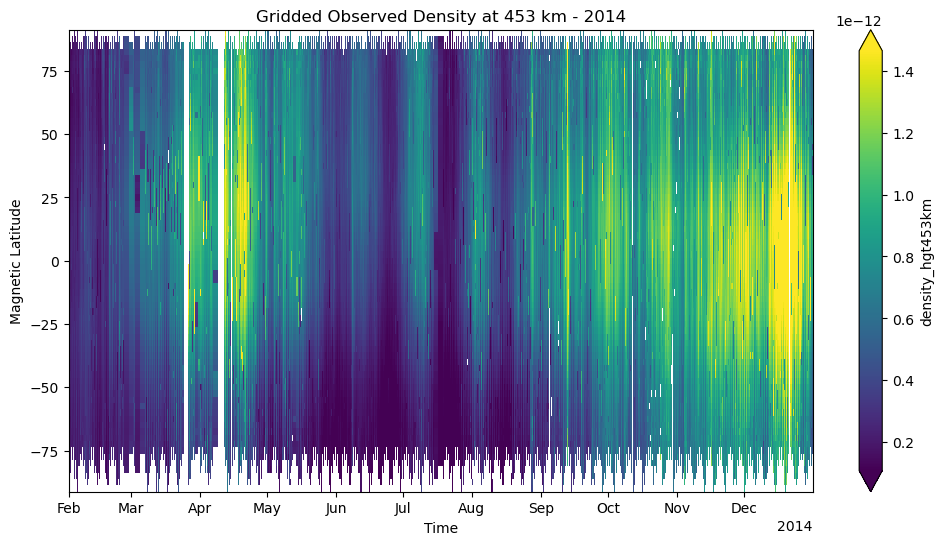

In [7]:
import os
import xarray as xr
import matplotlib.pyplot as plt

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# Initialize an empty list to store file paths for 2014 data
file_paths_2014 = []

# Loop through all files in the directory
for file in os.listdir(data_dir):
    if file.endswith('.nc') and '2014' in file:  # Check if file is a NetCDF file and contains '2014' in its name
        file_paths_2014.append(os.path.join(data_dir, file))

# Sort file paths to ensure they are in chronological order
file_paths_2014.sort()

# Open and concatenate all datasets for the year 2014
datasets_2014 = [xr.open_dataset(file) for file in file_paths_2014]
combined_ds_2014 = xr.concat(datasets_2014, dim='time')

# Plotting the gridded observational data for the year 2014
plt.figure(figsize=(12, 6))
combined_ds_2014['density_hgt453km'].mean(dim='solar_local_time').plot(
    x='time', 
    y='qd_latitude',  # Adjust 'qd_latitude' according to your actual coordinate variable name
    cmap='viridis', 
    robust=True
)
plt.title('Gridded Observed Density at 453 km - 2014')
plt.xlabel('Time')
plt.ylabel('Magnetic Latitude')
plt.show()


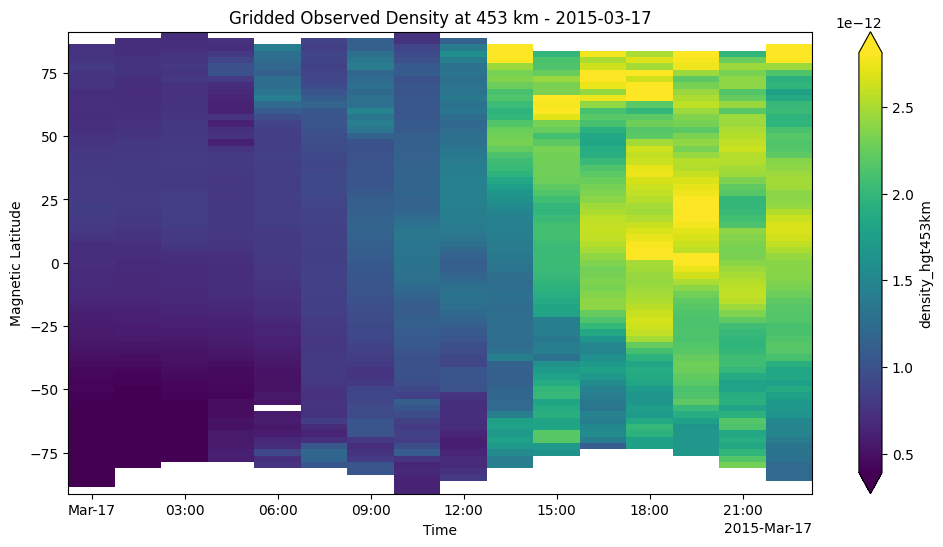

In [15]:
import os
import xarray as xr
import matplotlib.pyplot as plt

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# Specify the date you're interested in (March 17th, 2015)
target_date = '2015-03-17'

# Initialize an empty list to store file paths for the target date
file_paths_2015 = []

# Loop through all files in the directory
for file in os.listdir(data_dir):
    if file.endswith('.nc') and target_date in file:  # Check if file is a NetCDF file and contains the target date in its name
        file_paths_2015.append(os.path.join(data_dir, file))

# Check if any files were found
if not file_paths_2015:
    print(f"No files found for date {target_date}. Please check the directory and file naming conventions.")
else:
    # Sort file paths to ensure they are in chronological order
    file_paths_2015.sort()

    # Open and concatenate all datasets for the target date
    datasets_2015 = [xr.open_dataset(file) for file in file_paths_2015]
    combined_ds_2015 = xr.concat(datasets_2015, dim='time')

    # Plotting the gridded observational data for the target date
    plt.figure(figsize=(12, 6))
    combined_ds_2015['density_hgt453km'].mean(dim='solar_local_time').plot(
        x='time', 
        y='qd_latitude',  # Adjust 'qd_latitude' according to your actual coordinate variable name
        cmap='viridis', 
        robust=True
    )
    plt.title(f'Gridded Observed Density at 453 km - {target_date}')
    plt.xlabel('Time')
    plt.ylabel('Magnetic Latitude')
    plt.show()


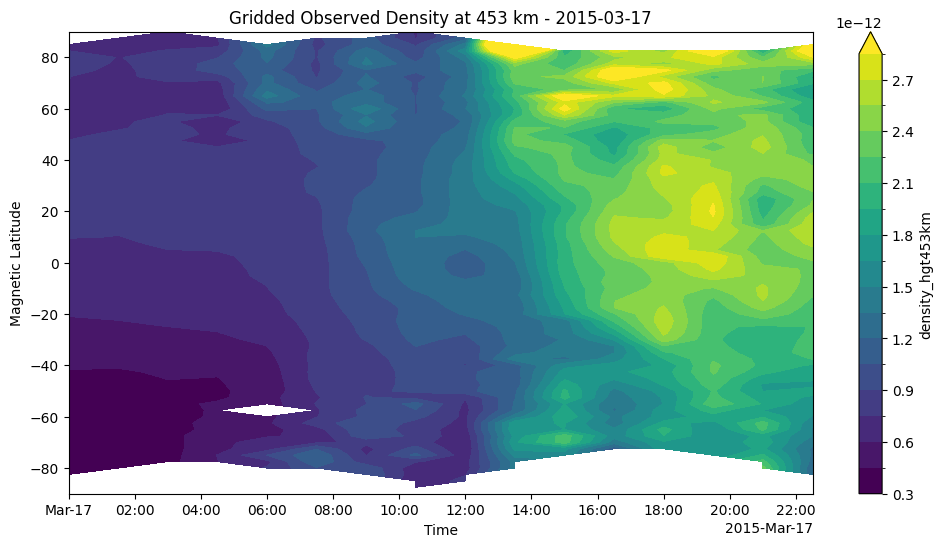

In [16]:
import os
import xarray as xr
import matplotlib.pyplot as plt

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# Specify the date you're interested in (March 17th, 2015)
target_date = '2015-03-17'

# Initialize an empty list to store file paths for the target date
file_paths_2015 = []

# Loop through all files in the directory
for file in os.listdir(data_dir):
    if file.endswith('.nc') and target_date in file:  # Check if file is a NetCDF file and contains the target date in its name
        file_paths_2015.append(os.path.join(data_dir, file))

# Check if any files were found
if not file_paths_2015:
    print(f"No files found for date {target_date}. Please check the directory and file naming conventions.")
else:
    # Sort file paths to ensure they are in chronological order
    file_paths_2015.sort()

    # Open and concatenate all datasets for the target date
    datasets_2015 = [xr.open_dataset(file) for file in file_paths_2015]
    combined_ds_2015 = xr.concat(datasets_2015, dim='time')

    # Plotting the gridded observational data for the target date using contourf
    plt.figure(figsize=(12, 6))
    combined_ds_2015['density_hgt453km'].mean(dim='solar_local_time').plot.contourf(
        x='time', 
        y='qd_latitude',  # Adjust 'qd_latitude' according to your actual coordinate variable name
        cmap='viridis', 
        levels=20,  # You can adjust the number of contour levels
        robust=True
    )
    plt.title(f'Gridded Observed Density at 453 km - {target_date}')
    plt.xlabel('Time')
    plt.ylabel('Magnetic Latitude')
    plt.show()


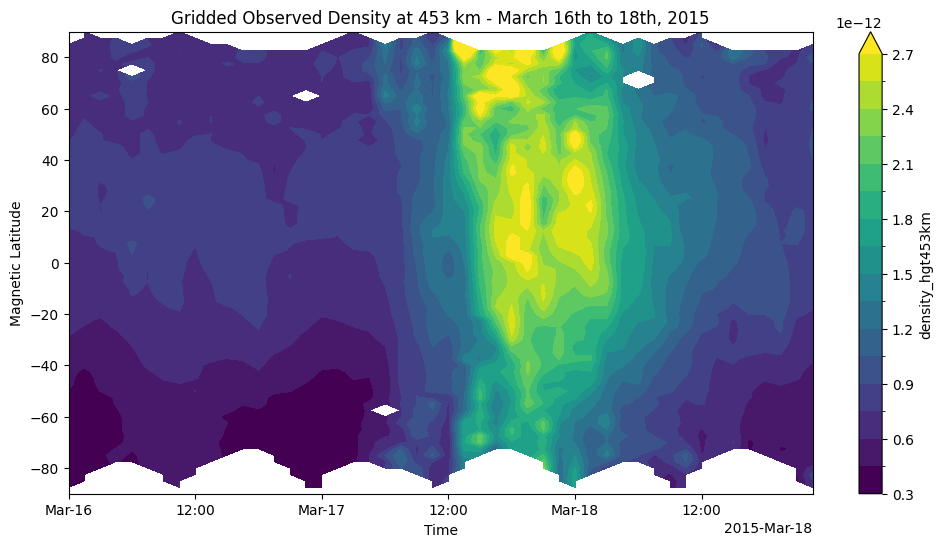

In [17]:
import os
import xarray as xr
import matplotlib.pyplot as plt

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# List the dates you're interested in (March 16th, 17th, and 18th, 2015)
target_dates = ['2015-03-16', '2015-03-17', '2015-03-18']

# Initialize an empty list to store file paths for the target dates
file_paths = []

# Loop through all files in the directory and check for each target date
for file in os.listdir(data_dir):
    if file.endswith('.nc') and any(date in file for date in target_dates):
        file_paths.append(os.path.join(data_dir, file))

# Check if any files were found
if not file_paths:
    print(f"No files found for dates {', '.join(target_dates)}. Please check the directory and file naming conventions.")
else:
    # Sort file paths to ensure they are in chronological order
    file_paths.sort()

    # Open and concatenate all datasets for the target dates
    datasets = [xr.open_dataset(file) for file in file_paths]
    combined_ds = xr.concat(datasets, dim='time')

    # Plotting the gridded observational data for the target dates using contourf
    plt.figure(figsize=(12, 6))
    combined_ds['density_hgt453km'].mean(dim='solar_local_time').plot.contourf(
        x='time', 
        y='qd_latitude',  # Adjust 'qd_latitude' according to your actual coordinate variable name
        cmap='viridis', 
        levels=20,  # You can adjust the number of contour levels
        robust=True
    )
    plt.title(f'Gridded Observed Density at 453 km - March 16th to 18th, 2015')
    plt.xlabel('Time')
    plt.ylabel('Magnetic Latitude')
    plt.show()


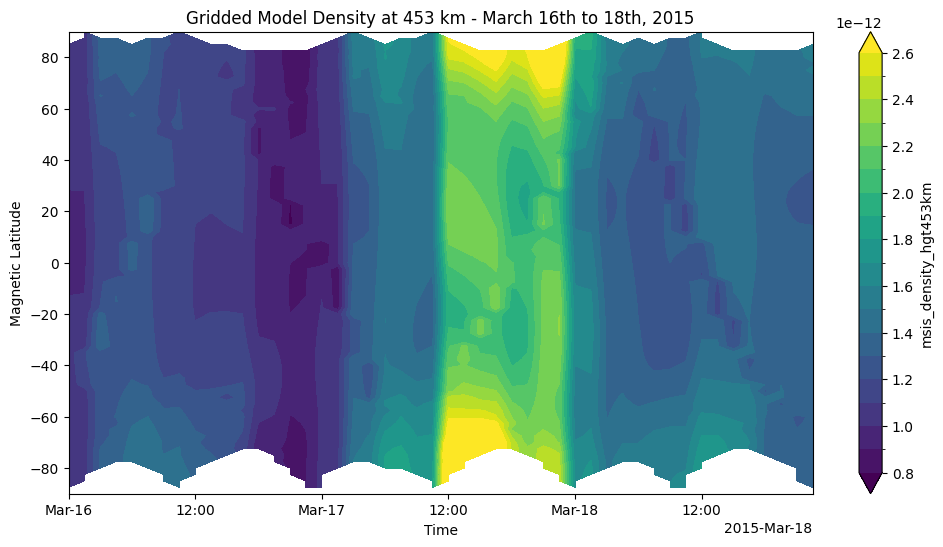

In [12]:
import os
import xarray as xr
import matplotlib.pyplot as plt

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# List the dates you're interested in (March 16th, 17th, and 18th, 2015)
target_dates = ['2015-03-16', '2015-03-17', '2015-03-18']

# Initialize an empty list to store file paths for the target dates
file_paths = []

# Loop through all files in the directory and check for each target date
for file in os.listdir(data_dir):
    if file.endswith('.nc') and any(date in file for date in target_dates):
        file_paths.append(os.path.join(data_dir, file))

# Check if any files were found
if not file_paths:
    print(f"No files found for dates {', '.join(target_dates)}. Please check the directory and file naming conventions.")
else:
    # Sort file paths to ensure they are in chronological order
    file_paths.sort()

    # Open and concatenate all datasets for the target dates
    datasets = [xr.open_dataset(file) for file in file_paths]
    combined_ds = xr.concat(datasets, dim='time')

    # Plotting the gridded observational data for the target dates using contourf
    plt.figure(figsize=(12, 6))
    combined_ds['msis_density_hgt453km'].mean(dim='solar_local_time').plot.contourf(
        x='time', 
        y='qd_latitude',  # Adjust 'qd_latitude' according to your actual coordinate variable name
        cmap='viridis', 
        levels=20,  # You can adjust the number of contour levels
        robust=True
    )
    plt.title(f'Gridded Model Density at 453 km - March 16th to 18th, 2015')
    plt.xlabel('Time')
    plt.ylabel('Magnetic Latitude')
    plt.show()


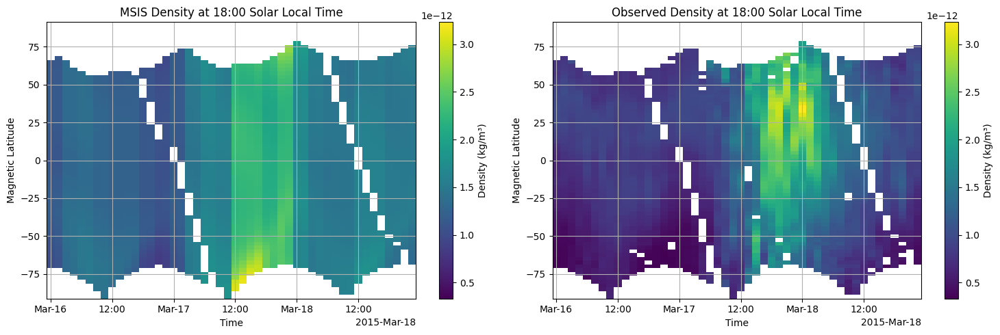

In [15]:
import os
import xarray as xr
import matplotlib.pyplot as plt

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# List the dates you're interested in (March 16th, 17th, and 18th, 2015)
target_dates = ['2015-03-16', '2015-03-17', '2015-03-18']

# Initialize an empty list to store file paths for the target dates
file_paths = []

# Loop through all files in the directory and check for each target date
for file in os.listdir(data_dir):
    if file.endswith('.nc') and any(date in file for date in target_dates):
        file_paths.append(os.path.join(data_dir, file))

# Check if any files were found
if not file_paths:
    print(f"No files found for dates {', '.join(target_dates)}. Please check the directory and file naming conventions.")
else:
    # Sort file paths to ensure they are in chronological order
    file_paths.sort()

    # Open and concatenate all datasets for the target dates
    datasets = [xr.open_dataset(file) for file in file_paths]
    combined_ds = xr.concat(datasets, dim='time')

    # Select a specific solar local time (e.g., 18:00)
    specific_time = 18  # Local solar time (18:00)
    
    # Filtering the dataset for the specific solar local time for both density variables
    density_msis = combined_ds.sel(solar_local_time=specific_time)['msis_density_hgt453km']
    density_observed = combined_ds.sel(solar_local_time=specific_time)['density_hgt453km']

    # Determine density limits for consistent color mapping
    vmin = min(density_msis.min(), density_observed.min())
    vmax = max(density_msis.max(), density_observed.max())

    # Create a figure with two subplots
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))

    # Plot for MSIS density at 18:00
    density_msis.plot(ax=axs[0], x='time', y='qd_latitude', cmap='viridis', 
                      vmin=vmin, vmax=vmax, cbar_kwargs={'label': 'Density (kg/m³)'})
    axs[0].set_title(f'MSIS Density at {specific_time}:00 Solar Local Time')
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel('Magnetic Latitude')
    axs[0].grid(True)

    # Plot for Observed density at 18:00
    density_observed.plot(ax=axs[1], x='time', y='qd_latitude', cmap='viridis', 
                          vmin=vmin, vmax=vmax, cbar_kwargs={'label': 'Density (kg/m³)'})
    axs[1].set_title(f'Observed Density at {specific_time}:00 Solar Local Time')
    axs[1].set_xlabel('Time')
    axs[1].set_ylabel('Magnetic Latitude')
    axs[1].grid(True)

    # Adjust layout
    plt.tight_layout()

    # Show the plots
    plt.show()


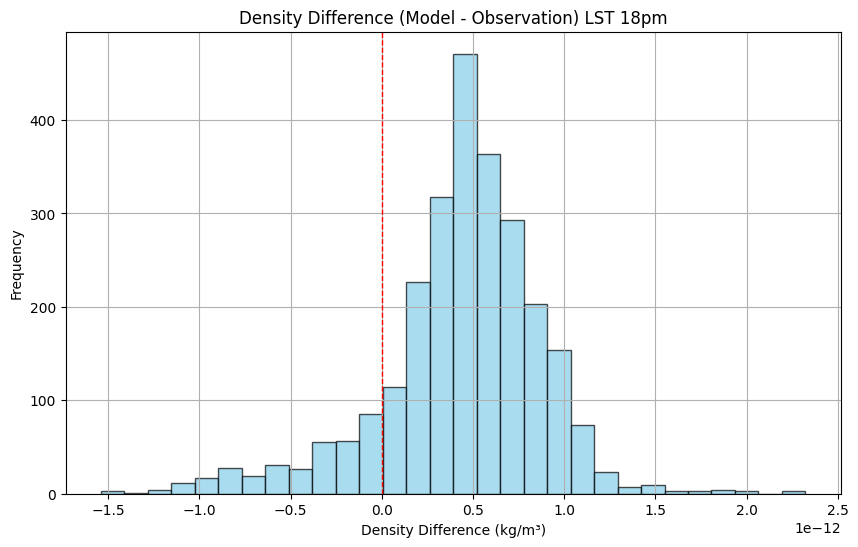

Mean difference: 0.00 kg/m³
Minimum difference: -0.00 kg/m³
Maximum difference: 0.00 kg/m³


In [40]:
import os
import xarray as xr
import matplotlib.pyplot as plt

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# List the dates you're interested in (March 16th, 17th, and 18th, 2015)
target_dates = ['2015-03-16', '2015-03-17', '2015-03-18']

# Initialize an empty list to store file paths for the target dates
file_paths = []

# Loop through all files in the directory and check for each target date
for file in os.listdir(data_dir):
    if file.endswith('.nc') and any(date in file for date in target_dates):
        file_paths.append(os.path.join(data_dir, file))

# Check if any files were found
if not file_paths:
    print(f"No files found for dates {', '.join(target_dates)}. Please check the directory and file naming conventions.")
else:
    # Sort file paths to ensure they are in chronological order
    file_paths.sort()

    # Open and concatenate all datasets for the target dates
    datasets = [xr.open_dataset(file) for file in file_paths]
    combined_ds = xr.concat(datasets, dim='time')

    # Select a specific solar local time (e.g., 18:00)
    specific_time = 18  # Local solar time (18:00)
    
    # Filtering the dataset for the specific solar local time for both density variables
    density_msis = combined_ds.sel(solar_local_time=specific_time)['msis_density_hgt453km']
    density_observed = combined_ds.sel(solar_local_time=specific_time)['density_hgt453km']

    # Calculate the difference between model and observation
    density_difference = density_msis - density_observed

    # Flatten the difference array for histogram
    difference_flat_18pm = density_difference.values.flatten()

    # Create a histogram of the density difference
    plt.figure(figsize=(10, 6))
    plt.hist(difference_flat_18pm, bins=30, color='skyblue', edgecolor='black', alpha=0.7)
    plt.title('Density Difference (Model - Observation) LST 18pm' )
    plt.xlabel('Density Difference (kg/m³)')
    plt.ylabel('Frequency')
    plt.axvline(0, color='red', linestyle='--', linewidth=1)  # Add a line at 0 for reference
    plt.grid(True)

    # Show the histogram
    plt.show()

    # Optional: Print statistics about the differences
    print(f'Mean difference: {density_difference.mean().values:.2f} kg/m³')
    print(f'Minimum difference: {density_difference.min().values:.2f} kg/m³')
    print(f'Maximum difference: {density_difference.max().values:.2f} kg/m³')


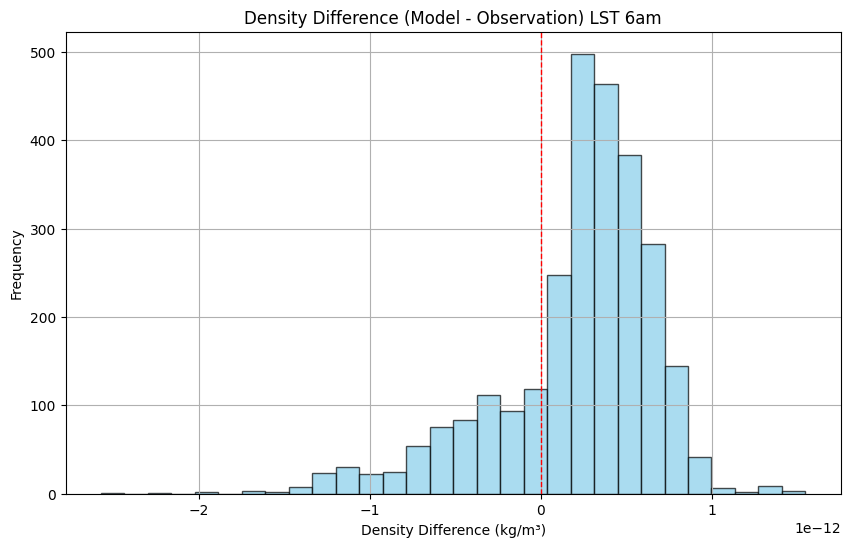

Mean difference: 0.00 kg/m³
Minimum difference: -0.00 kg/m³
Maximum difference: 0.00 kg/m³


In [39]:
import os
import xarray as xr
import matplotlib.pyplot as plt

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# List the dates you're interested in (March 16th, 17th, and 18th, 2015)
target_dates = ['2015-03-16', '2015-03-17', '2015-03-18']

# Initialize an empty list to store file paths for the target dates
file_paths = []

# Loop through all files in the directory and check for each target date
for file in os.listdir(data_dir):
    if file.endswith('.nc') and any(date in file for date in target_dates):
        file_paths.append(os.path.join(data_dir, file))

# Check if any files were found
if not file_paths:
    print(f"No files found for dates {', '.join(target_dates)}. Please check the directory and file naming conventions.")
else:
    # Sort file paths to ensure they are in chronological order
    file_paths.sort()

    # Open and concatenate all datasets for the target dates
    datasets = [xr.open_dataset(file) for file in file_paths]
    combined_ds = xr.concat(datasets, dim='time')

    # Select a specific solar local time (e.g., 6:00)
    specific_time = 6  # Local solar time (6:00)
    
    # Filtering the dataset for the specific solar local time for both density variables
    density_msis = combined_ds.sel(solar_local_time=specific_time)['msis_density_hgt453km']
    density_observed = combined_ds.sel(solar_local_time=specific_time)['density_hgt453km']

    # Calculate the difference between model and observation
    density_difference = density_msis - density_observed

    # Flatten the difference array for histogram
    difference_flat_6am = density_difference.values.flatten()

    # Create a histogram of the density difference
    plt.figure(figsize=(10, 6))
    plt.hist(difference_flat_6am, bins=30, color='skyblue', edgecolor='black', alpha=0.7)
    plt.title('Density Difference (Model - Observation) LST 6am')
    plt.xlabel('Density Difference (kg/m³)')
    plt.ylabel('Frequency')
    plt.axvline(0, color='red', linestyle='--', linewidth=1)  # Add a line at 0 for reference
    plt.grid(True)

    # Show the histogram
    plt.show()

    # Optional: Print statistics about the differences
    print(f'Mean difference: {density_difference.mean().values:.2f} kg/m³')
    print(f'Minimum difference: {density_difference.min().values:.2f} kg/m³')
    print(f'Maximum difference: {density_difference.max().values:.2f} kg/m³')


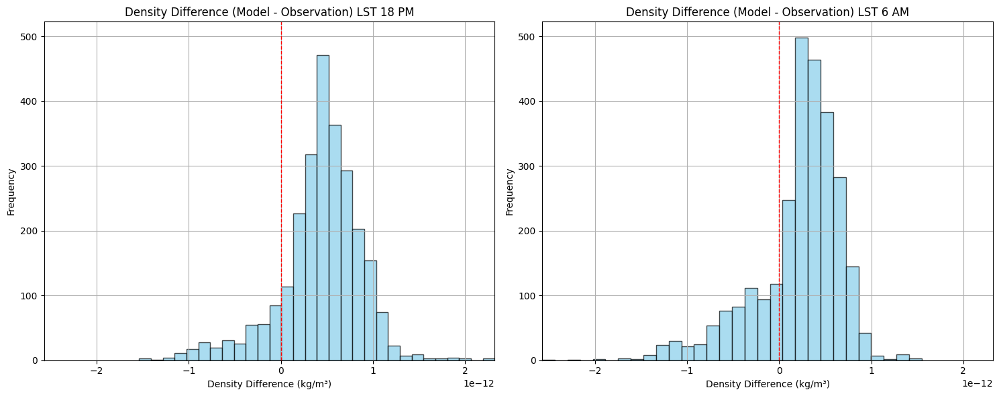

In [42]:
import numpy as np

# Clean the data by removing NaN and Inf values
difference_flat_6am_clean = difference_flat_6am[np.isfinite(difference_flat_6am)]
difference_flat_18pm_clean = difference_flat_18pm[np.isfinite(difference_flat_18pm)]

# Create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Get common axis limits for both histograms
density_min = min(difference_flat_6am_clean.min(), difference_flat_18pm_clean.min())
density_max = max(difference_flat_6am_clean.max(), difference_flat_18pm_clean.max())
bins = 30  # Number of bins

# Plot the histogram for LST 18 PM (subplot 1)
axs[0].hist(difference_flat_18pm_clean, bins=bins, color='skyblue', edgecolor='black', alpha=0.7)
axs[0].set_title('Density Difference (Model - Observation), 16 - 18 March 2015, LST 18 PM')
axs[0].set_xlabel('Density Difference (kg/m³)')
axs[0].set_ylabel('Frequency')
axs[0].axvline(0, color='red', linestyle='--', linewidth=1)  # Add a line at 0 for reference
axs[0].grid(True)

# Plot the histogram for LST 6 AM (subplot 2)
axs[1].hist(difference_flat_6am_clean, bins=bins, color='skyblue', edgecolor='black', alpha=0.7)
axs[1].set_title('Density Difference (Model - Observation), 16 - 18 March 2015, LST 6 AM')
axs[1].set_xlabel('Density Difference (kg/m³)')
axs[1].set_ylabel('Frequency')
axs[1].axvline(0, color='red', linestyle='--', linewidth=1)  # Add a line at 0 for reference
axs[1].grid(True)

# Set the same limits for both x-axis and y-axis
axs[0].set_xlim([density_min, density_max])
axs[1].set_xlim([density_min, density_max])
axs[0].set_ylim([0, max(axs[0].get_ylim()[1], axs[1].get_ylim()[1])])
axs[1].set_ylim([0, max(axs[0].get_ylim()[1], axs[1].get_ylim()[1])])

# Adjust layout for better spacing
plt.tight_layout()

# Show the histograms
plt.show()


/opt/conda/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/conda/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/conda/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/conda/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/conda/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2053: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/opt/conda/lib/python3.11/site-packages/numpy

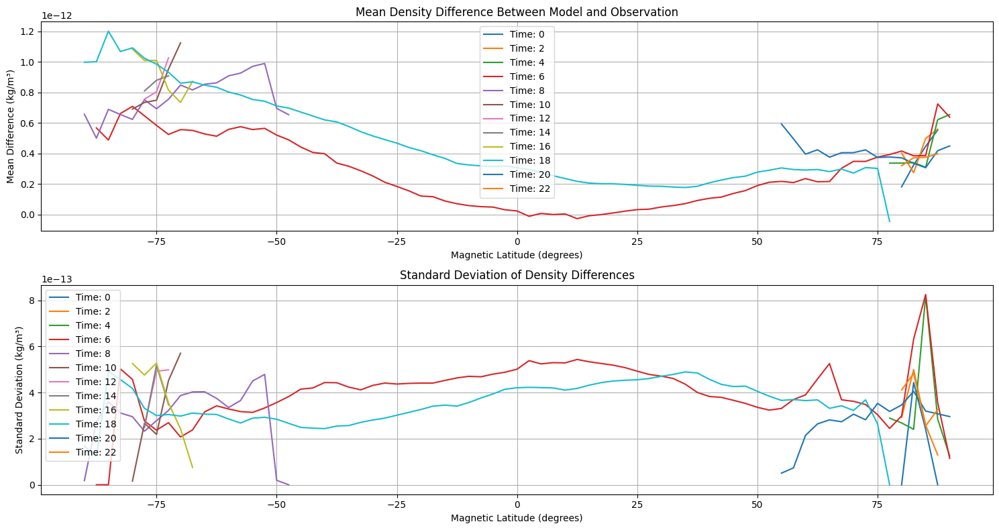

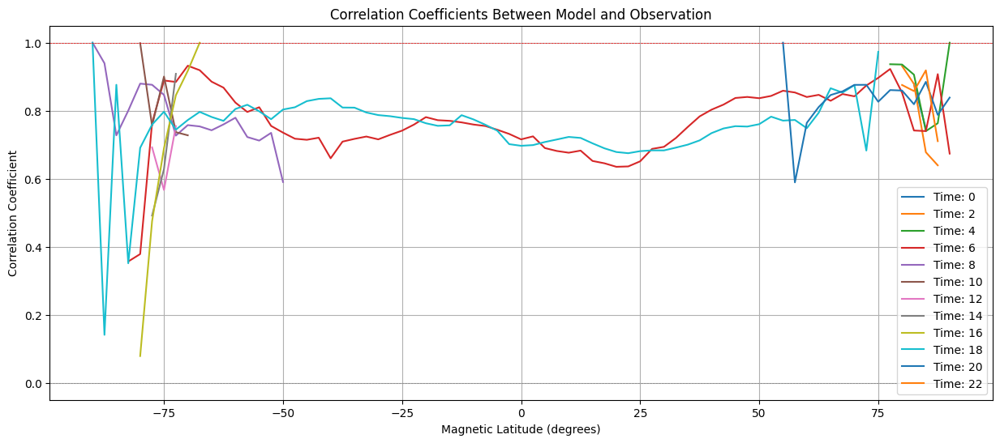

Solar Local Time: 0
  Mean Difference: [           nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan            nan 

In [25]:
import os
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# List the dates you're interested in (March 16th, 17th, and 18th, 2015)
target_dates = ['2015-03-16', '2015-03-17', '2015-03-18']

# Initialize an empty list to store file paths for the target dates
file_paths = []

# Loop through all files in the directory and check for each target date
for file in os.listdir(data_dir):
    if file.endswith('.nc') and any(date in file for date in target_dates):
        file_paths.append(os.path.join(data_dir, file))

# Check if any files were found
if not file_paths:
    print(f"No files found for dates {', '.join(target_dates)}. Please check the directory and file naming conventions.")
else:
    # Sort file paths to ensure they are in chronological order
    file_paths.sort()

    # Open and concatenate all datasets for the target dates
    datasets = [xr.open_dataset(file) for file in file_paths]
    combined_ds = xr.concat(datasets, dim='time')

    # Get unique solar local times available in the dataset
    unique_solar_local_times = combined_ds['solar_local_time'].values

    # Prepare arrays to hold metrics
    mean_differences = []
    std_differences = []
    correlation_coefficients = []
    magnetic_latitudes = combined_ds['qd_latitude'].values  # Storing magnetic latitudes

    # Loop through each unique solar local time
    for specific_time in unique_solar_local_times:
        # Filtering the dataset for the specific solar local time for both density variables
        density_msis = combined_ds.sel(solar_local_time=specific_time)['msis_density_hgt453km']
        density_observed = combined_ds.sel(solar_local_time=specific_time)['density_hgt453km']

        # Calculate the difference between model and observation
        density_difference = density_msis - density_observed

        # Check if there are enough valid data points to compute metrics
        valid_data_mask = ~np.isnan(density_difference)

        # Calculate mean and standard deviation of the differences across time
        if valid_data_mask.sum() > 0:  # Ensure there is at least one valid point
            mean_difference = density_difference.where(valid_data_mask).mean(dim='time').values
            std_difference = density_difference.where(valid_data_mask).std(dim='time').values
        else:
            mean_difference = np.nan
            std_difference = np.nan

        mean_differences.append(mean_difference)
        std_differences.append(std_difference)

        # Calculate correlation coefficient for each magnetic latitude
        correlation_coeffs = []
        for lat_index in range(len(magnetic_latitudes)):
            model_values = density_msis[:, lat_index].values
            observed_values = density_observed[:, lat_index].values

            # Remove NaN values for correlation calculation
            mask = ~np.isnan(model_values) & ~np.isnan(observed_values)
            if mask.sum() > 1:  # At least two points needed for correlation
                corr_coeff, _ = pearsonr(model_values[mask], observed_values[mask])
            else:
                corr_coeff = np.nan  # Not enough points for correlation

            correlation_coeffs.append(corr_coeff)

        # Store the correlation coefficients
        correlation_coefficients.append(correlation_coeffs)

    # Convert lists to arrays for plotting
    mean_differences = np.array(mean_differences)
    std_differences = np.array(std_differences)
    correlation_coefficients = np.array(correlation_coefficients)

    # Create a figure to plot mean differences and standard deviations
    plt.figure(figsize=(15, 8))

    # Mean Differences
    plt.subplot(2, 1, 1)
    for i, specific_time in enumerate(unique_solar_local_times):
        plt.plot(magnetic_latitudes, mean_differences[i], label=f'Time: {specific_time}')
    plt.title('Mean Density Difference Between Model and Observation')
    plt.xlabel('Magnetic Latitude (degrees)')
    plt.ylabel('Mean Difference (kg/m³)')
    plt.grid()
    plt.legend()

    # Standard Deviations
    plt.subplot(2, 1, 2)
    for i, specific_time in enumerate(unique_solar_local_times):
        plt.plot(magnetic_latitudes, std_differences[i], label=f'Time: {specific_time}')
    plt.title('Standard Deviation of Density Differences')
    plt.xlabel('Magnetic Latitude (degrees)')
    plt.ylabel('Standard Deviation (kg/m³)')
    plt.grid()
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Create a figure for correlation coefficients
    plt.figure(figsize=(15, 6))
    for i, specific_time in enumerate(unique_solar_local_times):
        plt.plot(magnetic_latitudes, correlation_coefficients[i], label=f'Time: {specific_time}')
    plt.title('Correlation Coefficients Between Model and Observation')
    plt.xlabel('Magnetic Latitude (degrees)')
    plt.ylabel('Correlation Coefficient')
    plt.axhline(0, color='gray', linewidth=0.5, linestyle='--')
    plt.axhline(1, color='red', linewidth=0.5, linestyle='--')
    plt.grid()
    plt.legend()
    plt.show()

    # Print summary of metrics
    for i, specific_time in enumerate(unique_solar_local_times):
        print(f"Solar Local Time: {specific_time}")
        print(f"  Mean Difference: {mean_differences[i]}")
        print(f"  Standard Deviation: {std_differences[i]}")
        print(f"  Correlation Coefficients: {correlation_coefficients[i]}")


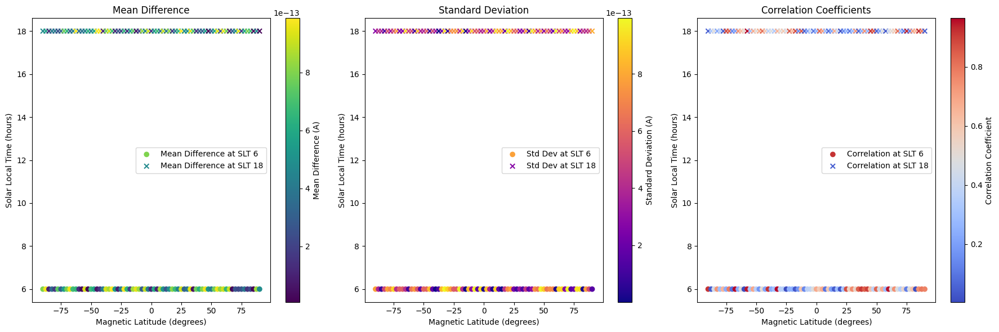

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# Sample data (replace with your actual data)
magnetic_latitude = np.linspace(-90, 90, 73)  # Magnetic latitudes from -90 to 90
solar_local_time = np.array([6, 18])  # Solar local times
mean_difference = np.random.rand(73, 2) * 1e-12  # Random data for mean difference
std_deviation = np.random.rand(73, 2) * 1e-12  # Random data for standard deviation
correlation_coefficients = np.random.rand(73, 2)  # Random data for correlation coefficients

# Create a figure with subplots for each metric
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

# Plot Mean Difference
sc1 = axs[0].scatter(magnetic_latitude, solar_local_time[0] * np.ones_like(magnetic_latitude),
                     c=mean_difference[:, 0], cmap='viridis', marker='o', label='Mean Difference at SLT 6')
sc2 = axs[0].scatter(magnetic_latitude, solar_local_time[1] * np.ones_like(magnetic_latitude),
                     c=mean_difference[:, 1], cmap='viridis', marker='x', label='Mean Difference at SLT 18')

axs[0].set_title('Mean Difference')
axs[0].set_xlabel('Magnetic Latitude (degrees)')
axs[0].set_ylabel('Solar Local Time (hours)')
plt.colorbar(sc1, ax=axs[0], label='Mean Difference (A)')
axs[0].legend()

# Plot Standard Deviation
sc3 = axs[1].scatter(magnetic_latitude, solar_local_time[0] * np.ones_like(magnetic_latitude),
                     c=std_deviation[:, 0], cmap='plasma', marker='o', label='Std Dev at SLT 6')
sc4 = axs[1].scatter(magnetic_latitude, solar_local_time[1] * np.ones_like(magnetic_latitude),
                     c=std_deviation[:, 1], cmap='plasma', marker='x', label='Std Dev at SLT 18')

axs[1].set_title('Standard Deviation')
axs[1].set_xlabel('Magnetic Latitude (degrees)')
axs[1].set_ylabel('Solar Local Time (hours)')
plt.colorbar(sc3, ax=axs[1], label='Standard Deviation (A)')
axs[1].legend()

# Plot Correlation Coefficients
sc5 = axs[2].scatter(magnetic_latitude, solar_local_time[0] * np.ones_like(magnetic_latitude),
                     c=correlation_coefficients[:, 0], cmap='coolwarm', marker='o', label='Correlation at SLT 6')
sc6 = axs[2].scatter(magnetic_latitude, solar_local_time[1] * np.ones_like(magnetic_latitude),
                     c=correlation_coefficients[:, 1], cmap='coolwarm', marker='x', label='Correlation at SLT 18')

axs[2].set_title('Correlation Coefficients')
axs[2].set_xlabel('Magnetic Latitude (degrees)')
axs[2].set_ylabel('Solar Local Time (hours)')
plt.colorbar(sc5, ax=axs[2], label='Correlation Coefficient')
axs[2].legend()

plt.tight_layout()
plt.show()



In [11]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import datetime
import sys
import pandas as pd

sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS

# Directory where your NetCDF data files are located
data_dir = 'data/SAT_C/hgt453km'

# Initialize an empty list to store file paths
nc_file_paths = []

# Collect NetCDF files
for file in os.listdir(data_dir):
    if file.endswith('.nc'):
        nc_file_paths.append(os.path.join(data_dir, file))

# Load and concatenate all NetCDF datasets into a single xarray Dataset
datasets = [xr.open_dataset(file) for file in nc_file_paths]
combined_ds = xr.concat(datasets, dim='time')

# Convert the time values from the NetCDF data to a pandas datetime index
time_values = pd.to_datetime(combined_ds['time'].values)

# Initialize an empty list to store aligned F10.7 values
f107_values_aligned = []

# Loop through each time point and get the corresponding F10.7 value
for time_point in time_values:
    day = time_point.to_pydatetime()  # Convert to a Python datetime object
    # Get F10.7 value using your function
    xr_f107_all = readSolarFluxCLS(day - datetime.timedelta(days=40), day + datetime.timedelta(days=40), 'adjusted', 'f10.7')
    f107_day = xr_f107_all['f10.7_c'].sel(time=np.datetime64(day, 'D')).values
    f107_values_aligned.append(f107_day)

# Convert the aligned F10.7 values list to a numpy array
f107_values_aligned = np.array(f107_values_aligned)

# Add the aligned F10.7 values as a new variable in the NetCDF dataset
combined_ds = combined_ds.assign_coords(F10_7=('time', f107_values_aligned))

# Plot the observed density versus F10.7 index
plt.figure(figsize=(12, 6))
plt.scatter(combined_ds['density_hgt453km'].values, combined_ds['F10_7'].values, alpha=0.5)
plt.title('Observed Density vs F10.7 Index')
plt.xlabel('Observed Density')
plt.ylabel('F10.7 Index')
plt.grid(True)
plt.show()


KeyboardInterrupt: 

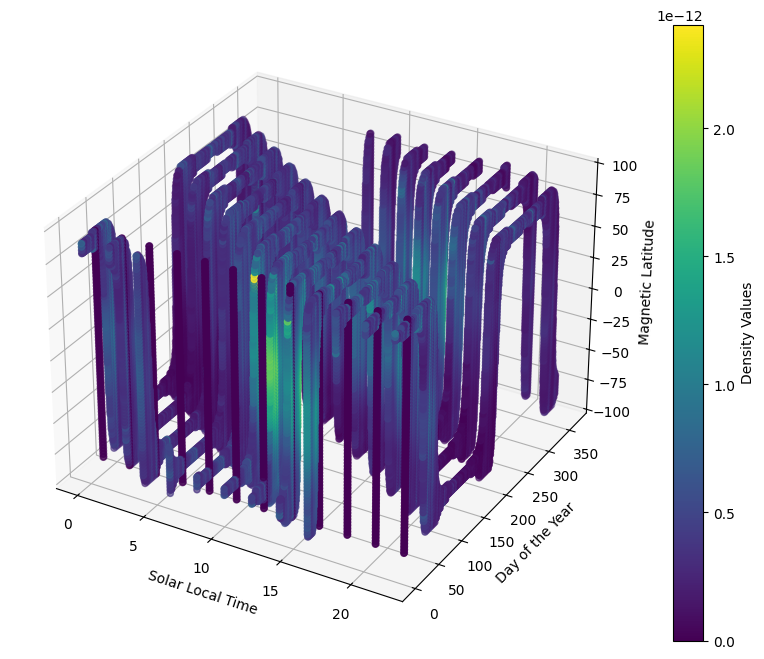

In [8]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import datetime

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# Define the range of dates for the year 2016
start_date = datetime.datetime(2016, 1, 1)
end_date = datetime.datetime(2016, 12, 31)

# Define grid parameters
latitudes = np.arange(-90, 90.1, 2.5)  # Magnetic latitude grid points
slts = np.arange(0, 24, 2)  # Solar Local Time grid points
time_intervals = np.arange(0, 366, 1)  # Daily grid points for a year

# Initialize the data cube with zeros
data_cube = np.zeros((len(latitudes), len(slts), len(time_intervals)))

# Loop through each day of the year 2016 to fill the data cube
current_date = start_date
time_index = 0

while current_date <= end_date:
    date_str = current_date.strftime('%Y-%m-%d')
    file_paths = []

    # Loop through all files in the directory to find the files for the current date
    for file in os.listdir(data_dir):
        if file.endswith('.nc') and date_str in file:
            file_paths.append(os.path.join(data_dir, file))
    
    # If files are found, load and process them
    if file_paths:
        daily_datasets = [xr.open_dataset(file) for file in file_paths]
        combined_daily_ds = xr.concat(daily_datasets, dim='time')

        # Iterate over the Solar Local Time grid points
        for slt_index, slt in enumerate(slts):
            if slt in combined_daily_ds['solar_local_time']:
                density_slt = combined_daily_ds['density_hgt453km'].sel(solar_local_time=slt)

                # Assign values to the corresponding latitude and time indices in the data cube
                for lat_index, lat in enumerate(latitudes):
                    if lat in density_slt['qd_latitude']:
                        data_value = density_slt.sel(qd_latitude=lat).mean().values
                        data_cube[lat_index, slt_index, time_index] = data_value

    # Move to the next day and increase the time index
    current_date += datetime.timedelta(days=1)
    time_index += 1

# Step 3: Visualize the data cube
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate grid points for 3D plot
X, Z, Y = np.meshgrid(slts, latitudes, time_intervals)

# Flatten the arrays to plot the 3D scatter
X = X.flatten()
Y = Y.flatten()
Z = Z.flatten()
values = data_cube.flatten()

# Plot the 3D scatter
sc = ax.scatter(X, Y, Z, c=values, cmap='viridis')

# Add labels
ax.set_xlabel('Solar Local Time')
ax.set_ylabel('Day of the Year')
ax.set_zlabel('Magnetic Latitude')


# Show color bar
plt.colorbar(sc, label='Density Values')

# Show plot
plt.show()



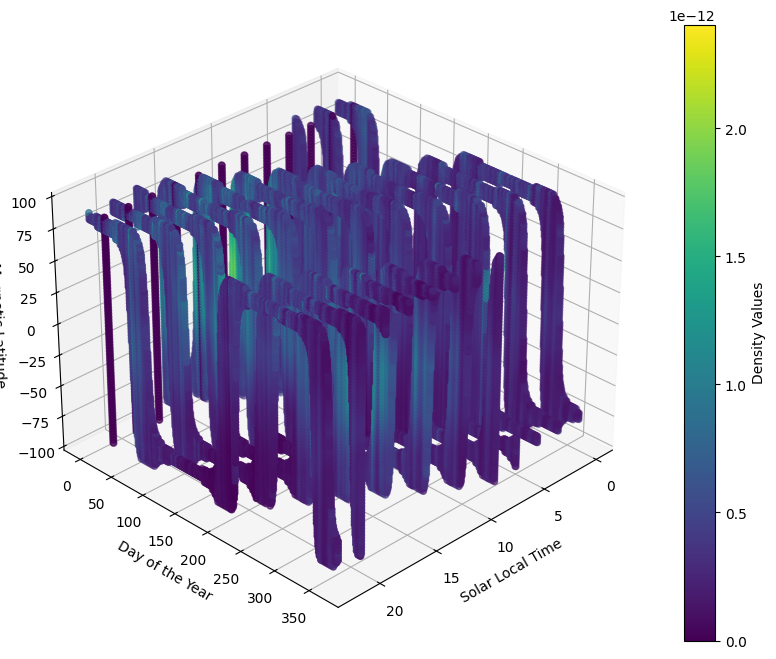

In [4]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import datetime

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# Define the range of dates for the year 2016
start_date = datetime.datetime(2016, 1, 1)
end_date = datetime.datetime(2016, 12, 31)

# Define grid parameters
latitudes = np.arange(-90, 90.1, 2.5)  # Magnetic latitude grid points
slts = np.arange(0, 24, 2)  # Solar Local Time grid points
time_intervals = np.arange(0, 366, 1)  # Daily grid points for a year

# Initialize the data cube with zeros
data_cube = np.zeros((len(latitudes), len(slts), len(time_intervals)))

# Loop through each day of the year 2016 to fill the data cube
current_date = start_date
time_index = 0

while current_date <= end_date:
    date_str = current_date.strftime('%Y-%m-%d')
    file_paths = []

    # Loop through all files in the directory to find the files for the current date
    for file in os.listdir(data_dir):
        if file.endswith('.nc') and date_str in file:
            file_paths.append(os.path.join(data_dir, file))
    
    # If files are found, load and process them
    if file_paths:
        daily_datasets = [xr.open_dataset(file) for file in file_paths]
        combined_daily_ds = xr.concat(daily_datasets, dim='time')

        # Iterate over the Solar Local Time grid points
        for slt_index, slt in enumerate(slts):
            if slt in combined_daily_ds['solar_local_time']:
                density_slt = combined_daily_ds['density_hgt453km'].sel(solar_local_time=slt)

                # Assign values to the corresponding latitude and time indices in the data cube
                for lat_index, lat in enumerate(latitudes):
                    if lat in density_slt['qd_latitude']:
                        data_value = density_slt.sel(qd_latitude=lat).mean().values
                        data_cube[lat_index, slt_index, time_index] = data_value

    # Move to the next day and increase the time index
    current_date += datetime.timedelta(days=1)
    time_index += 1


# Step 3: Visualize the data cube
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate grid points for 3D plot
X, Z, Y = np.meshgrid(slts, latitudes, time_intervals)

# Flatten the arrays to plot the 3D scatter
X = X.flatten()
Y = Y.flatten()
Z = Z.flatten()
values = data_cube.flatten()

# Plot the 3D scatter
sc = ax.scatter(X, Y, Z, c=values, cmap='viridis')

# Add labels
ax.set_xlabel('Solar Local Time')
ax.set_ylabel('Day of the Year')
ax.set_zlabel('Magnetic Latitude')

# Set the viewing angle
ax.view_init(elev=30, azim=45)  # Adjust this angle for a better view

# Show color bar
plt.colorbar(sc, label='Density Values')

# Show plot
plt.show()


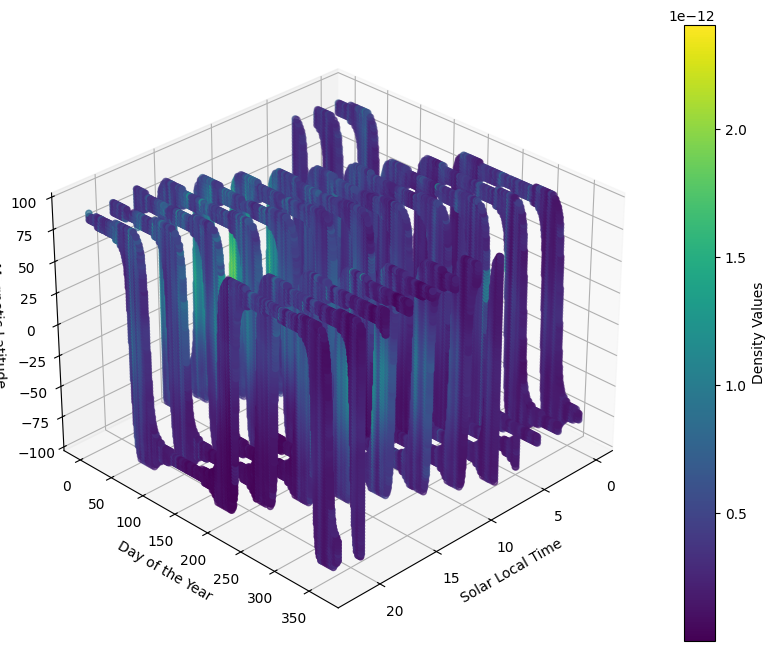

In [2]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import datetime

# Directory where your data files are located
data_dir = 'data/SAT_C/hgt453km'

# Define the range of dates for the year 2016
start_date = datetime.datetime(2016, 1, 1)
end_date = datetime.datetime(2016, 12, 31)

# Define grid parameters
latitudes = np.arange(-90, 90.1, 2.5)  # Magnetic latitude grid points
slts = np.arange(0, 24, 2)  # Solar Local Time grid points
time_intervals = np.arange(0, 366, 1)  # Daily grid points for a year

# Initialize the data cube with zeros
data_cube = np.full((len(latitudes), len(slts), len(time_intervals)), np.nan)  # Initialize with NaN

# Loop through each day of the year 2016 to fill the data cube
current_date = start_date
time_index = 0

while current_date <= end_date:
    date_str = current_date.strftime('%Y-%m-%d')
    file_paths = []

    # Loop through all files in the directory to find the files for the current date
    for file in os.listdir(data_dir):
        if file.endswith('.nc') and date_str in file:
            file_paths.append(os.path.join(data_dir, file))
    
    # If files are found, load and process them
    if file_paths:
        daily_datasets = [xr.open_dataset(file) for file in file_paths]
        combined_daily_ds = xr.concat(daily_datasets, dim='time')

        # Iterate over the Solar Local Time grid points
        for slt_index, slt in enumerate(slts):
            if slt in combined_daily_ds['solar_local_time']:
                density_slt = combined_daily_ds['density_hgt453km'].sel(solar_local_time=slt)

                # Assign values to the corresponding latitude and time indices in the data cube
                for lat_index, lat in enumerate(latitudes):
                    if lat in density_slt['qd_latitude']:
                        data_value = density_slt.sel(qd_latitude=lat).mean().values
                        data_cube[lat_index, slt_index, time_index] = data_value

    # Move to the next day and increase the time index
    current_date += datetime.timedelta(days=1)
    time_index += 1

# Step 3: Visualize the data cube
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate grid points for 3D plot
X, Z, Y = np.meshgrid(slts, latitudes, time_intervals)

# Flatten the arrays to plot the 3D scatter
X = X.flatten()
Y = Y.flatten()
Z = Z.flatten()
values = data_cube.flatten()

# Filter out the NaN values from the data
valid_mask = ~np.isnan(values)  # Create a mask for valid values (i.e., not NaN)

X_valid = X[valid_mask]
Y_valid = Y[valid_mask]
Z_valid = Z[valid_mask]
values_valid = values[valid_mask]

# Plot the 3D scatter with valid values only
sc = ax.scatter(X_valid, Y_valid, Z_valid, c=values_valid, cmap='viridis')

# Add labels
ax.set_xlabel('Solar Local Time')
ax.set_ylabel('Day of the Year')
ax.set_zlabel('Magnetic Latitude')

# Set the viewing angle
ax.view_init(elev=30, azim=45)  # Adjust this angle for a better view

# Show color bar
plt.colorbar(sc, label='Density Values')

# Show plot
plt.show()


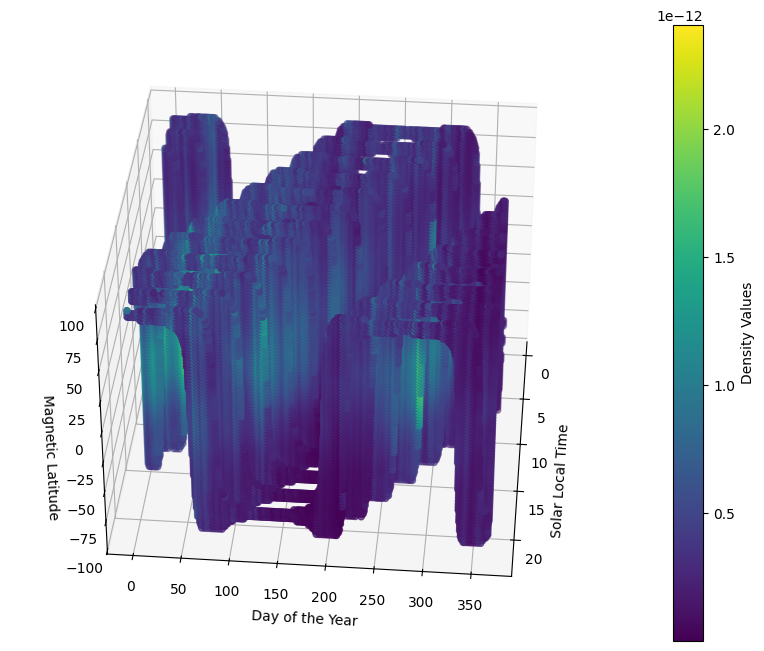

In [3]:
# Step 3: Visualize the data cube
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate grid points for 3D plot
X, Z, Y = np.meshgrid(slts, latitudes, time_intervals)

# Flatten the arrays to plot the 3D scatter
X = X.flatten()
Y = Y.flatten()
Z = Z.flatten()
values = data_cube.flatten()

# Filter out the NaN values from the data
valid_mask = ~np.isnan(values)  # Create a mask for valid values (i.e., not NaN)

X_valid = X[valid_mask]
Y_valid = Y[valid_mask]
Z_valid = Z[valid_mask]
values_valid = values[valid_mask]

# Plot the 3D scatter with valid values only
sc = ax.scatter(X_valid, Y_valid, Z_valid, c=values_valid, cmap='viridis')

# Add labels
ax.set_xlabel('Solar Local Time')
ax.set_ylabel('Day of the Year')
ax.set_zlabel('Magnetic Latitude')

# Set the viewing angle
ax.view_init(elev=35, azim=5)  # Adjust this angle for a better view

# Show color bar
plt.colorbar(sc, label='Density Values')

# Show plot
plt.show()


In [ ]:
# Step 3: Visualize the data cube
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate grid points for 3D plot
X, Z, Y = np.meshgrid(slts, latitudes, time_intervals)

# Flatten the arrays to plot the 3D scatter
X = X.flatten()
Y = Y.flatten()
Z = Z.flatten()
values = data_cube.flatten()

# Filter out the NaN values from the data
valid_mask = ~np.isnan(values)  # Create a mask for valid values (i.e., not NaN)

X_valid = X[valid_mask]
Y_valid = Y[valid_mask]
Z_valid = Z[valid_mask]
values_valid = values[valid_mask]

# Plot the 3D scatter with valid values only
sc = ax.scatter(X_valid, Y_valid, Z_valid, c=values_valid, cmap='viridis')

# Add labels
ax.set_xlabel('Solar Local Time')
ax.set_ylabel('Day of the Year')
ax.set_zlabel('Magnetic Latitude')

# Set the viewing angle
ax.view_init(elev=35, azim=5)  # Adjust this angle for a better view

# Show color bar
plt.colorbar(sc, label='Density Values')

# Show plot
plt.show()


Processing files: 100%|██████████| 3213/3213 [01:10<00:00, 45.84it/s]


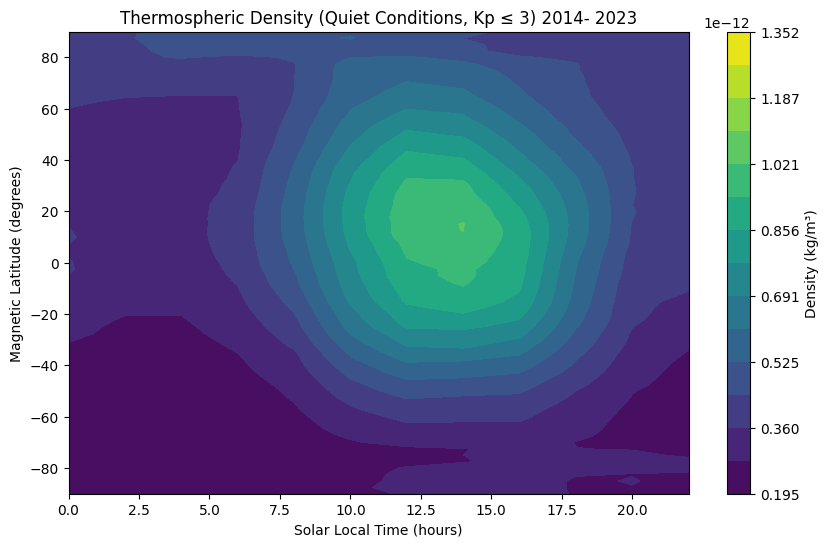

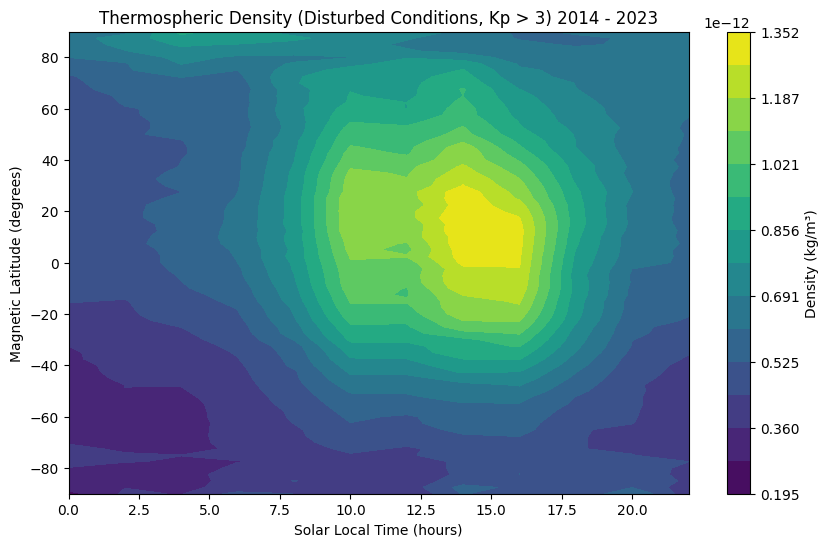

In [35]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS
from readGeomagIndices import readKpAp

# Directory where your NetCDF data files are located
data_dir = '/home/jose_ne/Documents/thermosphere/data/SAT_C/hgt453km'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Loop through each file and extract the data points with a progress bar
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))

        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

density = combined_ds['density_hgt453km']

# Define start and end dates
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs)) 
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')

# Read solar flux data
xr_f107_all = readSolarFluxCLS(start_date, end_date, 'adjusted', 'f10.7')
f107 = xr_f107_all['f10.7'].interp(time=combined_ds['time'], method='linear')

# Interpolate Kp index to match the combined dataset time
kp_values = kp_interp.values

# Classify geomagnetic conditions: quiet (Kp <= 3) and disturbed (Kp > 3)
quiet_cond = kp_values <= 3
disturbed_cond = kp_values > 3

# Get solar local time and magnetic latitude values
slt = combined_ds['solar_local_time'].values
latitude = combined_ds['qd_latitude'].values

# Define unique values for solar local time and latitude
unique_slt = np.unique(slt)
unique_lat = np.unique(latitude)

# Initialize arrays to hold averages for quiet and disturbed conditions
density_quiet = np.full((len(unique_lat), len(unique_slt)), np.nan)
density_disturbed = np.full((len(unique_lat), len(unique_slt)), np.nan)

# Iterate over latitude and solar local time to compute averages
for lat_idx, lat in enumerate(unique_lat):
    for slt_idx, slt_val in enumerate(unique_slt):
        # Select data for current latitude and solar local time
        selected_data = combined_ds.sel(qd_latitude=lat, solar_local_time=slt_val, method='nearest')
        
        # Get density values and apply conditions
        density_vals = selected_data['density_hgt453km'].values

        # Quiet conditions
        if np.any(quiet_cond):
            density_quiet[lat_idx, slt_idx] = np.nanmean(density_vals[quiet_cond])
        
        # Disturbed conditions
        if np.any(disturbed_cond):
            density_disturbed[lat_idx, slt_idx] = np.nanmean(density_vals[disturbed_cond])

# Get the combined min and max density values for both conditions
density_min = np.nanmin([density_quiet, density_disturbed])
density_max = np.nanmax([density_quiet, density_disturbed])

# Define common levels for both quiet and disturbed plots
levels = np.linspace(density_min, density_max, 15)

# Plot density for quiet conditions (using the same color range)
plt.figure(figsize=(10, 6))
cp1 = plt.contourf(unique_slt, unique_lat, density_quiet, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
plt.colorbar(cp1, label='Density (kg/m³)')
plt.title('Thermospheric Density (Quiet Conditions, Kp ≤ 3) 2014- 2023')
plt.xlabel('Solar Local Time (hours)')
plt.ylabel('Magnetic Latitude (degrees)')
plt.show()

# Plot density for disturbed conditions (using the same color range)
plt.figure(figsize=(10, 6))
cp2 = plt.contourf(unique_slt, unique_lat, density_disturbed, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
plt.colorbar(cp2, label='Density (kg/m³)')
plt.title('Thermospheric Density (Disturbed Conditions, Kp > 3) 2014 - 2023')
plt.xlabel('Solar Local Time (hours)')
plt.ylabel('Magnetic Latitude (degrees)')
plt.show()

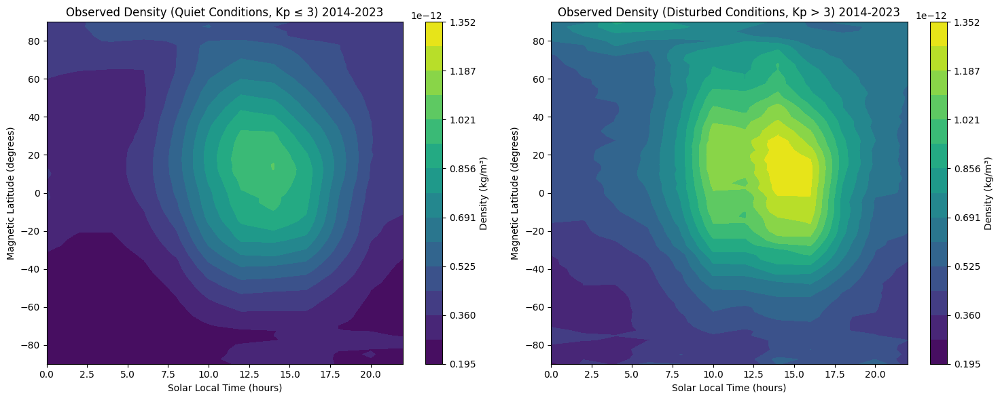

In [36]:
# Create a figure with two subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# Plot density for quiet conditions (subplot 1)
cp1 = axs[0].contourf(unique_slt, unique_lat, density_quiet, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
cbar1 = fig.colorbar(cp1, ax=axs[0], label='Density (kg/m³)')
axs[0].set_title('Observed Density (Quiet Conditions, Kp ≤ 3) 2014-2023')
axs[0].set_xlabel('Solar Local Time (hours)')
axs[0].set_ylabel('Magnetic Latitude (degrees)')

# Plot density for disturbed conditions (subplot 2)
cp2 = axs[1].contourf(unique_slt, unique_lat, density_disturbed, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
cbar2 = fig.colorbar(cp2, ax=axs[1], label='Density (kg/m³)')
axs[1].set_title('Observed Density (Disturbed Conditions, Kp > 3) 2014-2023')
axs[1].set_xlabel('Solar Local Time (hours)')
axs[1].set_ylabel('Magnetic Latitude (degrees)')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()


Min Kp: 0.0, Max Kp: 8.333
Number of Kp = 0.2 points: 9102
Number of Kp = 3.4 points: 1938


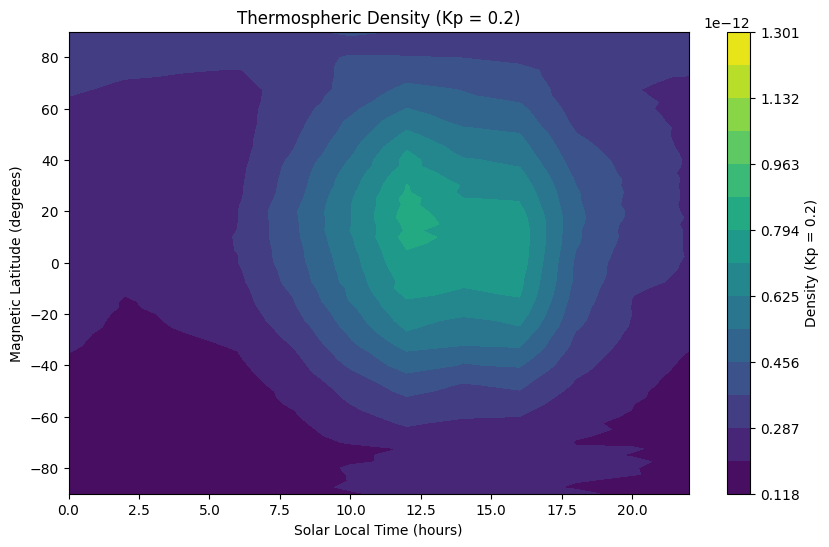

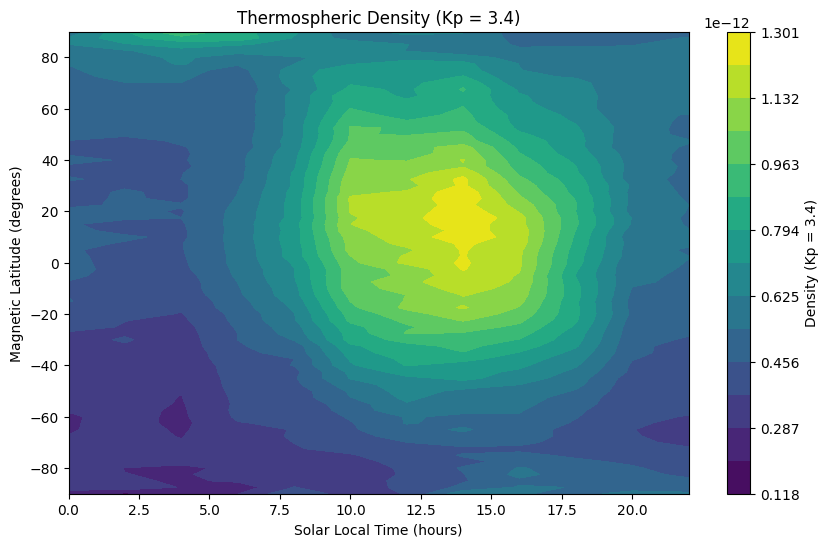

In [38]:
kp_values = kp_interp.values

# Check for the availability of Kp values around 0.2 and 3.4
print(f"Min Kp: {np.min(kp_values)}, Max Kp: {np.max(kp_values)}")

# Increase tolerance slightly if necessary
tolerance = 0.2

# Classify the Kp values for Kp = 0.2 and Kp = 3.4
kp_02_cond = np.isclose(kp_values, 0.2, atol=tolerance)
kp_34_cond = np.isclose(kp_values, 3.4, atol=tolerance)

# Debugging: Check how many Kp = 0.2 and Kp = 3.4 values we have
print(f"Number of Kp = 0.2 points: {np.sum(kp_02_cond)}")
print(f"Number of Kp = 3.4 points: {np.sum(kp_34_cond)}")

# If there are no values close to Kp = 0.2, warn the user and adjust the tolerance or Kp target
if np.sum(kp_02_cond) == 0:
    print("Warning: No Kp = 0.2 values found with the current tolerance.")
    print("Consider adjusting the tolerance or choosing another Kp value.")

# Get solar local time and magnetic latitude values
slt = combined_ds['solar_local_time'].values
latitude = combined_ds['qd_latitude'].values

# Define unique values for solar local time and latitude
unique_slt = np.unique(slt)
unique_lat = np.unique(latitude)

# Initialize arrays to hold averages for Kp = 0.2 and Kp = 3.4
density_kp_02 = np.full((len(unique_lat), len(unique_slt)), np.nan)
density_kp_34 = np.full((len(unique_lat), len(unique_slt)), np.nan)

# Iterate over latitude and solar local time to compute averages for specific Kp values
for lat_idx, lat in enumerate(unique_lat):
    for slt_idx, slt_val in enumerate(unique_slt):
        # Select data for current latitude and solar local time
        selected_data = combined_ds.sel(qd_latitude=lat, solar_local_time=slt_val, method='nearest')
        
        # Get density values and apply conditions
        density_vals = selected_data['density_hgt453km'].values

        # Kp = 0.2 condition
        if np.any(kp_02_cond):
            density_kp_02[lat_idx, slt_idx] = np.nanmean(density_vals[kp_02_cond])
        
        # Kp = 3.4 condition
        if np.any(kp_34_cond):
            density_kp_34[lat_idx, slt_idx] = np.nanmean(density_vals[kp_34_cond])

# Get the combined min and max density values for both conditions
density_min = np.nanmin([density_kp_02, density_kp_34])
density_max = np.nanmax([density_kp_02, density_kp_34])

# Define common levels for both Kp = 0.2 and Kp = 3.4 plots
levels = np.linspace(density_min, density_max, 15)

# Plot density for Kp = 0.2 (using the same color range)
plt.figure(figsize=(10, 6))
cp1 = plt.contourf(unique_slt, unique_lat, density_kp_02, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
plt.colorbar(cp1, label='Density (Kp = 0.2)')
plt.title('Thermospheric Density (Kp = 0.2)')
plt.xlabel('Solar Local Time (hours)')
plt.ylabel('Magnetic Latitude (degrees)')
plt.show()

# Plot density for Kp = 3.4 (using the same color range)
plt.figure(figsize=(10, 6))
cp2 = plt.contourf(unique_slt, unique_lat, density_kp_34, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
plt.colorbar(cp2, label='Density (Kp = 3.4)')
plt.title('Thermospheric Density (Kp = 3.4)')
plt.xlabel('Solar Local Time (hours)')
plt.ylabel('Magnetic Latitude (degrees)')
plt.show()

Min Kp: 0.0, Max Kp: 8.333
Number of Kp = 0.2 points: 9102
Number of Kp > 6 points: 136


/tmp/ipykernel_83/274284949.py:47: RuntimeWarning: Mean of empty slice
  density_kp_gt_6[lat_idx, slt_idx] = np.nanmean(density_vals[kp_gt_6_cond])


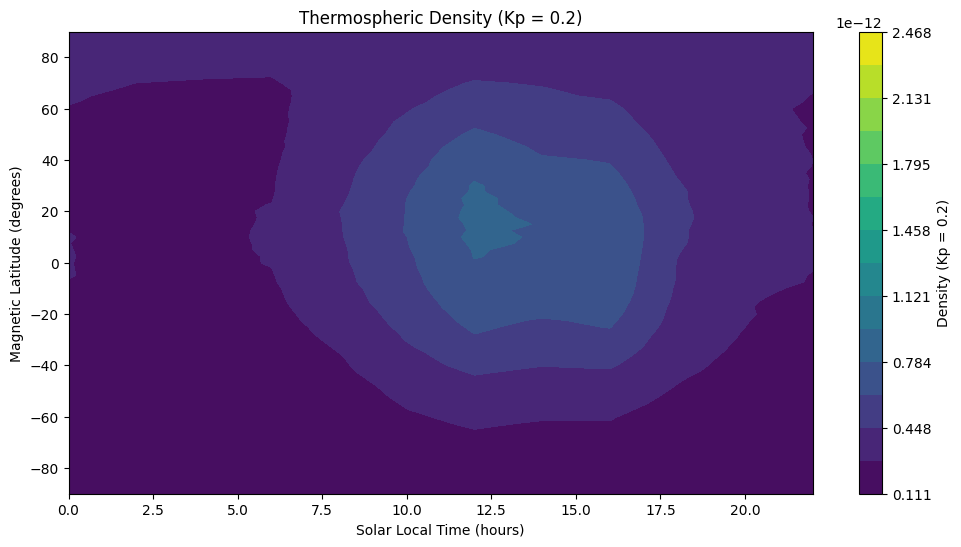

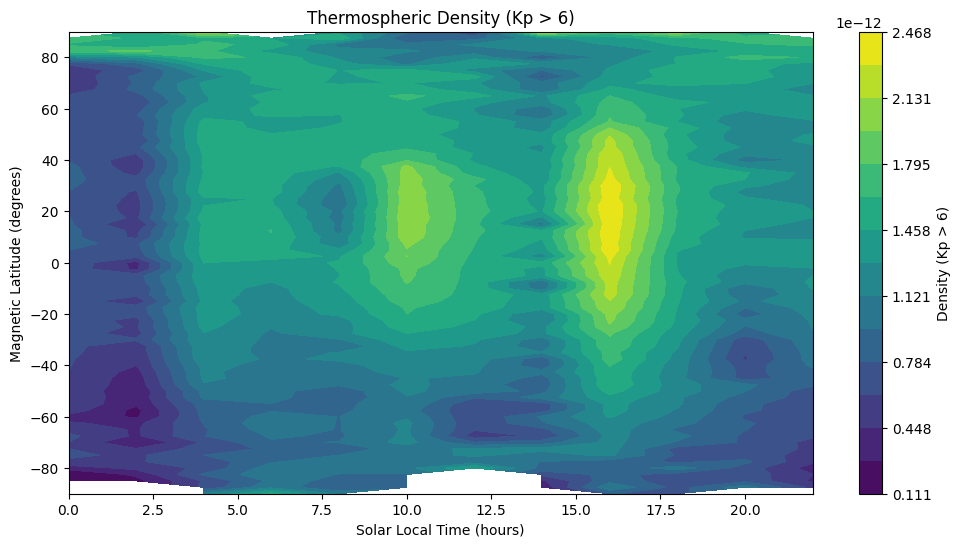

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming kp_values, combined_ds, and other variables are already defined

# Check for the availability of Kp values
print(f"Min Kp: {np.min(kp_values)}, Max Kp: {np.max(kp_values)}")

# Define tolerance for matching Kp values
tolerance = 0.2

# Classify the Kp values for Kp = 0.2 and Kp > 6
kp_02_cond = np.isclose(kp_values, 0.2, atol=tolerance)
kp_gt_6_cond = kp_values > 6

# Debugging: Check how many Kp = 0.2 and Kp > 6 values we have
print(f"Number of Kp = 0.2 points: {np.sum(kp_02_cond)}")
print(f"Number of Kp > 6 points: {np.sum(kp_gt_6_cond)}")

# Get solar local time and magnetic latitude values
slt = combined_ds['solar_local_time'].values
latitude = combined_ds['qd_latitude'].values

# Define unique values for solar local time and latitude
unique_slt = np.unique(slt)
unique_lat = np.unique(latitude)

# Initialize arrays to hold averages for Kp = 0.2 and Kp > 6
density_kp_02 = np.full((len(unique_lat), len(unique_slt)), np.nan)
density_kp_gt_6 = np.full((len(unique_lat), len(unique_slt)), np.nan)

# Iterate over latitude and solar local time to compute averages for specific Kp values
for lat_idx, lat in enumerate(unique_lat):
    for slt_idx, slt_val in enumerate(unique_slt):
        # Select data for current latitude and solar local time
        selected_data = combined_ds.sel(qd_latitude=lat, solar_local_time=slt_val, method='nearest')
        
        # Get density values and apply conditions
        density_vals = selected_data['density_hgt453km'].values

        # Kp = 0.2 condition
        if np.any(kp_02_cond):
            density_kp_02[lat_idx, slt_idx] = np.nanmean(density_vals[kp_02_cond])
        
        # Kp > 6 condition
        if np.any(kp_gt_6_cond):
            density_kp_gt_6[lat_idx, slt_idx] = np.nanmean(density_vals[kp_gt_6_cond])

# Get the combined min and max density values for both conditions
density_min = np.nanmin([density_kp_02, density_kp_gt_6])
density_max = np.nanmax([density_kp_02, density_kp_gt_6])

# Define common levels for both plots
levels = np.linspace(density_min, density_max, 15)

# Plot density for Kp = 0.2 (using the same color range)
plt.figure(figsize=(12, 6))
cp1 = plt.contourf(unique_slt, unique_lat, density_kp_02, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
plt.colorbar(cp1, label='Density (Kp = 0.2)')
plt.title('Thermospheric Density (Kp = 0.2)')
plt.xlabel('Solar Local Time (hours)')
plt.ylabel('Magnetic Latitude (degrees)')
plt.show()

# Plot density for Kp > 6 (using the same color range)
plt.figure(figsize=(12, 6))
cp2 = plt.contourf(unique_slt, unique_lat, density_kp_gt_6, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
plt.colorbar(cp2, label='Density (Kp > 6)')
plt.title('Thermospheric Density (Kp > 6)')
plt.xlabel('Solar Local Time (hours)')
plt.ylabel('Magnetic Latitude (degrees)')
plt.show()


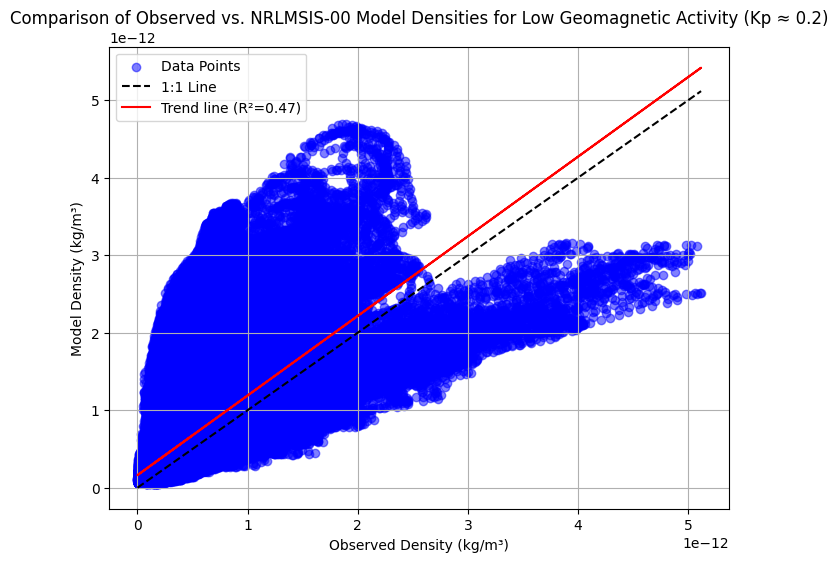

Bias (Model - Observation): 1.7143e-13
RMSE: 4.2250e-13
R²: 0.4702


In [7]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.stats import linregress

# Load the necessary Kp data and observations
kp_values = kp_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 0.2)
tolerance = 0.2
low_kp_condition = np.isclose(kp_values, 0.2, atol=tolerance)

# Get observed and model densities
observed_density = combined_ds['density_hgt453km'].values
model_density = combined_ds['msis_density_hgt453km'].values

# Filter data where Kp is low
observed_low_kp = observed_density[low_kp_condition]
model_low_kp = model_density[low_kp_condition]

# Remove any NaN values in the filtered data
valid_idx = np.isfinite(observed_low_kp) & np.isfinite(model_low_kp)
observed_low_kp = observed_low_kp[valid_idx]
model_low_kp = model_low_kp[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_kp, model_low_kp, alpha=0.5, label='Data Points', color='b')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_kp), np.max(model_low_kp))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_kp, model_low_kp)
plt.plot(observed_low_kp, intercept + slope * observed_low_kp, 'r-', label=f'Trend line (R²={r_value**2:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities for Low Geomagnetic Activity (Kp ≈ 0.2)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_kp - observed_low_kp)
rmse = np.sqrt(np.mean((model_low_kp - observed_low_kp) ** 2))

print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"R²: {r_value**2:.4f}")


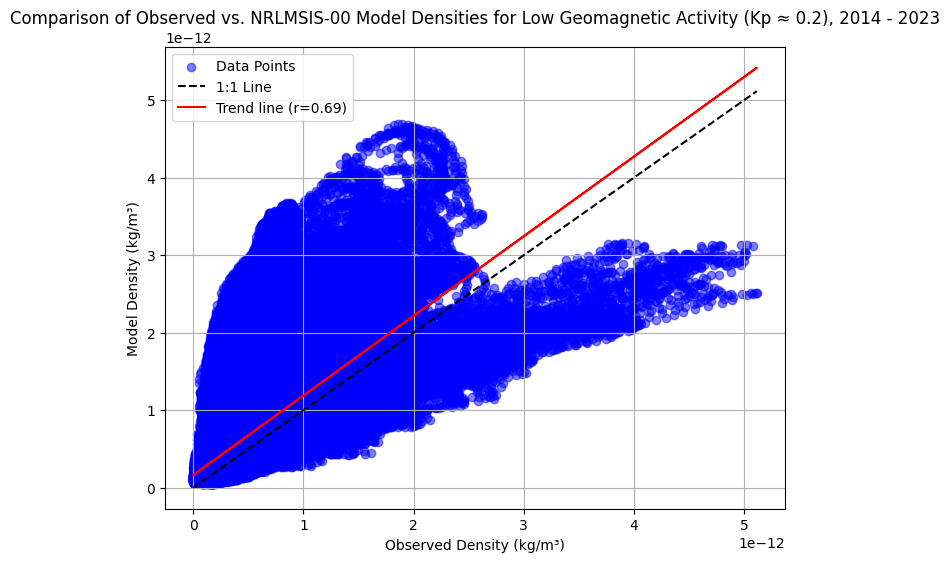

Bias (Model - Observation): 1.7143e-13
RMSE: 4.2250e-13
Correlation coefficient (r): 0.6857


In [37]:
# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_kp, model_low_kp, alpha=0.5, label='Data Points', color='b')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_kp), np.max(model_low_kp))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_kp, model_low_kp)
plt.plot(observed_low_kp, intercept + slope * observed_low_kp, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities for Low Geomagnetic Activity (Kp ≈ 0.2), 2014 - 2023')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_kp - observed_low_kp)
rmse = np.sqrt(np.mean((model_low_kp - observed_low_kp) ** 2))

# Print correlation coefficient r, not r^2
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")


Processing files: 100%|██████████| 3213/3213 [00:46<00:00, 69.74it/s]
/opt/conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


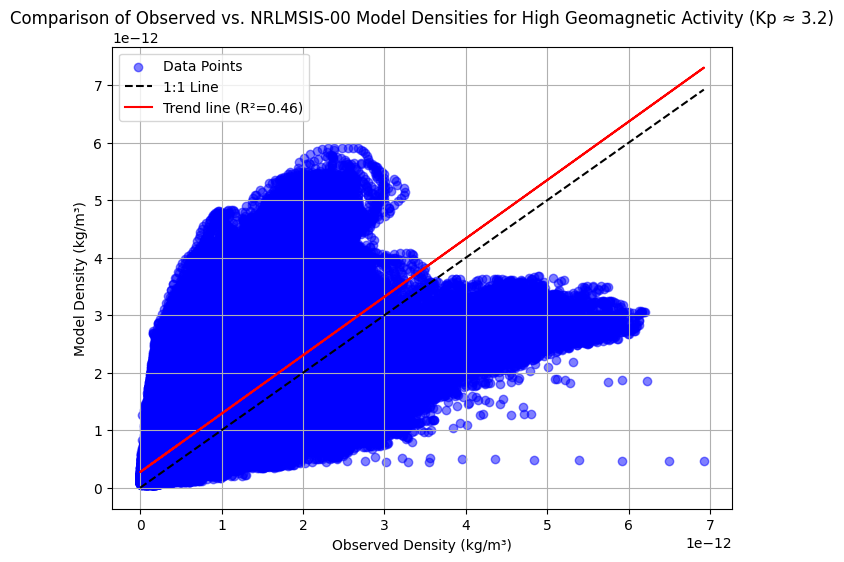

Bias (Model - Observation): 2.7971e-13
RMSE: 5.9292e-13
R²: 0.4615


In [6]:

import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS
from readGeomagIndices import readKpAp

# Directory where your NetCDF data files are located
data_dir = '/home/jose_ne/Documents/thermosphere/data/SAT_C/hgt453km'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Loop through each file and extract the data points with a progress bar
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))

        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

density = combined_ds['density_hgt453km']
# Define start and end dates
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs)) 
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')
# Load the necessary Kp data and observations
kp_values = kp_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 3.2)
tolerance = 3.2
high_kp_condition = np.isclose(kp_values, 3.2, atol=tolerance)

# Get observed and model densities
observed_density = combined_ds['density_hgt453km'].values
model_density = combined_ds['msis_density_hgt453km'].values

# Filter data where Kp is low
observed_high_kp = observed_density[high_kp_condition]
model_high_kp = model_density[high_kp_condition]

# Remove any NaN values in the filtered data
valid_idx = np.isfinite(observed_high_kp) & np.isfinite(model_high_kp)
observed_high_kp = observed_high_kp[valid_idx]
model_high_kp = model_high_kp[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_high_kp, model_high_kp, alpha=0.5, label='Data Points', color='b')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_high_kp), np.max(model_high_kp))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_high_kp, model_high_kp)
plt.plot(observed_high_kp, intercept + slope * observed_high_kp, 'r-', label=f'Trend line (R²={r_value**2:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities for High Geomagnetic Activity (Kp ≈ 3.2)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_high_kp - observed_high_kp)
rmse = np.sqrt(np.mean((model_high_kp - observed_high_kp) ** 2))

print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"R²: {r_value**2:.4f}")


/opt/conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


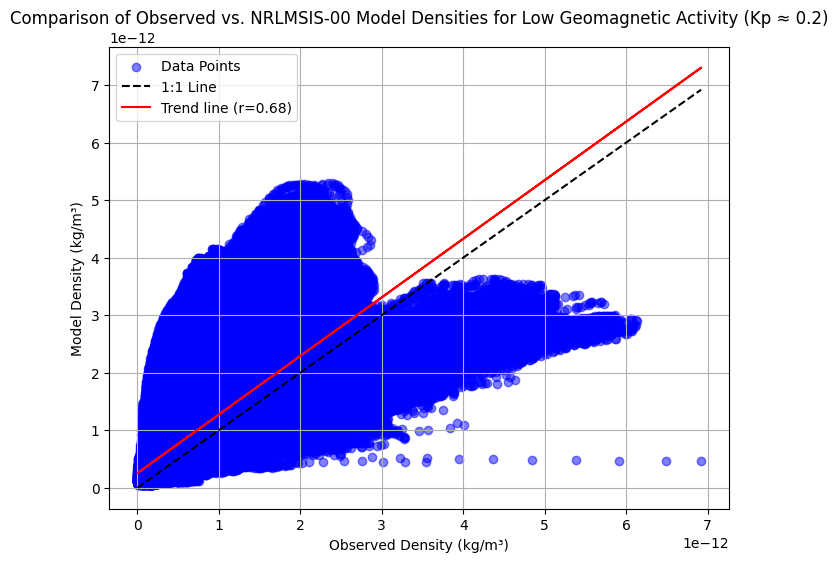

Bias (Model - Observation): 2.6288e-13
RMSE: 5.6631e-13
Correlation coefficient (r): 0.6810


In [8]:
# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs)) 
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')
# Load the necessary Kp data and observations
kp_values = kp_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 0.2)
tolerance = 0.2
high_kp_condition = np.isclose(kp_values, 0.2, atol=tolerance)

# Get observed and model densities
observed_density = combined_ds['density_hgt453km'].values
model_density = combined_ds['msis_density_hgt453km'].values

# Filter data where Kp is low
observed_high_kp = observed_density[high_kp_condition]
model_high_kp = model_density[high_kp_condition]

# Remove any NaN values in the filtered data
valid_idx = np.isfinite(observed_high_kp) & np.isfinite(model_high_kp)
observed_high_kp = observed_high_kp[valid_idx]
model_high_kp = model_high_kp[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_kp, model_low_kp, alpha=0.5, label='Data Points', color='b')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_kp), np.max(model_low_kp))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_kp, model_low_kp)
plt.plot(observed_low_kp, intercept + slope * observed_low_kp, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities for Low Geomagnetic Activity (Kp ≈ 0.2)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_kp - observed_low_kp)
rmse = np.sqrt(np.mean((model_low_kp - observed_low_kp) ** 2))

# Print correlation coefficient r, not r^2
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")

Processing files: 100%|██████████| 3213/3213 [02:40<00:00, 19.97it/s]
/opt/conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


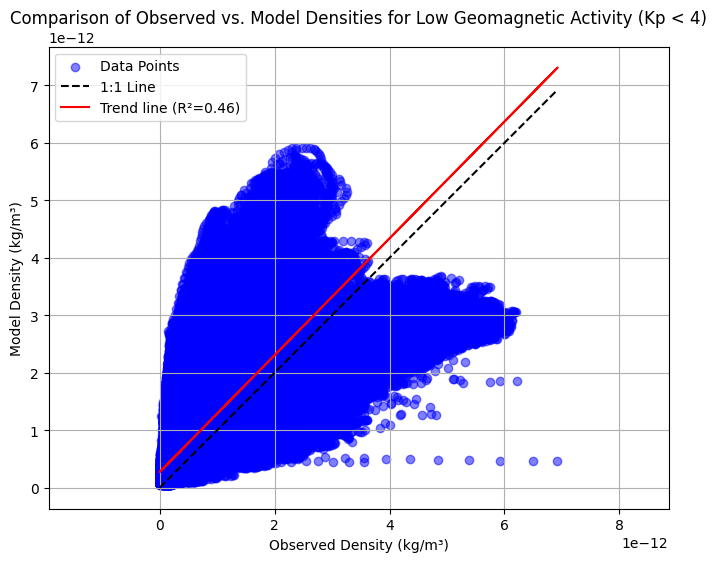

Bias (Model - Observation): 2.8002e-13
RMSE: 5.9355e-13
R²: 0.4629


In [8]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
from scipy.stats import linregress  # For linear regression

# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS
from readGeomagIndices import readKpAp

# Directory where your NetCDF data files are located
data_dir = '/home/jose_ne/Documents/thermosphere/data/SAT_C/hgt453km'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Loop through each file and extract the data points with a progress bar
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))

        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

# Get density data
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']  # Replace with the actual model density variable if different

# Define start and end dates
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')

# Load the necessary Kp data and observations
kp_values = kp_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 3.2)
tolerance = 4  # Adjust tolerance as needed
low_kp_condition = kp_values < 4 + tolerance

# Filter data where Kp is low
observed_low_kp = density.values[low_kp_condition]
model_low_kp = model_density.values[low_kp_condition]

# Remove any NaN values in the filtered data
valid_idx = np.isfinite(observed_low_kp) & np.isfinite(model_low_kp)
observed_low_kp = observed_low_kp[valid_idx]
model_low_kp = model_low_kp[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_kp, model_low_kp, alpha=0.5, label='Data Points', color='blue')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_kp), np.max(model_low_kp))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_kp, model_low_kp)
plt.plot(observed_low_kp, intercept + slope * observed_low_kp, 'r-', label=f'Trend line (R²={r_value**2:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. Model Densities for Low Geomagnetic Activity (Kp < 4)')
plt.legend()

# Show the plot
plt.grid(True)
plt.axis('equal')  # To ensure equal scaling
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_kp - observed_low_kp)
rmse = np.sqrt(np.mean((model_low_kp - observed_low_kp) ** 2))

print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"R²: {r_value**2:.4f}")


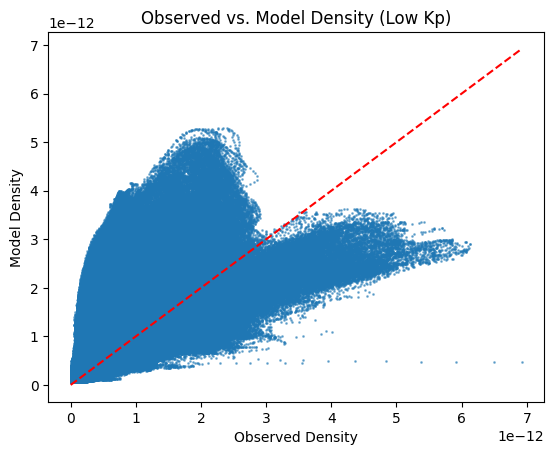

In [11]:
import matplotlib.pyplot as plt

# Create the scatter plot
plt.scatter(observed_low_kp, model_low_kp, s=1, alpha=0.5)

# Add labels and a title
plt.xlabel('Observed Density')
plt.ylabel('Model Density')
plt.title('Observed vs. Model Density (Low Kp)')

# Add a diagonal line for reference
plt.plot([0, max(observed_low_kp)], [0, max(observed_low_kp)], color='red', linestyle='--')

# Show the plot
plt.show()

/opt/conda/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


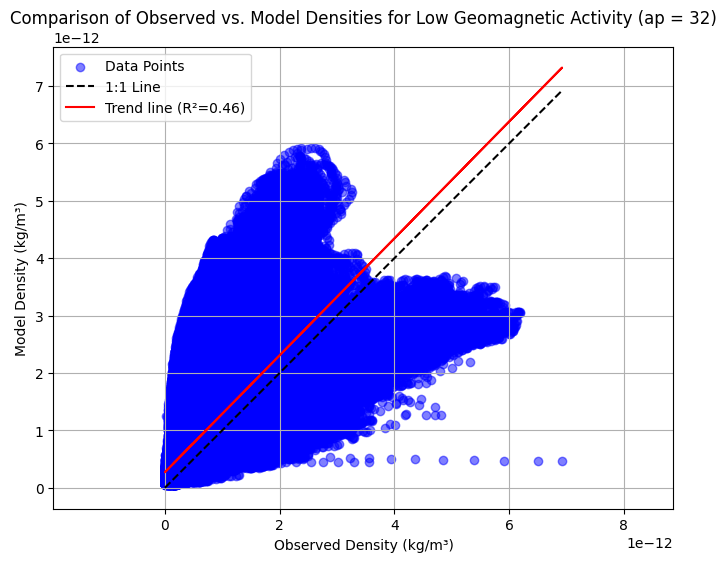

Bias (Model - Observation): 2.7879e-13
RMSE: 5.9049e-13
R²: 0.4625


In [14]:
# Get density data
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']  # Replace with the actual model density variable if different

# Define start and end dates
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
ap_ds = readKpAp(start_date, end_date, 'ap', int(fs))
ap_interp = ap_ds.interp(UT=combined_ds['time'], method='linear')

# Load the necessary Kp data and observations
ap_values = ap_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 3.2)
tolerance = 32  # Adjust tolerance as needed
low_ap_condition = np.isclose(ap_values, 32, atol=tolerance)

# Filter data where Kp is low
observed_low_ap = density.values[low_ap_condition]
model_low_ap = model_density.values[low_ap_condition]

# Remove any NaN values in the filtered data
valid_idx = np.isfinite(observed_low_ap) & np.isfinite(model_low_ap)
observed_low_ap = observed_low_ap[valid_idx]
model_low_ap = model_low_ap[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_ap, model_low_ap, alpha=0.5, label='Data Points', color='blue')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_ap), np.max(model_low_ap))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_ap, model_low_ap)
plt.plot(observed_low_ap, intercept + slope * observed_low_ap, 'r-', label=f'Trend line (R²={r_value**2:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. Model Densities for Low Geomagnetic Activity (ap = 32)')
plt.legend()

# Show the plot
plt.grid(True)
plt.axis('equal')  # To ensure equal scaling
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_ap - observed_low_ap)
rmse = np.sqrt(np.mean((model_low_ap - observed_low_ap) ** 2))

print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"R²: {r_value**2:.4f}")

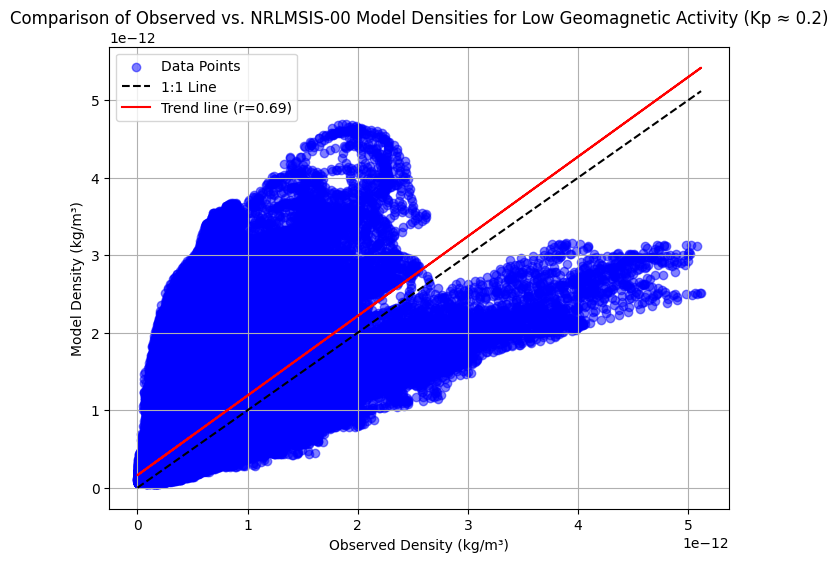

Bias (Model - Observation): 1.7143e-13
RMSE: 4.2250e-13
Correlation coefficient (r): 0.6857


In [10]:
import matplotlib.pyplot as plt

# Get density data
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km'] 
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')

# Load the necessary Kp data and observations
kp_values = kp_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 3.2)
tolerance = 0.2  # Adjust tolerance as needed
low_kp_condition = kp_values < 0.2 + tolerance

# Filter data where Kp is low
observed_low_kp = density.values[low_kp_condition]
model_low_kp = model_density.values[low_kp_condition]

# Remove any NaN values in the filtered data
valid_idx = np.isfinite(observed_low_kp) & np.isfinite(model_low_kp)
observed_low_kp = observed_low_kp[valid_idx]
model_low_kp = model_low_kp[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_kp, model_low_kp, alpha=0.5, label='Data Points', color='blue')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_kp), np.max(model_low_kp))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_kp, model_low_kp)
plt.plot(observed_low_kp, intercept + slope * observed_low_kp, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities for Low Geomagnetic Activity (Kp ≈ 0.2)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_kp - observed_low_kp)
rmse = np.sqrt(np.mean((model_low_kp - observed_low_kp) ** 2))

# Print correlation coefficient r, not r^2
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")


Processing files: 100%|██████████| 6300/6300 [00:55<00:00, 114.16it/s]  


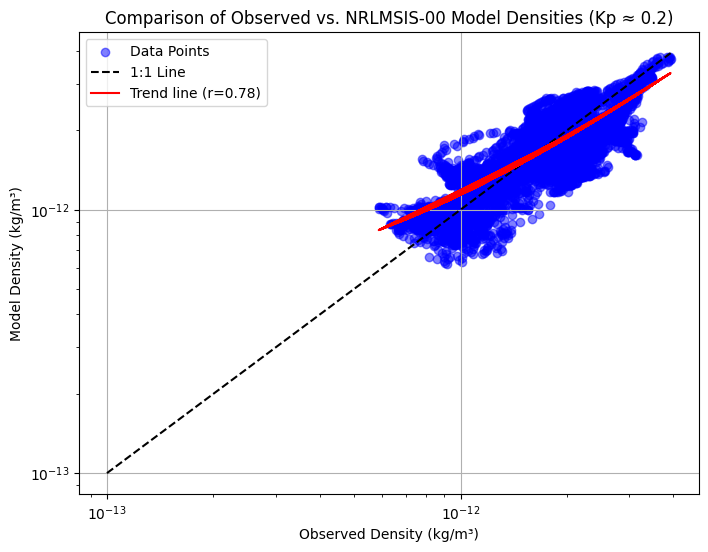

Bias (Model - Observation): -5.1479e-14
RMSE: 3.4025e-13
Correlation coefficient (r): 0.7844


In [61]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS
from readGeomagIndices import readKpAp
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'
from scipy.stats import linregress

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Loop through each file and extract the data points with a progress bar
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('fs16.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))

        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

density = combined_ds['density_hgt453km']
# Define start and end dates
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs)) 
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')
# Load the necessary Kp data and observations
kp_values = kp_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 0.2)
tolerance = 0.2
low_kp_condition = np.isclose(kp_values, 0.2, atol=tolerance)

# Get observed and model densities
observed_density = combined_ds['density_hgt453km'].values
model_density = combined_ds['msis_density_hgt453km'].values

# Filter data where Kp is low
observed_low_kp = observed_density[low_kp_condition]
model_low_kp = model_density[low_kp_condition]
# Remove NaN values and filter data within thresholds
valid_idx = np.isfinite(observed_low_kp) & np.isfinite(model_low_kp)
observed_low_kp = observed_low_kp[valid_idx]
model_low_kp = model_low_kp[valid_idx]

# Apply density thresholds to remove outliers
lower_threshold = 1e-13
upper_threshold = 1e-11
valid_data = (observed_low_kp > lower_threshold) & (observed_low_kp < upper_threshold) & (model_low_kp > lower_threshold) & (model_low_kp < upper_threshold)

observed_low_kp_filtered = observed_low_kp[valid_data]
model_low_kp_filtered = model_low_kp[valid_data]

# Scatter plot with logarithmic scale
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_kp_filtered, model_low_kp_filtered, alpha=0.5, label='Data Points', color='b')

# Logarithmic scale
plt.xscale('log')
plt.yscale('log')

# 1:1 reference line
max_density = max(np.max(observed_low_kp_filtered), np.max(model_low_kp_filtered))
plt.plot([1e-13, max_density], [1e-13, max_density], 'k--', label='1:1 Line')

# Linear regression
slope, intercept, r_value, _, _ = linregress(observed_low_kp_filtered, model_low_kp_filtered)
plt.plot(observed_low_kp_filtered, intercept + slope * observed_low_kp_filtered, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities (Kp ≈ 0.2)')
plt.legend()

# Show plot
plt.grid(True)
plt.show()

# Statistical metrics
bias = np.mean(model_low_kp_filtered - observed_low_kp_filtered)
rmse = np.sqrt(np.mean((model_low_kp_filtered - observed_low_kp_filtered) ** 2))

# Print metrics including correlation coefficient r
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")



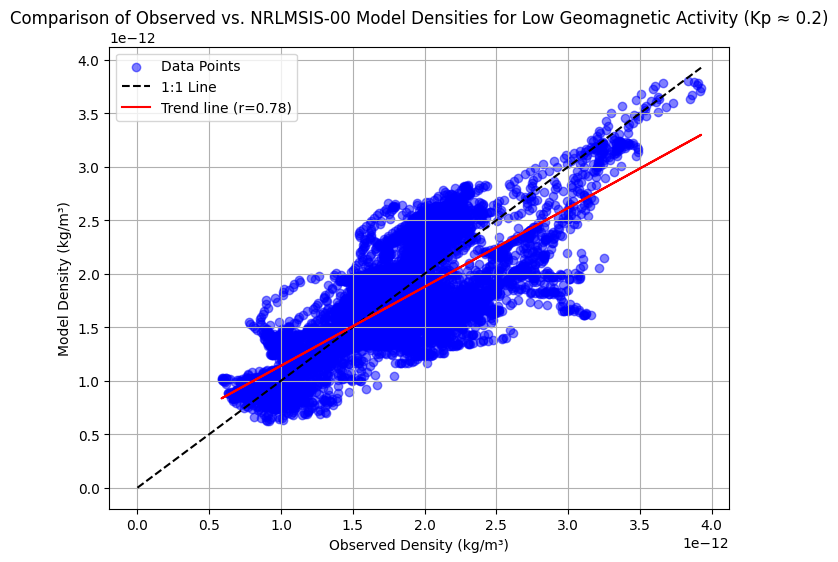

Bias (Model - Observation): -5.1479e-14
RMSE: 3.4025e-13
Correlation coefficient (r): 0.7844


In [62]:
import matplotlib.pyplot as plt

# Get density data
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km'] 
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')

# Load the necessary Kp data and observations
kp_values = kp_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 3.2)
tolerance = 0.2  # Adjust tolerance as needed
low_kp_condition = kp_values < 0.2 + tolerance

# Filter data where Kp is low
observed_low_kp = density.values[low_kp_condition]
model_low_kp = model_density.values[low_kp_condition]

# Remove any NaN values in the filtered data
valid_idx = np.isfinite(observed_low_kp) & np.isfinite(model_low_kp)
observed_low_kp = observed_low_kp[valid_idx]
model_low_kp = model_low_kp[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_kp, model_low_kp, alpha=0.5, label='Data Points', color='blue')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_kp), np.max(model_low_kp))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_kp, model_low_kp)
plt.plot(observed_low_kp, intercept + slope * observed_low_kp, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities for Low Geomagnetic Activity (Kp ≈ 0.2)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_kp - observed_low_kp)
rmse = np.sqrt(np.mean((model_low_kp - observed_low_kp) ** 2))

# Print correlation coefficient r, not r^2
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")


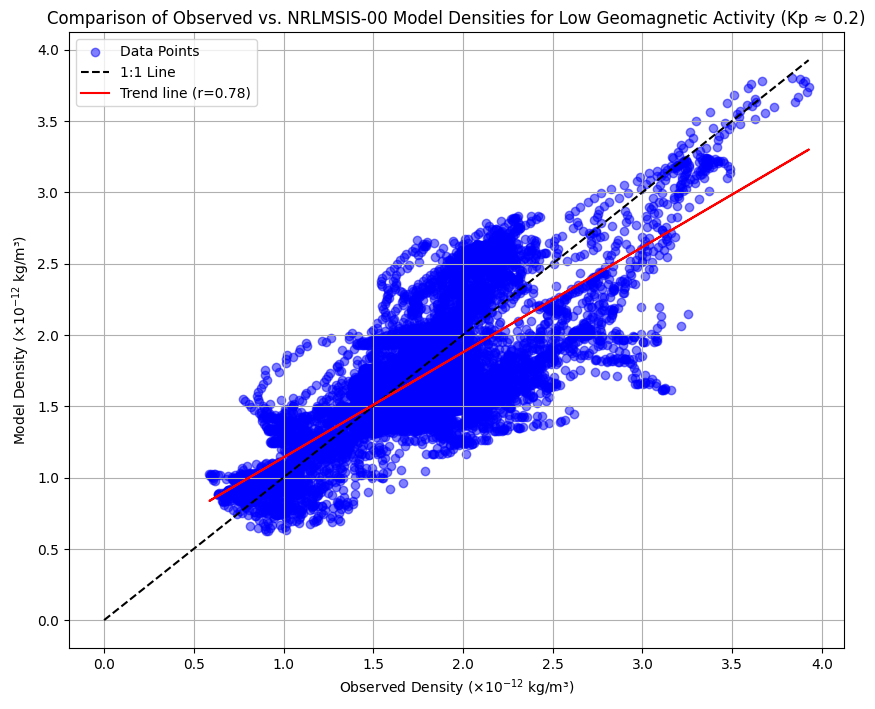

Bias (Model - Observation): -5.1479e-02 (10^-12 kg/m³)
RMSE: 3.4025e-01 (10^-12 kg/m³)
Correlation coefficient (r): 0.7844


In [64]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import linregress
import datetime

# Assuming combined_ds, readKpAp, and necessary data imports are already set up
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km'] 
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # Results in 16 samples per day

# Get interpolated Kp data
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')
kp_values = kp_interp.values

# Define low geomagnetic activity condition
tolerance = 0.2  # Adjust tolerance as needed
low_kp_condition = kp_values < 0.2 + tolerance

# Filter data where Kp is low and remove NaNs
observed_low_kp = density.values[low_kp_condition]
model_low_kp = model_density.values[low_kp_condition]
valid_idx = np.isfinite(observed_low_kp) & np.isfinite(model_low_kp)
observed_low_kp = observed_low_kp[valid_idx]
model_low_kp = model_low_kp[valid_idx]

# Step 1: Convert densities to units of 10^-12 kg/m³
observed_low_kp_scaled = observed_low_kp * 1e12
model_low_kp_scaled = model_low_kp * 1e12

# Step 2: Plot
plt.figure(figsize=(10, 8))
plt.scatter(observed_low_kp_scaled, model_low_kp_scaled, alpha=0.5, label='Data Points', color='blue')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_kp_scaled), np.max(model_low_kp_scaled))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_kp_scaled, model_low_kp_scaled)
plt.plot(observed_low_kp_scaled, intercept + slope * observed_low_kp_scaled, 'r-', label=f'Trend line (r={r_value:.2f})')

# Set axis labels with units in 10^-12 kg/m³
plt.xlabel('Observed Density ($\\times 10^{-12}$ kg/m³)')
plt.ylabel('Model Density ($\\times 10^{-12}$ kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities for Low Geomagnetic Activity (Kp ≈ 0.2)')

# Adjust tick marks to focus on density range
plt.xticks(np.arange(0, max_density + 0.5, 0.5))
plt.yticks(np.arange(0, max_density + 0.5, 0.5))

# Add legend and grid for clarity
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_kp_scaled - observed_low_kp_scaled)
rmse = np.sqrt(np.mean((model_low_kp_scaled - observed_low_kp_scaled) ** 2))

print(f"Bias (Model - Observation): {bias:.4e} (10^-12 kg/m³)")
print(f"RMSE: {rmse:.4e} (10^-12 kg/m³)")
print(f"Correlation coefficient (r): {r_value:.4f}")


Processing files: 100%|██████████| 6300/6300 [00:57<00:00, 110.07it/s]  


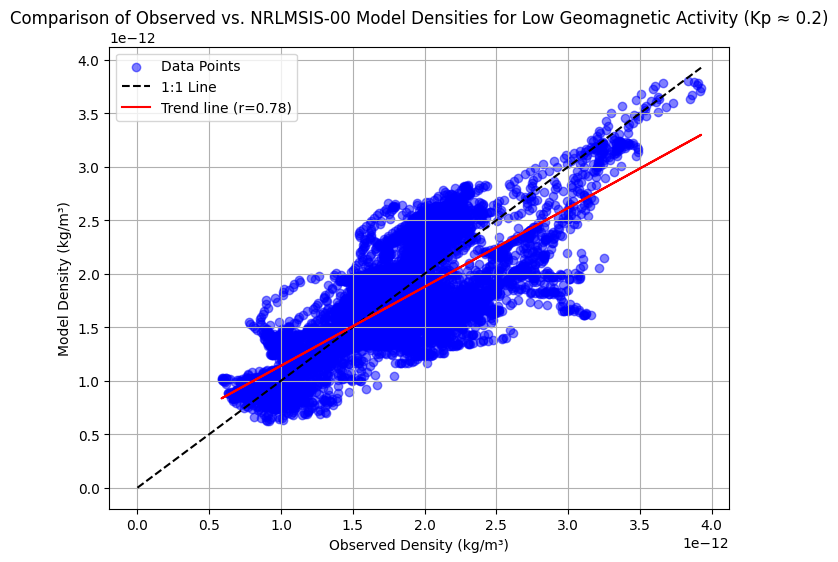

Bias (Model - Observation): -5.1479e-14
RMSE: 3.4025e-13
Correlation coefficient (r): 0.7844


In [2]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS
from readGeomagIndices import readKpAp
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'
from scipy.stats import linregress

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Loop through each file and extract the data points with a progress bar
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('fs16.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))

        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')


# Get density data
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km'] 
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')

# Load the necessary Kp data and observations
kp_values = kp_interp.values  # Assuming this holds the interpolated Kp data

# Define low geomagnetic activity (Kp ~ 3.2)
tolerance = 0.2  # Adjust tolerance as needed
low_kp_condition = kp_values < 0.2 + tolerance

# Filter data where Kp is low
observed_low_kp = density.values[low_kp_condition]
model_low_kp = model_density.values[low_kp_condition]

# Remove any NaN values in the filtered data
valid_idx = np.isfinite(observed_low_kp) & np.isfinite(model_low_kp)
observed_low_kp = observed_low_kp[valid_idx]
model_low_kp = model_low_kp[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_low_kp, model_low_kp, alpha=0.5, label='Data Points', color='blue')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_low_kp), np.max(model_low_kp))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_low_kp, model_low_kp)
plt.plot(observed_low_kp, intercept + slope * observed_low_kp, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Comparison of Observed vs. NRLMSIS-00 Model Densities for Low Geomagnetic Activity (Kp ≈ 0.2)')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_low_kp - observed_low_kp)
rmse = np.sqrt(np.mean((model_low_kp - observed_low_kp) ** 2))

# Print correlation coefficient r, not r^2
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")

In [2]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS
from readGeomagIndices import readKpAp
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'
from scipy.stats import linregress

# Define data directory and load necessary parameters
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Load each NetCDF file and extract data points
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('fs16.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))
        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

# Get density data from combined dataset
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))

# Read Kp data
fs = 24 // 1.5  # Sampling frequency: 16 samples per day (90-minute intervals)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')
kp_values = kp_interp.values  # Interpolated Kp data

# Define the low Kp condition
tolerance = 0.2
low_kp_condition = kp_values < 0.2 + tolerance

# Filter density data where Kp is low
density_low_kp = density.where(low_kp_condition, drop=True)
model_density_low_kp = model_density.where(low_kp_condition, drop=True)

# Get grid coordinates
qd_latitude = combined_ds['qd_latitude'].values
solar_local_time = combined_ds['solar_local_time'].values

# Initialize arrays for Bias, RMSE, and Correlation for each grid point
bias_grid = np.empty((len(qd_latitude), len(solar_local_time)))
rmse_grid = np.empty((len(qd_latitude), len(solar_local_time)))
correlation_grid = np.empty((len(qd_latitude), len(solar_local_time)))

# Loop through each grid point in latitude and solar local time
for i, lat in enumerate(qd_latitude):
    for j, slt in enumerate(solar_local_time):
        # Get observed and model densities for the current grid point
        observed_values = density_low_kp[:, i, j].values
        model_values = model_density_low_kp[:, i, j].values

        # Remove NaN values
        valid_idx = np.isfinite(observed_values) & np.isfinite(model_values)
        observed_values = observed_values[valid_idx]
        model_values = model_values[valid_idx]

        # Compute Bias, RMSE, and Correlation if there are valid data points
        if len(observed_values) > 0:
            bias_grid[i, j] = np.mean(model_values - observed_values)
            rmse_grid[i, j] = np.sqrt(np.mean((model_values - observed_values) ** 2))
            slope, intercept, r_value, _, _ = linregress(observed_values, model_values)
            correlation_grid[i, j] = r_value  # Store correlation coefficient (r)
        else:
            bias_grid[i, j] = np.nan
            rmse_grid[i, j] = np.nan
            correlation_grid[i, j] = np.nan

# Plotting Bias, RMSE, and Correlation maps
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

# Plot Bias map
c1 = axes[0].pcolormesh(solar_local_time, qd_latitude, bias_grid, shading='auto', cmap='coolwarm')
fig.colorbar(c1, ax=axes[0], label='Bias (Model - Observation) (kg/m³)')
axes[0].set_title('Bias')
axes[0].set_xlabel('Solar Local Time (hours)')
axes[0].set_ylabel('Magnetic Latitude (°)')

# Plot RMSE map
c2 = axes[1].pcolormesh(solar_local_time, qd_latitude, rmse_grid, shading='auto', cmap='viridis')
fig.colorbar(c2, ax=axes[1], label='RMSE (kg/m³)')
axes[1].set_title('RMSE')
axes[1].set_xlabel('Solar Local Time (hours)')
axes[1].set_ylabel('Magnetic Latitude (°)')

# Plot Correlation map
c3 = axes[2].pcolormesh(solar_local_time, qd_latitude, correlation_grid, shading='auto', cmap='coolwarm')
fig.colorbar(c3, ax=axes[2], label='Correlation (r)')
axes[2].set_title('Correlation')
axes[2].set_xlabel('Solar Local Time (hours)')
axes[2].set_ylabel('Magnetic Latitude (°)')

# Show the plots
plt.show()


Processing files: 100%|██████████| 6753/6753 [01:03<00:00, 105.87it/s]  


TypeError: cond argument is array([False, False, False, ..., False, False, False]) but must be a <class 'xarray.core.dataset.Dataset'> or <class 'xarray.core.dataarray.DataArray'> (or a callable than returns one).

/home/jose_ne/.local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10919: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/home/jose_ne/.local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10933: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/home/jose_ne/.local/lib/python3.11/site-packages/scipy/stats/_stats_py.py:10936: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


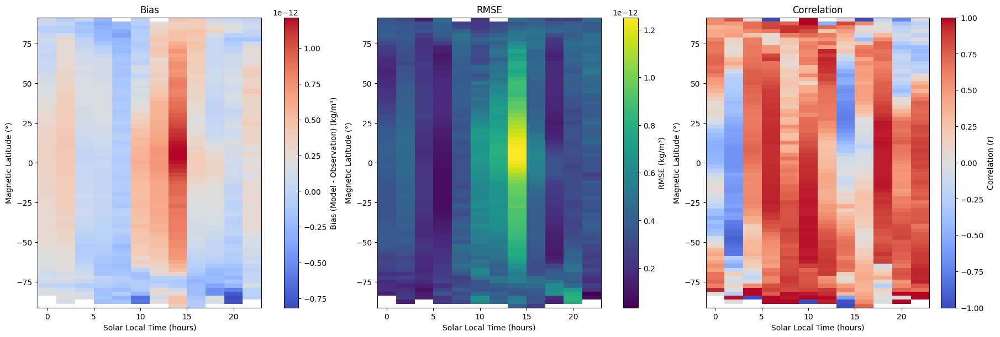

In [3]:


# Get density data from combined dataset
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))

# Read Kp data
fs = 24 // 1.5  # Sampling frequency: 16 samples per day (90-minute intervals)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')
kp_values = kp_interp.values  # Interpolated Kp data

# Convert kp_values to an xarray DataArray with the same dimensions as density
kp_condition = xr.DataArray(
    kp_values < 0.2 + tolerance,
    dims=["time"],
    coords={"time": combined_ds["time"]}
)

# Filter density data where Kp is low
density_low_kp = density.where(kp_condition, drop=True)
model_density_low_kp = model_density.where(kp_condition, drop=True)

# Get grid coordinates
qd_latitude = combined_ds['qd_latitude'].values
solar_local_time = combined_ds['solar_local_time'].values

# Initialize arrays for Bias, RMSE, and Correlation for each grid point
bias_grid = np.empty((len(qd_latitude), len(solar_local_time)))
rmse_grid = np.empty((len(qd_latitude), len(solar_local_time)))
correlation_grid = np.empty((len(qd_latitude), len(solar_local_time)))

# Loop through each grid point in latitude and solar local time
for i, lat in enumerate(qd_latitude):
    for j, slt in enumerate(solar_local_time):
        # Get observed and model densities for the current grid point
        observed_values = density_low_kp[:, i, j].values
        model_values = model_density_low_kp[:, i, j].values

        # Remove NaN values
        valid_idx = np.isfinite(observed_values) & np.isfinite(model_values)
        observed_values = observed_values[valid_idx]
        model_values = model_values[valid_idx]

        # Compute Bias, RMSE, and Correlation if there are valid data points
        if len(observed_values) > 0:
            bias_grid[i, j] = np.mean(model_values - observed_values)
            rmse_grid[i, j] = np.sqrt(np.mean((model_values - observed_values) ** 2))
            slope, intercept, r_value, _, _ = linregress(observed_values, model_values)
            correlation_grid[i, j] = r_value  # Store correlation coefficient (r)
        else:
            bias_grid[i, j] = np.nan
            rmse_grid[i, j] = np.nan
            correlation_grid[i, j] = np.nan

# Plotting Bias, RMSE, and Correlation maps
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

# Plot Bias map
c1 = axes[0].pcolormesh(solar_local_time, qd_latitude, bias_grid, shading='auto', cmap='coolwarm')
fig.colorbar(c1, ax=axes[0], label='Bias (Model - Observation) (kg/m³)')
axes[0].set_title('Bias')
axes[0].set_xlabel('Solar Local Time (hours)')
axes[0].set_ylabel('Magnetic Latitude (°)')

# Plot RMSE map
c2 = axes[1].pcolormesh(solar_local_time, qd_latitude, rmse_grid, shading='auto', cmap='viridis')
fig.colorbar(c2, ax=axes[1], label='RMSE (kg/m³)')
axes[1].set_title('RMSE')
axes[1].set_xlabel('Solar Local Time (hours)')
axes[1].set_ylabel('Magnetic Latitude (°)')

# Plot Correlation map
c3 = axes[2].pcolormesh(solar_local_time, qd_latitude, correlation_grid, shading='auto', cmap='coolwarm')
fig.colorbar(c3, ax=axes[2], label='Correlation (r)')
axes[2].set_title('Correlation')
axes[2].set_xlabel('Solar Local Time (hours)')
axes[2].set_ylabel('Magnetic Latitude (°)')

# Show the plots
plt.show()

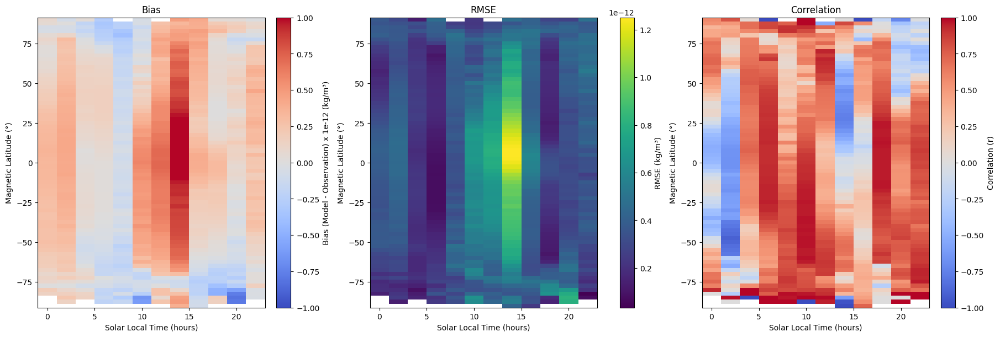

In [7]:
# Scale bias values for visualization purposes
scaled_bias_grid = bias_grid * 1e12  # Scale to the order of 10^0

# Plotting Bias, RMSE, and Correlation maps with scaled bias
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

# Plot Bias map with scaled data
c1 = axes[0].pcolormesh(solar_local_time, qd_latitude, scaled_bias_grid, shading='auto', cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(c1, ax=axes[0], label='Bias (Model - Observation) x 1e-12 (kg/m³)')
axes[0].set_title('Bias')
axes[0].set_xlabel('Solar Local Time (hours)')
axes[0].set_ylabel('Magnetic Latitude (°)')

# Plot RMSE map
c2 = axes[1].pcolormesh(solar_local_time, qd_latitude, rmse_grid, shading='auto', cmap='viridis')
fig.colorbar(c2, ax=axes[1], label='RMSE (kg/m³)')
axes[1].set_title('RMSE')
axes[1].set_xlabel('Solar Local Time (hours)')
axes[1].set_ylabel('Magnetic Latitude (°)')

# Plot Correlation map
c3 = axes[2].pcolormesh(solar_local_time, qd_latitude, correlation_grid, shading='auto', cmap='coolwarm')
fig.colorbar(c3, ax=axes[2], label='Correlation (r)')
axes[2].set_title('Correlation')
axes[2].set_xlabel('Solar Local Time (hours)')
axes[2].set_ylabel('Magnetic Latitude (°)')

# Show the plots
plt.show()


Processing files: 100%|██████████| 6753/6753 [00:56<00:00, 119.78it/s]  


Shape of density: (54016, 73, 12)
Shape of model_density: (54016, 73, 12)
Shape of expanded kp_values: (54016, 73, 12)


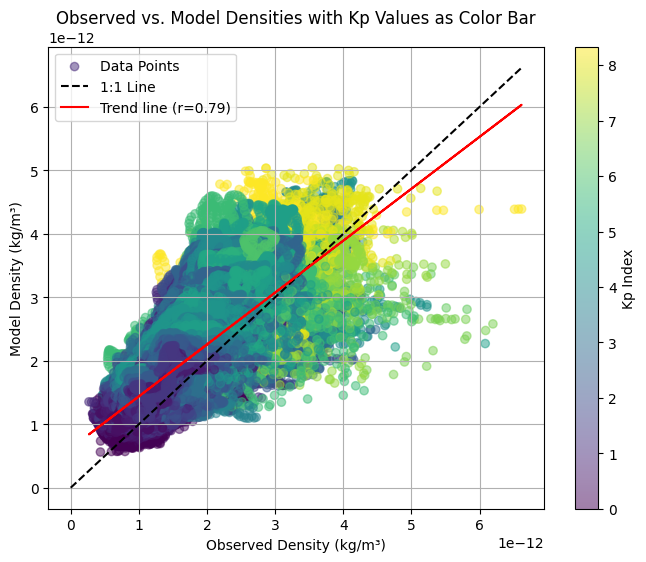

Bias (Model - Observation): 3.1562e-13
RMSE: 5.4084e-13
Correlation coefficient (r): 0.7852


In [14]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
from scipy.stats import linregress

# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS
from readGeomagIndices import readKpAp

# Set data directory and other parameters
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Load each file and add data points with a progress bar
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('fs16.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))
        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

# Get density data
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']
start_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(combined_ds.time.values[-1]))
fs = 24 // 1.5  # Results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')

# Expand kp_values to match the shape of density and model_density
kp_values = kp_interp.values
kp_values_expanded = np.repeat(kp_values[:, np.newaxis, np.newaxis], 73, axis=1)
kp_values_expanded = np.repeat(kp_values_expanded, 12, axis=2)

# Check dimensions
print(f"Shape of density: {density.shape}")
print(f"Shape of model_density: {model_density.shape}")
print(f"Shape of expanded kp_values: {kp_values_expanded.shape}")

# Filter out NaN values across all arrays with the same shape
valid_idx = np.isfinite(density) & np.isfinite(model_density) & np.isfinite(kp_values_expanded)

# Filter the data to remove NaN values
observed_density = density.values[valid_idx]
model_density_values = model_density.values[valid_idx]
kp_values_filtered = kp_values_expanded[valid_idx]

# Scatter plot of model vs observation with Kp values as color bar
plt.figure(figsize=(8, 6))
sc = plt.scatter(observed_density, model_density_values, c=kp_values_filtered, cmap='viridis', alpha=0.5, label='Data Points')
plt.colorbar(sc, label='Kp Index')  # Add color bar for Kp values

# Plot a 1:1 line for reference
max_density = max(np.max(observed_density), np.max(model_density_values))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_density, model_density_values)
plt.plot(observed_density, intercept + slope * observed_density, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Observed vs. Model Densities with Kp Values as Color Bar')
plt.legend()
plt.grid(True)
plt.show()

# Calculate statistical metrics
bias = np.mean(model_density_values - observed_density)
rmse = np.sqrt(np.mean((model_density_values - observed_density) ** 2))

# Print bias, RMSE, and correlation coefficient
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")


In [ ]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
from scipy.stats import linregress
import pandas as pd
from multiprocessing import Pool

# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS

# Set data directory and other parameters
data_dir = 'data/SAT_C/CorrectedGridData'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Load each file and add data points with a progress bar
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('.nc'):
        try:
            ds = xr.open_dataset(os.path.join(data_dir, file))
            if 'time' in ds.dims:
                selected_datasets.append(ds)
            else:
                print(f"File {file} does not contain 'time' dimension.")
        except Exception as e:
            print(f"Error processing file {file}: {e}")

# Check if any valid datasets were loaded
if not selected_datasets:
    raise ValueError("No valid datasets found. Ensure files match the pattern and contain the 'time' dimension.")

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

# Convert the time values from the NetCDF data to a pandas datetime index
time_values = pd.to_datetime(combined_ds['time'].values)

def fetch_f107_for_date(day):
    """Fetch F10.7 values for a specific day."""
    xr_f107_all = readSolarFluxCLS(day - datetime.timedelta(days=40), day + datetime.timedelta(days=40), 'adjusted', 'f10.7')
    try:
        f107_day = xr_f107_all['f10.7_c'].sel(time=np.datetime64(day, 'D')).values
    except KeyError:
        f107_day = np.nan
    return f107_day

# Use multiprocessing to speed up F10.7 value fetching
with Pool(processes=4) as pool:
    f107_values_aligned = pool.map(fetch_f107_for_date, time_values.to_pydatetime())

# Convert the aligned F10.7 values list to a numpy array
f107_values_aligned = np.array(f107_values_aligned)

# Ensure the F10.7 array has the same length as the time array
if len(f107_values_aligned) != len(time_values):
    raise ValueError("The F10.7 values and time values arrays have different lengths.")

# Create a DataFrame for easier plotting
f107_df = pd.DataFrame({'time': time_values, 'F10.7': f107_values_aligned})

# Group by year and calculate the mean F10.7 value for each year
f107_df['year'] = f107_df['time'].dt.year
yearly_f107 = f107_df.groupby('year')['F10.7'].mean()

# Plotting the data
plt.figure(figsize=(12, 6))
plt.plot(yearly_f107.index, yearly_f107.values, marker='o', linestyle='-', color='b', label='F10.7 (yearly mean)')
plt.title('Variations of Solar Flux (F10.7 cm index) during 2014–2023')
plt.xlabel('Year')
plt.ylabel('F10.7 Value')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Processing files: 100%|██████████| 3213/3213 [04:38<00:00, 11.53it/s]


Processing files: 100%|██████████| 6753/6753 [01:01<00:00, 109.02it/s]  


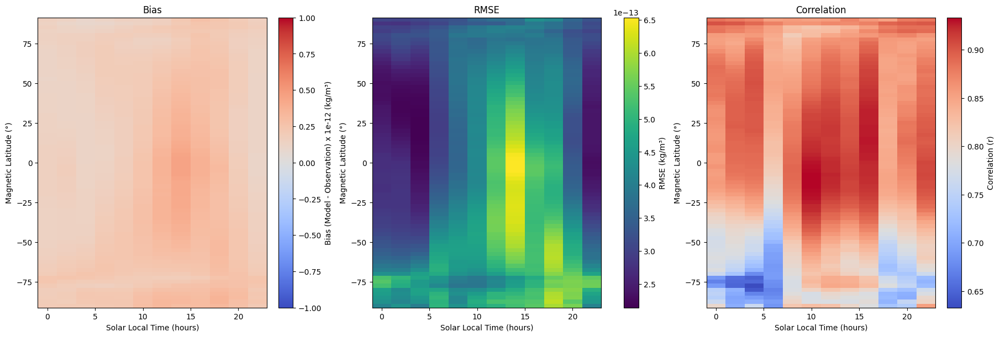

In [2]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.stats import linregress

# Define data directory and load necessary parameters
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Load each NetCDF file and extract data points
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('fs16.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))
        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

# Get density data from combined dataset
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']

# Get grid coordinates
qd_latitude = combined_ds['qd_latitude'].values
solar_local_time = combined_ds['solar_local_time'].values

# Initialize arrays for Bias, RMSE, and Correlation for each grid point
bias_grid = np.empty((len(qd_latitude), len(solar_local_time)))
rmse_grid = np.empty((len(qd_latitude), len(solar_local_time)))
correlation_grid = np.empty((len(qd_latitude), len(solar_local_time)))

# Loop through each grid point in latitude and solar local time
for i, lat in enumerate(qd_latitude):
    for j, slt in enumerate(solar_local_time):
        # Get observed and model densities for the current grid point
        observed_values = density[:, i, j].values
        model_values = model_density[:, i, j].values

        # Remove NaN values
        valid_idx = np.isfinite(observed_values) & np.isfinite(model_values)
        observed_values = observed_values[valid_idx]
        model_values = model_values[valid_idx]

        # Compute Bias, RMSE, and Correlation if there are valid data points
        if len(observed_values) > 0:
            bias_grid[i, j] = np.mean(model_values - observed_values)
            rmse_grid[i, j] = np.sqrt(np.mean((model_values - observed_values) ** 2))
            slope, intercept, r_value, _, _ = linregress(observed_values, model_values)
            correlation_grid[i, j] = r_value  # Store correlation coefficient (r)
        else:
            bias_grid[i, j] = np.nan
            rmse_grid[i, j] = np.nan
            correlation_grid[i, j] = np.nan

# Scale bias values for visualization purposes
scaled_bias_grid = bias_grid * 1e12  # Scale to the order of 10^0

# Plotting Bias, RMSE, and Correlation maps with scaled bias
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

# Plot Bias map with scaled data
c1 = axes[0].pcolormesh(solar_local_time, qd_latitude, scaled_bias_grid, shading='auto', cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(c1, ax=axes[0], label='Bias (Model - Observation) x 1e-12 (kg/m³)')
axes[0].set_title('Bias')
axes[0].set_xlabel('Solar Local Time (hours)')
axes[0].set_ylabel('Magnetic Latitude (°)')

# Plot RMSE map
c2 = axes[1].pcolormesh(solar_local_time, qd_latitude, rmse_grid, shading='auto', cmap='viridis')
fig.colorbar(c2, ax=axes[1], label='RMSE (kg/m³)')
axes[1].set_title('RMSE')
axes[1].set_xlabel('Solar Local Time (hours)')
axes[1].set_ylabel('Magnetic Latitude (°)')

# Plot Correlation map
c3 = axes[2].pcolormesh(solar_local_time, qd_latitude, correlation_grid, shading='auto', cmap='coolwarm')
fig.colorbar(c3, ax=axes[2], label='Correlation (r)')
axes[2].set_title('Correlation')
axes[2].set_xlabel('Solar Local Time (hours)')
axes[2].set_ylabel('Magnetic Latitude (°)')

# Show the plots
plt.show()


Processing files: 100%|██████████| 6753/6753 [01:06<00:00, 101.31it/s] 


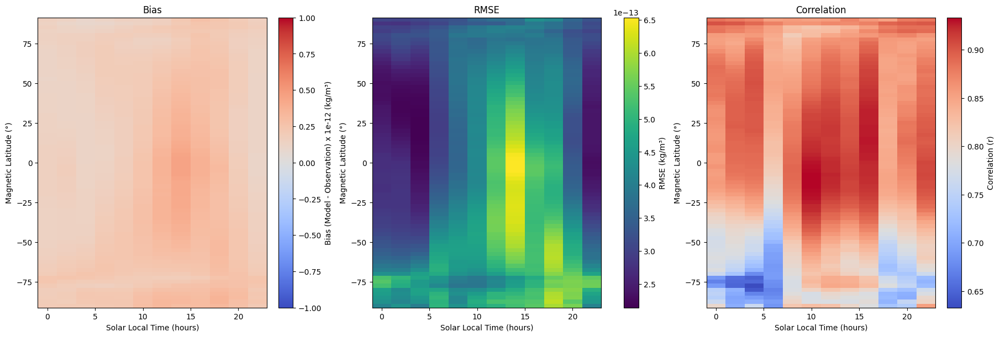

In [4]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.stats import linregress

# Define data directory and load necessary parameters
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Load each NetCDF file and extract data points
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('fs16.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))
        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

# Get density data from combined dataset
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']

# Get grid coordinates
qd_latitude = combined_ds['qd_latitude'].values
solar_local_time = combined_ds['solar_local_time'].values

# Initialize arrays for Bias, RMSE, and Correlation for each grid point
bias_grid = np.empty((len(qd_latitude), len(solar_local_time)))
rmse_grid = np.empty((len(qd_latitude), len(solar_local_time)))
correlation_grid = np.empty((len(qd_latitude), len(solar_local_time)))

# Loop through each grid point in latitude and solar local time
for i, lat in enumerate(qd_latitude):
    for j, slt in enumerate(solar_local_time):
        # Get observed and model densities for the current grid point
        observed_values = density[:, i, j].values
        model_values = model_density[:, i, j].values

        # Remove NaN values
        valid_idx = np.isfinite(observed_values) & np.isfinite(model_values)
        observed_values = observed_values[valid_idx]
        model_values = model_values[valid_idx]

        # Compute Bias, RMSE, and Correlation if there are valid data points
        if len(observed_values) > 0:
            bias_grid[i, j] = np.mean(model_values - observed_values)
            rmse_grid[i, j] = np.sqrt(np.mean((model_values - observed_values) ** 2))
            slope, intercept, r_value, _, _ = linregress(observed_values, model_values)
            correlation_grid[i, j] = r_value  # Store correlation coefficient (r)
        else:
            bias_grid[i, j] = np.nan
            rmse_grid[i, j] = np.nan
            correlation_grid[i, j] = np.nan

# Scale bias values for visualization purposes
scaled_bias_grid = bias_grid * 1e12  # Scale to the order of 10^0

# Plotting Bias, RMSE, and Correlation maps with scaled bias
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

# Plot Bias map with scaled data
c1 = axes[0].pcolormesh(solar_local_time, qd_latitude, scaled_bias_grid, shading='auto', cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(c1, ax=axes[0], label='Bias (Model - Observation) x 1e-12 (kg/m³)')
axes[0].set_title('Bias')
axes[0].set_xlabel('Solar Local Time (hours)')
axes[0].set_ylabel('Magnetic Latitude (°)')

# Plot RMSE map
c2 = axes[1].pcolormesh(solar_local_time, qd_latitude, rmse_grid, shading='auto', cmap='viridis')
fig.colorbar(c2, ax=axes[1], label='RMSE (kg/m³)')
axes[1].set_title('RMSE')
axes[1].set_xlabel('Solar Local Time (hours)')
axes[1].set_ylabel('Magnetic Latitude (°)')

# Plot Correlation map
c3 = axes[2].pcolormesh(solar_local_time, qd_latitude, correlation_grid, shading='auto', cmap='coolwarm')
fig.colorbar(c3, ax=axes[2], label='Correlation (r)')
axes[2].set_title('Correlation')
axes[2].set_xlabel('Solar Local Time (hours)')
axes[2].set_ylabel('Magnetic Latitude (°)')

# Show the plots
plt.show()


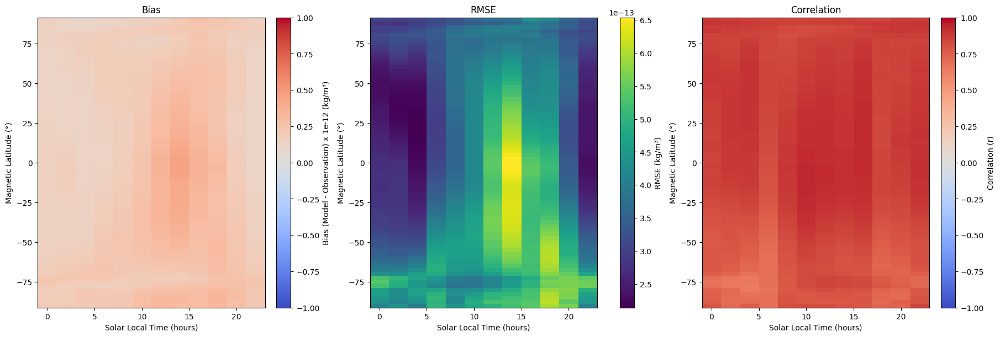

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6), constrained_layout=True)

# Plot Bias map with scaled data
c1 = axes[0].pcolormesh(solar_local_time, qd_latitude, scaled_bias_grid, shading='auto', cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(c1, ax=axes[0], label='Bias (Model - Observation) x 1e-12 (kg/m³)')
axes[0].set_title('Bias')
axes[0].set_xlabel('Solar Local Time (hours)')
axes[0].set_ylabel('Magnetic Latitude (°)')

# Plot RMSE map
c2 = axes[1].pcolormesh(solar_local_time, qd_latitude, rmse_grid, shading='auto', cmap='viridis')
fig.colorbar(c2, ax=axes[1], label='RMSE (kg/m³)')
axes[1].set_title('RMSE')
axes[1].set_xlabel('Solar Local Time (hours)')
axes[1].set_ylabel('Magnetic Latitude (°)')

# Plot Correlation map with 0 at the midpoint of the color bar
c3 = axes[2].pcolormesh(solar_local_time, qd_latitude, correlation_grid, shading='auto', cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(c3, ax=axes[2], label='Correlation (r)')
axes[2].set_title('Correlation')
axes[2].set_xlabel('Solar Local Time (hours)')
axes[2].set_ylabel('Magnetic Latitude (°)')

# Show the plots
plt.show()

Processing files: 100%|██████████| 6753/6753 [01:50<00:00, 61.10it/s]  


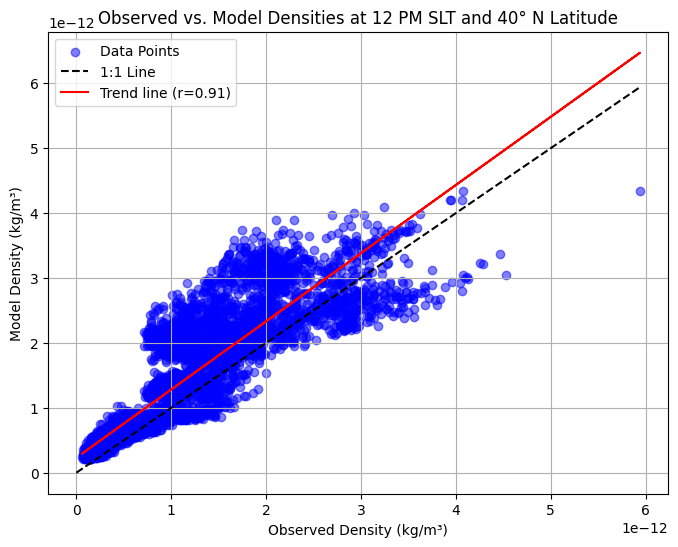

Bias (Model - Observation): 2.7597e-13
RMSE: 4.8438e-13
Correlation coefficient (r): 0.9066


In [1]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
from scipy.stats import linregress

# Path to custom functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS

# Data directory and filtering conditions
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'
desired_slt = 12  # Solar Local Time (in hours)
desired_lat = 40  # Latitude in degrees

# Initialize a list to store filtered datasets for each day
selected_datasets = []

# Loop through each file, filter by SLT and latitude, and load data
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('fs16.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))
        
        # Filter dataset for Solar Local Time around 12 PM and Latitude around 40° N
        slt_near_desired = np.abs(ds['solar_local_time'] - desired_slt) < 0.5  # 30 min tolerance
        lat_near_desired = np.abs(ds['qd_latitude'] - desired_lat) < 2.5       # 2.5° tolerance
        
        # Select data meeting both conditions
        filtered_ds = ds.where(slt_near_desired & lat_near_desired, drop=True)
        
        # Append the filtered dataset to the list if it's non-empty
        if filtered_ds.time.size > 0:
            selected_datasets.append(filtered_ds)

# Concatenate all selected datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

# Get density data (filtered by SLT and latitude)
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']

# Remove NaN values in the density data
valid_idx = np.isfinite(density.values) & np.isfinite(model_density.values)
observed_density = density.values[valid_idx]
model_density = model_density.values[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_density, model_density, alpha=0.5, label='Data Points', color='blue')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_density), np.max(model_density))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_density, model_density)
plt.plot(observed_density, intercept + slope * observed_density, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Observed vs. Model Densities at 12 PM SLT and 40° N Latitude')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_density - observed_density)
rmse = np.sqrt(np.mean((model_density - observed_density) ** 2))

# Print correlation coefficient r, not r^2
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")


Processing files: 100%|██████████| 6753/6753 [01:13<00:00, 91.38it/s]   


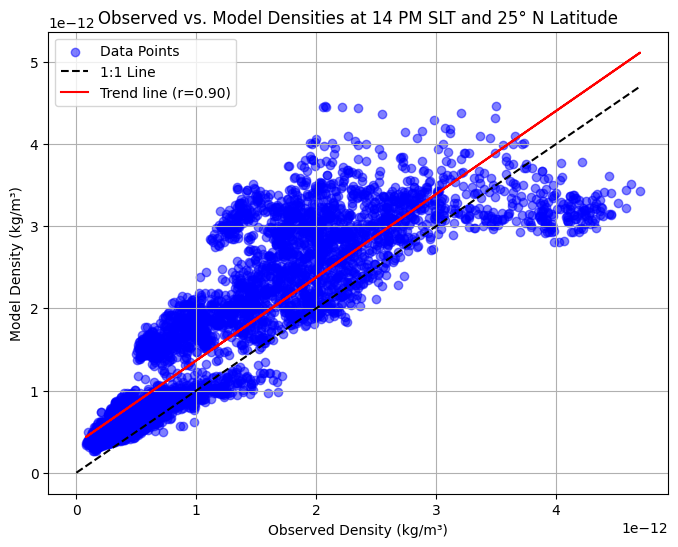

Bias (Model - Observation): 3.6630e-13
RMSE: 5.8680e-13
Correlation coefficient (r): 0.9011


In [3]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
from scipy.stats import linregress

# Path to custom functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS

# Data directory and filtering conditions
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'
desired_slt = 14  # Solar Local Time (in hours)
desired_lat = 25  # Latitude in degrees

# Initialize a list to store filtered datasets for each day
selected_datasets = []

# Loop through each file, filter by SLT and latitude, and load data
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('fs16.nc'):
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))
        
        # Filter dataset for Solar Local Time around 12 PM and Latitude around 40° N
        slt_near_desired = np.abs(ds['solar_local_time'] - desired_slt) < 0.5  # 30 min tolerance
        lat_near_desired = np.abs(ds['qd_latitude'] - desired_lat) < 2.5       # 2.5° tolerance
        
        # Select data meeting both conditions
        filtered_ds = ds.where(slt_near_desired & lat_near_desired, drop=True)
        
        # Append the filtered dataset to the list if it's non-empty
        if filtered_ds.time.size > 0:
            selected_datasets.append(filtered_ds)

# Concatenate all selected datasets along the time dimension
combined_ds = xr.concat(selected_datasets, dim='time')

# Get density data (filtered by SLT and latitude)
density = combined_ds['density_hgt453km']
model_density = combined_ds['msis_density_hgt453km']

# Remove NaN values in the density data
valid_idx = np.isfinite(density.values) & np.isfinite(model_density.values)
observed_density = density.values[valid_idx]
model_density = model_density.values[valid_idx]

# Step 3: Scatter plot of model vs observation
plt.figure(figsize=(8, 6))
plt.scatter(observed_density, model_density, alpha=0.5, label='Data Points', color='blue')

# Plot a 1:1 line for reference
max_density = max(np.max(observed_density), np.max(model_density))
plt.plot([0, max_density], [0, max_density], 'k--', label='1:1 Line')

# Perform linear regression to show trend line
slope, intercept, r_value, _, _ = linregress(observed_density, model_density)
plt.plot(observed_density, intercept + slope * observed_density, 'r-', label=f'Trend line (r={r_value:.2f})')

# Add labels and title
plt.xlabel('Observed Density (kg/m³)')
plt.ylabel('Model Density (kg/m³)')
plt.title('Observed vs. Model Densities at 14 PM SLT and 25° N Latitude')
plt.legend()

# Show the plot
plt.grid(True)
plt.show()

# Step 4: Print statistical metrics
bias = np.mean(model_density - observed_density)
rmse = np.sqrt(np.mean((model_density - observed_density) ** 2))

# Print correlation coefficient r, not r^2
print(f"Bias (Model - Observation): {bias:.4e}")
print(f"RMSE: {rmse:.4e}")
print(f"Correlation coefficient (r): {r_value:.4f}")

In [16]:
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs))
kp_interp = kp_ds.interp(UT=combined_ds['time'], method='linear')

# Load necessary Kp data and filter for low geomagnetic activity
kp_values = kp_interp.values
tolerance = 4  # Adjust tolerance as needed
low_kp_condition = kp_values < 4 + tolerance
print(low_kp_condition)

[ True  True  True ...  True  True  True]


In [3]:
print(f"Number of data points to plot: {len(observed_low_kp_filtered)}")


Number of data points to plot: 888212


In [5]:
pip install datashader


  Using cached click-8.1.7-py3-none-any.whl.metadata (3.0 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 3.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.3/260.3 kB 3.2 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 3.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 3.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.8/116.8 kB 3.3 MB/s eta 0:00:00
Using cached click-8.1.7-py3-none-any.whl (97 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 3.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.9/43.9 MB 3.8 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [48]:
import os
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import datetime
from tqdm import tqdm  # For progress bars
import sys
# Import necessary functions (adjust the path as needed)
sys.path.append('/home/jose_ne/Documents/swe_data_reading_routines')
from readSolarFlux import readSolarFluxCLS
from readGeomagIndices import readKpAp

# Directory where your NetCDF data files are located
data_dir = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C'

# Initialize an empty list to store datasets for each day
selected_datasets = []

# Loop through each file and extract data points that match the filename pattern
for file in tqdm(os.listdir(data_dir), desc="Processing files"):
    if file.endswith('.nc') and "SW_OPER_DNSCACC" in file and "normalt_453km" in file:
        # Load the dataset
        ds = xr.open_dataset(os.path.join(data_dir, file))
        
        # Append the dataset to the list
        selected_datasets.append(ds)

# Concatenate all datasets along the time dimension
corrected_ds = xr.concat(selected_datasets, dim='time')

density = corrected_ds['density_hgt453km']

# Define start and end dates
start_date = datetime.datetime.fromisoformat(str(corrected_ds.time.values[0]))
end_date = datetime.datetime.fromisoformat(str(corrected_ds.time.values[-1]))
fs = 24 // 1.5  # This results in 16 samples per day

# Read Kp data with the same 90-minute resolution (16 intervals per day)
kp_ds = readKpAp(start_date, end_date, 'Kp', int(fs)) 
kp_interp = kp_ds.interp(UT=corrected_ds['time'], method='linear')

# Read solar flux data
xr_f107_all = readSolarFluxCLS(start_date, end_date, 'adjusted', 'f10.7')
f107 = xr_f107_all['f10.7'].interp(time=corrected_ds['time'], method='linear')

# Interpolate Kp index to match the combined dataset time
kp_values = kp_interp.values

# Classify geomagnetic conditions: quiet (Kp <= 3) and disturbed (Kp > 3)
quiet_cond = kp_values <= 3
disturbed_cond = kp_values > 3

# Get solar local time and magnetic latitude values
slt = corrected_ds['solar_local_time'].values
latitude = corrected_ds['qd_latitude'].values

# Define unique values for solar local time and latitude
unique_slt = np.unique(slt)
unique_lat = np.unique(latitude)

# Initialize arrays to hold averages for quiet and disturbed conditions
density_quiet = np.full((len(unique_lat), len(unique_slt)), np.nan)
density_disturbed = np.full((len(unique_lat), len(unique_slt)), np.nan)

# Iterate over latitude and solar local time to compute averages
for lat_idx, lat in enumerate(unique_lat):
    for slt_idx, slt_val in enumerate(unique_slt):
        # Select data for current latitude and solar local time
        selected_data = corrected_ds.sel(qd_latitude=lat, solar_local_time=slt_val, method='nearest')
        
        # Get density values and apply conditions
        density_vals = selected_data['density_hgt453km'].values

        # Quiet conditions
        if np.any(quiet_cond):
            density_quiet[lat_idx, slt_idx] = np.nanmean(density_vals[quiet_cond])
        
        # Disturbed conditions
        if np.any(disturbed_cond):
            density_disturbed[lat_idx, slt_idx] = np.nanmean(density_vals[disturbed_cond])

# Get the combined min and max density values for both conditions
density_min = np.nanmin([density_quiet, density_disturbed])
density_max = np.nanmax([density_quiet, density_disturbed])

# Define common levels for both quiet and disturbed plots
levels = np.linspace(density_min, density_max, 15)

# Plot density for quiet conditions (using the same color range)
plt.figure(figsize=(10, 6))
cp1 = plt.contourf(unique_slt, unique_lat, density_quiet, cmap='viridis', levels=levels, vmin=density_min, vmax=density_max)
plt.colorbar(cp1, label='Density (kg/m³)')
plt.title('Thermospheric Density (Quiet Conditions, Kp ≤ 3) 2014-2023')


Processing files: 100%|██████████| 22492/22492 [02:50<00:00, 131.73it/s]   


KeyError: "No variable named 'solar_local_time'. Variables on the dataset include ['msis_density_orbit', 'msis_density_hgt453km', 'density_hgt453km', 'latitude', 'longitude', 'time']"

In [7]:
import xarray as xr

# Define the path to your NetCDF file
filename = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SAT_C_ACC_GridData_2024-01-03_qd_hgt453km_dlat2.5_dslt2_fs16.nc'

# Open the NetCDF file as an xarray Dataset
ds = xr.open_dataset(filename)

# Display information about the dataset (optional)
print(ds)

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SAT_C_ACC_GridData_2024-01-03_qd_hgt453km_dlat2.5_dslt2_fs16.nc'

In [1]:
import xarray as xr

# Define the path to your NetCDF file
filename = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20231217T000000_20231217T235950_normalt_453km.nc'

# Open the NetCDF file as an xarray Dataset
ds = xr.open_dataset(filename)

# Display information about the dataset (optional)
print(ds)

<xarray.Dataset> Size: 415kB
Dimensions:                (time: 8640)
Coordinates:
  * time                   (time) datetime64[ns] 69kB 2023-12-17 ... 2023-12-...
Data variables:
    msis_density_orbit     (time) float64 69kB ...
    msis_density_hgt453km  (time) float64 69kB ...
    density_hgt453km       (time) float64 69kB ...
    latitude               (time) float64 69kB ...
    longitude              (time) float64 69kB ...


In [5]:
import xarray as xr

# Define the path to your NetCDF file
filename = 'data/SAT_C/CorrectedGridData/SAT_C_ACC_GridData_2014-02-05_qd_Altitude.nc'
# Open the NetCDF file as an xarray Dataset
ds = xr.open_dataset(filename)

# Display information about the dataset (optional)
print(ds)

<xarray.Dataset> Size: 3MB
Dimensions:           (time: 16, qd_latitude: 73, solar_local_time: 12,
                       altitude: 13)
Coordinates:
  * time              (time) datetime64[ns] 128B 2014-02-05 ... 2014-02-05T22...
  * qd_latitude       (qd_latitude) float64 584B -90.0 -87.5 -85.0 ... 87.5 90.0
  * solar_local_time  (solar_local_time) int64 96B 0 2 4 6 8 ... 14 16 18 20 22
  * altitude          (altitude) int64 104B 420 430 440 450 ... 510 520 530 540
Data variables:
    density           (time, qd_latitude, solar_local_time, altitude) float64 1MB ...
    msis_density      (time, qd_latitude, solar_local_time, altitude) float64 1MB ...


In [1]:
import xarray as xr
import os
import glob

# Path to your folder
folder_path = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km'

# Use glob to get a list of all files that match the naming pattern
file_pattern = os.path.join(folder_path, "SW_OPER_DNSCACC_2__*normalt_453km.nc")
file_list = glob.glob(file_pattern)

# Load and combine the files into an xarray Dataset
combined_data = xr.open_mfdataset(file_list, combine="by_coords", engine="netcdf4",)

# Now `combined_data` holds the combined xarray.Dataset, you can work with it directly in memory
print(combined_data)


ValueError: did not find a match in any of xarray's currently installed IO backends ['netcdf4', 'h5netcdf', 'scipy', 'cfgrib']. Consider explicitly selecting one of the installed engines via the ``engine`` parameter, or installing additional IO dependencies, see:
https://docs.xarray.dev/en/stable/getting-started-guide/installing.html
https://docs.xarray.dev/en/stable/user-guide/io.html

In [4]:
import xarray as xr
import os
import glob
from tqdm import tqdm

# Path to your folder
folder_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km"

# Use glob to get a list of all files that match the naming pattern
file_pattern = os.path.join(folder_path, "SW_OPER_DNSCACC_2__*normalt_453km.nc")
file_list = glob.glob(file_pattern)

# Initialize an empty list to store individual datasets
datasets = []

# Load each file with progress tracking
for file in tqdm(file_list, desc="Loading NetCDF files"):
    ds = xr.open_dataset(file, engine="netcdf4")
    datasets.append(ds)

# Combine all loaded datasets
combined_data = xr.combine_by_coords(datasets)

# Now `combined_data` holds the combined xarray.Dataset in memory
print(combined_data)


Loading NetCDF files:  96%|█████████▌| 3087/3213 [01:02<00:02, 49.53it/s]


OSError: [Errno -51] NetCDF: Unknown file format: '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230328T000000_20230328T235950_normalt_453km.nc'

In [2]:
import xarray as xr
import os
import glob
from tqdm import tqdm

# Path to your folder
folder_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km"

# Use glob to get a list of all files that match the naming pattern
file_pattern = os.path.join(folder_path, "SW_OPER_DNSCACC_2__*normalt_453km.nc")
file_list = glob.glob(file_pattern)

# Initialize an empty list to store individual datasets
datasets = []

# Load each file with progress tracking, skipping any 0KB files
for file in tqdm(file_list, desc="Loading NetCDF files"):
    # Skip the file if it is 0KB
    if os.path.getsize(file) == 0:
        print(f"Skipping empty file: {file}")
        continue
    # Load the dataset
    ds = xr.open_dataset(file, engine="netcdf4")
    datasets.append(ds)

# Combine all loaded datasets
combined_data = xr.combine_by_coords(datasets)
pickle_file_path = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/combined_data.pkl'

# Save the combined_data to a pickle file
combined_data.to_pickle(pickle_file_path)

# Now `combined_data` holds the combined xarray.Dataset in memory
print(combined_data)


Loading NetCDF files: 100%|██████████| 3376/3376 [01:14<00:00, 45.10it/s]


AttributeError: 'Dataset' object has no attribute 'to_pickle'

In [4]:
import pickle
pickle_file_path = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/combined_data.pkl'

# Save the combined_data to a pickle file using pickle.dump()
with open(pickle_file_path, 'wb') as f:
    pickle.dump(combined_data, f)

print(f"Dataset saved to {pickle_file_path}")

Dataset saved to /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/combined_data.pkl


In [ ]:
import pickle
import matplotlib.pyplot as plt

# Load the dataset from the pickle file
pickle_file_path = '/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/combined_data.pkl'
with open(pickle_file_path, 'rb') as f:
    combined_data = pickle.load(f)

# Create a figure with two subplots for scatter plots
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Scatter plot for msis_density_orbit
sc1 = axes[0].scatter(combined_data['time'], combined_data['latitude'], c=combined_data['msis_density_orbit'], cmap='viridis')
axes[0].set_title('msis_density_orbit vs Time and Latitude')
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Latitude')
fig.colorbar(sc1, ax=axes[0], label='msis_density_orbit')

# Scatter plot for msis_density_hgt453km
sc2 = axes[1].scatter(combined_data['time'], combined_data['latitude'], c=combined_data['msis_density_hgt453km'], cmap='viridis')
axes[1].set_title('msis_density_hgt453km vs Time and Latitude')
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Latitude')
fig.colorbar(sc2, ax=axes[1], label='msis_density_hgt453km')

plt.tight_layout()
plt.show()


In [14]:


import os
import glob
import cdflib
import xarray as xr
import pandas as pd
from tqdm import tqdm

# Path to your folder containing the .cdf files
folder_path = '/mnt/sofs01/mirroreddata/SWARM-DISS/DNS/ACC/SAT_C'
cdf_files = [file for file in os.listdir(folder_path) if file.endswith('.cdf')]

combined_df = pd.DataFrame()

for cdf_filename in cdf_files:
    cdf_file_path = os.path.join(folder_path, cdf_filename)
    
    cdf_file = cdf.CDF(cdf_file_path)
    
    variable_names = list(cdf_file.keys())
    data_dict = {'time': cdf_file['time'][:], 'density': cdf_file['density'][:], 'altitude': cdf_file['altitude'][:], 'latitude': cdf_file['latitude'][:], 'longitude': cdf_file['longitude'][:], 'local_solar_time': cdf_file['local_solar_time'][:]}

df = pd.DataFrame(data_dict)

print(df)

NameError: name 'cdf' is not defined

In [13]:
import os

folder_path = '/mnt/sofs01/MirroredData/SWARM-DISS/DNS/ACC/SAT_C'

# Check if folder exists
if not os.path.exists(folder_path):
    print(f"Folder path does not exist: {folder_path}")
else:
    print(f"Folder path exists: {folder_path}")


Folder path does not exist: /mnt/sofs01/MirroredData/SWARM-DISS/DNS/ACC/SAT_C


In [ ]:
import cdflib

# Pick one CDF file to inspect
sample_file = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140201T000000_20140201T235950_0201.cdf"

# Open and inspect the structure of the file
cdf_file = cdflib.CDF(sample_file)
print("CDF Variables:", cdf_file.cdf_info())
print("Variable Attributes:")
for var in cdf_file.cdf_info().get('zVariables', []):
    print(var, cdf_file.varinq(var))


In [1]:
import xarray as xr
import os
import glob
from tqdm import tqdm
import pickle  # Import the pickle module

# Path to your folder
folder_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km"

# Use glob to get a list of all files that match the naming pattern
file_pattern = os.path.join(folder_path, "SW_OPER_DNSCACC_2__*normalt_453km.nc")
file_list = glob.glob(file_pattern)

# Create an empty list to track the processed datasets (for pickle storage)
processed_datasets = []

# File to store the final pickle of processed data
pickle_file_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/processed_data.pkl"

# Process each file sequentially, saving intermediate results to pickle
for file in tqdm(file_list, desc="Processing NetCDF files"):
    # Skip the file if it is 0KB
    if os.path.getsize(file) == 0:
        print(f"Skipping empty file: {file}")
        continue
    
    # Load the dataset (using chunking if needed for large files)
    try:
        ds = xr.open_dataset(file, engine="netcdf4", chunks={"time": 1000})  # adjust chunk size as needed
        # Process the data as needed (here, just an example of appending)
        processed_datasets.append(ds)

        # Save the intermediate dataset as a pickle (you can save in batches)
        with open(pickle_file_path, 'wb') as f:
            pickle.dump(processed_datasets, f)
        
        print(f"Processed and saved intermediate data for: {file}")

    except Exception as e:
        print(f"Error processing {file}: {e}")

# After processing all files, you can combine the datasets if necessary
# combined_data = xr.combine_by_coords(processed_datasets)

# For now, we save the intermediate datasets as pickle files
print(f"All processed data saved as pickle file at: {pickle_file_path}")


Processing NetCDF files:   0%|          | 2/3213 [00:01<37:40,  1.42it/s]  

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140201T000000_20140201T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140202T000000_20140202T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140203T000000_20140203T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140204T000000_20140204T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140205T000000_20140205T235950_normalt_453km.nc


Processing NetCDF files:   0%|          | 10/3213 [00:01<05:38,  9.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140206T000000_20140206T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140207T000000_20140207T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140208T000000_20140208T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140209T000000_20140209T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140210T000000_20140210T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/

Processing NetCDF files:   0%|          | 16/3213 [00:02<03:30, 15.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140212T000000_20140212T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140213T000000_20140213T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140214T000000_20140214T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140215T000000_20140215T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140216T000000_20140216T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/

Processing NetCDF files:   1%|          | 22/3213 [00:02<02:43, 19.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140218T000000_20140218T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140219T000000_20140219T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140220T000000_20140220T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140221T000000_20140221T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140222T000000_20140222T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/

Processing NetCDF files:   1%|          | 28/3213 [00:02<02:31, 21.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140224T000000_20140224T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140225T000000_20140225T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140302T000000_20140302T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140307T000000_20140307T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140308T000000_20140308T235950_normalt_453km.nc


Processing NetCDF files:   1%|          | 31/3213 [00:02<02:31, 21.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140309T000000_20140309T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140310T000000_20140310T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140311T000000_20140311T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140312T000000_20140312T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140313T000000_20140313T235950_normalt_453km.nc


Processing NetCDF files:   1%|          | 37/3213 [00:03<02:31, 20.94it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140314T000000_20140314T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140315T000000_20140315T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140316T000000_20140316T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140317T000000_20140317T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140318T000000_20140318T235950_normalt_453km.nc


Processing NetCDF files:   1%|          | 40/3213 [00:03<02:35, 20.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140319T000000_20140319T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140320T000000_20140320T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140321T000000_20140321T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140322T000000_20140322T235950_normalt_453km.nc


Processing NetCDF files:   1%|▏         | 46/3213 [00:03<02:40, 19.70it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140323T000000_20140323T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140326T000000_20140326T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140327T000000_20140327T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140328T000000_20140328T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 49/3213 [00:03<02:44, 19.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140329T000000_20140329T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140401T000000_20140401T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140402T000000_20140402T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140403T000000_20140403T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 53/3213 [00:03<02:53, 18.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140404T000000_20140404T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140405T000000_20140405T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140406T000000_20140406T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140411T000000_20140411T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 57/3213 [00:04<02:56, 17.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140412T000000_20140412T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140413T000000_20140413T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140414T000000_20140414T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140415T000000_20140415T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 61/3213 [00:04<03:06, 16.94it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140416T000000_20140416T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140418T000000_20140418T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140419T000000_20140419T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140420T000000_20140420T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 65/3213 [00:04<03:39, 14.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140421T000000_20140421T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140422T000000_20140422T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140423T000000_20140423T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140424T000000_20140424T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 69/3213 [00:05<03:39, 14.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140425T000000_20140425T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140426T000000_20140426T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140427T000000_20140427T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 73/3213 [00:05<03:35, 14.56it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140428T000000_20140428T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140429T000000_20140429T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140430T000000_20140430T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140501T000000_20140501T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 77/3213 [00:05<03:31, 14.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140502T000000_20140502T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140503T000000_20140503T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140504T000000_20140504T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140505T000000_20140505T235950_normalt_453km.nc


Processing NetCDF files:   2%|▏         | 79/3213 [00:05<03:32, 14.72it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140506T000000_20140506T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140507T000000_20140507T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140508T000000_20140508T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 81/3213 [00:05<03:38, 14.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140509T000000_20140509T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140510T000000_20140510T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 85/3213 [00:06<04:14, 12.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140511T000000_20140511T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140512T000000_20140512T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140515T000000_20140515T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 87/3213 [00:06<04:08, 12.58it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140516T000000_20140516T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140517T000000_20140517T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140518T000000_20140518T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 91/3213 [00:06<04:10, 12.46it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140519T000000_20140519T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140520T000000_20140520T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140521T000000_20140521T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 93/3213 [00:06<04:11, 12.40it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140522T000000_20140522T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140523T000000_20140523T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140524T000000_20140524T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 97/3213 [00:07<04:18, 12.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140525T000000_20140525T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140526T000000_20140526T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140527T000000_20140527T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 99/3213 [00:07<05:03, 10.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140528T000000_20140528T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140529T000000_20140529T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140530T000000_20140530T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 103/3213 [00:07<04:45, 10.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140531T000000_20140531T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140601T000000_20140601T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140602T000000_20140602T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 105/3213 [00:08<04:48, 10.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140603T000000_20140603T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140604T000000_20140604T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140605T000000_20140605T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 109/3213 [00:08<04:45, 10.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140606T000000_20140606T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140607T000000_20140607T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140608T000000_20140608T235950_normalt_453km.nc


Processing NetCDF files:   3%|▎         | 111/3213 [00:08<05:26,  9.51it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140609T000000_20140609T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140610T000000_20140610T235950_normalt_453km.nc


Processing NetCDF files:   4%|▎         | 113/3213 [00:08<05:15,  9.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140611T000000_20140611T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140612T000000_20140612T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140613T000000_20140613T235950_normalt_453km.nc


Processing NetCDF files:   4%|▎         | 117/3213 [00:09<05:05, 10.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140614T000000_20140614T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140615T000000_20140615T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140616T000000_20140616T235950_normalt_453km.nc


Processing NetCDF files:   4%|▎         | 119/3213 [00:09<05:03, 10.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140617T000000_20140617T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140618T000000_20140618T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140619T000000_20140619T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 121/3213 [00:09<05:04, 10.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140620T000000_20140620T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140621T000000_20140621T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 124/3213 [00:10<05:51,  8.78it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140622T000000_20140622T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140623T000000_20140623T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 126/3213 [00:10<05:44,  8.96it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140624T000000_20140624T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140625T000000_20140625T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 128/3213 [00:10<05:36,  9.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140626T000000_20140626T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140627T000000_20140627T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 130/3213 [00:10<05:28,  9.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140628T000000_20140628T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140629T000000_20140629T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 132/3213 [00:10<05:30,  9.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140630T000000_20140630T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140701T000000_20140701T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 134/3213 [00:11<06:53,  7.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140702T000000_20140702T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140703T000000_20140703T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 136/3213 [00:11<06:28,  7.92it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140704T000000_20140704T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140705T000000_20140705T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 138/3213 [00:11<06:10,  8.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140706T000000_20140706T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140707T000000_20140707T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 140/3213 [00:11<06:01,  8.50it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140708T000000_20140708T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140709T000000_20140709T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 141/3213 [00:12<05:59,  8.56it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140710T000000_20140710T235950_normalt_453km.nc


Processing NetCDF files:   4%|▍         | 143/3213 [00:12<06:57,  7.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140711T000000_20140711T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140712T000000_20140712T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 145/3213 [00:12<06:24,  7.98it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140713T000000_20140713T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140714T000000_20140714T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 147/3213 [00:12<06:11,  8.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140719T000000_20140719T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140720T000000_20140720T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 149/3213 [00:13<06:05,  8.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140721T000000_20140721T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140722T000000_20140722T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 151/3213 [00:13<07:14,  7.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140723T000000_20140723T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140724T000000_20140724T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 153/3213 [00:13<06:48,  7.50it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140725T000000_20140725T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140726T000000_20140726T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 155/3213 [00:13<06:36,  7.71it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140727T000000_20140727T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140728T000000_20140728T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 156/3213 [00:14<06:34,  7.76it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140729T000000_20140729T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 158/3213 [00:14<07:43,  6.59it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140730T000000_20140730T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140731T000000_20140731T235950_normalt_453km.nc


Processing NetCDF files:   5%|▍         | 160/3213 [00:14<07:07,  7.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140801T000000_20140801T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140802T000000_20140802T235950_normalt_453km.nc


Processing NetCDF files:   5%|▌         | 162/3213 [00:14<06:53,  7.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140803T000000_20140803T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140804T000000_20140804T235950_normalt_453km.nc


Processing NetCDF files:   5%|▌         | 164/3213 [00:15<06:56,  7.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140805T000000_20140805T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140806T000000_20140806T235950_normalt_453km.nc


Processing NetCDF files:   5%|▌         | 166/3213 [00:15<07:52,  6.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140807T000000_20140807T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140808T000000_20140808T235950_normalt_453km.nc


Processing NetCDF files:   5%|▌         | 168/3213 [00:15<07:24,  6.85it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140809T000000_20140809T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140810T000000_20140810T235950_normalt_453km.nc


Processing NetCDF files:   5%|▌         | 170/3213 [00:16<07:11,  7.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140811T000000_20140811T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140812T000000_20140812T235950_normalt_453km.nc


Processing NetCDF files:   5%|▌         | 172/3213 [00:16<08:17,  6.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140813T000000_20140813T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140814T000000_20140814T235950_normalt_453km.nc


Processing NetCDF files:   5%|▌         | 174/3213 [00:16<07:32,  6.72it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140815T000000_20140815T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140816T000000_20140816T235950_normalt_453km.nc


Processing NetCDF files:   5%|▌         | 176/3213 [00:17<07:09,  7.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140817T000000_20140817T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140818T000000_20140818T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 177/3213 [00:17<11:39,  4.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140819T000000_20140819T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 179/3213 [00:17<11:23,  4.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140820T000000_20140820T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140821T000000_20140821T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 181/3213 [00:18<09:08,  5.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140822T000000_20140822T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140823T000000_20140823T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 183/3213 [00:18<08:25,  5.99it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140824T000000_20140824T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140825T000000_20140825T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 185/3213 [00:18<09:20,  5.40it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140826T000000_20140826T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140827T000000_20140827T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 187/3213 [00:19<08:20,  6.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140828T000000_20140828T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140829T000000_20140829T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 188/3213 [00:19<08:03,  6.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140830T000000_20140830T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 190/3213 [00:19<08:53,  5.67it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140831T000000_20140831T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140901T000000_20140901T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 192/3213 [00:20<08:17,  6.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140902T000000_20140902T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140903T000000_20140903T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 194/3213 [00:20<08:01,  6.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140904T000000_20140904T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140905T000000_20140905T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 196/3213 [00:20<08:57,  5.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140906T000000_20140906T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140907T000000_20140907T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 198/3213 [00:21<08:21,  6.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140908T000000_20140908T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140909T000000_20140909T235950_normalt_453km.nc


Processing NetCDF files:   6%|▌         | 199/3213 [00:21<08:11,  6.13it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140910T000000_20140910T235950_normalt_453km.nc


Processing NetCDF files:   6%|▋         | 201/3213 [00:21<08:59,  5.58it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140911T000000_20140911T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140912T000000_20140912T235950_normalt_453km.nc


Processing NetCDF files:   6%|▋         | 203/3213 [00:21<08:20,  6.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140913T000000_20140913T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140914T000000_20140914T235950_normalt_453km.nc


Processing NetCDF files:   6%|▋         | 204/3213 [00:22<08:14,  6.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140915T000000_20140915T235950_normalt_453km.nc


Processing NetCDF files:   6%|▋         | 206/3213 [00:22<09:04,  5.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140916T000000_20140916T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140917T000000_20140917T235950_normalt_453km.nc


Processing NetCDF files:   6%|▋         | 208/3213 [00:22<08:22,  5.98it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140918T000000_20140918T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140919T000000_20140919T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 209/3213 [00:23<08:21,  5.99it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140920T000000_20140920T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 211/3213 [00:23<09:12,  5.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140921T000000_20140921T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140922T000000_20140922T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 213/3213 [00:23<08:37,  5.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140923T000000_20140923T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140924T000000_20140924T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 215/3213 [00:24<09:46,  5.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140925T000000_20140925T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140926T000000_20140926T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 217/3213 [00:24<08:58,  5.56it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140927T000000_20140927T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140928T000000_20140928T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 218/3213 [00:24<08:45,  5.70it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140929T000000_20140929T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 220/3213 [00:25<09:33,  5.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20140930T000000_20140930T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141001T000000_20141001T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 222/3213 [00:25<09:06,  5.48it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141002T000000_20141002T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141003T000000_20141003T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 223/3213 [00:25<08:49,  5.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141004T000000_20141004T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 225/3213 [00:26<09:41,  5.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141005T000000_20141005T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141006T000000_20141006T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 227/3213 [00:26<09:07,  5.46it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141007T000000_20141007T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141008T000000_20141008T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 229/3213 [00:26<09:42,  5.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141009T000000_20141009T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141010T000000_20141010T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 231/3213 [00:27<08:53,  5.59it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141011T000000_20141011T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141012T000000_20141012T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 233/3213 [00:27<09:47,  5.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141013T000000_20141013T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141014T000000_20141014T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 234/3213 [00:27<09:44,  5.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141015T000000_20141015T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 236/3213 [00:28<10:15,  4.84it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141016T000000_20141016T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141017T000000_20141017T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 238/3213 [00:28<09:28,  5.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141018T000000_20141018T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141019T000000_20141019T235950_normalt_453km.nc


Processing NetCDF files:   7%|▋         | 239/3213 [00:28<09:39,  5.13it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141020T000000_20141020T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 241/3213 [00:29<10:27,  4.74it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141021T000000_20141021T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141022T000000_20141022T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 242/3213 [00:29<10:18,  4.80it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141023T000000_20141023T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 244/3213 [00:30<11:00,  4.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141024T000000_20141024T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141025T000000_20141025T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 246/3213 [00:30<10:06,  4.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141026T000000_20141026T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141027T000000_20141027T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 248/3213 [00:30<10:03,  4.91it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141028T000000_20141028T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141029T000000_20141029T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 250/3213 [00:31<09:36,  5.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141030T000000_20141030T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141031T000000_20141031T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 252/3213 [00:31<09:35,  5.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141101T000000_20141101T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141102T000000_20141102T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 254/3213 [00:31<09:01,  5.47it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141103T000000_20141103T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141104T000000_20141104T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 256/3213 [00:32<09:30,  5.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141105T000000_20141105T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141106T000000_20141106T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 258/3213 [00:32<09:16,  5.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141107T000000_20141107T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141108T000000_20141108T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 260/3213 [00:33<10:13,  4.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141109T000000_20141109T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141110T000000_20141110T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 261/3213 [00:33<09:54,  4.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141111T000000_20141111T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 263/3213 [00:33<10:08,  4.85it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141112T000000_20141112T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141113T000000_20141113T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 265/3213 [00:34<09:33,  5.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141114T000000_20141114T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141115T000000_20141115T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 267/3213 [00:34<10:00,  4.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141116T000000_20141116T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141117T000000_20141117T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 268/3213 [00:34<09:33,  5.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141118T000000_20141118T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 269/3213 [00:35<10:36,  4.63it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141119T000000_20141119T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 271/3213 [00:35<10:01,  4.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141120T000000_20141120T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141121T000000_20141121T235950_normalt_453km.nc


Processing NetCDF files:   8%|▊         | 272/3213 [00:35<09:42,  5.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141122T000000_20141122T235950_normalt_453km.nc


Processing NetCDF files:   9%|▊         | 274/3213 [00:36<10:18,  4.75it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141123T000000_20141123T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141124T000000_20141124T235950_normalt_453km.nc


Processing NetCDF files:   9%|▊         | 275/3213 [00:36<10:09,  4.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141125T000000_20141125T235950_normalt_453km.nc


Processing NetCDF files:   9%|▊         | 277/3213 [00:36<10:25,  4.69it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141126T000000_20141126T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141127T000000_20141127T235950_normalt_453km.nc


Processing NetCDF files:   9%|▊         | 279/3213 [00:37<09:44,  5.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141128T000000_20141128T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141129T000000_20141129T235950_normalt_453km.nc


Processing NetCDF files:   9%|▊         | 281/3213 [00:37<10:07,  4.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141130T000000_20141130T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141201T000000_20141201T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 282/3213 [00:37<10:04,  4.85it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141202T000000_20141202T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 284/3213 [00:38<10:29,  4.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141203T000000_20141203T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141204T000000_20141204T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 285/3213 [00:38<10:20,  4.72it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141205T000000_20141205T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 286/3213 [00:38<11:52,  4.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141206T000000_20141206T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 287/3213 [00:39<11:26,  4.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141207T000000_20141207T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 288/3213 [00:39<10:58,  4.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141208T000000_20141208T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 290/3213 [00:39<11:45,  4.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141209T000000_20141209T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141210T000000_20141210T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 291/3213 [00:39<11:09,  4.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141211T000000_20141211T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 292/3213 [00:40<12:44,  3.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141212T000000_20141212T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 293/3213 [00:40<12:11,  3.99it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141213T000000_20141213T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 294/3213 [00:40<11:29,  4.23it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141214T000000_20141214T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 295/3213 [00:40<11:19,  4.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141215T000000_20141215T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 296/3213 [00:41<11:57,  4.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141216T000000_20141216T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 297/3213 [00:41<11:19,  4.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141217T000000_20141217T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 298/3213 [00:41<11:12,  4.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141218T000000_20141218T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 299/3213 [00:41<12:02,  4.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141219T000000_20141219T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 300/3213 [00:42<11:44,  4.13it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141220T000000_20141220T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 302/3213 [00:42<11:36,  4.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141221T000000_20141221T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141222T000000_20141222T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 303/3213 [00:42<10:56,  4.43it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141223T000000_20141223T235950_normalt_453km.nc


Processing NetCDF files:   9%|▉         | 305/3213 [00:43<11:04,  4.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141224T000000_20141224T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141225T000000_20141225T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 306/3213 [00:43<11:00,  4.40it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141226T000000_20141226T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 307/3213 [00:43<12:18,  3.94it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141227T000000_20141227T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 308/3213 [00:44<11:48,  4.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141228T000000_20141228T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 309/3213 [00:44<11:32,  4.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141229T000000_20141229T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 310/3213 [00:44<12:49,  3.77it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141230T000000_20141230T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 311/3213 [00:44<12:18,  3.93it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20141231T000000_20141231T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 312/3213 [00:45<11:43,  4.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150101T000000_20150101T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 314/3213 [00:45<11:36,  4.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150102T000000_20150102T235950_normalt_453km.nc
Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150103T000000_20150103T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 315/3213 [00:45<11:22,  4.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150104T000000_20150104T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 316/3213 [00:46<13:00,  3.71it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150105T000000_20150105T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 317/3213 [00:46<12:30,  3.86it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150106T000000_20150106T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 318/3213 [00:46<11:44,  4.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150107T000000_20150107T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 319/3213 [00:46<12:28,  3.87it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150108T000000_20150108T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 320/3213 [00:47<11:52,  4.06it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150109T000000_20150109T235950_normalt_453km.nc


Processing NetCDF files:  10%|▉         | 321/3213 [00:47<12:52,  3.74it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150110T000000_20150110T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 322/3213 [00:47<12:07,  3.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150111T000000_20150111T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 323/3213 [00:47<11:32,  4.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150112T000000_20150112T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 324/3213 [00:48<12:30,  3.85it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150113T000000_20150113T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 325/3213 [00:48<11:51,  4.06it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150114T000000_20150114T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 326/3213 [00:48<11:25,  4.21it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150115T000000_20150115T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 327/3213 [00:48<12:23,  3.88it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150116T000000_20150116T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 328/3213 [00:49<11:45,  4.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150117T000000_20150117T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 329/3213 [00:49<11:19,  4.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150118T000000_20150118T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 330/3213 [00:49<12:14,  3.92it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150119T000000_20150119T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 331/3213 [00:49<11:54,  4.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150120T000000_20150120T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 332/3213 [00:50<13:16,  3.62it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150121T000000_20150121T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 333/3213 [00:50<12:34,  3.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150122T000000_20150122T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 334/3213 [00:50<12:04,  3.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150123T000000_20150123T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 335/3213 [00:50<12:43,  3.77it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150124T000000_20150124T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 336/3213 [00:51<11:56,  4.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150125T000000_20150125T235950_normalt_453km.nc


Processing NetCDF files:  10%|█         | 337/3213 [00:51<13:10,  3.64it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150126T000000_20150126T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 338/3213 [00:51<12:40,  3.78it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150127T000000_20150127T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 339/3213 [00:51<12:35,  3.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150128T000000_20150128T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 340/3213 [00:52<13:32,  3.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150129T000000_20150129T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 341/3213 [00:52<13:04,  3.66it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150130T000000_20150130T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 342/3213 [00:52<12:20,  3.88it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150131T000000_20150131T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 343/3213 [00:53<13:25,  3.56it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150201T000000_20150201T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 344/3213 [00:53<13:04,  3.66it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150202T000000_20150202T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 345/3213 [00:53<14:31,  3.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150203T000000_20150203T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 346/3213 [00:53<13:29,  3.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150204T000000_20150204T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 347/3213 [00:54<12:42,  3.76it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150205T000000_20150205T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 348/3213 [00:54<13:54,  3.43it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150206T000000_20150206T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 349/3213 [00:54<13:31,  3.53it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150207T000000_20150207T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 350/3213 [00:55<15:02,  3.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150208T000000_20150208T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 351/3213 [00:55<13:57,  3.42it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150209T000000_20150209T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 352/3213 [00:55<13:08,  3.63it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150210T000000_20150210T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 353/3213 [00:56<14:12,  3.35it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150211T000000_20150211T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 354/3213 [00:56<13:14,  3.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150212T000000_20150212T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 355/3213 [00:56<14:57,  3.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150213T000000_20150213T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 356/3213 [00:56<13:49,  3.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150214T000000_20150214T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 357/3213 [00:57<14:46,  3.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150215T000000_20150215T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 358/3213 [00:57<14:19,  3.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150216T000000_20150216T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 359/3213 [00:57<13:25,  3.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150217T000000_20150217T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 360/3213 [00:58<15:03,  3.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150218T000000_20150218T235950_normalt_453km.nc


Processing NetCDF files:  11%|█         | 361/3213 [00:58<14:00,  3.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150219T000000_20150219T235950_normalt_453km.nc


Processing NetCDF files:  11%|█▏        | 362/3213 [00:58<15:01,  3.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150220T000000_20150220T235950_normalt_453km.nc


Processing NetCDF files:  11%|█▏        | 363/3213 [00:59<14:00,  3.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150221T000000_20150221T235950_normalt_453km.nc


Processing NetCDF files:  11%|█▏        | 364/3213 [00:59<13:35,  3.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150222T000000_20150222T235950_normalt_453km.nc


Processing NetCDF files:  11%|█▏        | 365/3213 [00:59<15:11,  3.13it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150223T000000_20150223T235950_normalt_453km.nc


Processing NetCDF files:  11%|█▏        | 366/3213 [00:59<13:53,  3.41it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150224T000000_20150224T235950_normalt_453km.nc


Processing NetCDF files:  11%|█▏        | 367/3213 [01:00<23:53,  1.99it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150225T000000_20150225T235950_normalt_453km.nc


Processing NetCDF files:  11%|█▏        | 368/3213 [01:01<20:11,  2.35it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150226T000000_20150226T235950_normalt_453km.nc


Processing NetCDF files:  11%|█▏        | 369/3213 [01:01<20:03,  2.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150227T000000_20150227T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 370/3213 [01:01<17:30,  2.71it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150228T000000_20150228T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 371/3213 [01:02<16:13,  2.92it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150301T000000_20150301T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 372/3213 [01:02<16:39,  2.84it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150302T000000_20150302T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 373/3213 [01:02<15:00,  3.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150303T000000_20150303T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 374/3213 [01:03<15:51,  2.98it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150304T000000_20150304T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 375/3213 [01:03<15:10,  3.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150305T000000_20150305T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 376/3213 [01:03<16:19,  2.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150306T000000_20150306T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 377/3213 [01:04<15:12,  3.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150307T000000_20150307T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 378/3213 [01:04<16:15,  2.91it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150308T000000_20150308T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 379/3213 [01:04<15:24,  3.06it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150309T000000_20150309T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 380/3213 [01:05<14:35,  3.23it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150310T000000_20150310T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 381/3213 [01:05<15:53,  2.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150311T000000_20150311T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 382/3213 [01:05<15:07,  3.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150312T000000_20150312T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 383/3213 [01:06<16:20,  2.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150313T000000_20150313T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 384/3213 [01:06<15:21,  3.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150314T000000_20150314T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 385/3213 [01:06<16:14,  2.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150315T000000_20150315T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 386/3213 [01:07<14:46,  3.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150316T000000_20150316T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 387/3213 [01:07<16:16,  2.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150317T000000_20150317T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 388/3213 [01:07<15:38,  3.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150318T000000_20150318T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 389/3213 [01:08<17:11,  2.74it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150319T000000_20150319T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 390/3213 [01:08<16:22,  2.87it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150320T000000_20150320T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 391/3213 [01:08<15:25,  3.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150321T000000_20150321T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 392/3213 [01:09<16:12,  2.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150322T000000_20150322T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 393/3213 [01:09<15:36,  3.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150323T000000_20150323T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 394/3213 [01:09<16:44,  2.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150324T000000_20150324T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 395/3213 [01:10<15:40,  3.00it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150325T000000_20150325T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 396/3213 [01:10<19:50,  2.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150326T000000_20150326T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 397/3213 [01:11<17:42,  2.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150327T000000_20150327T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 398/3213 [01:11<18:29,  2.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150328T000000_20150328T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 399/3213 [01:11<16:56,  2.77it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150329T000000_20150329T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 400/3213 [01:12<17:56,  2.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150330T000000_20150330T235950_normalt_453km.nc


Processing NetCDF files:  12%|█▏        | 401/3213 [01:12<16:37,  2.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150331T000000_20150331T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 402/3213 [01:12<17:48,  2.63it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150401T000000_20150401T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 403/3213 [01:13<16:33,  2.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150402T000000_20150402T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 404/3213 [01:13<17:42,  2.64it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150403T000000_20150403T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 405/3213 [01:13<16:25,  2.85it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150404T000000_20150404T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 406/3213 [01:14<17:07,  2.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150405T000000_20150405T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 407/3213 [01:14<16:15,  2.88it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150406T000000_20150406T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 408/3213 [01:15<17:38,  2.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150407T000000_20150407T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 409/3213 [01:15<16:33,  2.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150408T000000_20150408T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 410/3213 [01:15<17:39,  2.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150409T000000_20150409T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 411/3213 [01:16<16:36,  2.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150410T000000_20150410T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 412/3213 [01:16<15:44,  2.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150411T000000_20150411T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 413/3213 [01:16<16:50,  2.77it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150412T000000_20150412T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 414/3213 [01:17<18:06,  2.58it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150413T000000_20150413T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 415/3213 [01:17<16:57,  2.75it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150414T000000_20150414T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 416/3213 [01:17<16:01,  2.91it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150415T000000_20150415T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 417/3213 [01:18<17:05,  2.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150416T000000_20150416T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 418/3213 [01:18<17:43,  2.63it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150417T000000_20150417T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 419/3213 [01:19<16:37,  2.80it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150418T000000_20150418T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 420/3213 [01:19<17:10,  2.71it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150419T000000_20150419T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 421/3213 [01:19<16:16,  2.86it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150420T000000_20150420T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 422/3213 [01:20<17:58,  2.59it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150421T000000_20150421T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 423/3213 [01:20<16:58,  2.74it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150422T000000_20150422T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 424/3213 [01:20<18:13,  2.55it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150423T000000_20150423T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 425/3213 [01:21<16:54,  2.75it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150424T000000_20150424T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 426/3213 [01:21<18:01,  2.58it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150425T000000_20150425T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 427/3213 [01:22<16:52,  2.75it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150426T000000_20150426T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 428/3213 [01:22<18:03,  2.57it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150427T000000_20150427T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 429/3213 [01:22<16:53,  2.75it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150428T000000_20150428T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 430/3213 [01:23<18:31,  2.50it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150429T000000_20150429T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 431/3213 [01:23<17:24,  2.66it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150430T000000_20150430T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 432/3213 [01:24<18:24,  2.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150501T000000_20150501T235950_normalt_453km.nc


Processing NetCDF files:  13%|█▎        | 433/3213 [01:24<16:53,  2.74it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150502T000000_20150502T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▎        | 434/3213 [01:24<18:08,  2.55it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150503T000000_20150503T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▎        | 435/3213 [01:25<16:55,  2.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150504T000000_20150504T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▎        | 436/3213 [01:25<17:41,  2.62it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150505T000000_20150505T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▎        | 437/3213 [01:25<16:46,  2.76it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150506T000000_20150506T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▎        | 438/3213 [01:26<18:24,  2.51it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150507T000000_20150507T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▎        | 439/3213 [01:26<16:57,  2.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150508T000000_20150508T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▎        | 440/3213 [01:27<18:22,  2.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150509T000000_20150509T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▎        | 441/3213 [01:27<17:11,  2.69it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150510T000000_20150510T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 442/3213 [01:27<17:59,  2.57it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150511T000000_20150511T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 443/3213 [01:28<17:18,  2.67it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150512T000000_20150512T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 444/3213 [01:28<18:41,  2.47it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150513T000000_20150513T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 445/3213 [01:28<17:40,  2.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150514T000000_20150514T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 446/3213 [01:29<18:41,  2.47it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150515T000000_20150515T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 447/3213 [01:29<17:37,  2.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150516T000000_20150516T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 448/3213 [01:30<18:21,  2.51it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150517T000000_20150517T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 449/3213 [01:30<19:21,  2.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150518T000000_20150518T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 450/3213 [01:30<17:44,  2.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150519T000000_20150519T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 451/3213 [01:31<18:46,  2.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150520T000000_20150520T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 452/3213 [01:31<17:37,  2.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150521T000000_20150521T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 453/3213 [01:32<18:40,  2.46it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150522T000000_20150522T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 454/3213 [01:32<17:33,  2.62it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150523T000000_20150523T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 455/3213 [01:32<18:29,  2.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150524T000000_20150524T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 456/3213 [01:33<17:50,  2.58it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150525T000000_20150525T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 457/3213 [01:33<18:52,  2.43it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150526T000000_20150526T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 458/3213 [01:34<19:53,  2.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150527T000000_20150527T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 459/3213 [01:34<18:26,  2.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150528T000000_20150528T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 460/3213 [01:35<19:12,  2.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150529T000000_20150529T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 461/3213 [01:35<17:59,  2.55it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150530T000000_20150530T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 462/3213 [01:35<19:02,  2.41it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150531T000000_20150531T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 463/3213 [01:36<18:07,  2.53it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150601T000000_20150601T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 464/3213 [01:36<19:09,  2.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150602T000000_20150602T235950_normalt_453km.nc


Processing NetCDF files:  14%|█▍        | 465/3213 [01:37<19:52,  2.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150603T000000_20150603T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 466/3213 [01:37<18:23,  2.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150604T000000_20150604T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 467/3213 [01:37<19:14,  2.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150605T000000_20150605T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 468/3213 [01:38<18:03,  2.53it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150606T000000_20150606T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 469/3213 [01:38<19:15,  2.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150607T000000_20150607T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 470/3213 [01:39<18:22,  2.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150608T000000_20150608T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 471/3213 [01:39<19:33,  2.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150609T000000_20150609T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 472/3213 [01:39<18:10,  2.51it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150610T000000_20150610T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 473/3213 [01:40<19:49,  2.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150611T000000_20150611T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 474/3213 [01:40<21:03,  2.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150612T000000_20150612T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 475/3213 [01:41<19:41,  2.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150613T000000_20150613T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 476/3213 [01:41<20:45,  2.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150614T000000_20150614T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 477/3213 [01:42<19:28,  2.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150615T000000_20150615T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 478/3213 [01:42<20:03,  2.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150616T000000_20150616T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 479/3213 [01:43<20:42,  2.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150617T000000_20150617T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 480/3213 [01:43<19:08,  2.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150618T000000_20150618T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▍        | 481/3213 [01:43<20:10,  2.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150619T000000_20150619T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 482/3213 [01:44<18:50,  2.42it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150620T000000_20150620T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 483/3213 [01:44<19:54,  2.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150621T000000_20150621T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 484/3213 [01:45<21:24,  2.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150622T000000_20150622T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 485/3213 [01:45<19:42,  2.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150623T000000_20150623T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 486/3213 [01:46<21:22,  2.13it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150624T000000_20150624T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 487/3213 [01:46<22:22,  2.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150625T000000_20150625T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 488/3213 [01:47<20:46,  2.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150626T000000_20150626T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 489/3213 [01:47<21:47,  2.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150702T000000_20150702T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 490/3213 [01:48<20:24,  2.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150703T000000_20150703T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 491/3213 [01:48<21:26,  2.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150704T000000_20150704T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 492/3213 [01:49<21:50,  2.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150705T000000_20150705T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 493/3213 [01:49<20:20,  2.23it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150706T000000_20150706T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 494/3213 [01:50<21:44,  2.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150707T000000_20150707T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 495/3213 [01:50<20:07,  2.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150708T000000_20150708T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 496/3213 [01:50<20:38,  2.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150709T000000_20150709T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 497/3213 [01:51<21:45,  2.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150710T000000_20150710T235950_normalt_453km.nc


Processing NetCDF files:  15%|█▌        | 498/3213 [01:51<20:11,  2.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150711T000000_20150711T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 499/3213 [01:52<20:55,  2.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150712T000000_20150712T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 500/3213 [01:52<19:30,  2.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150713T000000_20150713T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 501/3213 [01:53<20:09,  2.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150714T000000_20150714T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 502/3213 [01:53<20:52,  2.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150715T000000_20150715T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 503/3213 [01:54<19:28,  2.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150716T000000_20150716T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 504/3213 [01:54<20:48,  2.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150807T000000_20150807T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 505/3213 [01:54<19:24,  2.33it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150808T000000_20150808T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 506/3213 [01:55<20:23,  2.21it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20150809T000000_20150809T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 507/3213 [01:55<21:14,  2.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151014T000000_20151014T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 508/3213 [01:56<22:10,  2.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151015T000000_20151015T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 509/3213 [01:56<22:27,  2.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151016T000000_20151016T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 510/3213 [01:57<22:44,  1.98it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151017T000000_20151017T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 511/3213 [01:57<20:43,  2.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151018T000000_20151018T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 512/3213 [01:58<20:52,  2.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151019T000000_20151019T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 513/3213 [01:58<19:35,  2.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151020T000000_20151020T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 514/3213 [01:59<20:27,  2.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151021T000000_20151021T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 515/3213 [01:59<21:28,  2.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151022T000000_20151022T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 516/3213 [02:00<20:00,  2.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151023T000000_20151023T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 517/3213 [02:00<20:50,  2.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151024T000000_20151024T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 518/3213 [02:01<21:56,  2.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151025T000000_20151025T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 519/3213 [02:01<20:26,  2.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151026T000000_20151026T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 520/3213 [02:02<21:41,  2.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151027T000000_20151027T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 521/3213 [02:02<21:52,  2.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151028T000000_20151028T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▌        | 522/3213 [02:02<19:48,  2.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151029T000000_20151029T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▋        | 523/3213 [02:03<19:46,  2.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151030T000000_20151030T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▋        | 524/3213 [02:03<19:59,  2.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151031T000000_20151031T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▋        | 525/3213 [02:04<18:48,  2.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151101T000000_20151101T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▋        | 526/3213 [02:04<20:21,  2.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151102T000000_20151102T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▋        | 527/3213 [02:05<21:09,  2.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151103T000000_20151103T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▋        | 528/3213 [02:05<19:36,  2.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151104T000000_20151104T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▋        | 529/3213 [02:06<20:47,  2.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151105T000000_20151105T235950_normalt_453km.nc


Processing NetCDF files:  16%|█▋        | 530/3213 [02:06<21:46,  2.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151106T000000_20151106T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 531/3213 [02:07<20:05,  2.23it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151107T000000_20151107T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 532/3213 [02:07<21:03,  2.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151108T000000_20151108T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 533/3213 [02:07<19:52,  2.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151109T000000_20151109T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 534/3213 [02:08<21:06,  2.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151110T000000_20151110T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 535/3213 [02:08<21:49,  2.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151111T000000_20151111T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 536/3213 [02:09<22:37,  1.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151112T000000_20151112T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 537/3213 [02:09<21:14,  2.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151113T000000_20151113T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 538/3213 [02:10<22:06,  2.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151114T000000_20151114T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 539/3213 [02:11<22:59,  1.94it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151115T000000_20151115T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 540/3213 [02:11<21:05,  2.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151116T000000_20151116T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 541/3213 [02:11<21:43,  2.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151117T000000_20151117T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 542/3213 [02:12<23:01,  1.93it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151118T000000_20151118T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 543/3213 [02:12<21:14,  2.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151119T000000_20151119T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 544/3213 [02:13<22:00,  2.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151120T000000_20151120T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 545/3213 [02:13<22:42,  1.96it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151121T000000_20151121T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 546/3213 [02:14<21:03,  2.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151122T000000_20151122T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 547/3213 [02:14<22:01,  2.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151123T000000_20151123T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 548/3213 [02:15<22:16,  1.99it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151124T000000_20151124T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 549/3213 [02:15<20:10,  2.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151125T000000_20151125T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 550/3213 [02:16<21:06,  2.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151126T000000_20151126T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 551/3213 [02:16<22:07,  2.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151127T000000_20151127T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 552/3213 [02:17<20:37,  2.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151128T000000_20151128T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 553/3213 [02:17<22:03,  2.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151129T000000_20151129T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 554/3213 [02:18<22:54,  1.93it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151130T000000_20151130T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 555/3213 [02:18<21:26,  2.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151201T000000_20151201T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 556/3213 [02:19<22:23,  1.98it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151202T000000_20151202T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 557/3213 [02:19<23:36,  1.87it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151203T000000_20151203T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 558/3213 [02:20<24:33,  1.80it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151204T000000_20151204T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 559/3213 [02:20<22:28,  1.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151205T000000_20151205T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 560/3213 [02:21<24:02,  1.84it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151206T000000_20151206T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 561/3213 [02:22<25:28,  1.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151207T000000_20151207T235950_normalt_453km.nc


Processing NetCDF files:  17%|█▋        | 562/3213 [02:22<23:53,  1.85it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151208T000000_20151208T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 563/3213 [02:23<24:10,  1.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151209T000000_20151209T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 564/3213 [02:23<24:24,  1.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151210T000000_20151210T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 565/3213 [02:24<24:44,  1.78it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151211T000000_20151211T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 566/3213 [02:24<22:43,  1.94it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151212T000000_20151212T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 567/3213 [02:25<23:13,  1.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151213T000000_20151213T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 568/3213 [02:25<24:00,  1.84it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151214T000000_20151214T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 569/3213 [02:26<22:07,  1.99it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151215T000000_20151215T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 570/3213 [02:26<22:42,  1.94it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151216T000000_20151216T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 571/3213 [02:27<23:40,  1.86it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151217T000000_20151217T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 572/3213 [02:28<24:30,  1.80it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151218T000000_20151218T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 573/3213 [02:28<22:36,  1.95it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151219T000000_20151219T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 574/3213 [02:29<22:58,  1.91it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151220T000000_20151220T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 575/3213 [02:29<23:38,  1.86it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151221T000000_20151221T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 576/3213 [02:30<21:56,  2.00it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151222T000000_20151222T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 577/3213 [02:30<22:32,  1.95it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151223T000000_20151223T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 578/3213 [02:31<23:11,  1.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151224T000000_20151224T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 579/3213 [02:31<23:57,  1.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151225T000000_20151225T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 580/3213 [02:32<22:15,  1.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151226T000000_20151226T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 581/3213 [02:32<22:59,  1.91it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151227T000000_20151227T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 582/3213 [02:33<23:48,  1.84it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151228T000000_20151228T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 583/3213 [02:33<24:03,  1.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151229T000000_20151229T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 584/3213 [02:34<22:22,  1.96it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151230T000000_20151230T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 585/3213 [02:34<23:02,  1.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20151231T000000_20151231T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 586/3213 [02:35<23:26,  1.87it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160101T000000_20160101T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 587/3213 [02:35<21:23,  2.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160102T000000_20160102T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 588/3213 [02:36<21:31,  2.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160103T000000_20160103T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 589/3213 [02:36<22:45,  1.92it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160104T000000_20160104T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 590/3213 [02:37<22:37,  1.93it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160105T000000_20160105T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 591/3213 [02:37<21:34,  2.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160106T000000_20160106T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 592/3213 [02:38<22:59,  1.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160107T000000_20160107T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 593/3213 [02:38<23:27,  1.86it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160108T000000_20160108T235950_normalt_453km.nc


Processing NetCDF files:  18%|█▊        | 594/3213 [02:39<23:24,  1.86it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160109T000000_20160109T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▊        | 595/3213 [02:39<21:39,  2.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160110T000000_20160110T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▊        | 596/3213 [02:40<21:54,  1.99it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160111T000000_20160111T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▊        | 597/3213 [02:40<22:00,  1.98it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160112T000000_20160112T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▊        | 598/3213 [02:41<23:35,  1.85it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160113T000000_20160113T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▊        | 599/3213 [02:41<22:09,  1.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160114T000000_20160114T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▊        | 600/3213 [02:42<22:54,  1.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160115T000000_20160115T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▊        | 601/3213 [02:43<24:01,  1.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160116T000000_20160116T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▊        | 602/3213 [02:43<24:22,  1.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160117T000000_20160117T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 603/3213 [02:44<22:31,  1.93it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160118T000000_20160118T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 604/3213 [02:44<22:54,  1.90it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160119T000000_20160119T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 605/3213 [02:45<23:01,  1.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160120T000000_20160120T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 606/3213 [02:45<23:54,  1.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160121T000000_20160121T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 607/3213 [02:46<22:10,  1.96it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160122T000000_20160122T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 608/3213 [02:46<22:37,  1.92it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160123T000000_20160123T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 609/3213 [02:47<22:45,  1.91it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160124T000000_20160124T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 610/3213 [02:47<21:24,  2.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160127T000000_20160127T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 611/3213 [02:48<22:56,  1.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160128T000000_20160128T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 612/3213 [02:48<24:01,  1.80it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160129T000000_20160129T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 613/3213 [02:49<24:13,  1.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160130T000000_20160130T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 614/3213 [02:49<22:44,  1.91it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160131T000000_20160131T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 615/3213 [02:50<23:29,  1.84it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160201T000000_20160201T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 616/3213 [02:51<24:30,  1.77it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160202T000000_20160202T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 617/3213 [02:51<24:58,  1.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160203T000000_20160203T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 618/3213 [02:52<25:42,  1.68it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160204T000000_20160204T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 619/3213 [02:52<23:44,  1.82it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160205T000000_20160205T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 620/3213 [02:53<24:37,  1.75it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160206T000000_20160206T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 621/3213 [02:54<25:13,  1.71it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160207T000000_20160207T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 622/3213 [02:54<25:48,  1.67it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160208T000000_20160208T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 623/3213 [02:55<24:05,  1.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160209T000000_20160209T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 624/3213 [02:55<23:25,  1.84it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160210T000000_20160210T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 625/3213 [02:56<24:22,  1.77it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160211T000000_20160211T235950_normalt_453km.nc


Processing NetCDF files:  19%|█▉        | 626/3213 [02:56<25:26,  1.69it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160212T000000_20160212T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 627/3213 [02:57<23:47,  1.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160213T000000_20160213T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 628/3213 [02:58<24:50,  1.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160214T000000_20160214T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 629/3213 [02:58<25:07,  1.71it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160215T000000_20160215T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 630/3213 [02:59<24:49,  1.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160216T000000_20160216T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 631/3213 [02:59<22:54,  1.88it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160217T000000_20160217T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 632/3213 [03:00<23:32,  1.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160218T000000_20160218T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 633/3213 [03:00<23:43,  1.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160219T000000_20160219T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 634/3213 [03:01<23:32,  1.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160220T000000_20160220T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 635/3213 [03:01<24:10,  1.78it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160221T000000_20160221T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 636/3213 [03:02<22:52,  1.88it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160222T000000_20160222T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 637/3213 [03:02<23:29,  1.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160223T000000_20160223T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 638/3213 [03:03<23:44,  1.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160224T000000_20160224T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 639/3213 [03:04<23:51,  1.80it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160225T000000_20160225T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 640/3213 [03:04<23:45,  1.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160226T000000_20160226T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 641/3213 [03:05<22:10,  1.93it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160227T000000_20160227T235950_normalt_453km.nc


Processing NetCDF files:  20%|█▉        | 642/3213 [03:05<22:38,  1.89it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160228T000000_20160228T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 643/3213 [03:06<23:27,  1.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160229T000000_20160229T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 644/3213 [03:06<23:24,  1.83it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160301T000000_20160301T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 645/3213 [03:07<23:17,  1.84it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160302T000000_20160302T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 646/3213 [03:07<21:43,  1.97it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160303T000000_20160303T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 647/3213 [03:08<23:53,  1.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160304T000000_20160304T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 648/3213 [03:09<23:54,  1.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160305T000000_20160305T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 649/3213 [03:09<25:02,  1.71it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160306T000000_20160306T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 650/3213 [03:10<23:32,  1.81it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160307T000000_20160307T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 651/3213 [03:10<24:19,  1.76it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160308T000000_20160308T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 652/3213 [03:11<24:51,  1.72it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160309T000000_20160309T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 653/3213 [03:11<25:42,  1.66it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160310T000000_20160310T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 654/3213 [03:12<25:53,  1.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160311T000000_20160311T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 655/3213 [03:13<25:25,  1.68it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160312T000000_20160312T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 656/3213 [03:13<23:38,  1.80it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160313T000000_20160313T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 657/3213 [03:14<23:51,  1.79it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160314T000000_20160314T235950_normalt_453km.nc


Processing NetCDF files:  20%|██        | 658/3213 [03:14<25:26,  1.67it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160315T000000_20160315T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 659/3213 [03:15<25:23,  1.68it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160316T000000_20160316T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 660/3213 [03:16<25:58,  1.64it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160317T000000_20160317T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 661/3213 [03:16<24:06,  1.76it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160318T000000_20160318T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 662/3213 [03:17<25:14,  1.68it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160319T000000_20160319T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 663/3213 [03:17<25:42,  1.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160320T000000_20160320T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 664/3213 [03:18<26:05,  1.63it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160321T000000_20160321T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 665/3213 [03:19<27:00,  1.57it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160322T000000_20160322T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 666/3213 [03:19<28:00,  1.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160323T000000_20160323T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 667/3213 [03:20<26:04,  1.63it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160324T000000_20160324T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 668/3213 [03:21<26:31,  1.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160325T000000_20160325T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 669/3213 [03:21<27:53,  1.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160326T000000_20160326T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 670/3213 [03:22<28:29,  1.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160327T000000_20160327T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 671/3213 [03:23<26:32,  1.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160328T000000_20160328T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 672/3213 [03:23<26:28,  1.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160329T000000_20160329T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 673/3213 [03:24<26:46,  1.58it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160330T000000_20160330T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 674/3213 [03:24<26:13,  1.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160331T000000_20160331T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 675/3213 [03:25<26:22,  1.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160401T000000_20160401T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 676/3213 [03:26<27:24,  1.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160402T000000_20160402T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 677/3213 [03:26<25:08,  1.68it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160403T000000_20160403T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 678/3213 [03:27<25:29,  1.66it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160404T000000_20160404T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 679/3213 [03:28<26:20,  1.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160405T000000_20160405T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 680/3213 [03:28<26:52,  1.57it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160406T000000_20160406T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 681/3213 [03:29<27:03,  1.56it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160407T000000_20160407T235950_normalt_453km.nc


Processing NetCDF files:  21%|██        | 682/3213 [03:29<25:31,  1.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160408T000000_20160408T235950_normalt_453km.nc


Processing NetCDF files:  21%|██▏       | 683/3213 [03:30<25:54,  1.63it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160409T000000_20160409T235950_normalt_453km.nc


Processing NetCDF files:  21%|██▏       | 684/3213 [03:31<26:19,  1.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160410T000000_20160410T235950_normalt_453km.nc


Processing NetCDF files:  21%|██▏       | 685/3213 [03:31<26:53,  1.57it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160411T000000_20160411T235950_normalt_453km.nc


Processing NetCDF files:  21%|██▏       | 686/3213 [03:32<27:20,  1.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160412T000000_20160412T235950_normalt_453km.nc


Processing NetCDF files:  21%|██▏       | 687/3213 [03:32<25:26,  1.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160413T000000_20160413T235950_normalt_453km.nc


Processing NetCDF files:  21%|██▏       | 688/3213 [03:33<26:10,  1.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160414T000000_20160414T235950_normalt_453km.nc


Processing NetCDF files:  21%|██▏       | 689/3213 [03:34<26:48,  1.57it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160415T000000_20160415T235950_normalt_453km.nc


Processing NetCDF files:  21%|██▏       | 690/3213 [03:34<27:12,  1.55it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160416T000000_20160416T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 691/3213 [03:35<27:26,  1.53it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160417T000000_20160417T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 692/3213 [03:36<27:38,  1.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160418T000000_20160418T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 693/3213 [03:36<27:54,  1.50it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160419T000000_20160419T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 694/3213 [03:37<25:29,  1.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160420T000000_20160420T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 695/3213 [03:38<26:10,  1.60it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160421T000000_20160421T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 696/3213 [03:38<26:25,  1.59it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160422T000000_20160422T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 697/3213 [03:39<26:19,  1.59it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160423T000000_20160423T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 698/3213 [03:40<26:18,  1.59it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160424T000000_20160424T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 699/3213 [03:40<29:23,  1.43it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160425T000000_20160425T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 700/3213 [03:41<26:38,  1.57it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160426T000000_20160426T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 701/3213 [03:41<25:47,  1.62it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160427T000000_20160427T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 702/3213 [03:42<25:16,  1.66it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160428T000000_20160428T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 703/3213 [03:43<25:57,  1.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160429T000000_20160429T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 704/3213 [03:43<25:43,  1.63it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160430T000000_20160430T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 705/3213 [03:44<24:08,  1.73it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160501T000000_20160501T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 706/3213 [03:44<24:51,  1.68it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160502T000000_20160502T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 707/3213 [03:45<25:22,  1.65it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160503T000000_20160503T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 708/3213 [03:46<26:23,  1.58it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160504T000000_20160504T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 709/3213 [03:46<27:18,  1.53it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160505T000000_20160505T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 710/3213 [03:47<25:58,  1.61it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160506T000000_20160506T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 711/3213 [03:48<26:47,  1.56it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160507T000000_20160507T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 712/3213 [03:48<27:12,  1.53it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160508T000000_20160508T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 713/3213 [03:49<27:35,  1.51it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160509T000000_20160509T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 714/3213 [03:50<27:58,  1.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160510T000000_20160510T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 715/3213 [03:50<28:57,  1.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160511T000000_20160511T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 716/3213 [03:51<29:14,  1.42it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160512T000000_20160512T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 717/3213 [03:52<28:59,  1.43it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160513T000000_20160513T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 718/3213 [03:52<26:20,  1.58it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160514T000000_20160514T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 719/3213 [03:53<27:02,  1.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160515T000000_20160515T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 720/3213 [03:54<26:54,  1.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160516T000000_20160516T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 721/3213 [03:54<27:44,  1.50it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160517T000000_20160517T235950_normalt_453km.nc


Processing NetCDF files:  22%|██▏       | 722/3213 [03:55<28:24,  1.46it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160518T000000_20160518T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 723/3213 [03:56<28:42,  1.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160519T000000_20160519T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 724/3213 [03:56<26:36,  1.56it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160520T000000_20160520T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 725/3213 [03:57<27:31,  1.51it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160521T000000_20160521T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 726/3213 [03:58<28:01,  1.48it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160522T000000_20160522T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 727/3213 [03:59<28:38,  1.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160523T000000_20160523T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 728/3213 [03:59<28:40,  1.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160524T000000_20160524T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 729/3213 [04:00<28:53,  1.43it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160525T000000_20160525T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 730/3213 [04:00<26:51,  1.54it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160526T000000_20160526T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 731/3213 [04:01<26:57,  1.53it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160527T000000_20160527T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 732/3213 [04:02<31:06,  1.33it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160528T000000_20160528T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 733/3213 [04:03<30:22,  1.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160529T000000_20160529T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 734/3213 [04:04<30:22,  1.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160530T000000_20160530T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 735/3213 [04:04<30:16,  1.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160531T000000_20160531T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 736/3213 [04:05<27:39,  1.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160601T000000_20160601T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 737/3213 [04:06<30:25,  1.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160602T000000_20160602T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 738/3213 [04:06<29:32,  1.40it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160603T000000_20160603T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 739/3213 [04:07<29:00,  1.42it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160604T000000_20160604T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 740/3213 [04:08<28:44,  1.43it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160605T000000_20160605T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 741/3213 [04:08<29:12,  1.41it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160606T000000_20160606T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 742/3213 [04:09<29:32,  1.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160607T000000_20160607T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 743/3213 [04:10<29:43,  1.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160608T000000_20160608T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 744/3213 [04:10<26:59,  1.52it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160609T000000_20160609T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 745/3213 [04:11<27:41,  1.49it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160610T000000_20160610T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 746/3213 [04:12<27:53,  1.47it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160611T000000_20160611T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 747/3213 [04:13<28:10,  1.46it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160612T000000_20160612T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 748/3213 [04:13<29:13,  1.41it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160613T000000_20160613T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 749/3213 [04:14<29:26,  1.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160614T000000_20160614T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 750/3213 [04:15<29:37,  1.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160615T000000_20160615T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 751/3213 [04:16<29:56,  1.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160616T000000_20160616T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 752/3213 [04:16<27:42,  1.48it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160617T000000_20160617T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 753/3213 [04:17<27:41,  1.48it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160618T000000_20160618T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 754/3213 [04:17<27:54,  1.47it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160619T000000_20160619T235950_normalt_453km.nc


Processing NetCDF files:  23%|██▎       | 755/3213 [04:18<28:20,  1.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160620T000000_20160620T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▎       | 756/3213 [04:19<28:42,  1.43it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160621T000000_20160621T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▎       | 757/3213 [04:20<29:16,  1.40it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160622T000000_20160622T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▎       | 758/3213 [04:20<29:40,  1.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160623T000000_20160623T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▎       | 759/3213 [04:21<30:26,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160624T000000_20160624T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▎       | 760/3213 [04:22<33:37,  1.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160625T000000_20160625T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▎       | 761/3213 [04:23<30:19,  1.35it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160626T000000_20160626T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▎       | 762/3213 [04:23<29:46,  1.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160627T000000_20160627T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▎       | 763/3213 [04:24<29:46,  1.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160628T000000_20160628T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 764/3213 [04:25<30:09,  1.35it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160629T000000_20160629T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 765/3213 [04:26<32:23,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160630T000000_20160630T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 766/3213 [04:27<31:46,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160701T000000_20160701T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 767/3213 [04:27<31:23,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160702T000000_20160702T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 768/3213 [04:28<31:09,  1.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160703T000000_20160703T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 769/3213 [04:29<28:20,  1.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160704T000000_20160704T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 770/3213 [04:29<29:18,  1.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160705T000000_20160705T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 771/3213 [04:30<29:32,  1.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160706T000000_20160706T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 772/3213 [04:31<29:22,  1.39it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160707T000000_20160707T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 773/3213 [04:32<29:40,  1.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160708T000000_20160708T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 774/3213 [04:32<30:07,  1.35it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160709T000000_20160709T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 775/3213 [04:33<29:59,  1.35it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160710T000000_20160710T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 776/3213 [04:34<30:19,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160711T000000_20160711T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 777/3213 [04:34<27:31,  1.48it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160712T000000_20160712T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 778/3213 [04:35<28:09,  1.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160713T000000_20160713T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 779/3213 [04:36<27:55,  1.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160714T000000_20160714T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 780/3213 [04:36<28:02,  1.45it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160715T000000_20160715T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 781/3213 [04:37<27:25,  1.48it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160716T000000_20160716T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 782/3213 [04:38<26:44,  1.51it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160717T000000_20160717T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 783/3213 [04:38<27:47,  1.46it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160718T000000_20160718T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 784/3213 [04:39<28:40,  1.41it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160719T000000_20160719T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 785/3213 [04:40<29:21,  1.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160720T000000_20160720T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 786/3213 [04:41<30:04,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160721T000000_20160721T235950_normalt_453km.nc


Processing NetCDF files:  24%|██▍       | 787/3213 [04:41<28:00,  1.44it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160722T000000_20160722T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 788/3213 [04:42<28:26,  1.42it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160723T000000_20160723T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 789/3213 [04:43<28:57,  1.40it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160724T000000_20160724T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 790/3213 [04:44<29:36,  1.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160725T000000_20160725T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 791/3213 [04:44<30:17,  1.33it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160726T000000_20160726T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 792/3213 [04:45<30:31,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160727T000000_20160727T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 793/3213 [04:46<30:52,  1.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160728T000000_20160728T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 794/3213 [04:47<30:57,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160729T000000_20160729T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 795/3213 [04:48<31:24,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160730T000000_20160730T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 796/3213 [04:48<31:34,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160731T000000_20160731T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 797/3213 [04:49<29:24,  1.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160801T000000_20160801T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 798/3213 [04:50<33:00,  1.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160802T000000_20160802T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 799/3213 [04:51<30:00,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160803T000000_20160803T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 800/3213 [04:51<30:22,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160804T000000_20160804T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 801/3213 [04:52<30:19,  1.33it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160805T000000_20160805T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 802/3213 [04:53<30:03,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160806T000000_20160806T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▍       | 803/3213 [04:54<30:21,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160807T000000_20160807T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 804/3213 [04:54<30:31,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160808T000000_20160808T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 805/3213 [04:55<30:46,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160809T000000_20160809T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 806/3213 [04:56<31:11,  1.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160810T000000_20160810T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 807/3213 [04:57<31:33,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160811T000000_20160811T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 808/3213 [04:57<29:05,  1.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160812T000000_20160812T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 809/3213 [04:58<29:27,  1.36it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160813T000000_20160813T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 810/3213 [04:59<29:18,  1.37it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160814T000000_20160814T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 811/3213 [05:00<29:38,  1.35it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160815T000000_20160815T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 812/3213 [05:00<29:47,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160816T000000_20160816T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 813/3213 [05:01<29:51,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160817T000000_20160817T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 814/3213 [05:02<30:03,  1.33it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160818T000000_20160818T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 815/3213 [05:03<30:16,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160819T000000_20160819T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 816/3213 [05:03<30:23,  1.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160820T000000_20160820T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 817/3213 [05:04<30:46,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160821T000000_20160821T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 818/3213 [05:05<30:50,  1.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160822T000000_20160822T235950_normalt_453km.nc


Processing NetCDF files:  25%|██▌       | 819/3213 [05:06<31:06,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160823T000000_20160823T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 820/3213 [05:07<32:18,  1.23it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160824T000000_20160824T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 821/3213 [05:07<29:56,  1.33it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160825T000000_20160825T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 822/3213 [05:08<30:14,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160826T000000_20160826T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 823/3213 [05:09<30:31,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160827T000000_20160827T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 824/3213 [05:10<30:44,  1.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160828T000000_20160828T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 825/3213 [05:10<30:58,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160829T000000_20160829T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 826/3213 [05:11<30:47,  1.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160830T000000_20160830T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 827/3213 [05:12<30:29,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160831T000000_20160831T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 828/3213 [05:13<29:48,  1.33it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160901T000000_20160901T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 829/3213 [05:13<30:38,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160902T000000_20160902T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 830/3213 [05:14<28:42,  1.38it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160903T000000_20160903T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 831/3213 [05:15<32:47,  1.21it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160904T000000_20160904T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 832/3213 [05:16<30:03,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160905T000000_20160905T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 833/3213 [05:16<30:09,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160906T000000_20160906T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 834/3213 [05:17<30:12,  1.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160907T000000_20160907T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 835/3213 [05:18<30:16,  1.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160908T000000_20160908T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 836/3213 [05:19<30:15,  1.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160909T000000_20160909T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 837/3213 [05:20<30:29,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160910T000000_20160910T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 838/3213 [05:20<30:52,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160911T000000_20160911T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 839/3213 [05:21<31:32,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160912T000000_20160912T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 840/3213 [05:22<32:01,  1.23it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160913T000000_20160913T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 841/3213 [05:23<32:55,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160914T000000_20160914T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 842/3213 [05:24<32:57,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160915T000000_20160915T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▌       | 843/3213 [05:25<32:53,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160916T000000_20160916T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▋       | 844/3213 [05:25<32:26,  1.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160917T000000_20160917T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▋       | 845/3213 [05:26<29:49,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160918T000000_20160918T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▋       | 846/3213 [05:27<29:55,  1.32it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160919T000000_20160919T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▋       | 847/3213 [05:27<29:26,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160920T000000_20160920T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▋       | 848/3213 [05:28<30:45,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160921T000000_20160921T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▋       | 849/3213 [05:29<31:00,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160922T000000_20160922T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▋       | 850/3213 [05:30<31:06,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160923T000000_20160923T235950_normalt_453km.nc


Processing NetCDF files:  26%|██▋       | 851/3213 [05:31<31:13,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160924T000000_20160924T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 852/3213 [05:31<30:59,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160925T000000_20160925T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 853/3213 [05:32<31:16,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160926T000000_20160926T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 854/3213 [05:33<31:12,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160927T000000_20160927T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 855/3213 [05:34<31:08,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160928T000000_20160928T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 856/3213 [05:35<31:08,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160929T000000_20160929T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 857/3213 [05:35<30:59,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20160930T000000_20160930T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 858/3213 [05:36<31:44,  1.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161001T000000_20161001T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 859/3213 [05:37<31:53,  1.23it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161002T000000_20161002T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 860/3213 [05:38<32:10,  1.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161003T000000_20161003T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 861/3213 [05:39<33:00,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161004T000000_20161004T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 862/3213 [05:39<30:18,  1.29it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161005T000000_20161005T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 863/3213 [05:40<31:00,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161006T000000_20161006T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 864/3213 [05:41<30:44,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161007T000000_20161007T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 865/3213 [05:42<30:46,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161008T000000_20161008T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 866/3213 [05:43<30:55,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161009T000000_20161009T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 867/3213 [05:43<31:16,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161010T000000_20161010T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 868/3213 [05:44<31:10,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161011T000000_20161011T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 869/3213 [05:45<31:21,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161012T000000_20161012T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 870/3213 [05:46<30:46,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161013T000000_20161013T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 871/3213 [05:47<30:40,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161014T000000_20161014T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 872/3213 [05:47<29:44,  1.31it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161015T000000_20161015T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 873/3213 [05:48<30:02,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161016T000000_20161016T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 874/3213 [05:49<28:59,  1.34it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161017T000000_20161017T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 875/3213 [05:50<32:41,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161018T000000_20161018T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 876/3213 [05:50<29:57,  1.30it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161019T000000_20161019T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 877/3213 [05:51<30:22,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161020T000000_20161020T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 878/3213 [05:52<30:49,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161021T000000_20161021T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 879/3213 [05:53<30:18,  1.28it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161022T000000_20161022T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 880/3213 [05:54<30:43,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161023T000000_20161023T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 881/3213 [05:55<31:11,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161024T000000_20161024T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 882/3213 [05:55<31:14,  1.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161025T000000_20161025T235950_normalt_453km.nc


Processing NetCDF files:  27%|██▋       | 883/3213 [05:56<31:16,  1.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161026T000000_20161026T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 884/3213 [05:57<31:22,  1.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161027T000000_20161027T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 885/3213 [05:58<31:21,  1.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161028T000000_20161028T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 886/3213 [05:59<31:09,  1.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161029T000000_20161029T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 887/3213 [05:59<31:19,  1.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161030T000000_20161030T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 888/3213 [06:00<30:52,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161031T000000_20161031T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 889/3213 [06:01<34:32,  1.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161101T000000_20161101T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 890/3213 [06:02<31:12,  1.24it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161102T000000_20161102T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 891/3213 [06:03<30:59,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161103T000000_20161103T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 892/3213 [06:03<30:49,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161104T000000_20161104T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 893/3213 [06:04<33:34,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161105T000000_20161105T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 894/3213 [06:05<30:53,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161106T000000_20161106T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 895/3213 [06:06<30:57,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161107T000000_20161107T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 896/3213 [06:07<30:40,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161108T000000_20161108T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 897/3213 [06:08<33:10,  1.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161109T000000_20161109T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 898/3213 [06:08<30:27,  1.27it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161110T000000_20161110T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 899/3213 [06:09<30:31,  1.26it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161111T000000_20161111T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 900/3213 [06:10<33:45,  1.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161112T000000_20161112T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 901/3213 [06:11<30:49,  1.25it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161113T000000_20161113T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 902/3213 [06:12<32:27,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161114T000000_20161114T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 903/3213 [06:13<32:15,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161115T000000_20161115T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 904/3213 [06:14<34:37,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161116T000000_20161116T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 905/3213 [06:14<31:38,  1.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161117T000000_20161117T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 906/3213 [06:15<31:43,  1.21it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161118T000000_20161118T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 907/3213 [06:16<34:35,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161119T000000_20161119T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 908/3213 [06:17<31:31,  1.22it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161120T000000_20161120T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 909/3213 [06:18<34:28,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161121T000000_20161121T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 910/3213 [06:19<31:36,  1.21it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161122T000000_20161122T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 911/3213 [06:19<31:51,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161123T000000_20161123T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 912/3213 [06:20<34:31,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161124T000000_20161124T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 913/3213 [06:22<36:37,  1.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161125T000000_20161125T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 914/3213 [06:22<33:09,  1.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161126T000000_20161126T235950_normalt_453km.nc


Processing NetCDF files:  28%|██▊       | 915/3213 [06:23<34:57,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161127T000000_20161127T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▊       | 916/3213 [06:24<36:59,  1.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161128T000000_20161128T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▊       | 917/3213 [06:25<33:13,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161129T000000_20161129T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▊       | 918/3213 [06:26<32:37,  1.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161130T000000_20161130T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▊       | 919/3213 [06:27<32:07,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161201T000000_20161201T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▊       | 920/3213 [06:27<32:04,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161202T000000_20161202T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▊       | 921/3213 [06:28<32:00,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161203T000000_20161203T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▊       | 922/3213 [06:29<34:40,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161204T000000_20161204T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▊       | 923/3213 [06:30<31:50,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161205T000000_20161205T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 924/3213 [06:31<31:44,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161206T000000_20161206T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 925/3213 [06:32<34:44,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161207T000000_20161207T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 926/3213 [06:33<34:10,  1.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161208T000000_20161208T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 927/3213 [06:34<36:27,  1.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161209T000000_20161209T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 928/3213 [06:35<35:08,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161210T000000_20161210T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 929/3213 [06:36<34:17,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161211T000000_20161211T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 930/3213 [06:37<36:02,  1.06it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161212T000000_20161212T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 931/3213 [06:37<32:48,  1.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161213T000000_20161213T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 932/3213 [06:38<32:52,  1.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161214T000000_20161214T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 933/3213 [06:39<32:37,  1.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161215T000000_20161215T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 934/3213 [06:40<32:32,  1.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161216T000000_20161216T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 935/3213 [06:41<32:21,  1.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161217T000000_20161217T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 936/3213 [06:41<31:59,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161218T000000_20161218T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 937/3213 [06:42<32:04,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161219T000000_20161219T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 938/3213 [06:43<32:08,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161220T000000_20161220T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 939/3213 [06:44<34:58,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161221T000000_20161221T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 940/3213 [06:45<31:57,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161222T000000_20161222T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 941/3213 [06:46<32:02,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161223T000000_20161223T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 942/3213 [06:47<32:04,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161224T000000_20161224T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 943/3213 [06:47<31:55,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161225T000000_20161225T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 944/3213 [06:48<32:09,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161226T000000_20161226T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 945/3213 [06:49<35:05,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161227T000000_20161227T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 946/3213 [06:50<32:03,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161228T000000_20161228T235950_normalt_453km.nc


Processing NetCDF files:  29%|██▉       | 947/3213 [06:51<36:00,  1.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161229T000000_20161229T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 948/3213 [06:52<38:02,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161230T000000_20161230T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 949/3213 [06:53<34:17,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20161231T000000_20161231T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 950/3213 [06:54<36:40,  1.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170101T000000_20170101T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 951/3213 [06:55<33:08,  1.14it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170102T000000_20170102T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 952/3213 [06:56<32:51,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170103T000000_20170103T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 953/3213 [06:57<32:40,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170104T000000_20170104T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 954/3213 [06:58<32:42,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170105T000000_20170105T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 955/3213 [06:59<35:40,  1.06it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170106T000000_20170106T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 956/3213 [06:59<32:25,  1.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170107T000000_20170107T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 957/3213 [07:00<32:13,  1.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170108T000000_20170108T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 958/3213 [07:01<34:02,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170109T000000_20170109T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 959/3213 [07:02<31:22,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170110T000000_20170110T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 960/3213 [07:03<31:54,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170111T000000_20170111T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 961/3213 [07:04<31:58,  1.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170112T000000_20170112T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 962/3213 [07:05<34:47,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170113T000000_20170113T235950_normalt_453km.nc


Processing NetCDF files:  30%|██▉       | 963/3213 [07:05<31:48,  1.18it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170114T000000_20170114T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 964/3213 [07:06<31:58,  1.17it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170115T000000_20170115T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 965/3213 [07:07<34:49,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170116T000000_20170116T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 966/3213 [07:08<35:18,  1.06it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170117T000000_20170117T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 967/3213 [07:09<32:25,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170118T000000_20170118T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 968/3213 [07:10<32:28,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170119T000000_20170119T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 969/3213 [07:11<34:12,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170120T000000_20170120T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 970/3213 [07:12<31:03,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170121T000000_20170121T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 971/3213 [07:13<33:57,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170122T000000_20170122T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 972/3213 [07:14<33:53,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170123T000000_20170123T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 973/3213 [07:14<34:06,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170124T000000_20170124T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 974/3213 [07:16<36:38,  1.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170125T000000_20170125T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 975/3213 [07:16<33:27,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170126T000000_20170126T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 976/3213 [07:17<36:38,  1.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170127T000000_20170127T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 977/3213 [07:18<33:14,  1.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170128T000000_20170128T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 978/3213 [07:19<34:19,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170129T000000_20170129T235950_normalt_453km.nc


Processing NetCDF files:  30%|███       | 979/3213 [07:20<33:24,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170130T000000_20170130T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 980/3213 [07:21<31:06,  1.20it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170131T000000_20170131T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 981/3213 [07:22<31:21,  1.19it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170201T000000_20170201T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 982/3213 [07:23<34:22,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170202T000000_20170202T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 983/3213 [07:24<34:42,  1.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170203T000000_20170203T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 984/3213 [07:24<32:18,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170204T000000_20170204T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 985/3213 [07:25<34:20,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170205T000000_20170205T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 986/3213 [07:26<31:57,  1.16it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170206T000000_20170206T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 987/3213 [07:27<32:20,  1.15it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170207T000000_20170207T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 988/3213 [07:28<35:56,  1.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170208T000000_20170208T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 989/3213 [07:29<33:16,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170209T000000_20170209T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 990/3213 [07:30<36:43,  1.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170210T000000_20170210T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 991/3213 [07:31<33:35,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170211T000000_20170211T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 992/3213 [07:32<33:40,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170212T000000_20170212T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 993/3213 [07:33<36:36,  1.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170213T000000_20170213T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 994/3213 [07:34<33:30,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170214T000000_20170214T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 995/3213 [07:35<36:22,  1.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170215T000000_20170215T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 996/3213 [07:36<33:29,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170216T000000_20170216T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 997/3213 [07:36<32:50,  1.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170217T000000_20170217T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 998/3213 [07:37<35:29,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170218T000000_20170218T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 999/3213 [07:38<32:37,  1.13it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170219T000000_20170219T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 1000/3213 [07:39<33:04,  1.12it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170220T000000_20170220T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 1001/3213 [07:40<36:39,  1.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170221T000000_20170221T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 1002/3213 [07:41<36:26,  1.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170222T000000_20170222T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 1003/3213 [07:42<33:29,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170223T000000_20170223T235950_normalt_453km.nc


Processing NetCDF files:  31%|███       | 1004/3213 [07:43<36:53,  1.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170224T000000_20170224T235950_normalt_453km.nc


Processing NetCDF files:  31%|███▏      | 1005/3213 [07:44<33:53,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170225T000000_20170225T235950_normalt_453km.nc


Processing NetCDF files:  31%|███▏      | 1006/3213 [07:45<33:58,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170226T000000_20170226T235950_normalt_453km.nc


Processing NetCDF files:  31%|███▏      | 1007/3213 [07:46<36:48,  1.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170227T000000_20170227T235950_normalt_453km.nc


Processing NetCDF files:  31%|███▏      | 1008/3213 [07:47<36:37,  1.00it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170228T000000_20170228T235950_normalt_453km.nc


Processing NetCDF files:  31%|███▏      | 1009/3213 [07:48<33:54,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170301T000000_20170301T235950_normalt_453km.nc


Processing NetCDF files:  31%|███▏      | 1010/3213 [07:49<33:49,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170302T000000_20170302T235950_normalt_453km.nc


Processing NetCDF files:  31%|███▏      | 1011/3213 [07:50<37:34,  1.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170303T000000_20170303T235950_normalt_453km.nc


Processing NetCDF files:  31%|███▏      | 1012/3213 [07:51<37:18,  1.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170304T000000_20170304T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1013/3213 [07:52<33:40,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170305T000000_20170305T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1014/3213 [07:53<36:46,  1.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170306T000000_20170306T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1015/3213 [07:54<33:49,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170307T000000_20170307T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1016/3213 [07:55<37:06,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170308T000000_20170308T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1017/3213 [07:56<34:08,  1.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170309T000000_20170309T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1018/3213 [07:57<37:19,  1.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170310T000000_20170310T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1019/3213 [07:58<33:56,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170311T000000_20170311T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1020/3213 [07:59<36:33,  1.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170312T000000_20170312T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1021/3213 [07:59<33:29,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170313T000000_20170313T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1022/3213 [08:01<36:50,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170318T000000_20170318T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1023/3213 [08:01<33:35,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170319T000000_20170319T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1024/3213 [08:03<36:18,  1.00it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170320T000000_20170320T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1025/3213 [08:03<33:16,  1.10it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170321T000000_20170321T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1026/3213 [08:04<36:08,  1.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170322T000000_20170322T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1027/3213 [08:05<32:58,  1.11it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170323T000000_20170323T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1028/3213 [08:06<36:27,  1.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170324T000000_20170324T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1029/3213 [08:07<33:40,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170325T000000_20170325T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1030/3213 [08:08<36:30,  1.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170326T000000_20170326T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1031/3213 [08:09<33:20,  1.09it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170327T000000_20170327T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1032/3213 [08:10<36:52,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170328T000000_20170328T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1033/3213 [08:11<37:20,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170329T000000_20170329T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1034/3213 [08:12<34:31,  1.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170330T000000_20170330T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1035/3213 [08:13<36:33,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170331T000000_20170331T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1036/3213 [08:14<36:25,  1.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170401T000000_20170401T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1037/3213 [08:15<33:34,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170402T000000_20170402T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1038/3213 [08:16<36:45,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170403T000000_20170403T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1039/3213 [08:17<36:35,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170404T000000_20170404T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1040/3213 [08:18<33:42,  1.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170405T000000_20170405T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1041/3213 [08:19<36:54,  1.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170406T000000_20170406T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1042/3213 [08:20<34:23,  1.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170407T000000_20170407T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1043/3213 [08:21<37:46,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170408T000000_20170408T235950_normalt_453km.nc


Processing NetCDF files:  32%|███▏      | 1044/3213 [08:22<37:51,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170409T000000_20170409T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1045/3213 [08:23<34:35,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170410T000000_20170410T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1046/3213 [08:24<37:48,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170411T000000_20170411T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1047/3213 [08:25<34:06,  1.06it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170412T000000_20170412T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1048/3213 [08:26<37:29,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170413T000000_20170413T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1049/3213 [08:27<34:33,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170414T000000_20170414T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1050/3213 [08:28<37:55,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170415T000000_20170415T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1051/3213 [08:29<37:40,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170416T000000_20170416T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1052/3213 [08:30<34:34,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170417T000000_20170417T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1053/3213 [08:31<37:26,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170418T000000_20170418T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1054/3213 [08:32<34:22,  1.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170419T000000_20170419T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1055/3213 [08:33<37:21,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170420T000000_20170420T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1056/3213 [08:34<37:07,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170421T000000_20170421T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1057/3213 [08:35<34:05,  1.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170422T000000_20170422T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1058/3213 [08:36<37:03,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170423T000000_20170423T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1059/3213 [08:37<33:59,  1.06it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170424T000000_20170424T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1060/3213 [08:38<36:54,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170425T000000_20170425T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1061/3213 [08:39<37:07,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170426T000000_20170426T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1062/3213 [08:40<36:54,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170427T000000_20170427T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1063/3213 [08:41<37:05,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170428T000000_20170428T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1064/3213 [08:42<34:31,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170429T000000_20170429T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1065/3213 [08:43<35:52,  1.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170430T000000_20170430T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1066/3213 [08:44<36:26,  1.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170501T000000_20170501T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1067/3213 [08:45<36:29,  1.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170502T000000_20170502T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1068/3213 [08:46<33:27,  1.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170503T000000_20170503T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1069/3213 [08:47<37:22,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170504T000000_20170504T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1070/3213 [08:48<37:27,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170505T000000_20170505T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1071/3213 [08:49<34:30,  1.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170506T000000_20170506T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1072/3213 [08:50<37:34,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170507T000000_20170507T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1073/3213 [08:52<37:17,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170508T000000_20170508T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1074/3213 [08:52<34:18,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170509T000000_20170509T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1075/3213 [08:53<36:08,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170510T000000_20170510T235950_normalt_453km.nc


Processing NetCDF files:  33%|███▎      | 1076/3213 [08:54<33:47,  1.05it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170511T000000_20170511T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▎      | 1077/3213 [08:55<36:49,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170512T000000_20170512T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▎      | 1078/3213 [08:56<36:56,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170513T000000_20170513T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▎      | 1079/3213 [08:57<35:47,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170514T000000_20170514T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▎      | 1080/3213 [08:58<36:02,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170515T000000_20170515T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▎      | 1081/3213 [08:59<33:18,  1.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170516T000000_20170516T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▎      | 1082/3213 [09:00<36:57,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170517T000000_20170517T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▎      | 1083/3213 [09:02<36:44,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170518T000000_20170518T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▎      | 1084/3213 [09:02<33:58,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170519T000000_20170519T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1085/3213 [09:04<36:53,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170520T000000_20170520T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1086/3213 [09:05<36:54,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170521T000000_20170521T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1087/3213 [09:06<36:37,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170522T000000_20170522T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1088/3213 [09:06<35:21,  1.00it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170523T000000_20170523T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1089/3213 [09:07<32:43,  1.08it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170524T000000_20170524T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1090/3213 [09:08<35:52,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170525T000000_20170525T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1091/3213 [09:09<33:06,  1.07it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170526T000000_20170526T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1092/3213 [09:10<36:28,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170527T000000_20170527T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1093/3213 [09:11<35:54,  1.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170528T000000_20170528T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1094/3213 [09:12<33:50,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170529T000000_20170529T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1095/3213 [09:14<37:12,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170530T000000_20170530T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1096/3213 [09:15<37:09,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170531T000000_20170531T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1097/3213 [09:16<37:26,  1.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170601T000000_20170601T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1098/3213 [09:17<37:09,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170602T000000_20170602T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1099/3213 [09:18<36:54,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170603T000000_20170603T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1100/3213 [09:19<37:09,  1.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170604T000000_20170604T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1101/3213 [09:20<37:33,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170605T000000_20170605T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1102/3213 [09:21<34:41,  1.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170606T000000_20170606T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1103/3213 [09:22<37:29,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170607T000000_20170607T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1104/3213 [09:23<37:29,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170608T000000_20170608T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1105/3213 [09:24<37:14,  1.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170609T000000_20170609T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1106/3213 [09:25<37:25,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170610T000000_20170610T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1107/3213 [09:26<37:21,  1.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170611T000000_20170611T235950_normalt_453km.nc


Processing NetCDF files:  34%|███▍      | 1108/3213 [09:27<34:29,  1.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170612T000000_20170612T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1109/3213 [09:28<37:19,  1.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170613T000000_20170613T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1110/3213 [09:29<37:31,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170614T000000_20170614T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1111/3213 [09:30<37:47,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170615T000000_20170615T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1112/3213 [09:32<37:41,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170616T000000_20170616T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1113/3213 [09:32<34:25,  1.02it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170617T000000_20170617T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1114/3213 [09:33<35:19,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170618T000000_20170618T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1115/3213 [09:34<35:51,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170619T000000_20170619T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1116/3213 [09:35<36:12,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170620T000000_20170620T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1117/3213 [09:37<36:26,  1.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170621T000000_20170621T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1118/3213 [09:37<33:33,  1.04it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170622T000000_20170622T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1119/3213 [09:39<37:12,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170623T000000_20170623T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1120/3213 [09:40<37:46,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170624T000000_20170624T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1121/3213 [09:41<34:33,  1.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170625T000000_20170625T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1122/3213 [09:42<37:36,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170626T000000_20170626T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1123/3213 [09:43<37:30,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170627T000000_20170627T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▍      | 1124/3213 [09:44<38:12,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170628T000000_20170628T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1125/3213 [09:45<35:11,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170629T000000_20170629T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1126/3213 [09:46<38:12,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170630T000000_20170630T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1127/3213 [09:47<37:58,  1.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170701T000000_20170701T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1128/3213 [09:48<34:43,  1.00it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170702T000000_20170702T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1129/3213 [09:49<38:26,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170703T000000_20170703T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1130/3213 [09:50<38:13,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170704T000000_20170704T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1131/3213 [09:52<38:05,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170705T000000_20170705T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1132/3213 [09:52<34:57,  1.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170706T000000_20170706T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1133/3213 [09:54<37:16,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170707T000000_20170707T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1134/3213 [09:55<37:29,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170708T000000_20170708T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1135/3213 [09:56<37:28,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170709T000000_20170709T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1136/3213 [09:57<34:28,  1.00it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170710T000000_20170710T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1137/3213 [09:58<37:21,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170711T000000_20170711T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1138/3213 [09:59<36:36,  1.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170712T000000_20170712T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1139/3213 [10:00<35:43,  1.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170713T000000_20170713T235950_normalt_453km.nc


Processing NetCDF files:  35%|███▌      | 1140/3213 [10:01<36:13,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170714T000000_20170714T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1141/3213 [10:02<33:29,  1.03it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170715T000000_20170715T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1142/3213 [10:03<37:06,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170716T000000_20170716T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1143/3213 [10:04<36:53,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170717T000000_20170717T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1144/3213 [10:05<36:48,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170718T000000_20170718T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1145/3213 [10:06<36:46,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170719T000000_20170719T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1146/3213 [10:07<34:05,  1.01it/s]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170720T000000_20170720T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1147/3213 [10:08<37:15,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170721T000000_20170721T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1148/3213 [10:09<38:02,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170722T000000_20170722T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1149/3213 [10:11<38:22,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170723T000000_20170723T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1150/3213 [10:12<37:42,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170724T000000_20170724T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1151/3213 [10:13<37:32,  1.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170725T000000_20170725T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1152/3213 [10:14<37:26,  1.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170726T000000_20170726T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1153/3213 [10:15<37:47,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170727T000000_20170727T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1154/3213 [10:16<37:49,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170728T000000_20170728T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1155/3213 [10:17<37:48,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170729T000000_20170729T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1156/3213 [10:18<37:44,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170730T000000_20170730T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1157/3213 [10:19<38:04,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170731T000000_20170731T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1158/3213 [10:21<38:49,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170801T000000_20170801T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1159/3213 [10:22<38:56,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170802T000000_20170802T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1160/3213 [10:23<37:59,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170803T000000_20170803T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1161/3213 [10:24<38:00,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170804T000000_20170804T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1162/3213 [10:25<37:56,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170805T000000_20170805T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1163/3213 [10:26<37:42,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170806T000000_20170806T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▌      | 1164/3213 [10:27<37:44,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170807T000000_20170807T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▋      | 1165/3213 [10:28<38:08,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170808T000000_20170808T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▋      | 1166/3213 [10:29<37:55,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170809T000000_20170809T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▋      | 1167/3213 [10:31<38:09,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170810T000000_20170810T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▋      | 1168/3213 [10:32<37:58,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170811T000000_20170811T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▋      | 1169/3213 [10:33<38:01,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170812T000000_20170812T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▋      | 1170/3213 [10:34<34:44,  1.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170813T000000_20170813T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▋      | 1171/3213 [10:35<37:43,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170814T000000_20170814T235950_normalt_453km.nc


Processing NetCDF files:  36%|███▋      | 1172/3213 [10:36<37:50,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170816T000000_20170816T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1173/3213 [10:37<37:45,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170817T000000_20170817T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1174/3213 [10:38<38:28,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170818T000000_20170818T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1175/3213 [10:39<38:38,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170819T000000_20170819T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1176/3213 [10:41<38:34,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170820T000000_20170820T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1177/3213 [10:42<38:25,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170821T000000_20170821T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1178/3213 [10:43<35:34,  1.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170822T000000_20170822T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1179/3213 [10:44<38:50,  1.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170823T000000_20170823T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1180/3213 [10:45<38:37,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170824T000000_20170824T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1181/3213 [10:46<38:32,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170825T000000_20170825T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1182/3213 [10:47<38:16,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170826T000000_20170826T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1183/3213 [10:48<38:18,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170827T000000_20170827T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1184/3213 [10:50<38:16,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170828T000000_20170828T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1185/3213 [10:51<38:21,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170829T000000_20170829T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1186/3213 [10:52<37:51,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170830T000000_20170830T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1187/3213 [10:53<37:35,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170831T000000_20170831T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1188/3213 [10:54<37:30,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170901T000000_20170901T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1189/3213 [10:55<37:17,  1.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170902T000000_20170902T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1190/3213 [10:56<36:47,  1.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170903T000000_20170903T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1191/3213 [10:57<36:32,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170904T000000_20170904T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1192/3213 [10:58<36:17,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170905T000000_20170905T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1193/3213 [11:00<39:32,  1.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170906T000000_20170906T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1194/3213 [11:01<39:10,  1.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170907T000000_20170907T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1195/3213 [11:02<38:40,  1.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170908T000000_20170908T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1196/3213 [11:03<38:57,  1.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170909T000000_20170909T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1197/3213 [11:04<39:01,  1.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170910T000000_20170910T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1198/3213 [11:05<35:54,  1.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170911T000000_20170911T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1199/3213 [11:06<38:40,  1.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170912T000000_20170912T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1200/3213 [11:08<38:12,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170913T000000_20170913T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1201/3213 [11:09<37:53,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170914T000000_20170914T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1202/3213 [11:10<37:30,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170915T000000_20170915T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1203/3213 [11:11<37:21,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170916T000000_20170916T235950_normalt_453km.nc


Processing NetCDF files:  37%|███▋      | 1204/3213 [11:12<37:35,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170917T000000_20170917T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1205/3213 [11:13<37:20,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170918T000000_20170918T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1206/3213 [11:14<38:00,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170919T000000_20170919T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1207/3213 [11:15<38:01,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170920T000000_20170920T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1208/3213 [11:17<37:39,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170921T000000_20170921T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1209/3213 [11:18<36:53,  1.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170922T000000_20170922T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1210/3213 [11:19<36:25,  1.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170923T000000_20170923T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1211/3213 [11:20<39:19,  1.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170924T000000_20170924T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1212/3213 [11:21<36:01,  1.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170925T000000_20170925T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1213/3213 [11:22<38:51,  1.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170926T000000_20170926T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1214/3213 [11:23<38:34,  1.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170927T000000_20170927T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1215/3213 [11:25<38:29,  1.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170928T000000_20170928T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1216/3213 [11:26<37:54,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170929T000000_20170929T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1217/3213 [11:27<37:47,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20170930T000000_20170930T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1218/3213 [11:28<37:31,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171001T000000_20171001T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1219/3213 [11:29<37:07,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171002T000000_20171002T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1220/3213 [11:30<37:04,  1.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171003T000000_20171003T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1221/3213 [11:31<39:30,  1.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171004T000000_20171004T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1222/3213 [11:33<39:22,  1.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171005T000000_20171005T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1223/3213 [11:34<38:33,  1.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171006T000000_20171006T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1224/3213 [11:35<40:55,  1.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171007T000000_20171007T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1225/3213 [11:36<39:43,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171008T000000_20171008T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1226/3213 [11:37<39:33,  1.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171009T000000_20171009T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1227/3213 [11:39<39:47,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171010T000000_20171010T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1228/3213 [11:40<39:56,  1.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171011T000000_20171011T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1229/3213 [11:41<39:44,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171012T000000_20171012T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1230/3213 [11:42<38:57,  1.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171013T000000_20171013T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1231/3213 [11:43<38:59,  1.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171014T000000_20171014T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1232/3213 [11:45<38:44,  1.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171015T000000_20171015T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1233/3213 [11:46<38:36,  1.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171016T000000_20171016T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1234/3213 [11:47<41:56,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171017T000000_20171017T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1235/3213 [11:48<38:24,  1.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171018T000000_20171018T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1236/3213 [11:50<41:12,  1.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171019T000000_20171019T235950_normalt_453km.nc


Processing NetCDF files:  38%|███▊      | 1237/3213 [11:51<41:03,  1.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171020T000000_20171020T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▊      | 1238/3213 [11:52<40:10,  1.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171021T000000_20171021T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▊      | 1239/3213 [11:53<39:29,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171022T000000_20171022T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▊      | 1240/3213 [11:54<38:52,  1.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171023T000000_20171023T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▊      | 1241/3213 [11:55<39:00,  1.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171024T000000_20171024T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▊      | 1242/3213 [11:57<38:02,  1.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171025T000000_20171025T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▊      | 1243/3213 [11:58<41:01,  1.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171026T000000_20171026T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▊      | 1244/3213 [11:59<40:52,  1.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171027T000000_20171027T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▊      | 1245/3213 [12:01<40:41,  1.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171028T000000_20171028T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1246/3213 [12:02<40:09,  1.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171029T000000_20171029T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1247/3213 [12:03<37:09,  1.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171030T000000_20171030T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1248/3213 [12:04<39:17,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171031T000000_20171031T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1249/3213 [12:05<39:08,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171101T000000_20171101T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1250/3213 [12:06<39:07,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171102T000000_20171102T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1251/3213 [12:08<39:03,  1.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171103T000000_20171103T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1252/3213 [12:09<39:03,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171104T000000_20171104T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1253/3213 [12:10<38:42,  1.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171105T000000_20171105T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1254/3213 [12:11<38:27,  1.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171106T000000_20171106T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1255/3213 [12:12<38:47,  1.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171107T000000_20171107T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1256/3213 [12:14<42:25,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171108T000000_20171108T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1257/3213 [12:15<40:50,  1.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171109T000000_20171109T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1258/3213 [12:16<37:12,  1.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171110T000000_20171110T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1259/3213 [12:17<40:18,  1.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171111T000000_20171111T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1260/3213 [12:19<40:04,  1.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171112T000000_20171112T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1261/3213 [12:20<39:26,  1.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171113T000000_20171113T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1262/3213 [12:21<38:50,  1.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171114T000000_20171114T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1263/3213 [12:22<38:03,  1.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171115T000000_20171115T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1264/3213 [12:23<38:43,  1.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171116T000000_20171116T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1265/3213 [12:24<38:49,  1.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171117T000000_20171117T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1266/3213 [12:26<37:46,  1.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171118T000000_20171118T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1267/3213 [12:27<40:44,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171119T000000_20171119T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1268/3213 [12:28<39:53,  1.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171120T000000_20171120T235950_normalt_453km.nc


Processing NetCDF files:  39%|███▉      | 1269/3213 [12:29<39:48,  1.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171121T000000_20171121T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1270/3213 [12:31<39:28,  1.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171122T000000_20171122T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1271/3213 [12:32<40:46,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171123T000000_20171123T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1272/3213 [12:33<40:02,  1.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171124T000000_20171124T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1273/3213 [12:34<39:11,  1.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171125T000000_20171125T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1274/3213 [12:36<41:28,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171126T000000_20171126T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1275/3213 [12:37<41:02,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171127T000000_20171127T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1276/3213 [12:38<39:57,  1.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171128T000000_20171128T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1277/3213 [12:39<39:34,  1.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171129T000000_20171129T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1278/3213 [12:41<39:53,  1.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171130T000000_20171130T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1279/3213 [12:42<40:49,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171201T000000_20171201T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1280/3213 [12:43<43:28,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171202T000000_20171202T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1281/3213 [12:45<43:28,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171203T000000_20171203T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1282/3213 [12:46<42:54,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171204T000000_20171204T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1283/3213 [12:47<42:08,  1.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171205T000000_20171205T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1284/3213 [12:49<41:39,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171206T000000_20171206T235950_normalt_453km.nc


Processing NetCDF files:  40%|███▉      | 1285/3213 [12:50<41:21,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171207T000000_20171207T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1286/3213 [12:51<41:10,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171208T000000_20171208T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1287/3213 [12:52<40:51,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171209T000000_20171209T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1288/3213 [12:54<40:35,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171210T000000_20171210T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1289/3213 [12:55<40:44,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171211T000000_20171211T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1290/3213 [12:56<40:22,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171212T000000_20171212T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1291/3213 [12:57<40:18,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171213T000000_20171213T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1292/3213 [12:59<39:58,  1.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171214T000000_20171214T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1293/3213 [13:00<39:00,  1.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171215T000000_20171215T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1294/3213 [13:01<39:07,  1.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171216T000000_20171216T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1295/3213 [13:02<38:34,  1.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171217T000000_20171217T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1296/3213 [13:04<41:19,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171218T000000_20171218T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1297/3213 [13:05<40:56,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171219T000000_20171219T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1298/3213 [13:06<40:45,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171220T000000_20171220T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1299/3213 [13:08<40:58,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171221T000000_20171221T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1300/3213 [13:09<40:52,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171229T000000_20171229T235950_normalt_453km.nc


Processing NetCDF files:  40%|████      | 1301/3213 [13:10<40:20,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171230T000000_20171230T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1302/3213 [13:11<40:18,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20171231T000000_20171231T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1303/3213 [13:13<40:13,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180101T000000_20180101T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1304/3213 [13:14<39:58,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180102T000000_20180102T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1305/3213 [13:15<40:12,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180103T000000_20180103T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1306/3213 [13:16<40:13,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180104T000000_20180104T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1307/3213 [13:18<40:42,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180105T000000_20180105T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1308/3213 [13:19<40:11,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180106T000000_20180106T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1309/3213 [13:20<40:03,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180107T000000_20180107T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1310/3213 [13:21<40:49,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180108T000000_20180108T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1311/3213 [13:23<40:19,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180109T000000_20180109T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1312/3213 [13:24<42:31,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180110T000000_20180110T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1313/3213 [13:26<42:32,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180111T000000_20180111T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1314/3213 [13:27<42:00,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180112T000000_20180112T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1315/3213 [13:28<42:03,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180113T000000_20180113T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1316/3213 [13:29<41:34,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180114T000000_20180114T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1317/3213 [13:31<40:45,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180115T000000_20180115T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1318/3213 [13:32<39:54,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180116T000000_20180116T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1319/3213 [13:33<39:44,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180117T000000_20180117T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1320/3213 [13:34<39:05,  1.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180118T000000_20180118T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1321/3213 [13:36<42:11,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180119T000000_20180119T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1322/3213 [13:37<42:02,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180120T000000_20180120T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1323/3213 [13:39<41:35,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180121T000000_20180121T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1324/3213 [13:40<41:25,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180122T000000_20180122T235950_normalt_453km.nc


Processing NetCDF files:  41%|████      | 1325/3213 [13:41<40:55,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180123T000000_20180123T235950_normalt_453km.nc


Processing NetCDF files:  41%|████▏     | 1326/3213 [13:42<40:44,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180124T000000_20180124T235950_normalt_453km.nc


Processing NetCDF files:  41%|████▏     | 1327/3213 [13:44<40:47,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180125T000000_20180125T235950_normalt_453km.nc


Processing NetCDF files:  41%|████▏     | 1328/3213 [13:45<40:58,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180126T000000_20180126T235950_normalt_453km.nc


Processing NetCDF files:  41%|████▏     | 1329/3213 [13:46<40:30,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180127T000000_20180127T235950_normalt_453km.nc


Processing NetCDF files:  41%|████▏     | 1330/3213 [13:48<40:05,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180128T000000_20180128T235950_normalt_453km.nc


Processing NetCDF files:  41%|████▏     | 1331/3213 [13:49<42:57,  1.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180129T000000_20180129T235950_normalt_453km.nc


Processing NetCDF files:  41%|████▏     | 1332/3213 [13:50<40:59,  1.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180130T000000_20180130T235950_normalt_453km.nc


Processing NetCDF files:  41%|████▏     | 1333/3213 [13:52<40:34,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180131T000000_20180131T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1334/3213 [13:53<40:36,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180201T000000_20180201T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1335/3213 [13:54<40:30,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180202T000000_20180202T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1336/3213 [13:55<39:41,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180203T000000_20180203T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1337/3213 [13:57<39:11,  1.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180204T000000_20180204T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1338/3213 [13:58<42:13,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180205T000000_20180205T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1339/3213 [13:59<42:04,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180206T000000_20180206T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1340/3213 [14:01<41:56,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180207T000000_20180207T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1341/3213 [14:02<41:33,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180208T000000_20180208T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1342/3213 [14:03<41:06,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180209T000000_20180209T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1343/3213 [14:05<39:58,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180210T000000_20180210T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1344/3213 [14:06<40:29,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180211T000000_20180211T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1345/3213 [14:07<39:22,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180212T000000_20180212T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1346/3213 [14:08<39:40,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180213T000000_20180213T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1347/3213 [14:10<39:27,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180214T000000_20180214T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1348/3213 [14:11<40:10,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180215T000000_20180215T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1349/3213 [14:12<40:15,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180216T000000_20180216T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1350/3213 [14:14<40:23,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180217T000000_20180217T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1351/3213 [14:15<41:06,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180218T000000_20180218T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1352/3213 [14:16<40:50,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180219T000000_20180219T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1353/3213 [14:18<40:47,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180220T000000_20180220T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1354/3213 [14:19<40:32,  1.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180221T000000_20180221T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1355/3213 [14:20<40:34,  1.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180222T000000_20180222T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1356/3213 [14:22<40:37,  1.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180223T000000_20180223T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1357/3213 [14:23<40:41,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180224T000000_20180224T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1358/3213 [14:24<40:10,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180225T000000_20180225T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1359/3213 [14:25<39:56,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180226T000000_20180226T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1360/3213 [14:27<39:15,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180227T000000_20180227T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1361/3213 [14:28<41:34,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180228T000000_20180228T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1362/3213 [14:30<41:32,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180301T000000_20180301T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1363/3213 [14:31<41:19,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180302T000000_20180302T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1364/3213 [14:32<40:48,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180303T000000_20180303T235950_normalt_453km.nc


Processing NetCDF files:  42%|████▏     | 1365/3213 [14:33<39:41,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180304T000000_20180304T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1366/3213 [14:34<38:16,  1.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180305T000000_20180305T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1367/3213 [14:36<38:52,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180306T000000_20180306T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1368/3213 [14:37<39:16,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180307T000000_20180307T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1369/3213 [14:38<39:19,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180308T000000_20180308T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1370/3213 [14:40<39:07,  1.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180309T000000_20180309T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1371/3213 [14:41<41:49,  1.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180310T000000_20180310T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1372/3213 [14:42<40:48,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180311T000000_20180311T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1373/3213 [14:44<39:18,  1.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180312T000000_20180312T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1374/3213 [14:45<40:04,  1.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180313T000000_20180313T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1375/3213 [14:46<40:18,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180314T000000_20180314T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1376/3213 [14:48<40:23,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180315T000000_20180315T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1377/3213 [14:49<40:23,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180316T000000_20180316T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1378/3213 [14:50<40:41,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180317T000000_20180317T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1379/3213 [14:52<40:32,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180318T000000_20180318T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1380/3213 [14:53<40:19,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180319T000000_20180319T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1381/3213 [14:54<37:59,  1.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180320T000000_20180320T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1382/3213 [14:56<41:01,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180321T000000_20180321T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1383/3213 [14:57<40:55,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180322T000000_20180322T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1384/3213 [14:58<40:31,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180323T000000_20180323T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1385/3213 [14:59<39:44,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180324T000000_20180324T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1386/3213 [15:01<38:13,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180325T000000_20180325T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1387/3213 [15:02<38:10,  1.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180326T000000_20180326T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1388/3213 [15:03<41:10,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180327T000000_20180327T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1389/3213 [15:05<40:29,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180328T000000_20180328T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1390/3213 [15:06<40:39,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180329T000000_20180329T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1391/3213 [15:07<40:32,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180330T000000_20180330T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1392/3213 [15:09<40:20,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180331T000000_20180331T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1393/3213 [15:10<40:15,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180401T000000_20180401T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1394/3213 [15:11<39:28,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180402T000000_20180402T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1395/3213 [15:12<38:17,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180403T000000_20180403T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1396/3213 [15:14<39:05,  1.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180404T000000_20180404T235950_normalt_453km.nc


Processing NetCDF files:  43%|████▎     | 1397/3213 [15:15<38:07,  1.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180405T000000_20180405T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▎     | 1398/3213 [15:16<39:20,  1.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180406T000000_20180406T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▎     | 1399/3213 [15:18<41:22,  1.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180407T000000_20180407T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▎     | 1400/3213 [15:19<41:00,  1.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180408T000000_20180408T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▎     | 1401/3213 [15:21<40:26,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180409T000000_20180409T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▎     | 1402/3213 [15:22<39:59,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180410T000000_20180410T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▎     | 1403/3213 [15:23<42:32,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180411T000000_20180411T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▎     | 1404/3213 [15:25<42:12,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180412T000000_20180412T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▎     | 1405/3213 [15:26<41:34,  1.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180413T000000_20180413T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1406/3213 [15:28<41:03,  1.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180414T000000_20180414T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1407/3213 [15:29<40:39,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180415T000000_20180415T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1408/3213 [15:30<40:41,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180416T000000_20180416T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1409/3213 [15:31<40:06,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180417T000000_20180417T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1410/3213 [15:33<42:50,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180418T000000_20180418T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1411/3213 [15:34<42:27,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180419T000000_20180419T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1412/3213 [15:36<42:28,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180420T000000_20180420T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1413/3213 [15:37<41:32,  1.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180421T000000_20180421T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1414/3213 [15:39<40:48,  1.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180422T000000_20180422T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1415/3213 [15:40<40:11,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180423T000000_20180423T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1416/3213 [15:41<42:27,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180424T000000_20180424T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1417/3213 [15:43<41:55,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180425T000000_20180425T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1418/3213 [15:44<41:33,  1.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180426T000000_20180426T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1419/3213 [15:45<41:02,  1.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180427T000000_20180427T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1420/3213 [15:47<40:45,  1.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180428T000000_20180428T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1421/3213 [15:48<39:45,  1.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180429T000000_20180429T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1422/3213 [15:49<40:00,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180430T000000_20180430T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1423/3213 [15:51<40:06,  1.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180501T000000_20180501T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1424/3213 [15:52<40:13,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180502T000000_20180502T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1425/3213 [15:54<40:37,  1.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180503T000000_20180503T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1426/3213 [15:55<41:14,  1.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180504T000000_20180504T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1427/3213 [15:56<41:15,  1.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180505T000000_20180505T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1428/3213 [15:58<40:56,  1.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180506T000000_20180506T235950_normalt_453km.nc


Processing NetCDF files:  44%|████▍     | 1429/3213 [15:59<40:31,  1.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180507T000000_20180507T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1430/3213 [16:00<39:58,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180508T000000_20180508T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1431/3213 [16:02<42:33,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180509T000000_20180509T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1432/3213 [16:03<42:15,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180510T000000_20180510T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1433/3213 [16:05<41:44,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180511T000000_20180511T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1434/3213 [16:06<41:37,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180512T000000_20180512T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1435/3213 [16:08<41:31,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180513T000000_20180513T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1436/3213 [16:09<40:46,  1.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180514T000000_20180514T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1437/3213 [16:10<40:05,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180515T000000_20180515T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1438/3213 [16:12<41:21,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180516T000000_20180516T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1439/3213 [16:13<43:28,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180517T000000_20180517T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1440/3213 [16:15<43:13,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180518T000000_20180518T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1441/3213 [16:16<42:17,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180519T000000_20180519T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1442/3213 [16:18<42:14,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180520T000000_20180520T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1443/3213 [16:19<42:11,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180521T000000_20180521T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1444/3213 [16:20<41:31,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180522T000000_20180522T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▍     | 1445/3213 [16:22<42:01,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180523T000000_20180523T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1446/3213 [16:23<43:00,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180524T000000_20180524T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1447/3213 [16:25<40:57,  1.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180525T000000_20180525T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1448/3213 [16:26<38:57,  1.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180526T000000_20180526T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1449/3213 [16:27<41:57,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180527T000000_20180527T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1450/3213 [16:29<41:43,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180528T000000_20180528T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1451/3213 [16:30<41:29,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180529T000000_20180529T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1452/3213 [16:32<41:24,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180530T000000_20180530T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1453/3213 [16:33<41:15,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180531T000000_20180531T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1454/3213 [16:34<40:28,  1.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180601T000000_20180601T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1455/3213 [16:36<43:29,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180602T000000_20180602T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1456/3213 [16:38<43:23,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180603T000000_20180603T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1457/3213 [16:39<42:51,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180604T000000_20180604T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1458/3213 [16:40<42:35,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180605T000000_20180605T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1459/3213 [16:42<42:22,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180606T000000_20180606T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1460/3213 [16:43<42:03,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180607T000000_20180607T235950_normalt_453km.nc


Processing NetCDF files:  45%|████▌     | 1461/3213 [16:45<41:36,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180608T000000_20180608T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1462/3213 [16:46<41:21,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180609T000000_20180609T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1463/3213 [16:47<40:51,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180610T000000_20180610T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1464/3213 [16:49<43:49,  1.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180611T000000_20180611T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1465/3213 [16:51<43:10,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180612T000000_20180612T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1466/3213 [16:52<42:40,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180613T000000_20180613T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1467/3213 [16:53<42:11,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180614T000000_20180614T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1468/3213 [16:55<41:47,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180615T000000_20180615T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1469/3213 [16:56<41:19,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180616T000000_20180616T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1470/3213 [16:58<40:54,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180617T000000_20180617T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1471/3213 [16:59<40:46,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180618T000000_20180618T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1472/3213 [17:01<42:42,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180619T000000_20180619T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1473/3213 [17:02<42:48,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180620T000000_20180620T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1474/3213 [17:04<42:26,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180621T000000_20180621T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1475/3213 [17:05<42:06,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180622T000000_20180622T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1476/3213 [17:06<41:35,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180623T000000_20180623T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1477/3213 [17:08<39:54,  1.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180624T000000_20180624T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1478/3213 [17:09<40:05,  1.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180625T000000_20180625T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1479/3213 [17:10<39:52,  1.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180626T000000_20180626T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1480/3213 [17:12<42:53,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180627T000000_20180627T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1481/3213 [17:14<42:35,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180628T000000_20180628T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1482/3213 [17:15<42:00,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180629T000000_20180629T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1483/3213 [17:16<41:43,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180630T000000_20180630T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1484/3213 [17:18<41:25,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180701T000000_20180701T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1485/3213 [17:19<40:52,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180702T000000_20180702T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▌     | 1486/3213 [17:21<40:38,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180703T000000_20180703T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▋     | 1487/3213 [17:22<43:16,  1.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180704T000000_20180704T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▋     | 1488/3213 [17:24<42:25,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180705T000000_20180705T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▋     | 1489/3213 [17:25<41:23,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180706T000000_20180706T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▋     | 1490/3213 [17:26<40:13,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180707T000000_20180707T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▋     | 1491/3213 [17:28<43:21,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180708T000000_20180708T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▋     | 1492/3213 [17:30<42:45,  1.49s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180709T000000_20180709T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▋     | 1493/3213 [17:31<41:54,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180710T000000_20180710T235950_normalt_453km.nc


Processing NetCDF files:  46%|████▋     | 1494/3213 [17:32<41:19,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180711T000000_20180711T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1495/3213 [17:34<40:19,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180712T000000_20180712T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1496/3213 [17:35<40:06,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180713T000000_20180713T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1497/3213 [17:37<40:08,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180714T000000_20180714T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1498/3213 [17:38<42:24,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180715T000000_20180715T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1499/3213 [17:40<41:37,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180716T000000_20180716T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1500/3213 [17:41<40:43,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180717T000000_20180717T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1501/3213 [17:42<40:12,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180718T000000_20180718T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1502/3213 [17:44<40:28,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180719T000000_20180719T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1503/3213 [17:46<43:24,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180720T000000_20180720T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1504/3213 [17:47<42:40,  1.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180721T000000_20180721T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1505/3213 [17:48<40:10,  1.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180722T000000_20180722T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1506/3213 [17:50<39:50,  1.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180723T000000_20180723T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1507/3213 [17:51<42:34,  1.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180724T000000_20180724T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1508/3213 [17:53<42:49,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180725T000000_20180725T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1509/3213 [17:54<42:39,  1.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180726T000000_20180726T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1510/3213 [17:56<41:40,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180727T000000_20180727T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1511/3213 [17:57<41:11,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180728T000000_20180728T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1512/3213 [17:58<40:17,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180729T000000_20180729T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1513/3213 [18:00<42:47,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180730T000000_20180730T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1514/3213 [18:02<42:06,  1.49s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180731T000000_20180731T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1515/3213 [18:03<41:33,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180801T000000_20180801T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1516/3213 [18:04<40:17,  1.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180802T000000_20180802T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1517/3213 [18:05<38:07,  1.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180803T000000_20180803T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1518/3213 [18:07<38:30,  1.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180804T000000_20180804T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1519/3213 [18:09<41:38,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180805T000000_20180805T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1520/3213 [18:10<41:21,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180806T000000_20180806T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1521/3213 [18:12<41:22,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180807T000000_20180807T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1522/3213 [18:13<40:22,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180808T000000_20180808T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1523/3213 [18:14<40:31,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180809T000000_20180809T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1524/3213 [18:16<43:45,  1.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180810T000000_20180810T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1525/3213 [18:18<42:56,  1.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180811T000000_20180811T235950_normalt_453km.nc


Processing NetCDF files:  47%|████▋     | 1526/3213 [18:19<42:29,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180812T000000_20180812T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1527/3213 [18:21<42:46,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180813T000000_20180813T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1528/3213 [18:22<41:28,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180814T000000_20180814T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1529/3213 [18:23<41:04,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180815T000000_20180815T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1530/3213 [18:25<43:24,  1.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180816T000000_20180816T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1531/3213 [18:27<42:38,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180817T000000_20180817T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1532/3213 [18:28<42:42,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180818T000000_20180818T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1533/3213 [18:30<42:09,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180819T000000_20180819T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1534/3213 [18:31<41:16,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180820T000000_20180820T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1535/3213 [18:32<40:28,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180821T000000_20180821T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1536/3213 [18:34<42:49,  1.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180822T000000_20180822T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1537/3213 [18:36<42:04,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180823T000000_20180823T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1538/3213 [18:37<41:05,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180824T000000_20180824T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1539/3213 [18:38<40:18,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180825T000000_20180825T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1540/3213 [18:40<42:39,  1.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180826T000000_20180826T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1541/3213 [18:42<42:05,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180827T000000_20180827T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1542/3213 [18:43<41:06,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180828T000000_20180828T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1543/3213 [18:45<41:46,  1.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180829T000000_20180829T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1544/3213 [18:46<42:29,  1.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180830T000000_20180830T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1545/3213 [18:48<41:48,  1.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180831T000000_20180831T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1546/3213 [18:49<41:11,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180901T000000_20180901T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1547/3213 [18:50<40:42,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180902T000000_20180902T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1548/3213 [18:52<40:02,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180903T000000_20180903T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1549/3213 [18:53<39:43,  1.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180904T000000_20180904T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1550/3213 [18:55<41:44,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180905T000000_20180905T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1551/3213 [18:56<41:05,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180906T000000_20180906T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1552/3213 [18:58<41:01,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180907T000000_20180907T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1553/3213 [18:59<40:39,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180908T000000_20180908T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1554/3213 [19:01<39:45,  1.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180909T000000_20180909T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1555/3213 [19:02<42:16,  1.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180910T000000_20180910T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1556/3213 [19:04<41:36,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180911T000000_20180911T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1557/3213 [19:05<40:43,  1.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180912T000000_20180912T235950_normalt_453km.nc


Processing NetCDF files:  48%|████▊     | 1558/3213 [19:07<39:52,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180913T000000_20180913T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▊     | 1559/3213 [19:08<41:51,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180914T000000_20180914T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▊     | 1560/3213 [19:10<39:57,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180915T000000_20180915T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▊     | 1561/3213 [19:11<39:51,  1.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180916T000000_20180916T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▊     | 1562/3213 [19:13<42:28,  1.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180917T000000_20180917T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▊     | 1563/3213 [19:14<42:13,  1.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180918T000000_20180918T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▊     | 1564/3213 [19:16<41:51,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180919T000000_20180919T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▊     | 1565/3213 [19:17<41:44,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180920T000000_20180920T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▊     | 1566/3213 [19:19<41:20,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180921T000000_20180921T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1567/3213 [19:20<41:41,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180922T000000_20180922T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1568/3213 [19:22<41:24,  1.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180923T000000_20180923T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1569/3213 [19:24<43:36,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180924T000000_20180924T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1570/3213 [19:25<43:13,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180925T000000_20180925T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1571/3213 [19:27<42:03,  1.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180926T000000_20180926T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1572/3213 [19:28<41:31,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180927T000000_20180927T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1573/3213 [19:30<40:50,  1.49s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180928T000000_20180928T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1574/3213 [19:31<43:11,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180929T000000_20180929T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1575/3213 [19:33<43:25,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20180930T000000_20180930T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1576/3213 [19:34<42:33,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181001T000000_20181001T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1577/3213 [19:36<41:36,  1.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181002T000000_20181002T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1578/3213 [19:38<43:56,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181003T000000_20181003T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1579/3213 [19:39<41:29,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181004T000000_20181004T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1580/3213 [19:40<39:53,  1.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181005T000000_20181005T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1581/3213 [19:42<39:49,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181006T000000_20181006T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1582/3213 [19:43<39:35,  1.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181007T000000_20181007T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1583/3213 [19:45<42:59,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181008T000000_20181008T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1584/3213 [19:47<43:16,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181009T000000_20181009T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1585/3213 [19:48<42:27,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181010T000000_20181010T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1586/3213 [19:50<41:55,  1.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181011T000000_20181011T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1587/3213 [19:51<41:15,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181012T000000_20181012T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1588/3213 [19:53<43:52,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181013T000000_20181013T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1589/3213 [19:55<43:32,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181014T000000_20181014T235950_normalt_453km.nc


Processing NetCDF files:  49%|████▉     | 1590/3213 [19:56<43:04,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181015T000000_20181015T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1591/3213 [19:58<42:38,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181016T000000_20181016T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1592/3213 [19:59<42:25,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181017T000000_20181017T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1593/3213 [20:01<41:36,  1.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181018T000000_20181018T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1594/3213 [20:03<44:21,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181019T000000_20181019T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1595/3213 [20:04<43:42,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181020T000000_20181020T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1596/3213 [20:06<43:06,  1.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181021T000000_20181021T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1597/3213 [20:07<42:32,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181022T000000_20181022T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1598/3213 [20:09<41:48,  1.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181023T000000_20181023T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1599/3213 [20:10<41:10,  1.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181024T000000_20181024T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1600/3213 [20:12<42:56,  1.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181025T000000_20181025T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1601/3213 [20:14<42:25,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181026T000000_20181026T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1602/3213 [20:15<41:49,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181027T000000_20181027T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1603/3213 [20:17<41:20,  1.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181028T000000_20181028T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1604/3213 [20:18<43:40,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181029T000000_20181029T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1605/3213 [20:20<42:50,  1.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181030T000000_20181030T235950_normalt_453km.nc


Processing NetCDF files:  50%|████▉     | 1606/3213 [20:21<42:26,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181031T000000_20181031T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1607/3213 [20:23<41:45,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181101T000000_20181101T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1608/3213 [20:25<44:36,  1.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181102T000000_20181102T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1609/3213 [20:26<43:04,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181103T000000_20181103T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1610/3213 [20:28<42:20,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181104T000000_20181104T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1611/3213 [20:29<41:54,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181105T000000_20181105T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1612/3213 [20:31<44:36,  1.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181106T000000_20181106T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1613/3213 [20:33<44:03,  1.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181107T000000_20181107T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1614/3213 [20:34<43:19,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181108T000000_20181108T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1615/3213 [20:36<42:35,  1.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181109T000000_20181109T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1616/3213 [20:38<42:05,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181110T000000_20181110T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1617/3213 [20:39<40:40,  1.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181111T000000_20181111T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1618/3213 [20:41<43:09,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181112T000000_20181112T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1619/3213 [20:42<42:29,  1.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181113T000000_20181113T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1620/3213 [20:44<41:55,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181114T000000_20181114T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1621/3213 [20:45<41:49,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181115T000000_20181115T235950_normalt_453km.nc


Processing NetCDF files:  50%|█████     | 1622/3213 [20:47<41:34,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181116T000000_20181116T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1623/3213 [20:49<41:08,  1.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181117T000000_20181117T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1624/3213 [20:50<43:24,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181118T000000_20181118T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1625/3213 [20:52<42:29,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181119T000000_20181119T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1626/3213 [20:53<41:37,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181120T000000_20181120T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1627/3213 [20:55<41:09,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181121T000000_20181121T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1628/3213 [20:56<40:15,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181122T000000_20181122T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1629/3213 [20:58<42:35,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181203T000000_20181203T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1630/3213 [21:00<41:58,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181204T000000_20181204T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1631/3213 [21:01<41:19,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181205T000000_20181205T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1632/3213 [21:03<40:34,  1.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181206T000000_20181206T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1633/3213 [21:05<43:49,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181207T000000_20181207T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1634/3213 [21:06<43:01,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181208T000000_20181208T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1635/3213 [21:08<42:18,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181209T000000_20181209T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1636/3213 [21:09<41:40,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181210T000000_20181210T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1637/3213 [21:11<40:59,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181211T000000_20181211T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1638/3213 [21:13<43:25,  1.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181212T000000_20181212T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1639/3213 [21:14<42:48,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20181228T000000_20181228T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1640/3213 [21:16<42:49,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190108T000000_20190108T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1641/3213 [21:17<42:29,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190109T000000_20190109T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1642/3213 [21:19<40:45,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190110T000000_20190110T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1643/3213 [21:20<40:39,  1.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190111T000000_20190111T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1644/3213 [21:22<42:57,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190112T000000_20190112T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1645/3213 [21:24<42:19,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190113T000000_20190113T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████     | 1646/3213 [21:25<41:29,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190114T000000_20190114T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████▏    | 1647/3213 [21:27<43:52,  1.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190115T000000_20190115T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████▏    | 1648/3213 [21:29<42:46,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190116T000000_20190116T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████▏    | 1649/3213 [21:30<42:03,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190117T000000_20190117T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████▏    | 1650/3213 [21:32<41:22,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190118T000000_20190118T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████▏    | 1651/3213 [21:33<40:20,  1.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190119T000000_20190119T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████▏    | 1652/3213 [21:35<43:09,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190120T000000_20190120T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████▏    | 1653/3213 [21:37<41:48,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190121T000000_20190121T235950_normalt_453km.nc


Processing NetCDF files:  51%|█████▏    | 1654/3213 [21:38<41:00,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190122T000000_20190122T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1655/3213 [21:40<40:35,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190123T000000_20190123T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1656/3213 [21:42<42:58,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190124T000000_20190124T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1657/3213 [21:43<42:35,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190125T000000_20190125T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1658/3213 [21:45<41:48,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190126T000000_20190126T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1659/3213 [21:46<41:07,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190127T000000_20190127T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1660/3213 [21:48<43:53,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190128T000000_20190128T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1661/3213 [21:50<43:12,  1.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190129T000000_20190129T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1662/3213 [21:51<42:26,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190130T000000_20190130T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1663/3213 [21:53<41:34,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190131T000000_20190131T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1664/3213 [21:54<40:32,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190201T000000_20190201T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1665/3213 [21:56<43:01,  1.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190202T000000_20190202T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1666/3213 [21:58<42:03,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190203T000000_20190203T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1667/3213 [21:59<41:02,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190204T000000_20190204T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1668/3213 [22:01<39:04,  1.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190205T000000_20190205T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1669/3213 [22:03<41:22,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190206T000000_20190206T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1670/3213 [22:04<41:04,  1.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190207T000000_20190207T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1671/3213 [22:06<40:52,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190208T000000_20190208T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1672/3213 [22:07<39:55,  1.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190209T000000_20190209T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1673/3213 [22:09<39:30,  1.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190210T000000_20190210T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1674/3213 [22:11<42:08,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190211T000000_20190211T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1675/3213 [22:12<41:45,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190212T000000_20190212T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1676/3213 [22:14<41:10,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190213T000000_20190213T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1677/3213 [22:15<41:31,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190214T000000_20190214T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1678/3213 [22:17<41:13,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190215T000000_20190215T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1679/3213 [22:19<43:37,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190216T000000_20190216T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1680/3213 [22:21<43:07,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190217T000000_20190217T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1681/3213 [22:22<42:29,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190218T000000_20190218T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1682/3213 [22:24<40:54,  1.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190219T000000_20190219T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1683/3213 [22:25<40:55,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190220T000000_20190220T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1684/3213 [22:27<43:38,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190221T000000_20190221T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1685/3213 [22:29<43:20,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190222T000000_20190222T235950_normalt_453km.nc


Processing NetCDF files:  52%|█████▏    | 1686/3213 [22:30<41:13,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190223T000000_20190223T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1687/3213 [22:32<41:03,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190224T000000_20190224T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1688/3213 [22:33<40:30,  1.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190225T000000_20190225T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1689/3213 [22:35<39:57,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190226T000000_20190226T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1690/3213 [22:37<42:09,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190227T000000_20190227T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1691/3213 [22:38<41:15,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190228T000000_20190228T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1692/3213 [22:40<41:19,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190301T000000_20190301T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1693/3213 [22:42<40:42,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190302T000000_20190302T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1694/3213 [22:44<43:00,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190303T000000_20190303T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1695/3213 [22:45<42:10,  1.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190304T000000_20190304T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1696/3213 [22:47<41:34,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190305T000000_20190305T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1697/3213 [22:48<40:45,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190306T000000_20190306T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1698/3213 [22:50<39:47,  1.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190307T000000_20190307T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1699/3213 [22:52<42:37,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190308T000000_20190308T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1700/3213 [22:53<42:12,  1.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190309T000000_20190309T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1701/3213 [22:55<41:24,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190310T000000_20190310T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1702/3213 [22:56<40:25,  1.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190311T000000_20190311T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1703/3213 [22:58<42:32,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190312T000000_20190312T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1704/3213 [23:00<41:32,  1.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190313T000000_20190313T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1705/3213 [23:01<39:29,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190314T000000_20190314T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1706/3213 [23:03<39:10,  1.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190315T000000_20190315T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1707/3213 [23:05<42:04,  1.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190316T000000_20190316T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1708/3213 [23:06<41:35,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190317T000000_20190317T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1709/3213 [23:08<40:31,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190318T000000_20190318T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1710/3213 [23:09<40:41,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190319T000000_20190319T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1711/3213 [23:11<42:30,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190320T000000_20190320T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1712/3213 [23:13<41:54,  1.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190321T000000_20190321T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1713/3213 [23:15<41:03,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190322T000000_20190322T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1714/3213 [23:16<40:39,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190323T000000_20190323T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1715/3213 [23:18<42:55,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190324T000000_20190324T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1716/3213 [23:20<42:16,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190325T000000_20190325T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1717/3213 [23:21<42:06,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190326T000000_20190326T235950_normalt_453km.nc


Processing NetCDF files:  53%|█████▎    | 1718/3213 [23:23<42:08,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190327T000000_20190327T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▎    | 1719/3213 [23:25<42:01,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190328T000000_20190328T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▎    | 1720/3213 [23:27<44:25,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190329T000000_20190329T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▎    | 1721/3213 [23:29<44:15,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190330T000000_20190330T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▎    | 1722/3213 [23:30<43:43,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190331T000000_20190331T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▎    | 1723/3213 [23:32<43:01,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190401T000000_20190401T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▎    | 1724/3213 [23:34<41:58,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190402T000000_20190402T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▎    | 1725/3213 [23:35<41:30,  1.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190403T000000_20190403T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▎    | 1726/3213 [23:37<43:35,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190404T000000_20190404T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1727/3213 [23:39<42:51,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190405T000000_20190405T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1728/3213 [23:40<42:14,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190406T000000_20190406T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1729/3213 [23:42<41:04,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190407T000000_20190407T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1730/3213 [23:44<42:20,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190408T000000_20190408T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1731/3213 [23:45<41:54,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190409T000000_20190409T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1732/3213 [23:47<41:36,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190410T000000_20190410T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1733/3213 [23:49<43:49,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190411T000000_20190411T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1734/3213 [23:51<42:47,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190412T000000_20190412T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1735/3213 [23:52<41:57,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190413T000000_20190413T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1736/3213 [23:54<41:31,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190414T000000_20190414T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1737/3213 [23:56<43:36,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190415T000000_20190415T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1738/3213 [23:58<42:56,  1.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190416T000000_20190416T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1739/3213 [23:59<41:41,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190417T000000_20190417T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1740/3213 [24:01<40:28,  1.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190418T000000_20190418T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1741/3213 [24:03<42:10,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190419T000000_20190419T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1742/3213 [24:04<41:16,  1.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190420T000000_20190420T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1743/3213 [24:06<40:18,  1.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190421T000000_20190421T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1744/3213 [24:08<42:50,  1.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190422T000000_20190422T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1745/3213 [24:09<40:57,  1.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190423T000000_20190423T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1746/3213 [24:11<40:10,  1.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190424T000000_20190424T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1747/3213 [24:13<42:08,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190425T000000_20190425T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1748/3213 [24:14<41:36,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190426T000000_20190426T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1749/3213 [24:16<41:38,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190427T000000_20190427T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1750/3213 [24:18<41:06,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190503T000000_20190503T235950_normalt_453km.nc


Processing NetCDF files:  54%|█████▍    | 1751/3213 [24:20<45:48,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190504T000000_20190504T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1752/3213 [24:22<43:56,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190505T000000_20190505T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1753/3213 [24:23<42:41,  1.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190506T000000_20190506T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1754/3213 [24:25<44:50,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190507T000000_20190507T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1755/3213 [24:27<43:21,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190508T000000_20190508T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1756/3213 [24:29<42:05,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190509T000000_20190509T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1757/3213 [24:30<40:59,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190510T000000_20190510T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1758/3213 [24:32<39:56,  1.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190511T000000_20190511T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1759/3213 [24:34<41:48,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190512T000000_20190512T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1760/3213 [24:35<41:12,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190513T000000_20190513T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1761/3213 [24:37<41:02,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190514T000000_20190514T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1762/3213 [24:39<40:09,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190515T000000_20190515T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1763/3213 [24:41<41:57,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190516T000000_20190516T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1764/3213 [24:42<41:41,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190517T000000_20190517T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1765/3213 [24:44<43:29,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190518T000000_20190518T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1766/3213 [24:46<42:42,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190519T000000_20190519T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▍    | 1767/3213 [24:48<41:55,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190520T000000_20190520T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1768/3213 [24:49<41:09,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190521T000000_20190521T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1769/3213 [24:51<43:37,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190522T000000_20190522T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1770/3213 [24:53<42:43,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190523T000000_20190523T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1771/3213 [24:55<42:26,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190524T000000_20190524T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1772/3213 [24:56<41:39,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190525T000000_20190525T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1773/3213 [24:58<40:57,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190526T000000_20190526T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1774/3213 [25:00<41:40,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190527T000000_20190527T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1775/3213 [25:02<41:09,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190528T000000_20190528T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1776/3213 [25:03<40:31,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190529T000000_20190529T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1777/3213 [25:05<39:44,  1.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190530T000000_20190530T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1778/3213 [25:06<39:05,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190531T000000_20190531T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1779/3213 [25:08<41:07,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190601T000000_20190601T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1780/3213 [25:10<40:45,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190602T000000_20190602T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1781/3213 [25:12<40:04,  1.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190603T000000_20190603T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1782/3213 [25:14<42:25,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190604T000000_20190604T235950_normalt_453km.nc


Processing NetCDF files:  55%|█████▌    | 1783/3213 [25:15<42:15,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190605T000000_20190605T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1784/3213 [25:17<41:06,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190606T000000_20190606T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1785/3213 [25:19<43:05,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190607T000000_20190607T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1786/3213 [25:20<40:47,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190608T000000_20190608T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1787/3213 [25:22<40:17,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190609T000000_20190609T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1788/3213 [25:24<38:24,  1.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190610T000000_20190610T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1789/3213 [25:25<38:35,  1.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190611T000000_20190611T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1790/3213 [25:27<40:26,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190612T000000_20190612T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1791/3213 [25:29<40:18,  1.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190613T000000_20190613T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1792/3213 [25:30<39:03,  1.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190614T000000_20190614T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1793/3213 [25:32<41:23,  1.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190615T000000_20190615T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1794/3213 [25:34<40:34,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190616T000000_20190616T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1795/3213 [25:36<39:57,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190617T000000_20190617T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1796/3213 [25:38<41:45,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190618T000000_20190618T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1797/3213 [25:39<41:08,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190619T000000_20190619T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1798/3213 [25:41<40:40,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190620T000000_20190620T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1799/3213 [25:42<39:47,  1.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190621T000000_20190621T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1800/3213 [25:45<42:22,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190622T000000_20190622T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1801/3213 [25:46<41:48,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190623T000000_20190623T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1802/3213 [25:48<41:31,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190624T000000_20190624T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1803/3213 [25:50<40:53,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190625T000000_20190625T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1804/3213 [25:51<40:20,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190626T000000_20190626T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1805/3213 [25:53<42:17,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190627T000000_20190627T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1806/3213 [25:55<41:25,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190628T000000_20190628T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▌    | 1807/3213 [25:57<40:42,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190629T000000_20190629T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▋    | 1808/3213 [25:58<40:10,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190630T000000_20190630T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▋    | 1809/3213 [26:00<42:45,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190701T000000_20190701T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▋    | 1810/3213 [26:02<41:52,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190702T000000_20190702T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▋    | 1811/3213 [26:04<41:13,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190703T000000_20190703T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▋    | 1812/3213 [26:06<40:48,  1.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190704T000000_20190704T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▋    | 1813/3213 [26:08<43:00,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190705T000000_20190705T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▋    | 1814/3213 [26:09<42:09,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190706T000000_20190706T235950_normalt_453km.nc


Processing NetCDF files:  56%|█████▋    | 1815/3213 [26:11<41:15,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190707T000000_20190707T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1816/3213 [26:13<40:11,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190708T000000_20190708T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1817/3213 [26:14<39:12,  1.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190709T000000_20190709T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1818/3213 [26:16<40:14,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190710T000000_20190710T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1819/3213 [26:18<39:52,  1.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190711T000000_20190711T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1820/3213 [26:19<39:47,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190712T000000_20190712T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1821/3213 [26:22<42:23,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190713T000000_20190713T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1822/3213 [26:23<41:34,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190714T000000_20190714T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1823/3213 [26:25<41:11,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190715T000000_20190715T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1824/3213 [26:27<43:24,  1.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190716T000000_20190716T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1825/3213 [26:29<42:35,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190717T000000_20190717T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1826/3213 [26:31<41:51,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190718T000000_20190718T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1827/3213 [26:32<40:57,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190719T000000_20190719T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1828/3213 [26:34<39:25,  1.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190720T000000_20190720T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1829/3213 [26:36<42:14,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190721T000000_20190721T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1830/3213 [26:38<41:25,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190722T000000_20190722T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1831/3213 [26:39<40:38,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190723T000000_20190723T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1832/3213 [26:42<43:08,  1.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190724T000000_20190724T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1833/3213 [26:43<42:22,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190725T000000_20190725T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1834/3213 [26:45<41:47,  1.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190726T000000_20190726T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1835/3213 [26:47<41:06,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190727T000000_20190727T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1836/3213 [26:49<40:35,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190728T000000_20190728T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1837/3213 [26:50<39:35,  1.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190729T000000_20190729T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1838/3213 [26:52<41:33,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190730T000000_20190730T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1839/3213 [26:54<40:40,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190731T000000_20190731T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1840/3213 [26:55<39:52,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190803T000000_20190803T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1841/3213 [26:58<41:54,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190804T000000_20190804T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1842/3213 [26:59<41:01,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190805T000000_20190805T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1843/3213 [27:01<40:21,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190806T000000_20190806T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1844/3213 [27:03<42:47,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190807T000000_20190807T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1845/3213 [27:05<41:40,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190808T000000_20190808T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1846/3213 [27:06<40:04,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190809T000000_20190809T235950_normalt_453km.nc


Processing NetCDF files:  57%|█████▋    | 1847/3213 [27:08<42:17,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190810T000000_20190810T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1848/3213 [27:10<41:26,  1.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190811T000000_20190811T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1849/3213 [27:12<40:44,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190812T000000_20190812T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1850/3213 [27:14<40:27,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190813T000000_20190813T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1851/3213 [27:15<40:18,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190814T000000_20190814T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1852/3213 [27:18<43:23,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190815T000000_20190815T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1853/3213 [27:19<42:11,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190816T000000_20190816T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1854/3213 [27:21<39:40,  1.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190817T000000_20190817T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1855/3213 [27:23<41:53,  1.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190818T000000_20190818T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1856/3213 [27:25<41:35,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190819T000000_20190819T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1857/3213 [27:27<40:44,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190820T000000_20190820T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1858/3213 [27:28<40:05,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190821T000000_20190821T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1859/3213 [27:30<39:42,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190822T000000_20190822T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1860/3213 [27:32<41:25,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190823T000000_20190823T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1861/3213 [27:34<40:33,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190824T000000_20190824T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1862/3213 [27:35<39:52,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190825T000000_20190825T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1863/3213 [27:37<41:40,  1.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190826T000000_20190826T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1864/3213 [27:39<40:20,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190827T000000_20190827T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1865/3213 [27:41<39:42,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190828T000000_20190828T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1866/3213 [27:42<39:01,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190829T000000_20190829T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1867/3213 [27:45<40:59,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190830T000000_20190830T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1868/3213 [27:46<40:13,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190831T000000_20190831T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1869/3213 [27:48<39:40,  1.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190901T000000_20190901T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1870/3213 [27:50<41:41,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190902T000000_20190902T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1871/3213 [27:52<40:46,  1.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190903T000000_20190903T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1872/3213 [27:54<42:34,  1.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190904T000000_20190904T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1873/3213 [27:56<42:18,  1.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190905T000000_20190905T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1874/3213 [27:57<40:23,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190906T000000_20190906T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1875/3213 [27:59<39:36,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190907T000000_20190907T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1876/3213 [28:01<41:55,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190908T000000_20190908T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1877/3213 [28:03<41:09,  1.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190909T000000_20190909T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1878/3213 [28:05<40:22,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190910T000000_20190910T235950_normalt_453km.nc


Processing NetCDF files:  58%|█████▊    | 1879/3213 [28:06<39:57,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190911T000000_20190911T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▊    | 1880/3213 [28:08<39:09,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190912T000000_20190912T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▊    | 1881/3213 [28:10<41:13,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190913T000000_20190913T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▊    | 1882/3213 [28:12<40:23,  1.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190914T000000_20190914T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▊    | 1883/3213 [28:13<38:29,  1.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190915T000000_20190915T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▊    | 1884/3213 [28:16<41:15,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190916T000000_20190916T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▊    | 1885/3213 [28:17<40:45,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190917T000000_20190917T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▊    | 1886/3213 [28:19<40:11,  1.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190918T000000_20190918T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▊    | 1887/3213 [28:21<40:11,  1.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190919T000000_20190919T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1888/3213 [28:23<39:56,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190920T000000_20190920T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1889/3213 [28:25<42:00,  1.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190921T000000_20190921T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1890/3213 [28:27<40:57,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190922T000000_20190922T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1891/3213 [28:29<40:58,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190923T000000_20190923T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1892/3213 [28:31<42:51,  1.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190924T000000_20190924T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1893/3213 [28:32<41:39,  1.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190925T000000_20190925T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1894/3213 [28:34<40:40,  1.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190926T000000_20190926T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1895/3213 [28:37<43:52,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190927T000000_20190927T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1896/3213 [28:38<41:36,  1.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190928T000000_20190928T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1897/3213 [28:40<40:03,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190929T000000_20190929T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1898/3213 [28:42<39:13,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20190930T000000_20190930T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1899/3213 [28:44<41:18,  1.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191001T000000_20191001T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1900/3213 [28:45<39:10,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191002T000000_20191002T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1901/3213 [28:47<39:38,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191003T000000_20191003T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1902/3213 [28:49<41:46,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191004T000000_20191004T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1903/3213 [28:51<41:04,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191005T000000_20191005T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1904/3213 [28:53<40:14,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191006T000000_20191006T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1905/3213 [28:54<39:01,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191007T000000_20191007T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1906/3213 [28:57<41:03,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191008T000000_20191008T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1907/3213 [28:58<40:17,  1.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191009T000000_20191009T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1908/3213 [29:00<39:42,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191010T000000_20191010T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1909/3213 [29:02<41:50,  1.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191011T000000_20191011T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1910/3213 [29:04<40:50,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191012T000000_20191012T235950_normalt_453km.nc


Processing NetCDF files:  59%|█████▉    | 1911/3213 [29:06<40:08,  1.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191013T000000_20191013T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1912/3213 [29:08<39:17,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191014T000000_20191014T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1913/3213 [29:09<38:34,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191015T000000_20191015T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1914/3213 [29:11<40:14,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191016T000000_20191016T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1915/3213 [29:13<39:33,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191017T000000_20191017T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1916/3213 [29:15<42:01,  1.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191018T000000_20191018T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1917/3213 [29:17<41:05,  1.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191019T000000_20191019T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1918/3213 [29:19<40:14,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191020T000000_20191020T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1919/3213 [29:21<42:13,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191021T000000_20191021T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1920/3213 [29:23<43:40,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191022T000000_20191022T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1921/3213 [29:25<42:27,  1.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191023T000000_20191023T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1922/3213 [29:27<41:15,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191024T000000_20191024T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1923/3213 [29:29<40:07,  1.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191025T000000_20191025T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1924/3213 [29:31<41:57,  1.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191026T000000_20191026T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1925/3213 [29:33<41:05,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191027T000000_20191027T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1926/3213 [29:34<39:56,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191028T000000_20191028T235950_normalt_453km.nc


Processing NetCDF files:  60%|█████▉    | 1927/3213 [29:36<39:12,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191029T000000_20191029T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1928/3213 [29:38<41:11,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191030T000000_20191030T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1929/3213 [29:40<39:57,  1.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191031T000000_20191031T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1930/3213 [29:42<39:05,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191101T000000_20191101T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1931/3213 [29:43<38:15,  1.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191102T000000_20191102T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1932/3213 [29:46<40:30,  1.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191103T000000_20191103T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1933/3213 [29:47<39:44,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191104T000000_20191104T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1934/3213 [29:49<39:06,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191105T000000_20191105T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1935/3213 [29:51<40:38,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191106T000000_20191106T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1936/3213 [29:53<40:39,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191107T000000_20191107T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1937/3213 [29:55<39:55,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191108T000000_20191108T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1938/3213 [29:57<41:33,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191109T000000_20191109T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1939/3213 [29:59<40:31,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191110T000000_20191110T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1940/3213 [30:01<42:22,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191111T000000_20191111T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1941/3213 [30:03<41:12,  1.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191112T000000_20191112T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1942/3213 [30:05<40:20,  1.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191113T000000_20191113T235950_normalt_453km.nc


Processing NetCDF files:  60%|██████    | 1943/3213 [30:06<39:24,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191118T000000_20191118T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1944/3213 [30:09<40:46,  1.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191119T000000_20191119T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1945/3213 [30:10<39:02,  1.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191120T000000_20191120T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1946/3213 [30:12<38:26,  1.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191121T000000_20191121T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1947/3213 [30:14<37:04,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191122T000000_20191122T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1948/3213 [30:15<37:04,  1.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191123T000000_20191123T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1949/3213 [30:17<38:44,  1.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191124T000000_20191124T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1950/3213 [30:19<38:33,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191125T000000_20191125T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1951/3213 [30:21<37:47,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191126T000000_20191126T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1952/3213 [30:23<40:03,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20191127T000000_20191127T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1953/3213 [30:25<39:26,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200216T000000_20200216T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1954/3213 [30:27<41:37,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200217T000000_20200217T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1955/3213 [30:29<41:08,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200218T000000_20200218T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1956/3213 [30:31<40:08,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200219T000000_20200219T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1957/3213 [30:33<39:20,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200220T000000_20200220T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1958/3213 [30:34<38:21,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200221T000000_20200221T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1959/3213 [30:36<40:11,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200222T000000_20200222T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1960/3213 [30:38<39:17,  1.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200223T000000_20200223T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1961/3213 [30:40<40:17,  1.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200224T000000_20200224T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1962/3213 [30:42<38:47,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200225T000000_20200225T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1963/3213 [30:44<37:07,  1.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200226T000000_20200226T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1964/3213 [30:45<37:27,  1.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200227T000000_20200227T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1965/3213 [30:48<40:22,  1.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200228T000000_20200228T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1966/3213 [30:49<39:35,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200229T000000_20200229T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████    | 1967/3213 [30:51<38:43,  1.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200301T000000_20200301T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████▏   | 1968/3213 [30:53<39:10,  1.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200302T000000_20200302T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████▏   | 1969/3213 [30:55<41:03,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200303T000000_20200303T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████▏   | 1970/3213 [30:57<40:10,  1.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200304T000000_20200304T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████▏   | 1971/3213 [30:59<39:30,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200305T000000_20200305T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████▏   | 1972/3213 [31:01<38:45,  1.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200306T000000_20200306T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████▏   | 1973/3213 [31:03<40:57,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200307T000000_20200307T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████▏   | 1974/3213 [31:05<39:53,  1.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200308T000000_20200308T235950_normalt_453km.nc


Processing NetCDF files:  61%|██████▏   | 1975/3213 [31:07<39:43,  1.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200309T000000_20200309T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1976/3213 [31:09<39:07,  1.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200310T000000_20200310T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1977/3213 [31:11<40:03,  1.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200311T000000_20200311T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1978/3213 [31:13<39:06,  1.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200312T000000_20200312T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1979/3213 [31:14<38:31,  1.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200313T000000_20200313T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1980/3213 [31:16<38:01,  1.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200314T000000_20200314T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1981/3213 [31:18<40:45,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200315T000000_20200315T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1982/3213 [31:20<41:16,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200316T000000_20200316T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1983/3213 [31:22<41:11,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200317T000000_20200317T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1984/3213 [31:24<40:52,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200318T000000_20200318T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1985/3213 [31:27<42:04,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200319T000000_20200319T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1986/3213 [31:28<40:33,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200320T000000_20200320T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1987/3213 [31:30<39:15,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200321T000000_20200321T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1988/3213 [31:32<40:51,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200322T000000_20200322T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1989/3213 [31:34<40:53,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200323T000000_20200323T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1990/3213 [31:36<39:23,  1.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200324T000000_20200324T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1991/3213 [31:38<39:38,  1.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200325T000000_20200325T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1992/3213 [31:40<37:09,  1.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200326T000000_20200326T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1993/3213 [31:41<36:44,  1.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200327T000000_20200327T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1994/3213 [31:44<38:25,  1.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200328T000000_20200328T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1995/3213 [31:46<38:44,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200329T000000_20200329T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1996/3213 [31:47<38:15,  1.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200330T000000_20200330T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1997/3213 [31:50<40:43,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200331T000000_20200331T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1998/3213 [31:51<39:39,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200401T000000_20200401T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 1999/3213 [31:53<38:47,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200402T000000_20200402T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2000/3213 [31:56<40:36,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200403T000000_20200403T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2001/3213 [31:57<39:47,  1.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200404T000000_20200404T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2002/3213 [31:59<39:02,  1.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200405T000000_20200405T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2003/3213 [32:01<38:36,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200406T000000_20200406T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2004/3213 [32:03<40:34,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200407T000000_20200407T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2005/3213 [32:05<39:22,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200408T000000_20200408T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2006/3213 [32:07<38:33,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200409T000000_20200409T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2007/3213 [32:09<40:28,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200410T000000_20200410T235950_normalt_453km.nc


Processing NetCDF files:  62%|██████▏   | 2008/3213 [32:11<39:25,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200411T000000_20200411T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2009/3213 [32:13<38:20,  1.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200412T000000_20200412T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2010/3213 [32:15<39:49,  1.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200413T000000_20200413T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2011/3213 [32:17<39:24,  1.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200414T000000_20200414T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2012/3213 [32:19<38:22,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200415T000000_20200415T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2013/3213 [32:21<40:39,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200416T000000_20200416T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2014/3213 [32:23<40:09,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200417T000000_20200417T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2015/3213 [32:25<39:33,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200418T000000_20200418T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2016/3213 [32:27<42:14,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200419T000000_20200419T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2017/3213 [32:29<41:04,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200420T000000_20200420T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2018/3213 [32:31<40:18,  2.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200421T000000_20200421T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2019/3213 [32:33<39:10,  1.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200422T000000_20200422T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2020/3213 [32:35<40:51,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200423T000000_20200423T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2021/3213 [32:37<40:27,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200424T000000_20200424T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2022/3213 [32:39<39:22,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200425T000000_20200425T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2023/3213 [32:41<38:09,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200426T000000_20200426T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2024/3213 [32:43<39:44,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200427T000000_20200427T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2025/3213 [32:45<39:16,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200428T000000_20200428T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2026/3213 [32:47<40:14,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200429T000000_20200429T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2027/3213 [32:49<39:29,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200430T000000_20200430T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2028/3213 [32:51<38:42,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200501T000000_20200501T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2029/3213 [32:53<40:12,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200502T000000_20200502T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2030/3213 [32:55<39:25,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200503T000000_20200503T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2031/3213 [32:57<38:39,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200504T000000_20200504T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2032/3213 [32:59<37:08,  1.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200505T000000_20200505T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2033/3213 [33:01<38:49,  1.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200506T000000_20200506T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2034/3213 [33:03<38:37,  1.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200507T000000_20200507T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2035/3213 [33:05<38:08,  1.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200508T000000_20200508T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2036/3213 [33:07<40:59,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200509T000000_20200509T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2037/3213 [33:09<39:37,  2.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200510T000000_20200510T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2038/3213 [33:11<40:35,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200511T000000_20200511T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2039/3213 [33:13<39:47,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200512T000000_20200512T235950_normalt_453km.nc


Processing NetCDF files:  63%|██████▎   | 2040/3213 [33:16<42:35,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200513T000000_20200513T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▎   | 2041/3213 [33:18<40:22,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200514T000000_20200514T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▎   | 2042/3213 [33:20<42:38,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200515T000000_20200515T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▎   | 2043/3213 [33:22<41:21,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200516T000000_20200516T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▎   | 2044/3213 [33:24<39:10,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200517T000000_20200517T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▎   | 2045/3213 [33:26<40:20,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200518T000000_20200518T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▎   | 2046/3213 [33:28<39:23,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200519T000000_20200519T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▎   | 2047/3213 [33:30<40:31,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200520T000000_20200520T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▎   | 2048/3213 [33:32<39:20,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200521T000000_20200521T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2049/3213 [33:34<38:46,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200522T000000_20200522T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2050/3213 [33:36<39:39,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200523T000000_20200523T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2051/3213 [33:38<39:03,  2.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200524T000000_20200524T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2052/3213 [33:40<38:32,  1.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200525T000000_20200525T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2053/3213 [33:42<37:11,  1.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200526T000000_20200526T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2054/3213 [33:44<39:50,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200527T000000_20200527T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2055/3213 [33:46<39:28,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200528T000000_20200528T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2056/3213 [33:48<39:26,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200529T000000_20200529T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2057/3213 [33:50<38:19,  1.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200530T000000_20200530T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2058/3213 [33:52<39:51,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200531T000000_20200531T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2059/3213 [33:54<39:00,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200601T000000_20200601T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2060/3213 [33:56<37:57,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200602T000000_20200602T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2061/3213 [33:58<39:50,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200603T000000_20200603T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2062/3213 [34:00<39:11,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200604T000000_20200604T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2063/3213 [34:02<38:09,  1.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200605T000000_20200605T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2064/3213 [34:04<37:09,  1.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200606T000000_20200606T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2065/3213 [34:06<39:09,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200607T000000_20200607T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2066/3213 [34:08<38:07,  1.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200608T000000_20200608T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2067/3213 [34:10<39:52,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200609T000000_20200609T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2068/3213 [34:12<39:04,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200610T000000_20200610T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2069/3213 [34:14<38:21,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200611T000000_20200611T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2070/3213 [34:16<37:32,  1.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200612T000000_20200612T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2071/3213 [34:19<39:17,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200613T000000_20200613T235950_normalt_453km.nc


Processing NetCDF files:  64%|██████▍   | 2072/3213 [34:20<38:37,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200614T000000_20200614T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2073/3213 [34:22<37:56,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200615T000000_20200615T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2074/3213 [34:25<39:41,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200616T000000_20200616T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2075/3213 [34:27<38:41,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200617T000000_20200617T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2076/3213 [34:29<37:52,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200618T000000_20200618T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2077/3213 [34:31<39:03,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200619T000000_20200619T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2078/3213 [34:33<38:17,  2.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200620T000000_20200620T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2079/3213 [34:35<37:30,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200621T000000_20200621T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2080/3213 [34:36<37:00,  1.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200622T000000_20200622T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2081/3213 [34:39<39:23,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200623T000000_20200623T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2082/3213 [34:41<38:12,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200624T000000_20200624T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2083/3213 [34:43<39:37,  2.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200625T000000_20200625T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2084/3213 [34:45<38:56,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200626T000000_20200626T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2085/3213 [34:47<38:38,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200627T000000_20200627T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2086/3213 [34:49<40:34,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200628T000000_20200628T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2087/3213 [34:51<39:33,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200629T000000_20200629T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▍   | 2088/3213 [34:53<38:44,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200630T000000_20200630T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2089/3213 [34:56<40:21,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200701T000000_20200701T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2090/3213 [34:58<39:13,  2.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200702T000000_20200702T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2091/3213 [35:00<38:13,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200703T000000_20200703T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2092/3213 [35:02<40:15,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200704T000000_20200704T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2093/3213 [35:04<39:22,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200705T000000_20200705T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2094/3213 [35:06<38:21,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200706T000000_20200706T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2095/3213 [35:08<37:18,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200707T000000_20200707T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2096/3213 [35:10<38:53,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200708T000000_20200708T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2097/3213 [35:12<38:19,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200709T000000_20200709T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2098/3213 [35:14<37:07,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200710T000000_20200710T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2099/3213 [35:16<38:54,  2.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200711T000000_20200711T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2100/3213 [35:18<38:07,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200712T000000_20200712T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2101/3213 [35:20<37:18,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200713T000000_20200713T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2102/3213 [35:23<39:30,  2.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200714T000000_20200714T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2103/3213 [35:25<38:24,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200715T000000_20200715T235950_normalt_453km.nc


Processing NetCDF files:  65%|██████▌   | 2104/3213 [35:27<40:11,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200716T000000_20200716T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2105/3213 [35:29<39:41,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200717T000000_20200717T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2106/3213 [35:31<38:35,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200718T000000_20200718T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2107/3213 [35:33<37:51,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200719T000000_20200719T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2108/3213 [35:35<39:25,  2.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200720T000000_20200720T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2109/3213 [35:37<38:29,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200721T000000_20200721T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2110/3213 [35:39<37:31,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200722T000000_20200722T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2111/3213 [35:41<36:45,  2.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200723T000000_20200723T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2112/3213 [35:43<38:31,  2.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200724T000000_20200724T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2113/3213 [35:45<38:07,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200725T000000_20200725T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2114/3213 [35:47<37:19,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200726T000000_20200726T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2115/3213 [35:50<39:01,  2.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200727T000000_20200727T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2116/3213 [35:52<37:51,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200728T000000_20200728T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2117/3213 [35:54<37:15,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200729T000000_20200729T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2118/3213 [35:56<39:03,  2.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200730T000000_20200730T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2119/3213 [35:58<37:55,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200731T000000_20200731T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2120/3213 [36:00<37:03,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200801T000000_20200801T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2121/3213 [36:02<38:22,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200802T000000_20200802T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2122/3213 [36:04<38:05,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200803T000000_20200803T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2123/3213 [36:06<37:02,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200804T000000_20200804T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2124/3213 [36:08<38:28,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200805T000000_20200805T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2125/3213 [36:10<37:38,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200806T000000_20200806T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2126/3213 [36:13<39:27,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200807T000000_20200807T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2127/3213 [36:16<42:17,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200808T000000_20200808T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▌   | 2128/3213 [36:18<40:21,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200809T000000_20200809T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▋   | 2129/3213 [36:20<38:51,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200810T000000_20200810T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▋   | 2130/3213 [36:22<40:03,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200811T000000_20200811T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▋   | 2131/3213 [36:24<38:55,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200812T000000_20200812T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▋   | 2132/3213 [36:26<37:28,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200813T000000_20200813T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▋   | 2133/3213 [36:28<38:59,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200814T000000_20200814T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▋   | 2134/3213 [36:30<37:55,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200815T000000_20200815T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▋   | 2135/3213 [36:32<36:59,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200816T000000_20200816T235950_normalt_453km.nc


Processing NetCDF files:  66%|██████▋   | 2136/3213 [36:34<38:32,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200817T000000_20200817T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2137/3213 [36:36<37:49,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200818T000000_20200818T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2138/3213 [36:38<36:46,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200819T000000_20200819T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2139/3213 [36:41<38:04,  2.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200820T000000_20200820T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2140/3213 [36:43<36:59,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200821T000000_20200821T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2141/3213 [36:45<38:43,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200822T000000_20200822T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2142/3213 [36:47<37:55,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200823T000000_20200823T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2143/3213 [36:49<36:40,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200824T000000_20200824T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2144/3213 [36:51<36:15,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200825T000000_20200825T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2145/3213 [36:53<37:37,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200826T000000_20200826T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2146/3213 [36:55<36:50,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200827T000000_20200827T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2147/3213 [36:58<38:44,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200828T000000_20200828T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2148/3213 [37:00<38:10,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200829T000000_20200829T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2149/3213 [37:02<37:08,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200830T000000_20200830T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2150/3213 [37:04<36:14,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200831T000000_20200831T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2151/3213 [37:06<37:58,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200901T000000_20200901T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2152/3213 [37:08<36:52,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200902T000000_20200902T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2153/3213 [37:10<35:55,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200903T000000_20200903T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2154/3213 [37:12<37:21,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200904T000000_20200904T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2155/3213 [37:14<36:35,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200905T000000_20200905T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2156/3213 [37:16<37:38,  2.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200906T000000_20200906T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2157/3213 [37:19<37:23,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200907T000000_20200907T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2158/3213 [37:20<36:14,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200908T000000_20200908T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2159/3213 [37:23<38:20,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200909T000000_20200909T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2160/3213 [37:25<37:06,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200910T000000_20200910T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2161/3213 [37:27<36:36,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200911T000000_20200911T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2162/3213 [37:29<35:14,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200912T000000_20200912T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2163/3213 [37:31<37:00,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200913T000000_20200913T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2164/3213 [37:33<36:16,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200914T000000_20200914T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2165/3213 [37:35<37:32,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200915T000000_20200915T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2166/3213 [37:37<35:31,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200916T000000_20200916T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2167/3213 [37:39<35:11,  2.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200917T000000_20200917T235950_normalt_453km.nc


Processing NetCDF files:  67%|██████▋   | 2168/3213 [37:41<35:30,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200918T000000_20200918T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2169/3213 [37:43<34:32,  1.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200919T000000_20200919T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2170/3213 [37:45<35:39,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200920T000000_20200920T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2171/3213 [37:47<35:39,  2.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200921T000000_20200921T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2172/3213 [37:49<35:59,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200922T000000_20200922T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2173/3213 [37:51<35:07,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200923T000000_20200923T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2174/3213 [37:53<34:43,  2.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200924T000000_20200924T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2175/3213 [37:55<35:14,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200925T000000_20200925T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2176/3213 [37:58<37:19,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200926T000000_20200926T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2177/3213 [38:00<36:43,  2.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200927T000000_20200927T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2178/3213 [38:02<35:55,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200928T000000_20200928T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2179/3213 [38:04<37:43,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200929T000000_20200929T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2180/3213 [38:06<36:53,  2.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20200930T000000_20200930T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2181/3213 [38:08<35:57,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201001T000000_20201001T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2182/3213 [38:11<38:16,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201002T000000_20201002T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2183/3213 [38:13<37:07,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201003T000000_20201003T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2184/3213 [38:15<36:07,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201004T000000_20201004T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2185/3213 [38:17<37:24,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201005T000000_20201005T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2186/3213 [38:19<36:20,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201006T000000_20201006T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2187/3213 [38:21<36:09,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201007T000000_20201007T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2188/3213 [38:24<37:45,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201008T000000_20201008T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2189/3213 [38:26<36:23,  2.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201009T000000_20201009T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2190/3213 [38:28<35:12,  2.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201010T000000_20201010T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2191/3213 [38:30<37:04,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201011T000000_20201011T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2192/3213 [38:32<36:18,  2.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201012T000000_20201012T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2193/3213 [38:34<35:22,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201013T000000_20201013T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2194/3213 [38:36<36:54,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201014T000000_20201014T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2195/3213 [38:38<35:57,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201015T000000_20201015T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2196/3213 [38:41<37:34,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201016T000000_20201016T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2197/3213 [38:43<36:44,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201017T000000_20201017T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2198/3213 [38:45<38:28,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201018T000000_20201018T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2199/3213 [38:47<36:45,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201019T000000_20201019T235950_normalt_453km.nc


Processing NetCDF files:  68%|██████▊   | 2200/3213 [38:49<36:01,  2.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201020T000000_20201020T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▊   | 2201/3213 [38:51<35:09,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201021T000000_20201021T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▊   | 2202/3213 [38:54<36:46,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201022T000000_20201022T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▊   | 2203/3213 [38:56<36:04,  2.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201023T000000_20201023T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▊   | 2204/3213 [38:58<34:58,  2.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201024T000000_20201024T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▊   | 2205/3213 [39:00<36:24,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201025T000000_20201025T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▊   | 2206/3213 [39:02<35:58,  2.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201026T000000_20201026T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▊   | 2207/3213 [39:05<37:13,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201027T000000_20201027T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▊   | 2208/3213 [39:07<36:05,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201028T000000_20201028T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2209/3213 [39:09<35:13,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201029T000000_20201029T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2210/3213 [39:11<36:41,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201030T000000_20201030T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2211/3213 [39:14<38:58,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201031T000000_20201031T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2212/3213 [39:16<37:21,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201101T000000_20201101T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2213/3213 [39:18<38:33,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201102T000000_20201102T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2214/3213 [39:20<37:31,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201103T000000_20201103T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2215/3213 [39:22<36:20,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201104T000000_20201104T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2216/3213 [39:25<38:10,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201105T000000_20201105T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2217/3213 [39:27<36:52,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201106T000000_20201106T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2218/3213 [39:29<35:31,  2.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201107T000000_20201107T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2219/3213 [39:31<34:20,  2.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201108T000000_20201108T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2220/3213 [39:33<35:43,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201109T000000_20201109T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2221/3213 [39:35<33:29,  2.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201110T000000_20201110T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2222/3213 [39:37<35:31,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201111T000000_20201111T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2223/3213 [39:39<34:38,  2.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201112T000000_20201112T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2224/3213 [39:41<33:35,  2.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201113T000000_20201113T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2225/3213 [39:44<35:31,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201114T000000_20201114T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2226/3213 [39:46<34:48,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201115T000000_20201115T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2227/3213 [39:48<34:17,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201116T000000_20201116T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2228/3213 [39:50<35:16,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201117T000000_20201117T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2229/3213 [39:52<34:15,  2.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201118T000000_20201118T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2230/3213 [39:54<36:20,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201119T000000_20201119T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2231/3213 [39:56<35:19,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201120T000000_20201120T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2232/3213 [39:58<34:31,  2.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201121T000000_20201121T235950_normalt_453km.nc


Processing NetCDF files:  69%|██████▉   | 2233/3213 [40:01<36:25,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201122T000000_20201122T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2234/3213 [40:03<35:28,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201123T000000_20201123T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2235/3213 [40:05<34:34,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201124T000000_20201124T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2236/3213 [40:08<36:21,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201125T000000_20201125T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2237/3213 [40:10<35:40,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201126T000000_20201126T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2238/3213 [40:12<34:53,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201127T000000_20201127T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2239/3213 [40:14<34:06,  2.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201128T000000_20201128T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2240/3213 [40:16<35:59,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201129T000000_20201129T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2241/3213 [40:18<35:09,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201130T000000_20201130T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2242/3213 [40:20<35:05,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201201T000000_20201201T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2243/3213 [40:23<36:21,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201202T000000_20201202T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2244/3213 [40:25<35:12,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201203T000000_20201203T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2245/3213 [40:27<36:42,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201204T000000_20201204T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2246/3213 [40:29<35:39,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201205T000000_20201205T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2247/3213 [40:31<34:30,  2.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201206T000000_20201206T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2248/3213 [40:34<35:57,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201207T000000_20201207T235950_normalt_453km.nc


Processing NetCDF files:  70%|██████▉   | 2249/3213 [40:36<35:18,  2.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201208T000000_20201208T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2250/3213 [40:38<34:36,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201209T000000_20201209T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2251/3213 [40:40<35:56,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201210T000000_20201210T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2252/3213 [40:42<34:57,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201211T000000_20201211T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2253/3213 [40:45<36:16,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201212T000000_20201212T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2254/3213 [40:47<35:15,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201213T000000_20201213T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2255/3213 [40:49<34:20,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201214T000000_20201214T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2256/3213 [40:51<35:35,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201215T000000_20201215T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2257/3213 [40:54<34:43,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201216T000000_20201216T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2258/3213 [40:56<34:41,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201217T000000_20201217T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2259/3213 [40:58<35:44,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201218T000000_20201218T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2260/3213 [41:00<34:42,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201219T000000_20201219T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2261/3213 [41:03<36:05,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201220T000000_20201220T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2262/3213 [41:05<34:53,  2.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201221T000000_20201221T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2263/3213 [41:07<34:03,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201222T000000_20201222T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2264/3213 [41:09<35:10,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201223T000000_20201223T235950_normalt_453km.nc


Processing NetCDF files:  70%|███████   | 2265/3213 [41:11<35:18,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201224T000000_20201224T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2266/3213 [41:14<36:29,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201225T000000_20201225T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2267/3213 [41:16<35:17,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201226T000000_20201226T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2268/3213 [41:18<33:58,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201227T000000_20201227T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2269/3213 [41:20<34:22,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201228T000000_20201228T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2270/3213 [41:22<33:51,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201229T000000_20201229T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2271/3213 [41:25<35:13,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201230T000000_20201230T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2272/3213 [41:27<34:03,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20201231T000000_20201231T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2273/3213 [41:29<36:02,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210101T000000_20210101T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2274/3213 [41:32<35:53,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210102T000000_20210102T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2275/3213 [41:34<35:18,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210103T000000_20210103T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2276/3213 [41:36<36:30,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210104T000000_20210104T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2277/3213 [41:38<35:44,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210105T000000_20210105T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2278/3213 [41:41<35:16,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210106T000000_20210106T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2279/3213 [41:43<34:36,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210107T000000_20210107T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2280/3213 [41:45<35:51,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210108T000000_20210108T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2281/3213 [41:47<34:48,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210109T000000_20210109T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2282/3213 [41:50<36:04,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210110T000000_20210110T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2283/3213 [41:52<34:50,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210111T000000_20210111T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2284/3213 [41:54<36:05,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210112T000000_20210112T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2285/3213 [41:57<34:58,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210113T000000_20210113T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2286/3213 [41:59<34:07,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210114T000000_20210114T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2287/3213 [42:01<35:31,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210115T000000_20210115T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2288/3213 [42:03<34:35,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210116T000000_20210116T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████   | 2289/3213 [42:05<33:35,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210117T000000_20210117T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████▏  | 2290/3213 [42:08<35:04,  2.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210118T000000_20210118T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████▏  | 2291/3213 [42:10<33:54,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210119T000000_20210119T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████▏  | 2292/3213 [42:12<33:01,  2.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210120T000000_20210120T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████▏  | 2293/3213 [42:14<34:56,  2.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210121T000000_20210121T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████▏  | 2294/3213 [42:16<33:54,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210122T000000_20210122T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████▏  | 2295/3213 [42:19<34:52,  2.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210123T000000_20210123T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████▏  | 2296/3213 [42:21<34:54,  2.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210124T000000_20210124T235950_normalt_453km.nc


Processing NetCDF files:  71%|███████▏  | 2297/3213 [42:24<37:04,  2.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210125T000000_20210125T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2298/3213 [42:26<36:07,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210126T000000_20210126T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2299/3213 [42:28<34:54,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210127T000000_20210127T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2300/3213 [42:31<34:35,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210128T000000_20210128T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2301/3213 [42:33<36:30,  2.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210129T000000_20210129T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2302/3213 [42:35<35:41,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210130T000000_20210130T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2303/3213 [42:38<36:34,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210131T000000_20210131T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2304/3213 [42:40<35:04,  2.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210201T000000_20210201T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2305/3213 [42:42<34:09,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210202T000000_20210202T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2306/3213 [42:45<35:54,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210203T000000_20210203T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2307/3213 [42:47<34:49,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210204T000000_20210204T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2308/3213 [42:49<33:53,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210205T000000_20210205T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2309/3213 [42:52<34:32,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210206T000000_20210206T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2310/3213 [42:54<33:40,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210207T000000_20210207T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2311/3213 [42:56<32:53,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210208T000000_20210208T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2312/3213 [42:58<35:02,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210209T000000_20210209T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2313/3213 [43:00<33:50,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210210T000000_20210210T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2314/3213 [43:02<31:49,  2.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210211T000000_20210211T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2315/3213 [43:05<33:27,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210212T000000_20210212T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2316/3213 [43:07<32:45,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210213T000000_20210213T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2317/3213 [43:09<34:05,  2.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210214T000000_20210214T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2318/3213 [43:12<33:26,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210215T000000_20210215T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2319/3213 [43:14<32:44,  2.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210216T000000_20210216T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2320/3213 [43:16<34:15,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210217T000000_20210217T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2321/3213 [43:18<33:26,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210218T000000_20210218T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2322/3213 [43:20<32:34,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210219T000000_20210219T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2323/3213 [43:23<34:02,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210220T000000_20210220T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2324/3213 [43:25<33:03,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210221T000000_20210221T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2325/3213 [43:28<34:27,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210222T000000_20210222T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2326/3213 [43:30<33:17,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210223T000000_20210223T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2327/3213 [43:32<32:35,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210224T000000_20210224T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2328/3213 [43:34<34:09,  2.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210225T000000_20210225T235950_normalt_453km.nc


Processing NetCDF files:  72%|███████▏  | 2329/3213 [43:36<33:07,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210226T000000_20210226T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2330/3213 [43:39<34:46,  2.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210227T000000_20210227T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2331/3213 [43:41<33:38,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210228T000000_20210228T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2332/3213 [43:43<32:36,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210301T000000_20210301T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2333/3213 [43:46<34:11,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210302T000000_20210302T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2334/3213 [43:48<33:30,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210303T000000_20210303T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2335/3213 [43:50<32:04,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210304T000000_20210304T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2336/3213 [43:53<33:59,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210305T000000_20210305T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2337/3213 [43:55<33:11,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210306T000000_20210306T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2338/3213 [43:57<31:42,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210307T000000_20210307T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2339/3213 [43:59<31:02,  2.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210308T000000_20210308T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2340/3213 [44:01<32:33,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210309T000000_20210309T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2341/3213 [44:03<32:01,  2.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210310T000000_20210310T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2342/3213 [44:06<33:18,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210311T000000_20210311T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2343/3213 [44:08<32:34,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210312T000000_20210312T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2344/3213 [44:10<31:48,  2.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210313T000000_20210313T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2345/3213 [44:12<32:50,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210314T000000_20210314T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2346/3213 [44:15<32:07,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210315T000000_20210315T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2347/3213 [44:17<33:38,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210316T000000_20210316T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2348/3213 [44:19<32:11,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210317T000000_20210317T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2349/3213 [44:21<32:17,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210318T000000_20210318T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2350/3213 [44:24<33:55,  2.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210319T000000_20210319T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2351/3213 [44:26<32:52,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210320T000000_20210320T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2352/3213 [44:28<32:08,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210321T000000_20210321T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2353/3213 [44:30<31:06,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210322T000000_20210322T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2354/3213 [44:33<32:20,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210323T000000_20210323T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2355/3213 [44:35<31:29,  2.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210324T000000_20210324T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2356/3213 [44:37<33:01,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210325T000000_20210325T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2357/3213 [44:40<32:14,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210326T000000_20210326T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2358/3213 [44:42<31:27,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210327T000000_20210327T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2359/3213 [44:44<33:05,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210328T000000_20210328T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2360/3213 [44:46<32:16,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210329T000000_20210329T235950_normalt_453km.nc


Processing NetCDF files:  73%|███████▎  | 2361/3213 [44:49<33:41,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210330T000000_20210330T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▎  | 2362/3213 [44:51<32:41,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210331T000000_20210331T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▎  | 2363/3213 [44:53<31:47,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210401T000000_20210401T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▎  | 2364/3213 [44:55<30:57,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210402T000000_20210402T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▎  | 2365/3213 [44:58<31:43,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210403T000000_20210403T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▎  | 2366/3213 [45:00<31:18,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210404T000000_20210404T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▎  | 2367/3213 [45:02<32:37,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210405T000000_20210405T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▎  | 2368/3213 [45:04<31:03,  2.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210406T000000_20210406T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▎  | 2369/3213 [45:06<30:22,  2.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210407T000000_20210407T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2370/3213 [45:09<31:37,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210408T000000_20210408T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2371/3213 [45:11<31:02,  2.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210409T000000_20210409T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2372/3213 [45:13<32:23,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210410T000000_20210410T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2373/3213 [45:16<31:43,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210411T000000_20210411T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2374/3213 [45:18<33:19,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210412T000000_20210412T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2375/3213 [45:21<32:31,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210413T000000_20210413T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2376/3213 [45:23<32:02,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210414T000000_20210414T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2377/3213 [45:25<31:05,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210415T000000_20210415T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2378/3213 [45:27<32:25,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210416T000000_20210416T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2379/3213 [45:29<30:38,  2.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210417T000000_20210417T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2380/3213 [45:32<31:51,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210418T000000_20210418T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2381/3213 [45:34<31:05,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210419T000000_20210419T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2382/3213 [45:36<32:20,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210420T000000_20210420T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2383/3213 [45:39<31:27,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210421T000000_20210421T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2384/3213 [45:41<30:39,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210422T000000_20210422T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2385/3213 [45:43<32:20,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210423T000000_20210423T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2386/3213 [45:46<32:06,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210424T000000_20210424T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2387/3213 [45:48<31:25,  2.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210425T000000_20210425T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2388/3213 [45:50<30:44,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210426T000000_20210426T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2389/3213 [45:52<31:45,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210427T000000_20210427T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2390/3213 [45:55<30:59,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210428T000000_20210428T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2391/3213 [45:57<32:57,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210429T000000_20210429T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2392/3213 [45:59<32:03,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210430T000000_20210430T235950_normalt_453km.nc


Processing NetCDF files:  74%|███████▍  | 2393/3213 [46:02<31:03,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210501T000000_20210501T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2394/3213 [46:04<32:25,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210502T000000_20210502T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2395/3213 [46:06<31:38,  2.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210503T000000_20210503T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2396/3213 [46:09<30:54,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210504T000000_20210504T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2397/3213 [46:11<32:16,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210505T000000_20210505T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2398/3213 [46:13<30:15,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210506T000000_20210506T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2399/3213 [46:15<29:23,  2.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210507T000000_20210507T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2400/3213 [46:18<31:46,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210508T000000_20210508T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2401/3213 [46:20<30:07,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210509T000000_20210509T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2402/3213 [46:22<29:32,  2.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210510T000000_20210510T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2403/3213 [46:24<31:12,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210511T000000_20210511T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2404/3213 [46:26<29:54,  2.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210512T000000_20210512T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2405/3213 [46:29<31:14,  2.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210513T000000_20210513T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2406/3213 [46:31<30:11,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210514T000000_20210514T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2407/3213 [46:34<31:36,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210515T000000_20210515T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2408/3213 [46:36<30:25,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210516T000000_20210516T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▍  | 2409/3213 [46:38<31:36,  2.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210517T000000_20210517T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2410/3213 [46:41<30:48,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210518T000000_20210518T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2411/3213 [46:43<30:05,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210519T000000_20210519T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2412/3213 [46:45<31:23,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210520T000000_20210520T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2413/3213 [46:47<30:26,  2.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210521T000000_20210521T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2414/3213 [46:49<29:00,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210522T000000_20210522T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2415/3213 [46:52<30:15,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210523T000000_20210523T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2416/3213 [46:54<29:45,  2.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210524T000000_20210524T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2417/3213 [46:57<31:11,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210525T000000_20210525T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2418/3213 [46:59<29:55,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210526T000000_20210526T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2419/3213 [47:01<29:32,  2.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210527T000000_20210527T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2420/3213 [47:03<28:49,  2.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210528T000000_20210528T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2421/3213 [47:05<30:20,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210529T000000_20210529T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2422/3213 [47:08<29:37,  2.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210530T000000_20210530T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2423/3213 [47:10<31:23,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210531T000000_20210531T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2424/3213 [47:12<30:29,  2.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210601T000000_20210601T235950_normalt_453km.nc


Processing NetCDF files:  75%|███████▌  | 2425/3213 [47:15<29:49,  2.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210602T000000_20210602T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2426/3213 [47:17<30:59,  2.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210603T000000_20210603T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2427/3213 [47:19<30:06,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210604T000000_20210604T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2428/3213 [47:22<31:57,  2.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210605T000000_20210605T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2429/3213 [47:24<30:55,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210606T000000_20210606T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2430/3213 [47:26<29:58,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210607T000000_20210607T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2431/3213 [47:29<31:13,  2.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210608T000000_20210608T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2432/3213 [47:31<30:32,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210609T000000_20210609T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2433/3213 [47:34<33:03,  2.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210610T000000_20210610T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2434/3213 [47:37<33:01,  2.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210611T000000_20210611T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2435/3213 [47:39<32:22,  2.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210612T000000_20210612T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2436/3213 [47:42<34:10,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210613T000000_20210613T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2437/3213 [47:45<33:02,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210614T000000_20210614T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2438/3213 [47:47<34:23,  2.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210615T000000_20210615T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2439/3213 [47:50<34:45,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210616T000000_20210616T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2440/3213 [47:53<33:21,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210617T000000_20210617T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2441/3213 [47:56<35:55,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210618T000000_20210618T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2442/3213 [47:58<34:05,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210619T000000_20210619T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2443/3213 [48:01<35:59,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210620T000000_20210620T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2444/3213 [48:04<34:34,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210621T000000_20210621T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2445/3213 [48:06<34:06,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210622T000000_20210622T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2446/3213 [48:09<35:19,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210623T000000_20210623T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2447/3213 [48:12<35:43,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210624T000000_20210624T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2448/3213 [48:15<35:27,  2.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210625T000000_20210625T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▌  | 2449/3213 [48:18<35:56,  2.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210626T000000_20210626T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▋  | 2450/3213 [48:21<37:06,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210627T000000_20210627T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▋  | 2451/3213 [48:24<35:49,  2.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210628T000000_20210628T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▋  | 2452/3213 [48:26<34:13,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210629T000000_20210629T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▋  | 2453/3213 [48:29<35:15,  2.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210630T000000_20210630T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▋  | 2454/3213 [48:32<34:22,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210701T000000_20210701T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▋  | 2455/3213 [48:34<34:35,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210702T000000_20210702T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▋  | 2456/3213 [48:37<35:18,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210703T000000_20210703T235950_normalt_453km.nc


Processing NetCDF files:  76%|███████▋  | 2457/3213 [48:40<34:11,  2.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210704T000000_20210704T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2458/3213 [48:43<35:05,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210705T000000_20210705T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2459/3213 [48:45<33:08,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210706T000000_20210706T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2460/3213 [48:47<32:07,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210707T000000_20210707T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2461/3213 [48:50<30:45,  2.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210708T000000_20210708T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2462/3213 [48:52<29:29,  2.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210709T000000_20210709T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2463/3213 [48:54<30:14,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210710T000000_20210710T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2464/3213 [48:56<28:37,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210711T000000_20210711T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2465/3213 [48:59<29:38,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210712T000000_20210712T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2466/3213 [49:01<28:40,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210713T000000_20210713T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2467/3213 [49:04<29:54,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210714T000000_20210714T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2468/3213 [49:06<29:42,  2.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210715T000000_20210715T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2469/3213 [49:08<28:53,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210716T000000_20210716T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2470/3213 [49:11<29:53,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210717T000000_20210717T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2471/3213 [49:13<28:14,  2.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210718T000000_20210718T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2472/3213 [49:15<29:21,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210719T000000_20210719T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2473/3213 [49:18<28:27,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210720T000000_20210720T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2474/3213 [49:20<29:37,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210721T000000_20210721T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2475/3213 [49:22<28:51,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210722T000000_20210722T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2476/3213 [49:25<29:44,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210723T000000_20210723T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2477/3213 [49:27<28:44,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210724T000000_20210724T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2478/3213 [49:29<28:08,  2.30s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210725T000000_20210725T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2479/3213 [49:32<29:22,  2.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210726T000000_20210726T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2480/3213 [49:34<28:23,  2.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210727T000000_20210727T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2481/3213 [49:37<29:24,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210728T000000_20210728T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2482/3213 [49:39<28:51,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210729T000000_20210729T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2483/3213 [49:42<29:25,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210730T000000_20210730T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2484/3213 [49:44<28:31,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210731T000000_20210731T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2485/3213 [49:47<29:59,  2.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210801T000000_20210801T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2486/3213 [49:49<29:25,  2.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210802T000000_20210802T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2487/3213 [49:51<28:38,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210803T000000_20210803T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2488/3213 [49:54<29:47,  2.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210804T000000_20210804T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2489/3213 [49:56<29:05,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210805T000000_20210805T235950_normalt_453km.nc


Processing NetCDF files:  77%|███████▋  | 2490/3213 [49:58<28:37,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210806T000000_20210806T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2491/3213 [50:01<29:56,  2.49s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210807T000000_20210807T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2492/3213 [50:03<29:07,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210808T000000_20210808T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2493/3213 [50:05<27:28,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210809T000000_20210809T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2494/3213 [50:08<28:58,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210810T000000_20210810T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2495/3213 [50:10<27:38,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210811T000000_20210811T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2496/3213 [50:13<28:45,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210812T000000_20210812T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2497/3213 [50:15<27:51,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210813T000000_20210813T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2498/3213 [50:18<29:21,  2.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210814T000000_20210814T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2499/3213 [50:20<28:40,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210815T000000_20210815T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2500/3213 [50:22<28:10,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210816T000000_20210816T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2501/3213 [50:25<29:27,  2.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210817T000000_20210817T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2502/3213 [50:27<28:39,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210818T000000_20210818T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2503/3213 [50:29<27:28,  2.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210819T000000_20210819T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2504/3213 [50:32<28:34,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210820T000000_20210820T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2505/3213 [50:34<27:38,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210821T000000_20210821T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2506/3213 [50:37<28:31,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210822T000000_20210822T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2507/3213 [50:39<27:26,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210823T000000_20210823T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2508/3213 [50:41<26:55,  2.29s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210824T000000_20210824T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2509/3213 [50:44<28:24,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210825T000000_20210825T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2510/3213 [50:46<27:52,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210826T000000_20210826T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2511/3213 [50:48<27:08,  2.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210827T000000_20210827T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2512/3213 [50:51<28:20,  2.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210828T000000_20210828T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2513/3213 [50:53<27:32,  2.36s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210829T000000_20210829T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2514/3213 [50:56<28:41,  2.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210830T000000_20210830T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2515/3213 [50:58<27:50,  2.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210831T000000_20210831T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2516/3213 [51:00<27:13,  2.34s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210901T000000_20210901T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2517/3213 [51:03<27:54,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210902T000000_20210902T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2518/3213 [51:05<27:15,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210903T000000_20210903T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2519/3213 [51:08<27:57,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210904T000000_20210904T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2520/3213 [51:10<27:19,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210905T000000_20210905T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2521/3213 [51:12<26:38,  2.31s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210906T000000_20210906T235950_normalt_453km.nc


Processing NetCDF files:  78%|███████▊  | 2522/3213 [51:15<28:05,  2.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210907T000000_20210907T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▊  | 2523/3213 [51:17<27:26,  2.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210908T000000_20210908T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▊  | 2524/3213 [51:19<27:11,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210909T000000_20210909T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▊  | 2525/3213 [51:22<28:16,  2.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210910T000000_20210910T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▊  | 2526/3213 [51:24<27:29,  2.40s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210911T000000_20210911T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▊  | 2527/3213 [51:27<28:23,  2.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210912T000000_20210912T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▊  | 2528/3213 [51:29<27:41,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210913T000000_20210913T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▊  | 2529/3213 [51:32<28:53,  2.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210914T000000_20210914T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▊  | 2530/3213 [51:34<28:01,  2.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210915T000000_20210915T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2531/3213 [51:37<27:10,  2.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210916T000000_20210916T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2532/3213 [51:39<28:31,  2.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210917T000000_20210917T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2533/3213 [51:42<27:08,  2.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210918T000000_20210918T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2534/3213 [51:43<25:34,  2.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210919T000000_20210919T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2535/3213 [51:46<27:19,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210920T000000_20210920T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2536/3213 [51:49<26:59,  2.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210921T000000_20210921T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2537/3213 [51:51<26:14,  2.33s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210922T000000_20210922T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2538/3213 [51:53<27:16,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210923T000000_20210923T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2539/3213 [51:56<26:22,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210924T000000_20210924T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2540/3213 [51:58<27:17,  2.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210925T000000_20210925T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2541/3213 [52:01<26:59,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210926T000000_20210926T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2542/3213 [52:03<26:19,  2.35s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210927T000000_20210927T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2543/3213 [52:05<27:17,  2.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210928T000000_20210928T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2544/3213 [52:08<26:38,  2.39s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210929T000000_20210929T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2545/3213 [52:11<28:03,  2.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20210930T000000_20210930T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2546/3213 [52:13<27:12,  2.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211001T000000_20211001T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2547/3213 [52:15<27:07,  2.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211002T000000_20211002T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2548/3213 [52:18<28:20,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211003T000000_20211003T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2549/3213 [52:20<27:27,  2.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211004T000000_20211004T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2550/3213 [52:23<26:49,  2.43s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211005T000000_20211005T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2551/3213 [52:26<28:09,  2.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211006T000000_20211006T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2552/3213 [52:28<26:30,  2.41s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211007T000000_20211007T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2553/3213 [52:30<26:13,  2.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211008T000000_20211008T235950_normalt_453km.nc


Processing NetCDF files:  79%|███████▉  | 2554/3213 [52:33<27:23,  2.49s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211009T000000_20211009T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2555/3213 [52:35<26:43,  2.44s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211010T000000_20211010T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2556/3213 [52:37<26:27,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211011T000000_20211011T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2557/3213 [52:40<27:39,  2.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211012T000000_20211012T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2558/3213 [52:43<27:06,  2.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211013T000000_20211013T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2559/3213 [52:45<28:31,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211014T000000_20211014T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2560/3213 [52:48<27:30,  2.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211015T000000_20211015T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2561/3213 [52:51<28:37,  2.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211016T000000_20211016T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2562/3213 [52:53<27:45,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211017T000000_20211017T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2563/3213 [52:56<28:43,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211018T000000_20211018T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2564/3213 [52:58<27:43,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211019T000000_20211019T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2565/3213 [53:00<26:32,  2.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211020T000000_20211020T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2566/3213 [53:03<27:42,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211021T000000_20211021T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2567/3213 [53:05<26:22,  2.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211022T000000_20211022T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2568/3213 [53:08<27:31,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211023T000000_20211023T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2569/3213 [53:11<26:44,  2.49s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211024T000000_20211024T235950_normalt_453km.nc


Processing NetCDF files:  80%|███████▉  | 2570/3213 [53:13<27:10,  2.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211025T000000_20211025T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2571/3213 [53:16<26:28,  2.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211026T000000_20211026T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2572/3213 [53:18<27:27,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211027T000000_20211027T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2573/3213 [53:21<27:01,  2.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211028T000000_20211028T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2574/3213 [53:24<28:26,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211029T000000_20211029T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2575/3213 [53:26<27:16,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211030T000000_20211030T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2576/3213 [53:29<27:51,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211031T000000_20211031T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2577/3213 [53:31<27:08,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211101T000000_20211101T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2578/3213 [53:34<27:39,  2.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211103T000000_20211103T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2579/3213 [53:37<27:11,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211104T000000_20211104T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2580/3213 [53:39<28:20,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211105T000000_20211105T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2581/3213 [53:42<27:19,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211106T000000_20211106T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2582/3213 [53:45<27:54,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211107T000000_20211107T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2583/3213 [53:47<27:15,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211108T000000_20211108T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2584/3213 [53:49<25:54,  2.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211109T000000_20211109T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2585/3213 [53:52<27:32,  2.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211110T000000_20211110T235950_normalt_453km.nc


Processing NetCDF files:  80%|████████  | 2586/3213 [53:55<26:49,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211111T000000_20211111T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2587/3213 [53:57<26:24,  2.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211112T000000_20211112T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2588/3213 [54:00<27:30,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211113T000000_20211113T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2589/3213 [54:03<27:01,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211114T000000_20211114T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2590/3213 [54:05<27:42,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211115T000000_20211115T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2591/3213 [54:08<26:54,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211116T000000_20211116T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2592/3213 [54:11<27:46,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211117T000000_20211117T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2593/3213 [54:13<27:25,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211118T000000_20211118T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2594/3213 [54:16<28:14,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211119T000000_20211119T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2595/3213 [54:19<27:21,  2.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211120T000000_20211120T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2596/3213 [54:21<26:45,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211121T000000_20211121T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2597/3213 [54:24<26:18,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211122T000000_20211122T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2598/3213 [54:27<27:09,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211123T000000_20211123T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2599/3213 [54:29<28:09,  2.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211124T000000_20211124T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2600/3213 [54:32<27:05,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211125T000000_20211125T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2601/3213 [54:34<26:24,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211126T000000_20211126T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2602/3213 [54:37<25:40,  2.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211127T000000_20211127T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2603/3213 [54:40<26:35,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211128T000000_20211128T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2604/3213 [54:43<27:37,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211129T000000_20211129T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2605/3213 [54:45<26:46,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211130T000000_20211130T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2606/3213 [54:47<25:58,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211201T000000_20211201T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2607/3213 [54:50<26:43,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211202T000000_20211202T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2608/3213 [54:53<26:03,  2.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211203T000000_20211203T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2609/3213 [54:55<25:27,  2.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211204T000000_20211204T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████  | 2610/3213 [54:58<26:48,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211205T000000_20211205T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████▏ | 2611/3213 [55:01<26:21,  2.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211206T000000_20211206T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████▏ | 2612/3213 [55:03<25:50,  2.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211207T000000_20211207T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████▏ | 2613/3213 [55:06<26:50,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211208T000000_20211208T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████▏ | 2614/3213 [55:08<26:04,  2.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211209T000000_20211209T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████▏ | 2615/3213 [55:11<25:16,  2.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211210T000000_20211210T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████▏ | 2616/3213 [55:14<26:32,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211211T000000_20211211T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████▏ | 2617/3213 [55:16<25:51,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211212T000000_20211212T235950_normalt_453km.nc


Processing NetCDF files:  81%|████████▏ | 2618/3213 [55:19<26:42,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211213T000000_20211213T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2619/3213 [55:22<25:58,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211214T000000_20211214T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2620/3213 [55:24<24:41,  2.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211215T000000_20211215T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2621/3213 [55:27<25:52,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211216T000000_20211216T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2622/3213 [55:29<25:21,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211217T000000_20211217T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2623/3213 [55:32<26:18,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211218T000000_20211218T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2624/3213 [55:35<25:53,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211219T000000_20211219T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2625/3213 [55:37<25:41,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211220T000000_20211220T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2626/3213 [55:40<26:30,  2.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211221T000000_20211221T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2627/3213 [55:43<25:36,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211222T000000_20211222T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2628/3213 [55:46<26:48,  2.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211223T000000_20211223T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2629/3213 [55:48<25:16,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211224T000000_20211224T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2630/3213 [55:50<24:44,  2.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211225T000000_20211225T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2631/3213 [55:53<25:37,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211226T000000_20211226T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2632/3213 [55:56<25:39,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211227T000000_20211227T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2633/3213 [55:58<24:49,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211228T000000_20211228T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2634/3213 [56:01<25:52,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211229T000000_20211229T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2635/3213 [56:03<24:59,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211230T000000_20211230T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2636/3213 [56:06<25:51,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20211231T000000_20211231T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2637/3213 [56:08<24:02,  2.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220101T000000_20220101T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2638/3213 [56:11<25:08,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220102T000000_20220102T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2639/3213 [56:14<24:42,  2.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220103T000000_20220103T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2640/3213 [56:16<24:04,  2.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220104T000000_20220104T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2641/3213 [56:19<25:14,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220105T000000_20220105T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2642/3213 [56:22<24:31,  2.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220106T000000_20220106T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2643/3213 [56:25<25:35,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220107T000000_20220107T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2644/3213 [56:27<25:35,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220108T000000_20220108T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2645/3213 [56:30<24:54,  2.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220109T000000_20220109T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2646/3213 [56:33<25:51,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220110T000000_20220110T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2647/3213 [56:35<25:05,  2.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220111T000000_20220111T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2648/3213 [56:38<24:39,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220112T000000_20220112T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2649/3213 [56:41<25:09,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220113T000000_20220113T235950_normalt_453km.nc


Processing NetCDF files:  82%|████████▏ | 2650/3213 [56:43<24:32,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220114T000000_20220114T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2651/3213 [56:46<25:10,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220115T000000_20220115T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2652/3213 [56:49<26:12,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220116T000000_20220116T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2653/3213 [56:51<25:01,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220117T000000_20220117T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2654/3213 [56:54<24:34,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220118T000000_20220118T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2655/3213 [56:57<25:31,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220119T000000_20220119T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2656/3213 [56:59<24:46,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220120T000000_20220120T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2657/3213 [57:02<23:57,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220121T000000_20220121T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2658/3213 [57:05<24:42,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220122T000000_20220122T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2659/3213 [57:07<23:57,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220123T000000_20220123T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2660/3213 [57:10<24:06,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220124T000000_20220124T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2661/3213 [57:12<22:52,  2.49s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220125T000000_20220125T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2662/3213 [57:14<22:42,  2.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220126T000000_20220126T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2663/3213 [57:17<24:09,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220127T000000_20220127T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2664/3213 [57:20<23:28,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220128T000000_20220128T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2665/3213 [57:22<23:22,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220129T000000_20220129T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2666/3213 [57:25<24:37,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220130T000000_20220130T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2667/3213 [57:28<23:50,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220131T000000_20220131T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2668/3213 [57:30<23:21,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220201T000000_20220201T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2669/3213 [57:33<24:57,  2.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220202T000000_20220202T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2670/3213 [57:36<24:11,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220203T000000_20220203T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2671/3213 [57:38<23:37,  2.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220204T000000_20220204T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2672/3213 [57:41<24:23,  2.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220205T000000_20220205T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2673/3213 [57:44<23:34,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220206T000000_20220206T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2674/3213 [57:46<23:01,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220207T000000_20220207T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2675/3213 [57:49<23:15,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220208T000000_20220208T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2676/3213 [57:51<22:07,  2.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220209T000000_20220209T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2677/3213 [57:53<21:57,  2.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220210T000000_20220210T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2678/3213 [57:56<23:21,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220211T000000_20220211T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2679/3213 [57:59<23:05,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220212T000000_20220212T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2680/3213 [58:01<22:40,  2.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220213T000000_20220213T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2681/3213 [58:04<23:59,  2.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220214T000000_20220214T235950_normalt_453km.nc


Processing NetCDF files:  83%|████████▎ | 2682/3213 [58:07<22:49,  2.58s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220215T000000_20220215T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▎ | 2683/3213 [58:09<22:54,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220216T000000_20220216T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▎ | 2684/3213 [58:12<23:40,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220217T000000_20220217T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▎ | 2685/3213 [58:15<23:03,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220218T000000_20220218T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▎ | 2686/3213 [58:17<22:32,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220219T000000_20220219T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▎ | 2687/3213 [58:20<23:24,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220220T000000_20220220T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▎ | 2688/3213 [58:22<22:43,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220221T000000_20220221T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▎ | 2689/3213 [58:26<23:46,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220222T000000_20220222T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▎ | 2690/3213 [58:28<22:17,  2.56s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220223T000000_20220223T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2691/3213 [58:31<23:28,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220224T000000_20220224T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2692/3213 [58:33<22:43,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220225T000000_20220225T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2693/3213 [58:36<23:25,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220226T000000_20220226T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2694/3213 [58:38<22:41,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220227T000000_20220227T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2695/3213 [58:41<23:04,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220228T000000_20220228T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2696/3213 [58:44<22:20,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220301T000000_20220301T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2697/3213 [58:47<23:04,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220302T000000_20220302T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2698/3213 [58:50<24:04,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220303T000000_20220303T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2699/3213 [58:52<23:27,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220304T000000_20220304T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2700/3213 [58:54<22:06,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220305T000000_20220305T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2701/3213 [58:57<22:05,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220306T000000_20220306T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2702/3213 [58:59<21:16,  2.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220307T000000_20220307T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2703/3213 [59:02<20:34,  2.42s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220308T000000_20220308T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2704/3213 [59:04<21:20,  2.52s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220309T000000_20220309T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2705/3213 [59:07<20:58,  2.48s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220310T000000_20220310T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2706/3213 [59:09<20:47,  2.46s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220311T000000_20220311T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2707/3213 [59:12<21:50,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220312T000000_20220312T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2708/3213 [59:14<21:27,  2.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220313T000000_20220313T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2709/3213 [59:17<22:12,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220314T000000_20220314T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2710/3213 [59:20<21:52,  2.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220315T000000_20220315T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2711/3213 [59:22<21:32,  2.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220316T000000_20220316T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2712/3213 [59:26<23:02,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220317T000000_20220317T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2713/3213 [59:28<22:00,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220318T000000_20220318T235950_normalt_453km.nc


Processing NetCDF files:  84%|████████▍ | 2714/3213 [59:30<21:34,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220319T000000_20220319T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2715/3213 [59:33<21:40,  2.61s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220320T000000_20220320T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2716/3213 [59:35<21:09,  2.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220321T000000_20220321T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2717/3213 [59:38<20:38,  2.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220322T000000_20220322T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2718/3213 [59:40<20:10,  2.45s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220323T000000_20220323T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2719/3213 [59:43<20:32,  2.50s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220324T000000_20220324T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2720/3213 [59:46<21:47,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220325T000000_20220325T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2721/3213 [59:49<22:50,  2.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220326T000000_20220326T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2722/3213 [59:51<22:01,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220327T000000_20220327T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2723/3213 [59:54<20:47,  2.55s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220328T000000_20220328T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2724/3213 [59:56<21:05,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220329T000000_20220329T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2725/3213 [59:59<20:33,  2.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220330T000000_20220330T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2726/3213 [1:00:01<20:02,  2.47s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220331T000000_20220331T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2727/3213 [1:00:04<20:21,  2.51s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220401T000000_20220401T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2728/3213 [1:00:06<20:28,  2.53s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220402T000000_20220402T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2729/3213 [1:00:09<21:37,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220403T000000_20220403T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2730/3213 [1:00:12<21:20,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220404T000000_20220404T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▍ | 2731/3213 [1:00:14<21:11,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220405T000000_20220405T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2732/3213 [1:00:17<21:34,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220406T000000_20220406T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2733/3213 [1:00:20<21:19,  2.67s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220407T000000_20220407T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2734/3213 [1:00:23<21:58,  2.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220408T000000_20220408T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2735/3213 [1:00:25<21:05,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220409T000000_20220409T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2736/3213 [1:00:28<20:38,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220410T000000_20220410T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2737/3213 [1:00:31<21:46,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220411T000000_20220411T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2738/3213 [1:00:33<21:24,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220412T000000_20220412T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2739/3213 [1:00:37<22:25,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220413T000000_20220413T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2740/3213 [1:00:39<21:57,  2.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220414T000000_20220414T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2741/3213 [1:00:42<21:12,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220415T000000_20220415T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2742/3213 [1:00:44<21:17,  2.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220416T000000_20220416T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2743/3213 [1:00:47<21:09,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220417T000000_20220417T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2744/3213 [1:00:49<20:14,  2.59s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220418T000000_20220418T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2745/3213 [1:00:52<20:30,  2.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220419T000000_20220419T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2746/3213 [1:00:55<20:11,  2.60s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220420T000000_20220420T235950_normalt_453km.nc


Processing NetCDF files:  85%|████████▌ | 2747/3213 [1:00:58<20:54,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220421T000000_20220421T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2748/3213 [1:01:00<20:25,  2.63s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220422T000000_20220422T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2749/3213 [1:01:03<21:03,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220423T000000_20220423T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2750/3213 [1:01:06<21:03,  2.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220424T000000_20220424T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2751/3213 [1:01:09<21:35,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220425T000000_20220425T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2752/3213 [1:01:11<20:59,  2.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220426T000000_20220426T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2753/3213 [1:01:14<21:27,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220427T000000_20220427T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2754/3213 [1:01:17<20:47,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220428T000000_20220428T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2755/3213 [1:01:20<21:16,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220429T000000_20220429T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2756/3213 [1:01:22<20:49,  2.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220430T000000_20220430T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2757/3213 [1:01:25<21:20,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220501T000000_20220501T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2758/3213 [1:01:28<20:43,  2.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220502T000000_20220502T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2759/3213 [1:01:31<21:13,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220503T000000_20220503T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2760/3213 [1:01:33<20:42,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220504T000000_20220504T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2761/3213 [1:01:36<21:07,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220505T000000_20220505T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2762/3213 [1:01:39<20:27,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220506T000000_20220506T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2763/3213 [1:01:42<20:54,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220507T000000_20220507T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2764/3213 [1:01:44<20:17,  2.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220508T000000_20220508T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2765/3213 [1:01:47<20:53,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220509T000000_20220509T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2766/3213 [1:01:50<20:22,  2.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220510T000000_20220510T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2767/3213 [1:01:53<20:50,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220511T000000_20220511T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2768/3213 [1:01:56<20:17,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220512T000000_20220512T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2769/3213 [1:01:58<20:37,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220513T000000_20220513T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2770/3213 [1:02:01<20:33,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220514T000000_20220514T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▌ | 2771/3213 [1:02:04<20:47,  2.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220515T000000_20220515T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▋ | 2772/3213 [1:02:07<20:04,  2.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220516T000000_20220516T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▋ | 2773/3213 [1:02:10<20:50,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220517T000000_20220517T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▋ | 2774/3213 [1:02:12<20:06,  2.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220518T000000_20220518T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▋ | 2775/3213 [1:02:15<20:43,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220519T000000_20220519T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▋ | 2776/3213 [1:02:18<20:09,  2.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220520T000000_20220520T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▋ | 2777/3213 [1:02:21<20:42,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220521T000000_20220521T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▋ | 2778/3213 [1:02:24<20:12,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220522T000000_20220522T235950_normalt_453km.nc


Processing NetCDF files:  86%|████████▋ | 2779/3213 [1:02:27<20:37,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220523T000000_20220523T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2780/3213 [1:02:29<19:56,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220524T000000_20220524T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2781/3213 [1:02:32<20:16,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220525T000000_20220525T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2782/3213 [1:02:35<19:38,  2.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220526T000000_20220526T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2783/3213 [1:02:38<20:23,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220527T000000_20220527T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2784/3213 [1:02:40<19:49,  2.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220528T000000_20220528T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2785/3213 [1:02:43<20:33,  2.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220529T000000_20220529T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2786/3213 [1:02:46<19:50,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220530T000000_20220530T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2787/3213 [1:02:49<20:18,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220531T000000_20220531T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2788/3213 [1:02:52<21:21,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220601T000000_20220601T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2789/3213 [1:02:55<20:44,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220602T000000_20220602T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2790/3213 [1:02:58<19:59,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220603T000000_20220603T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2791/3213 [1:03:01<20:32,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220604T000000_20220604T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2792/3213 [1:03:04<20:06,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220605T000000_20220605T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2793/3213 [1:03:07<20:20,  2.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220606T000000_20220606T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2794/3213 [1:03:09<20:00,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220607T000000_20220607T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2795/3213 [1:03:12<19:29,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220608T000000_20220608T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2796/3213 [1:03:15<19:29,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220609T000000_20220609T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2797/3213 [1:03:18<20:33,  2.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220610T000000_20220610T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2798/3213 [1:03:21<20:19,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220611T000000_20220611T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2799/3213 [1:03:23<18:55,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220612T000000_20220612T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2800/3213 [1:03:26<19:00,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220613T000000_20220613T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2801/3213 [1:03:29<18:53,  2.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220614T000000_20220614T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2802/3213 [1:03:32<18:37,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220615T000000_20220615T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2803/3213 [1:03:35<19:13,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220616T000000_20220616T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2804/3213 [1:03:37<18:58,  2.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220617T000000_20220617T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2805/3213 [1:03:40<19:05,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220618T000000_20220618T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2806/3213 [1:03:43<18:44,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220619T000000_20220619T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2807/3213 [1:03:46<18:59,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220620T000000_20220620T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2808/3213 [1:03:49<19:25,  2.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220621T000000_20220621T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2809/3213 [1:03:51<18:47,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220622T000000_20220622T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2810/3213 [1:03:54<18:25,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220623T000000_20220623T235950_normalt_453km.nc


Processing NetCDF files:  87%|████████▋ | 2811/3213 [1:03:57<19:33,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220624T000000_20220624T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2812/3213 [1:04:00<19:03,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220625T000000_20220625T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2813/3213 [1:04:03<18:24,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220626T000000_20220626T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2814/3213 [1:04:06<19:16,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220627T000000_20220627T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2815/3213 [1:04:08<18:29,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220628T000000_20220628T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2816/3213 [1:04:12<19:18,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220629T000000_20220629T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2817/3213 [1:04:14<18:43,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220630T000000_20220630T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2818/3213 [1:04:17<18:22,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220701T000000_20220701T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2819/3213 [1:04:20<18:50,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220702T000000_20220702T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2820/3213 [1:04:23<18:28,  2.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220703T000000_20220703T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2821/3213 [1:04:26<19:20,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220704T000000_20220704T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2822/3213 [1:04:29<18:45,  2.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220705T000000_20220705T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2823/3213 [1:04:31<18:10,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220706T000000_20220706T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2824/3213 [1:04:35<19:20,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220707T000000_20220707T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2825/3213 [1:04:37<18:35,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220708T000000_20220708T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2826/3213 [1:04:40<19:13,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220709T000000_20220709T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2827/3213 [1:04:43<18:42,  2.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220710T000000_20220710T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2828/3213 [1:04:46<17:58,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220711T000000_20220711T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2829/3213 [1:04:49<18:32,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220712T000000_20220712T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2830/3213 [1:04:52<18:18,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220713T000000_20220713T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2831/3213 [1:04:55<18:39,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220714T000000_20220714T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2832/3213 [1:04:57<17:44,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220715T000000_20220715T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2833/3213 [1:05:00<18:23,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220716T000000_20220716T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2834/3213 [1:05:03<18:03,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220717T000000_20220717T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2835/3213 [1:05:06<17:25,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220718T000000_20220718T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2836/3213 [1:05:09<18:02,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220719T000000_20220719T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2837/3213 [1:05:11<17:31,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220720T000000_20220720T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2838/3213 [1:05:15<18:21,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220721T000000_20220721T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2839/3213 [1:05:17<17:50,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220722T000000_20220722T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2840/3213 [1:05:20<17:48,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220723T000000_20220723T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2841/3213 [1:05:23<18:21,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220724T000000_20220724T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2842/3213 [1:05:26<17:52,  2.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220725T000000_20220725T235950_normalt_453km.nc


Processing NetCDF files:  88%|████████▊ | 2843/3213 [1:05:29<17:38,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220726T000000_20220726T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▊ | 2844/3213 [1:05:32<18:06,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220727T000000_20220727T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▊ | 2845/3213 [1:05:34<16:44,  2.73s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220728T000000_20220728T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▊ | 2846/3213 [1:05:38<17:34,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220729T000000_20220729T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▊ | 2847/3213 [1:05:40<16:34,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220730T000000_20220730T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▊ | 2848/3213 [1:05:43<17:34,  2.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220731T000000_20220731T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▊ | 2849/3213 [1:05:46<17:25,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220801T000000_20220801T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▊ | 2850/3213 [1:05:49<16:58,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220802T000000_20220802T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▊ | 2851/3213 [1:05:52<17:12,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220803T000000_20220803T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2852/3213 [1:05:55<17:10,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220804T000000_20220804T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2853/3213 [1:05:58<17:36,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220805T000000_20220805T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2854/3213 [1:06:00<17:07,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220806T000000_20220806T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2855/3213 [1:06:03<16:12,  2.72s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220807T000000_20220807T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2856/3213 [1:06:05<15:49,  2.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220808T000000_20220808T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2857/3213 [1:06:08<15:41,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220809T000000_20220809T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2858/3213 [1:06:11<16:20,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220810T000000_20220810T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2859/3213 [1:06:13<15:53,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220811T000000_20220811T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2860/3213 [1:06:16<15:52,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220812T000000_20220812T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2861/3213 [1:06:19<15:45,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220813T000000_20220813T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2862/3213 [1:06:22<17:00,  2.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220814T000000_20220814T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2863/3213 [1:06:25<16:29,  2.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220815T000000_20220815T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2864/3213 [1:06:28<17:25,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220816T000000_20220816T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2865/3213 [1:06:31<16:58,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220817T000000_20220817T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2866/3213 [1:06:34<17:24,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220818T000000_20220818T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2867/3213 [1:06:38<17:55,  3.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220819T000000_20220819T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2868/3213 [1:06:40<17:14,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220820T000000_20220820T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2869/3213 [1:06:43<16:38,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220821T000000_20220821T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2870/3213 [1:06:46<17:10,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220822T000000_20220822T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2871/3213 [1:06:49<16:12,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220823T000000_20220823T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2872/3213 [1:06:51<15:57,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220824T000000_20220824T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2873/3213 [1:06:54<16:10,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220825T000000_20220825T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2874/3213 [1:06:57<16:18,  2.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220826T000000_20220826T235950_normalt_453km.nc


Processing NetCDF files:  89%|████████▉ | 2875/3213 [1:07:00<15:11,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220827T000000_20220827T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2876/3213 [1:07:02<15:11,  2.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220828T000000_20220828T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2877/3213 [1:07:05<15:28,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220829T000000_20220829T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2878/3213 [1:07:08<15:21,  2.75s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220830T000000_20220830T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2879/3213 [1:07:10<14:40,  2.64s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220831T000000_20220831T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2880/3213 [1:07:13<15:17,  2.76s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220901T000000_20220901T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2881/3213 [1:07:16<14:51,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220902T000000_20220902T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2882/3213 [1:07:19<15:57,  2.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220903T000000_20220903T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2883/3213 [1:07:22<15:36,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220904T000000_20220904T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2884/3213 [1:07:25<15:15,  2.78s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220905T000000_20220905T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2885/3213 [1:07:27<14:44,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220906T000000_20220906T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2886/3213 [1:07:30<15:15,  2.80s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220907T000000_20220907T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2887/3213 [1:07:32<14:26,  2.66s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220908T000000_20220908T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2888/3213 [1:07:35<14:51,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220909T000000_20220909T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2889/3213 [1:07:38<14:29,  2.68s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220910T000000_20220910T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2890/3213 [1:07:41<15:10,  2.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220911T000000_20220911T235950_normalt_453km.nc


Processing NetCDF files:  90%|████████▉ | 2891/3213 [1:07:44<14:53,  2.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220912T000000_20220912T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2892/3213 [1:07:47<15:41,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220913T000000_20220913T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2893/3213 [1:07:50<16:04,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220914T000000_20220914T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2894/3213 [1:07:53<15:57,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220915T000000_20220915T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2895/3213 [1:07:56<15:13,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220916T000000_20220916T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2896/3213 [1:07:59<15:23,  2.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220917T000000_20220917T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2897/3213 [1:08:01<14:48,  2.81s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220918T000000_20220918T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2898/3213 [1:08:04<14:14,  2.71s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220919T000000_20220919T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2899/3213 [1:08:06<13:41,  2.62s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220920T000000_20220920T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2900/3213 [1:08:09<14:06,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220921T000000_20220921T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2901/3213 [1:08:11<13:11,  2.54s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220922T000000_20220922T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2902/3213 [1:08:14<14:00,  2.70s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220923T000000_20220923T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2903/3213 [1:08:18<14:52,  2.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220924T000000_20220924T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2904/3213 [1:08:20<14:41,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220925T000000_20220925T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2905/3213 [1:08:23<14:20,  2.79s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220926T000000_20220926T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2906/3213 [1:08:26<14:48,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220927T000000_20220927T235950_normalt_453km.nc


Processing NetCDF files:  90%|█████████ | 2907/3213 [1:08:29<14:33,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220928T000000_20220928T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2908/3213 [1:08:32<14:58,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220929T000000_20220929T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2909/3213 [1:08:35<14:20,  2.83s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20220930T000000_20220930T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2910/3213 [1:08:38<15:09,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221001T000000_20221001T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2911/3213 [1:08:41<14:36,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221002T000000_20221002T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2912/3213 [1:08:44<15:03,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221003T000000_20221003T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2913/3213 [1:08:47<14:48,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221004T000000_20221004T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2914/3213 [1:08:50<15:01,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221005T000000_20221005T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2915/3213 [1:08:53<14:25,  2.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221006T000000_20221006T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2916/3213 [1:08:56<14:19,  2.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221007T000000_20221007T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2917/3213 [1:08:59<14:33,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221008T000000_20221008T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2918/3213 [1:09:01<14:05,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221009T000000_20221009T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2919/3213 [1:09:05<14:35,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221010T000000_20221010T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2920/3213 [1:09:07<13:57,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221011T000000_20221011T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2921/3213 [1:09:10<14:12,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221012T000000_20221012T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2922/3213 [1:09:14<15:06,  3.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221013T000000_20221013T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2923/3213 [1:09:16<14:28,  2.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221014T000000_20221014T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2924/3213 [1:09:19<14:12,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221015T000000_20221015T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2925/3213 [1:09:23<14:47,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221016T000000_20221016T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2926/3213 [1:09:25<14:14,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221017T000000_20221017T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2927/3213 [1:09:29<14:35,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221018T000000_20221018T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2928/3213 [1:09:31<13:59,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221019T000000_20221019T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2929/3213 [1:09:34<13:40,  2.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221020T000000_20221020T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2930/3213 [1:09:37<13:43,  2.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221021T000000_20221021T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████ | 2931/3213 [1:09:40<13:20,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221022T000000_20221022T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████▏| 2932/3213 [1:09:43<13:56,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221023T000000_20221023T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████▏| 2933/3213 [1:09:46<13:32,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221024T000000_20221024T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████▏| 2934/3213 [1:09:49<14:07,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221025T000000_20221025T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████▏| 2935/3213 [1:09:52<13:53,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221026T000000_20221026T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████▏| 2936/3213 [1:09:55<14:05,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221027T000000_20221027T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████▏| 2937/3213 [1:09:58<13:14,  2.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221028T000000_20221028T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████▏| 2938/3213 [1:10:00<12:54,  2.82s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221029T000000_20221029T235950_normalt_453km.nc


Processing NetCDF files:  91%|█████████▏| 2939/3213 [1:10:03<12:57,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221030T000000_20221030T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2940/3213 [1:10:06<12:28,  2.74s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221031T000000_20221031T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2941/3213 [1:10:09<13:28,  2.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221101T000000_20221101T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2942/3213 [1:10:12<13:18,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221102T000000_20221102T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2943/3213 [1:10:15<12:48,  2.84s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221103T000000_20221103T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2944/3213 [1:10:18<13:31,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221104T000000_20221104T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2945/3213 [1:10:21<13:02,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221105T000000_20221105T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2946/3213 [1:10:24<13:31,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221106T000000_20221106T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2947/3213 [1:10:27<13:12,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221107T000000_20221107T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2948/3213 [1:10:30<13:36,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221108T000000_20221108T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2949/3213 [1:10:33<13:03,  2.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221109T000000_20221109T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2950/3213 [1:10:36<13:31,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221110T000000_20221110T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2951/3213 [1:10:39<13:06,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221111T000000_20221111T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2952/3213 [1:10:42<12:37,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221112T000000_20221112T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2953/3213 [1:10:45<13:04,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221113T000000_20221113T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2954/3213 [1:10:48<12:43,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221114T000000_20221114T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2955/3213 [1:10:51<13:00,  3.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221115T000000_20221115T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2956/3213 [1:10:54<13:05,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221116T000000_20221116T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2957/3213 [1:10:57<13:01,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221117T000000_20221117T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2958/3213 [1:11:00<12:32,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221118T000000_20221118T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2959/3213 [1:11:04<13:12,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221119T000000_20221119T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2960/3213 [1:11:06<12:49,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221120T000000_20221120T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2961/3213 [1:11:09<12:00,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221121T000000_20221121T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2962/3213 [1:11:12<12:50,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221122T000000_20221122T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2963/3213 [1:11:15<12:15,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221123T000000_20221123T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2964/3213 [1:11:18<12:31,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221124T000000_20221124T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2965/3213 [1:11:21<12:24,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221125T000000_20221125T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2966/3213 [1:11:25<12:44,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221126T000000_20221126T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2967/3213 [1:11:27<12:09,  2.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221127T000000_20221127T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2968/3213 [1:11:30<12:05,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221128T000000_20221128T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2969/3213 [1:11:33<12:07,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221129T000000_20221129T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2970/3213 [1:11:36<12:19,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221130T000000_20221130T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2971/3213 [1:11:39<12:08,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221201T000000_20221201T235950_normalt_453km.nc


Processing NetCDF files:  92%|█████████▏| 2972/3213 [1:11:42<11:50,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221202T000000_20221202T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2973/3213 [1:11:45<12:11,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221203T000000_20221203T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2974/3213 [1:11:49<12:14,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221204T000000_20221204T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2975/3213 [1:11:51<11:44,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221205T000000_20221205T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2976/3213 [1:11:55<12:12,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221206T000000_20221206T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2977/3213 [1:11:57<11:43,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221207T000000_20221207T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2978/3213 [1:12:01<12:04,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221208T000000_20221208T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2979/3213 [1:12:03<11:24,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221209T000000_20221209T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2980/3213 [1:12:07<11:58,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221210T000000_20221210T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2981/3213 [1:12:09<11:25,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221211T000000_20221211T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2982/3213 [1:12:13<11:56,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221212T000000_20221212T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2983/3213 [1:12:15<11:24,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221213T000000_20221213T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2984/3213 [1:12:19<11:48,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221214T000000_20221214T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2985/3213 [1:12:22<11:29,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221215T000000_20221215T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2986/3213 [1:12:25<11:43,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221216T000000_20221216T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2987/3213 [1:12:28<11:57,  3.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221217T000000_20221217T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2988/3213 [1:12:31<11:45,  3.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221218T000000_20221218T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2989/3213 [1:12:34<11:04,  2.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221219T000000_20221219T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2990/3213 [1:12:37<11:29,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221220T000000_20221220T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2991/3213 [1:12:40<11:11,  3.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221221T000000_20221221T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2992/3213 [1:12:43<11:21,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221222T000000_20221222T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2993/3213 [1:12:46<10:56,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221223T000000_20221223T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2994/3213 [1:12:49<11:13,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221224T000000_20221224T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2995/3213 [1:12:52<10:38,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221225T000000_20221225T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2996/3213 [1:12:55<11:06,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221226T000000_20221226T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2997/3213 [1:12:59<11:19,  3.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221227T000000_20221227T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2998/3213 [1:13:02<10:58,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221228T000000_20221228T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 2999/3213 [1:13:04<10:43,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221229T000000_20221229T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 3000/3213 [1:13:08<11:04,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221230T000000_20221230T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 3001/3213 [1:13:11<10:38,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20221231T000000_20221231T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 3002/3213 [1:13:14<10:39,  3.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230101T000000_20230101T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 3003/3213 [1:13:17<10:38,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230102T000000_20230102T235950_normalt_453km.nc


Processing NetCDF files:  93%|█████████▎| 3004/3213 [1:13:20<11:06,  3.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230103T000000_20230103T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▎| 3005/3213 [1:13:23<10:33,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230104T000000_20230104T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▎| 3006/3213 [1:13:26<10:14,  2.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230105T000000_20230105T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▎| 3007/3213 [1:13:29<10:22,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230106T000000_20230106T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▎| 3008/3213 [1:13:32<10:13,  2.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230107T000000_20230107T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▎| 3009/3213 [1:13:35<10:13,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230108T000000_20230108T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▎| 3010/3213 [1:13:37<09:42,  2.87s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230109T000000_20230109T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▎| 3011/3213 [1:13:41<10:07,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230110T000000_20230110T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▎| 3012/3213 [1:13:43<09:46,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230111T000000_20230111T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3013/3213 [1:13:47<10:04,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230112T000000_20230112T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3014/3213 [1:13:50<10:22,  3.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230113T000000_20230113T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3015/3213 [1:13:53<09:58,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230114T000000_20230114T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3016/3213 [1:13:56<09:52,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230115T000000_20230115T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3017/3213 [1:13:59<09:58,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230116T000000_20230116T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3018/3213 [1:14:02<09:48,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230117T000000_20230117T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3019/3213 [1:14:05<09:57,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230118T000000_20230118T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3020/3213 [1:14:08<09:48,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230119T000000_20230119T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3021/3213 [1:14:11<09:22,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230120T000000_20230120T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3022/3213 [1:14:14<09:36,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230121T000000_20230121T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3023/3213 [1:14:17<09:24,  2.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230122T000000_20230122T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3024/3213 [1:14:20<09:08,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230123T000000_20230123T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3025/3213 [1:14:23<09:25,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230124T000000_20230124T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3026/3213 [1:14:26<09:20,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230125T000000_20230125T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3027/3213 [1:14:29<09:27,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230126T000000_20230126T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3028/3213 [1:14:32<09:14,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230127T000000_20230127T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3029/3213 [1:14:35<09:33,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230128T000000_20230128T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3030/3213 [1:14:39<09:46,  3.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230129T000000_20230129T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3031/3213 [1:14:41<09:05,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230130T000000_20230130T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3032/3213 [1:14:44<08:45,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230131T000000_20230131T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3033/3213 [1:14:47<09:03,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230201T000000_20230201T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3034/3213 [1:14:50<09:00,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230202T000000_20230202T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3035/3213 [1:14:54<09:13,  3.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230203T000000_20230203T235950_normalt_453km.nc


Processing NetCDF files:  94%|█████████▍| 3036/3213 [1:14:57<09:05,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230204T000000_20230204T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3037/3213 [1:14:59<08:41,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230205T000000_20230205T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3038/3213 [1:15:03<08:58,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230206T000000_20230206T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3039/3213 [1:15:06<08:50,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230207T000000_20230207T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3040/3213 [1:15:08<08:28,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230208T000000_20230208T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3041/3213 [1:15:12<08:46,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230209T000000_20230209T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3042/3213 [1:15:15<09:02,  3.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230210T000000_20230210T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3043/3213 [1:15:18<08:50,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230211T000000_20230211T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3044/3213 [1:15:21<08:33,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230212T000000_20230212T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3045/3213 [1:15:24<08:38,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230213T000000_20230213T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3046/3213 [1:15:27<08:31,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230214T000000_20230214T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3047/3213 [1:15:30<08:35,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230215T000000_20230215T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3048/3213 [1:15:33<08:18,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230216T000000_20230216T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3049/3213 [1:15:36<08:22,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230217T000000_20230217T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3050/3213 [1:15:39<08:07,  2.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230218T000000_20230218T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3051/3213 [1:15:43<08:31,  3.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230219T000000_20230219T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▍| 3052/3213 [1:15:45<08:12,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230220T000000_20230220T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3053/3213 [1:15:48<07:59,  2.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230221T000000_20230221T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3054/3213 [1:15:52<08:08,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230222T000000_20230222T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3055/3213 [1:15:54<07:55,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230223T000000_20230223T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3056/3213 [1:15:58<08:06,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230224T000000_20230224T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3057/3213 [1:16:01<08:02,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230225T000000_20230225T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3058/3213 [1:16:04<07:57,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230226T000000_20230226T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3059/3213 [1:16:07<07:35,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230227T000000_20230227T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3060/3213 [1:16:10<07:52,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230228T000000_20230228T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3061/3213 [1:16:13<07:36,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230301T000000_20230301T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3062/3213 [1:16:16<08:05,  3.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230302T000000_20230302T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3063/3213 [1:16:19<07:43,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230303T000000_20230303T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3064/3213 [1:16:22<07:29,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230304T000000_20230304T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3065/3213 [1:16:26<07:47,  3.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230305T000000_20230305T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3066/3213 [1:16:28<07:29,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230306T000000_20230306T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3067/3213 [1:16:32<07:35,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230307T000000_20230307T235950_normalt_453km.nc


Processing NetCDF files:  95%|█████████▌| 3068/3213 [1:16:35<07:29,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230308T000000_20230308T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3069/3213 [1:16:38<07:35,  3.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230309T000000_20230309T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3070/3213 [1:16:41<07:28,  3.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230310T000000_20230310T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3071/3213 [1:16:44<07:06,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230311T000000_20230311T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3072/3213 [1:16:47<07:08,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230312T000000_20230312T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3073/3213 [1:16:50<06:59,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230313T000000_20230313T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3074/3213 [1:16:53<07:16,  3.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230314T000000_20230314T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3075/3213 [1:16:56<06:51,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230315T000000_20230315T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3076/3213 [1:16:59<07:00,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230316T000000_20230316T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3077/3213 [1:17:02<06:50,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230317T000000_20230317T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3078/3213 [1:17:05<07:00,  3.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230318T000000_20230318T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3079/3213 [1:17:08<06:51,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230319T000000_20230319T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3080/3213 [1:17:11<06:46,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230320T000000_20230320T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3081/3213 [1:17:14<06:17,  2.86s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230321T000000_20230321T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3082/3213 [1:17:17<06:37,  3.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230322T000000_20230322T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3083/3213 [1:17:20<06:22,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230323T000000_20230323T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3084/3213 [1:17:23<06:40,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230324T000000_20230324T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3085/3213 [1:17:27<06:45,  3.17s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230325T000000_20230325T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3086/3213 [1:17:30<06:37,  3.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230326T000000_20230326T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3087/3213 [1:17:33<06:17,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230327T000000_20230327T235950_normalt_453km.nc
Skipping empty file: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230328T000000_20230328T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3089/3213 [1:17:36<04:53,  2.37s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230329T000000_20230329T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3090/3213 [1:17:39<05:25,  2.65s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230330T000000_20230330T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3091/3213 [1:17:42<05:28,  2.69s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230331T000000_20230331T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▌| 3092/3213 [1:17:46<05:53,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230401T000000_20230401T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▋| 3093/3213 [1:17:49<05:51,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230402T000000_20230402T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▋| 3094/3213 [1:17:51<05:45,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230403T000000_20230403T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▋| 3095/3213 [1:17:55<05:53,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230404T000000_20230404T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▋| 3096/3213 [1:17:57<05:42,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230405T000000_20230405T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▋| 3097/3213 [1:18:01<06:00,  3.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230406T000000_20230406T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▋| 3098/3213 [1:18:04<06:10,  3.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230407T000000_20230407T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▋| 3099/3213 [1:18:08<06:05,  3.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230408T000000_20230408T235950_normalt_453km.nc


Processing NetCDF files:  96%|█████████▋| 3100/3213 [1:18:10<05:46,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230409T000000_20230409T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3101/3213 [1:18:14<06:02,  3.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230410T000000_20230410T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3102/3213 [1:18:17<05:53,  3.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230411T000000_20230411T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3103/3213 [1:18:21<06:00,  3.28s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230412T000000_20230412T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3104/3213 [1:18:23<05:46,  3.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230413T000000_20230413T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3105/3213 [1:18:26<05:29,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230414T000000_20230414T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3106/3213 [1:18:30<05:40,  3.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230415T000000_20230415T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3107/3213 [1:18:33<05:26,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230416T000000_20230416T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3108/3213 [1:18:36<05:36,  3.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230417T000000_20230417T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3109/3213 [1:18:39<05:20,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230418T000000_20230418T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3110/3213 [1:18:42<05:12,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230419T000000_20230419T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3111/3213 [1:18:45<05:09,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230420T000000_20230420T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3112/3213 [1:18:48<04:58,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230421T000000_20230421T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3113/3213 [1:18:51<05:11,  3.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230422T000000_20230422T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3114/3213 [1:18:54<05:00,  3.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230423T000000_20230423T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3115/3213 [1:18:57<05:00,  3.06s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230424T000000_20230424T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3116/3213 [1:19:00<05:02,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230425T000000_20230425T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3117/3213 [1:19:04<05:11,  3.24s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230426T000000_20230426T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3118/3213 [1:19:07<04:59,  3.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230427T000000_20230427T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3119/3213 [1:19:09<04:40,  2.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230428T000000_20230428T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3120/3213 [1:19:13<04:50,  3.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230429T000000_20230429T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3121/3213 [1:19:15<04:34,  2.98s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230430T000000_20230430T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3122/3213 [1:19:19<04:43,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230501T000000_20230501T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3123/3213 [1:19:22<04:40,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230502T000000_20230502T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3124/3213 [1:19:25<04:29,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230503T000000_20230503T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3125/3213 [1:19:28<04:39,  3.18s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230504T000000_20230504T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3126/3213 [1:19:31<04:22,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230505T000000_20230505T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3127/3213 [1:19:34<04:26,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230506T000000_20230506T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3128/3213 [1:19:37<04:16,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230507T000000_20230507T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3129/3213 [1:19:40<04:12,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230508T000000_20230508T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3130/3213 [1:19:43<04:17,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230509T000000_20230509T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3131/3213 [1:19:47<04:27,  3.26s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230510T000000_20230510T235950_normalt_453km.nc


Processing NetCDF files:  97%|█████████▋| 3132/3213 [1:19:50<04:14,  3.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230511T000000_20230511T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3133/3213 [1:19:53<04:08,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230512T000000_20230512T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3134/3213 [1:19:56<04:12,  3.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230513T000000_20230513T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3135/3213 [1:19:59<04:03,  3.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230514T000000_20230514T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3136/3213 [1:20:03<04:07,  3.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230515T000000_20230515T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3137/3213 [1:20:06<03:59,  3.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230516T000000_20230516T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3138/3213 [1:20:09<04:00,  3.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230517T000000_20230517T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3139/3213 [1:20:12<03:52,  3.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230518T000000_20230518T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3140/3213 [1:20:15<03:55,  3.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230519T000000_20230519T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3141/3213 [1:20:18<03:44,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230520T000000_20230520T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3142/3213 [1:20:22<03:47,  3.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230521T000000_20230521T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3143/3213 [1:20:25<03:35,  3.08s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230522T000000_20230522T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3144/3213 [1:20:27<03:24,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230523T000000_20230523T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3145/3213 [1:20:30<03:27,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230524T000000_20230524T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3146/3213 [1:20:34<03:31,  3.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230525T000000_20230525T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3147/3213 [1:20:37<03:25,  3.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230526T000000_20230526T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3148/3213 [1:20:40<03:14,  2.99s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230527T000000_20230527T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3149/3213 [1:20:43<03:20,  3.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230528T000000_20230528T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3150/3213 [1:20:46<03:14,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230529T000000_20230529T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3151/3213 [1:20:50<03:20,  3.23s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230530T000000_20230530T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3152/3213 [1:20:53<03:11,  3.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230531T000000_20230531T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3153/3213 [1:20:56<03:15,  3.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230601T000000_20230601T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3154/3213 [1:20:59<03:05,  3.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230602T000000_20230602T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3155/3213 [1:21:02<03:08,  3.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230603T000000_20230603T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3156/3213 [1:21:05<02:58,  3.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230604T000000_20230604T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3157/3213 [1:21:09<03:09,  3.38s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230605T000000_20230605T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3158/3213 [1:21:12<02:56,  3.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230606T000000_20230606T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3159/3213 [1:21:15<02:48,  3.12s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230607T000000_20230607T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3160/3213 [1:21:18<02:47,  3.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230608T000000_20230608T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3161/3213 [1:21:21<02:40,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230609T000000_20230609T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3162/3213 [1:21:25<02:43,  3.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230610T000000_20230610T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3163/3213 [1:21:27<02:32,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230611T000000_20230611T235950_normalt_453km.nc


Processing NetCDF files:  98%|█████████▊| 3164/3213 [1:21:31<02:36,  3.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230612T000000_20230612T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▊| 3165/3213 [1:21:34<02:30,  3.13s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230613T000000_20230613T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▊| 3166/3213 [1:21:37<02:30,  3.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230614T000000_20230614T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▊| 3167/3213 [1:21:40<02:24,  3.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230615T000000_20230615T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▊| 3168/3213 [1:21:43<02:15,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230616T000000_20230616T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▊| 3169/3213 [1:21:46<02:18,  3.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230617T000000_20230617T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▊| 3170/3213 [1:21:49<02:11,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230618T000000_20230618T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▊| 3171/3213 [1:21:53<02:12,  3.16s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230619T000000_20230619T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▊| 3172/3213 [1:21:55<02:06,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230620T000000_20230620T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3173/3213 [1:21:59<02:08,  3.22s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230621T000000_20230621T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3174/3213 [1:22:02<02:01,  3.10s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230622T000000_20230622T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3175/3213 [1:22:06<02:04,  3.27s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230623T000000_20230623T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3176/3213 [1:22:08<01:56,  3.15s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230624T000000_20230624T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3177/3213 [1:22:12<01:56,  3.25s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230625T000000_20230625T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3178/3213 [1:22:15<01:48,  3.11s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230626T000000_20230626T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3179/3213 [1:22:18<01:48,  3.20s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230627T000000_20230627T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3180/3213 [1:22:22<01:49,  3.32s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230628T000000_20230628T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3181/3213 [1:22:25<01:42,  3.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230629T000000_20230629T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3182/3213 [1:22:27<01:35,  3.09s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230630T000000_20230630T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3183/3213 [1:22:31<01:36,  3.21s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230701T000000_20230701T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3184/3213 [1:22:34<01:28,  3.04s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230702T000000_20230702T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3185/3213 [1:22:37<01:29,  3.19s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230703T000000_20230703T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3186/3213 [1:22:40<01:21,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230704T000000_20230704T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3187/3213 [1:22:43<01:19,  3.07s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230705T000000_20230705T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3188/3213 [1:22:46<01:14,  2.97s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230706T000000_20230706T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3189/3213 [1:22:48<01:09,  2.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230707T000000_20230707T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3190/3213 [1:22:51<01:07,  2.93s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230708T000000_20230708T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3191/3213 [1:22:55<01:09,  3.14s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230709T000000_20230709T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3192/3213 [1:22:58<01:04,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230710T000000_20230710T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3193/3213 [1:23:01<00:59,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230711T000000_20230711T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3194/3213 [1:23:04<00:56,  2.96s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230712T000000_20230712T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3195/3213 [1:23:06<00:52,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230713T000000_20230713T235950_normalt_453km.nc


Processing NetCDF files:  99%|█████████▉| 3196/3213 [1:23:10<00:51,  3.05s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230714T000000_20230714T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3197/3213 [1:23:13<00:48,  3.01s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230715T000000_20230715T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3198/3213 [1:23:16<00:44,  3.00s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230716T000000_20230716T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3199/3213 [1:23:18<00:41,  2.94s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230717T000000_20230717T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3200/3213 [1:23:22<00:39,  3.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230718T000000_20230718T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3201/3213 [1:23:24<00:34,  2.90s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230719T000000_20230719T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3202/3213 [1:23:27<00:31,  2.88s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230720T000000_20230720T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3203/3213 [1:23:30<00:28,  2.89s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230721T000000_20230721T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3204/3213 [1:23:33<00:24,  2.77s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230722T000000_20230722T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3205/3213 [1:23:36<00:23,  2.91s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230723T000000_20230723T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3206/3213 [1:23:39<00:19,  2.85s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230724T000000_20230724T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3207/3213 [1:23:42<00:18,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230725T000000_20230725T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3208/3213 [1:23:45<00:15,  3.03s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230726T000000_20230726T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3209/3213 [1:23:48<00:12,  3.02s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230727T000000_20230727T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3210/3213 [1:23:51<00:08,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230728T000000_20230728T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3211/3213 [1:23:54<00:05,  2.95s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230729T000000_20230729T235950_normalt_453km.nc


Processing NetCDF files: 100%|█████████▉| 3212/3213 [1:23:57<00:02,  2.92s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230730T000000_20230730T235950_normalt_453km.nc


Processing NetCDF files: 100%|██████████| 3213/3213 [1:24:00<00:00,  1.57s/it]

Processed and saved intermediate data for: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km/SW_OPER_DNSCACC_2__20230731T000000_20230731T235950_normalt_453km.nc
All processed data saved as pickle file at: /mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/processed_data.pkl


In [3]:
import pickle



def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

pickle_file_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/processed_data.pkl"
loaded_data = load_pickle_file(pickle_file_path)
print(loaded_data)

[<xarray.Dataset> Size: 415kB
Dimensions:                (time: 8640)
Coordinates:
  * time                   (time) datetime64[ns] 69kB 2014-02-01 ... 2014-02-...
Data variables:
    msis_density_orbit     (time) float64 69kB dask.array<chunksize=(1000,), meta=np.ndarray>
    msis_density_hgt453km  (time) float64 69kB dask.array<chunksize=(1000,), meta=np.ndarray>
    density_hgt453km       (time) float64 69kB dask.array<chunksize=(1000,), meta=np.ndarray>
    latitude               (time) float64 69kB dask.array<chunksize=(1000,), meta=np.ndarray>
    longitude              (time) float64 69kB dask.array<chunksize=(1000,), meta=np.ndarray>, <xarray.Dataset> Size: 415kB
Dimensions:                (time: 8640)
Coordinates:
  * time                   (time) datetime64[ns] 69kB 2014-02-02 ... 2014-02-...
Data variables:
    msis_density_orbit     (time) float64 69kB dask.array<chunksize=(1000,), meta=np.ndarray>
    msis_density_hgt453km  (time) float64 69kB dask.array<chunksize=(1000,),

TypeError: list indices must be integers or slices, not str

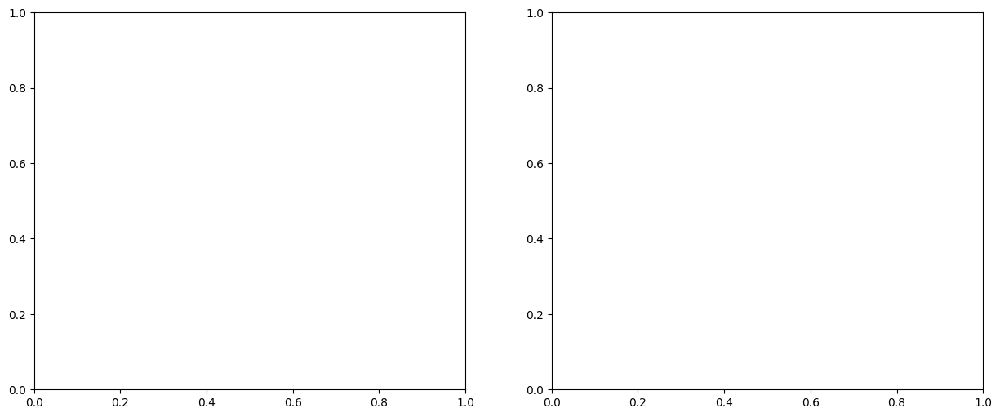

In [1]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

# Load the pickle file
def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

pickle_file_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/processed_data.pkl"
loaded_data = load_pickle_file(pickle_file_path)

# Check the structure of loaded_data
#print("Type of loaded data:", type(loaded_data))
#print("Content of loaded data:", loaded_data)

# If the data is a list, we need to access it via an index (e.g., loaded_data[0])
# If it's a dictionary, we can access the keys directly

# Let's assume the data is an xarray.Dataset or a dictionary
if isinstance(loaded_data, dict):  # If it's a dictionary-like object
    # Extract the variables 'msis_density_orbit' and 'msis_density_hgt453km'
    msis_density_orbit = loaded_data['msis_density_orbit']
    msis_density_hgt453km = loaded_data['msis_density_hgt453km']
elif isinstance(loaded_data, list):  # If it's a list, assume first element is what we need
    # Assuming the first element in the list is the dataset
    msis_density_orbit = loaded_data[0]['msis_density_orbit']
    msis_density_hgt453km = loaded_data[0]['msis_density_hgt453km']
else:
    raise TypeError("Loaded data is neither a dictionary nor a list.")

# Create the contour plots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plotting 'msis_density_orbit'
contour1 = axes[0].contourf(loaded_data['time'], loaded_data['latitude'], msis_density_orbit, cmap='viridis')
axes[0].set_title('Contour plot of msis_density_orbit')
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Latitude')
fig.colorbar(contour1, ax=axes[0], label='Density')

# Plotting 'msis_density_hgt453km'
contour2 = axes[1].contourf(loaded_data['time'], loaded_data['latitude'], msis_density_hgt453km, cmap='viridis')
axes[1].set_title('Contour plot of msis_density_hgt453km')
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Latitude')
fig.colorbar(contour2, ax=axes[1], label='Density')

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
import pickle
import matplotlib.pyplot as plt
import numpy as np

# Load the pickle file
def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

# Load data from the pickle file
pickle_file_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/processed_data.pkl"
loaded_data = load_pickle_file(pickle_file_path)

# Assuming loaded_data is a list with dictionaries
# Extract data from the first item in the list, if the list has dictionaries with the required data
data_dict = loaded_data[0]  # Accessing the first dictionary in the list

# Extracting variables and coordinates
msis_density_orbit = data_dict['msis_density_orbit']
msis_density_hgt453km = data_dict['msis_density_hgt453km']
time = data_dict['time']
latitude = data_dict['latitude']  # Or 'latitude' depending on exact naming

# Ensure msis_density_orbit and msis_density_hgt453km are 2D arrays for contourf
# Reshape if necessary (this assumes time and latitude define the dimensions)

# Convert data to 2D arrays if they are 1D
if msis_density_orbit.ndim == 1 and msis_density_hgt453km.ndim == 1:
    # Create a meshgrid for plotting
    time_grid, lat_grid = np.meshgrid(time, latitude)
    msis_density_orbit = np.tile(msis_density_orbit, (len(latitude), 1))  # Example transformation
    msis_density_hgt453km = np.tile(msis_density_hgt453km, (len(latitude), 1))  # Example transformation

# Create the contour plots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plotting 'msis_density_orbit'
contour1 = axes[0].contourf(time_grid, lat_grid, msis_density_orbit, cmap='viridis')
axes[0].set_title('Contour plot of msis_density_orbit')
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Latitude')
fig.colorbar(contour1, ax=axes[0], label='Density')

# Plotting 'msis_density_hgt453km'
contour2 = axes[1].contourf(time_grid, lat_grid, msis_density_hgt453km, cmap='viridis')
axes[1].set_title('Contour plot of msis_density_hgt453km')
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Latitude')
fig.colorbar(contour2, ax=axes[1], label='Density')

# Show the plot
plt.tight_layout()
plt.show()



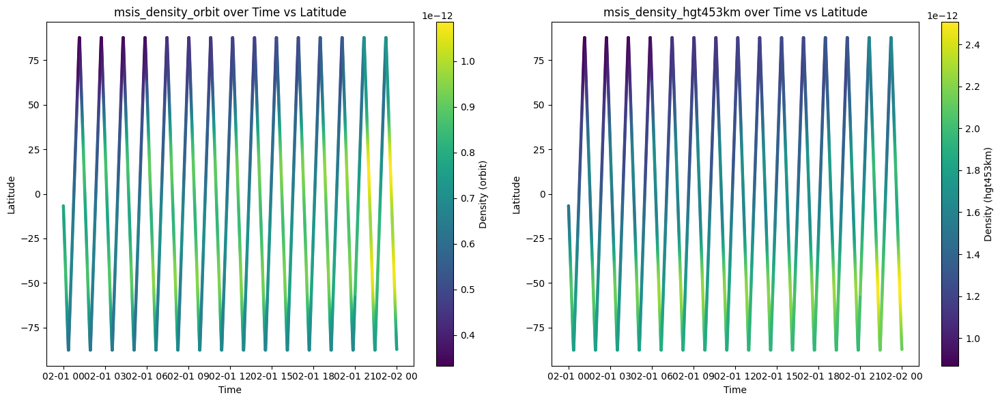

In [4]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

# Load the pickle file
def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

# Load data from the pickle file
pickle_file_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/processed_data.pkl"
loaded_data = load_pickle_file(pickle_file_path)

# Assuming loaded_data is a list of dictionaries
data_dict = loaded_data[0]  # Access the first dictionary in the list

# Extract variables
time = np.array(data_dict['time'])
latitude = np.array(data_dict['latitude'])
msis_density_orbit = np.array(data_dict['msis_density_orbit'])
msis_density_hgt453km = np.array(data_dict['msis_density_hgt453km'])

# Check the lengths of arrays to make sure they match
assert len(time) == len(msis_density_orbit), "Time and msis_density_orbit length mismatch"
assert len(time) == len(msis_density_hgt453km), "Time and msis_density_hgt453km length mismatch"
assert len(time) == len(latitude), "Time and latitude length mismatch"

# Create an xarray.Dataset without reshaping
ds = xr.Dataset(
    {
        "msis_density_orbit": (["time"], msis_density_orbit),
        "msis_density_hgt453km": (["time"], msis_density_hgt453km),
        "latitude": (["time"], latitude),
    },
    coords={"time": time}
)

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Scatter plot of msis_density_orbit over time vs latitude
sc1 = axes[0].scatter(ds['time'], ds['latitude'], c=ds['msis_density_orbit'], cmap='viridis', s=5)
axes[0].set_title('msis_density_orbit over Time vs Latitude')
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Latitude')
fig.colorbar(sc1, ax=axes[0], label='Density (orbit)')

# Scatter plot of msis_density_hgt453km over time vs latitude
sc2 = axes[1].scatter(ds['time'], ds['latitude'], c=ds['msis_density_hgt453km'], cmap='viridis', s=5)
axes[1].set_title('msis_density_hgt453km over Time vs Latitude')
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Latitude')
fig.colorbar(sc2, ax=axes[1], label='Density (hgt453km)')

plt.tight_layout()
plt.show()


In [10]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates

# Load the pickle file
def load_pickle_file(pickle_file_path):
    with open(pickle_file_path, 'rb') as file:
        data = pickle.load(file)
    return data

# Load data from the pickle file
pickle_file_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/processed_data.pkl"
loaded_data = load_pickle_file(pickle_file_path)

# Access the dictionary (assuming the first item in loaded_data list)
# Assuming loaded_data is a list of dictionaries
data_dict = loaded_data[0]  # Access the first dictionary in the list

# Extract variables
time = np.array(data_dict['time'])
latitude = np.array(data_dict['latitude'])
msis_density_orbit = np.array(data_dict['msis_density_orbit'])
msis_density_hgt453km = np.array(data_dict['msis_density_hgt453km'])

# Check the lengths of arrays to make sure they match
assert len(time) == len(msis_density_orbit), "Time and msis_density_orbit length mismatch"
assert len(time) == len(msis_density_hgt453km), "Time and msis_density_hgt453km length mismatch"
assert len(time) == len(latitude), "Time and latitude length mismatch"

# Create an xarray.Dataset without reshaping
ds = xr.Dataset(
    {
        "msis_density_orbit": (["time"], msis_density_orbit),
        "msis_density_hgt453km": (["time"], msis_density_hgt453km),
        "latitude": (["time"], latitude),
    },
    coords={"time": time}
)

# Ensure unique time and latitude values
unique_time = np.unique(time)
unique_latitude = np.unique(latitude)

# Reshape the density arrays to match (time, latitude)
msis_density_orbit = msis_density_orbit.reshape(len(unique_time), len(unique_latitude))
msis_density_hgt453km = msis_density_hgt453km.reshape(len(unique_time), len(unique_latitude))

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Set the date format on the x-axis
time_format = mdates.DateFormatter('%Y')  # Show only the year

# Plot 'msis_density_orbit'
contour1 = axes[0].contourf(unique_time, unique_latitude, msis_density_orbit.T, cmap='viridis', levels=50)
axes[0].set_title('msis_density_orbit')
axes[0].xaxis.set_major_formatter(time_format)
axes[0].set_xlabel('Time')
axes[0].set_ylabel('Magnetic Latitude')
fig.colorbar(contour1, ax=axes[0], label='Density (orbit)')

# Plot 'msis_density_hgt453km'
contour2 = axes[1].contourf(unique_time, unique_latitude, msis_density_hgt453km.T, cmap='viridis', levels=50)
axes[1].set_title('msis_density_hgt453km')
axes[1].xaxis.set_major_formatter(time_format)
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Magnetic Latitude')
fig.colorbar(contour2, ax=axes[1], label='Density (hgt453km)')

# Adjust layout
plt.tight_layout()
plt.show()


ValueError: cannot reshape array of size 8640 into shape (8640,8640)

In [ ]:
import xarray as xr
import os
import glob
from tqdm import tqdm

# Path to your folder
folder_path = "/mnt/sofs01/workcache/SO-Shared/SWARM-DISS/DNS/ACC/SAT_C/normalt_453km"

# Initialize an empty list to store combined yearly datasets
combined_data_list = []

# Process data for each year individually from 2014 to 2023
for year in range(2014, 2024):
    print(f"Processing year {year}")

    # Use glob to get a list of all files for the current year
    file_pattern = os.path.join(folder_path, f"SW_OPER_DNSCACC_2__*{year}*normalt_453km.nc")
    file_list = glob.glob(file_pattern)

    # Initialize a list to store datasets for the current year
    yearly_datasets = []

    # Load each file for the current year with progress tracking, skipping any 0KB files
    for file in tqdm(file_list, desc=f"Loading files for {year}"):
        if os.path.getsize(file) == 0:
            print(f"Skipping empty file: {file}")
            continue
        # Load the dataset
        ds = xr.open_dataset(file, engine="netcdf4")
        yearly_datasets.append(ds)

    # Combine datasets for the current year
    if yearly_datasets:
        combined_yearly_data = xr.combine_by_coords(yearly_datasets)
        combined_data_list.append(combined_yearly_data)

    # Close individual datasets for the current year to free up memory
    for ds in yearly_datasets:
        ds.close()

# Combine all yearly datasets into a final combined dataset along the time dimension
combined_data = xr.concat(combined_data_list, dim='time')

# Now `combined_data` holds the full combined xarray.Dataset in memory for all years
print(combined_data)


Processing year 2014


Loading files for 2014: 100%|██████████| 311/311 [00:07<00:00, 43.62it/s]


Processing year 2015


Loading files for 2015: 100%|██████████| 274/274 [00:05<00:00, 47.15it/s]


Processing year 2016


Loading files for 2016: 100%|██████████| 364/364 [00:08<00:00, 41.27it/s]


Processing year 2017


Loading files for 2017: 100%|██████████| 353/353 [00:08<00:00, 43.12it/s]


In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from scipy.fftpack import fft, fftfreq, ifft

# Path to the data directory
data_dir = 'data/SAT_C/CorrectedGridData'

# Load all NetCDF files for years 2014–2023
files = sorted(glob(f"{data_dir}/*.nc"))

# Initialize lists to store global mean density and corresponding time
global_mean_densities = []
times = []

# Step 1: Load and Aggregate Data
for file in files:
    # Open the dataset
    ds = xr.open_dataset(file)
    
    # Extract density
    density = ds['density']
    
    # Compute global mean (average over latitude and solar local time)
    global_mean = density.mean(dim=['qd_latitude', 'solar_local_time'])
    
    # Append the global mean density and corresponding time
    global_mean_densities.append(global_mean.values)
    times.append(global_mean['time'].values)
    
    # Close the dataset
    ds.close()

# Step 2: Concatenate Data
global_mean_densities = np.concatenate(global_mean_densities)
times = np.concatenate(times)

# Convert time to a continuous time array (in days since the first observation)
time_days = (times - times[0]) / np.timedelta64(1, 'D')

# Step 3: Fourier Decomposition
N = len(global_mean_densities)
density_fft = fft(global_mean_densities)
frequencies = fftfreq(N, d=(time_days[1] - time_days[0]))

# Identify indices for specific frequency components
annual_idx = np.argmin(np.abs(frequencies - 1/365))
semiannual_idx = np.argmin(np.abs(frequencies - 2/365))
threecycle_idx = np.argmin(np.abs(frequencies - 3/365))
fourcycle_idx = np.argmin(np.abs(frequencies - 4/365))

# Extract components
components = {
    'annual': ifft([density_fft[annual_idx] if i == annual_idx else 0 for i in range(N)]).real,
    'semiannual': ifft([density_fft[semiannual_idx] if i == semiannual_idx else 0 for i in range(N)]).real,
    'threecycle': ifft([density_fft[threecycle_idx] if i == threecycle_idx else 0 for i in range(N)]).real,
    'fourcycle': ifft([density_fft[fourcycle_idx] if i == fourcycle_idx else 0 for i in range(N)]).real,
}

# Reconstructed signal
reconstructed_signal = np.sum(list(components.values()), axis=0)

# Step 4: Plot the Data
plt.figure(figsize=(16, 12))

# (a) Global-mean neutral density with Fourier fit
plt.subplot(2, 1, 1)
plt.plot(time_days, global_mean_densities, label="Global Mean Density", color='black')
plt.plot(time_days, reconstructed_signal, label="Fourier Fit", color='red', linestyle='--')
plt.title("Global-Mean Neutral Density")
plt.xlabel("Time (days since start)")
plt.ylabel("Density (normalized)")
plt.legend()

# (b) Fourier components
plt.subplot(2, 1, 2)
plt.plot(time_days, components['annual'], label="Annual Component", color='red')
plt.plot(time_days, components['semiannual'], label="Semi-Annual Component", color='blue')
plt.plot(time_days, components['threecycle'], label="Three-Cycle/Year Component", color='green')
plt.plot(time_days, components['fourcycle'], label="Four-Cycle/Year Component", color='magenta')
plt.title("Fourier Components of Neutral Density")
plt.xlabel("Time (days since start)")
plt.ylabel("Density (normalized)")
plt.legend()

plt.tight_layout()
plt.show()


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (51408,) + inhomogeneous part.

In [2]:
# Debugging: Print shapes and values of key variables
print("N (length of global_mean_densities):", N)
print("Shape of density_fft:", density_fft.shape)
print("Frequencies:", frequencies)
print("Annual index:", annual_idx)
print("Semi-annual index:", semiannual_idx)
print("Three-cycle index:", threecycle_idx)
print("Four-cycle index:", fourcycle_idx)

# Check Fourier components isolation
try:
    # Ensure correct size and shape for the components
    annual_component = [density_fft[i] if i == annual_idx else 0 for i in range(N)]
    semiannual_component = [density_fft[i] if i == semiannual_idx else 0 for i in range(N)]
    threecycle_component = [density_fft[i] if i == threecycle_idx else 0 for i in range(N)]
    fourcycle_component = [density_fft[i] if i == fourcycle_idx else 0 for i in range(N)]

    # Convert to numpy arrays
    annual_component = np.array(annual_component)
    semiannual_component = np.array(semiannual_component)
    threecycle_component = np.array(threecycle_component)
    fourcycle_component = np.array(fourcycle_component)

    # Perform inverse FFT
    components = {
        'annual': ifft(annual_component).real,
        'semiannual': ifft(semiannual_component).real,
        'threecycle': ifft(threecycle_component).real,
        'fourcycle': ifft(fourcycle_component).real,
    }

    # Reconstructed signal
    reconstructed_signal = np.sum(list(components.values()), axis=0)

except ValueError as e:
    print("Error in Fourier decomposition or inverse FFT:", e)


N (length of global_mean_densities): 51408
Shape of density_fft: (51408, 13)
Frequencies: [ 0.          0.00031124  0.00062247 ... -0.00093371 -0.00062247
 -0.00031124]
Annual index: 9
Semi-annual index: 18
Three-cycle index: 26
Four-cycle index: 35
Error in Fourier decomposition or inverse FFT: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (51408,) + inhomogeneous part.


Time Interval (d): 0.0674604139514074
Frequencies: [ 0.          0.00028835  0.0005767  ... -0.00086505 -0.0005767
 -0.00028835]
Min frequency: -7.411754104565034 Max frequency: 7.411465754343101


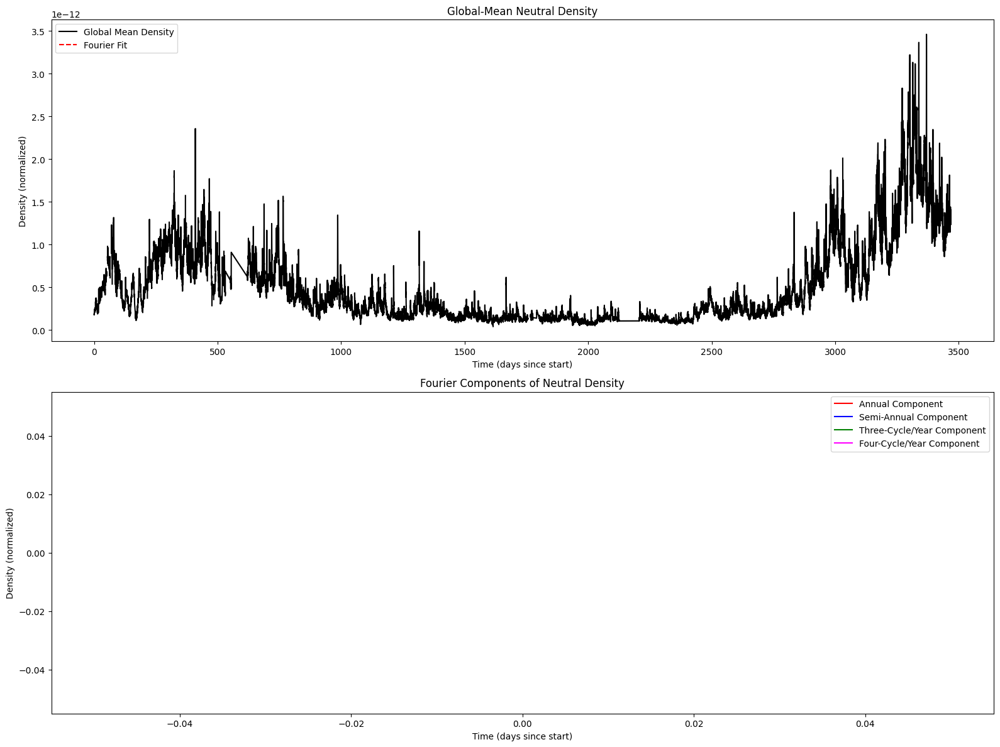

In [9]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from scipy.fftpack import fft, fftfreq, ifft
from scipy.interpolate import interp1d

# Path to the data directory
data_dir = 'data/SAT_C/CorrectedGridData/'

# Load all NetCDF files for years 2014–2023
files = sorted(glob(f"{data_dir}/*.nc"))

# Initialize lists to store global mean density and corresponding time
global_mean_densities = []
times = []

# Step 1: Load and Aggregate Data
for file in files:
    # Open the dataset
    ds = xr.open_dataset(file)
    
    # Extract density
    density = ds['density']
    
    # Compute global mean (average over latitude and solar local time)
    global_mean = density.mean(dim=['qd_latitude', 'solar_local_time'])
    
    # Ensure the result is 1D by flattening if necessary
    global_mean = global_mean.mean(dim='altitude') if 'altitude' in global_mean.dims else global_mean
    
    # Append the global mean density and corresponding time
    global_mean_densities.append(global_mean.values.flatten())
    times.append(global_mean['time'].values)
    
    # Close the dataset
    ds.close()

# Step 2: Concatenate Data
global_mean_densities = np.concatenate(global_mean_densities)
times = np.concatenate(times)

# Convert time to a continuous time array (in days since the first observation)
time_days = (times - times[0]) / np.timedelta64(1, 'D')

# Step 3: Resample time series if necessary (to handle non-uniform time spacing)
time_uniform = np.linspace(time_days.min(), time_days.max(), len(global_mean_densities))
interpolator = interp1d(time_days, global_mean_densities, kind='linear', fill_value="extrapolate")
global_mean_densities = interpolator(time_uniform)
time_days = time_uniform

# Step 4: Fourier Decomposition
N = len(global_mean_densities)
density_fft = fft(global_mean_densities)

# Calculate the frequency resolution (d)
time_interval = time_days[1] - time_days[0]
frequencies = fftfreq(N, d=time_interval)

# Debug: Inspect frequencies and adjust tolerance if necessary
print("Time Interval (d):", time_interval)
print("Frequencies:", frequencies)
print("Min frequency:", frequencies.min(), "Max frequency:", frequencies.max())

# Scale the frequency for better matching
frequencies_scaled = frequencies * 365  # Scale to cycles per year (1/year)

# Set a relaxed tolerance for frequency matching
atol = 1e-4

# Define a function to find the closest index for a specific frequency
def find_closest_frequency(frequencies, target_freq, atol=1e-4):
    # Find all the indices where the frequencies are within the tolerance range
    indices = np.where(np.abs(frequencies - target_freq) < atol)[0]
    if len(indices) == 0:
        # If no exact match, find the closest frequency
        closest_index = np.argmin(np.abs(frequencies - target_freq))
        return closest_index
    return indices[0]

# Identify indices for specific frequency components
annual_idx = find_closest_frequency(frequencies_scaled, 1, atol)
semiannual_idx = find_closest_frequency(frequencies_scaled, 2, atol)
threecycle_idx = find_closest_frequency(frequencies_scaled, 3, atol)
fourcycle_idx = find_closest_frequency(frequencies_scaled, 4, atol)

# Extract components (inverse FFT for each component)
annual_component = np.zeros(N, dtype=complex)
annual_component[annual_idx] = density_fft[annual_idx]

semiannual_component = np.zeros(N, dtype=complex)
semiannual_component[semiannual_idx] = density_fft[semiannual_idx]

threecycle_component = np.zeros(N, dtype=complex)
threecycle_component[threecycle_idx] = density_fft[threecycle_idx]

fourcycle_component = np.zeros(N, dtype=complex)
fourcycle_component[fourcycle_idx] = density_fft[fourcycle_idx]

components = {
    'annual': ifft(annual_component).real,
    'semiannual': ifft(semiannual_component).real,
    'threecycle': ifft(threecycle_component).real,
    'fourcycle': ifft(fourcycle_component).real,
}

# Reconstructed signal (sum of components)
reconstructed_signal = np.sum(list(components.values()), axis=0)

# Step 5: Plot the Data
plt.figure(figsize=(16, 12))

# (a) Global-mean neutral density with Fourier fit
plt.subplot(2, 1, 1)
plt.plot(time_days, global_mean_densities, label="Global Mean Density", color='black')
plt.plot(time_days, reconstructed_signal, label="Fourier Fit", color='red', linestyle='--')
plt.title("Global-Mean Neutral Density")
plt.xlabel("Time (days since start)")
plt.ylabel("Density (normalized)")
plt.legend()

# (b) Fourier components
plt.subplot(2, 1, 2)
plt.plot(time_days, components['annual'], label="Annual Component", color='red')
plt.plot(time_days, components['semiannual'], label="Semi-Annual Component", color='blue')
plt.plot(time_days, components['threecycle'], label="Three-Cycle/Year Component", color='green')
plt.plot(time_days, components['fourcycle'], label="Four-Cycle/Year Component", color='magenta')
plt.title("Fourier Components of Neutral Density")
plt.xlabel("Time (days since start)")
plt.ylabel("Density (normalized)")
plt.legend()

plt.tight_layout()
plt.show()


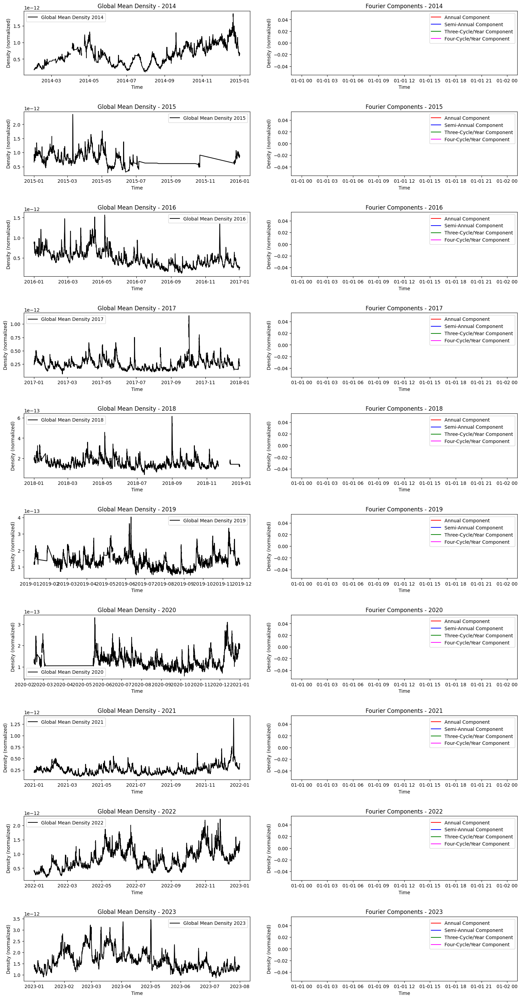

In [11]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from scipy.fftpack import fft, fftfreq, ifft
from scipy.interpolate import interp1d
import pandas as pd

# Path to the data directory
data_dir = 'data/SAT_C/CorrectedGridData/'

# Load all NetCDF files for years 2014–2023
files = sorted(glob(f"{data_dir}/*.nc"))

# Initialize lists to store global mean density and corresponding time
global_mean_densities = []
times = []

# Step 1: Load and Aggregate Data
for file in files:
    # Open the dataset
    ds = xr.open_dataset(file)
    
    # Extract density
    density = ds['density']
    
    # Compute global mean (average over latitude and solar local time)
    global_mean = density.mean(dim=['qd_latitude', 'solar_local_time'])
    
    # Ensure the result is 1D by flattening if necessary
    global_mean = global_mean.mean(dim='altitude') if 'altitude' in global_mean.dims else global_mean
    
    # Append the global mean density and corresponding time
    global_mean_densities.append(global_mean.values.flatten())
    times.append(global_mean['time'].values)
    
    # Close the dataset
    ds.close()

# Step 2: Concatenate Data
global_mean_densities = np.concatenate(global_mean_densities)
times = np.concatenate(times)

# Convert time to a continuous time array (in days since the first observation)
time_days = (times - times[0]) / np.timedelta64(1, 'D')

# Step 3: Resample time series if necessary (to handle non-uniform time spacing)
time_uniform = np.linspace(time_days.min(), time_days.max(), len(global_mean_densities))
interpolator = interp1d(time_days, global_mean_densities, kind='linear', fill_value="extrapolate")
global_mean_densities = interpolator(time_uniform)
time_days = time_uniform

# Step 4: Fourier Decomposition
N = len(global_mean_densities)
density_fft = fft(global_mean_densities)

# Calculate the frequency resolution (d)
time_interval = time_days[1] - time_days[0]
frequencies = fftfreq(N, d=time_interval)

# Scale the frequency for better matching
frequencies_scaled = frequencies * 365  # Scale to cycles per year (1/year)

# Set a relaxed tolerance for frequency matching
atol = 1e-4

# Define a function to find the closest index for a specific frequency
def find_closest_frequency(frequencies, target_freq, atol=1e-4):
    # Find all the indices where the frequencies are within the tolerance range
    indices = np.where(np.abs(frequencies - target_freq) < atol)[0]
    if len(indices) == 0:
        # If no exact match, find the closest frequency
        closest_index = np.argmin(np.abs(frequencies - target_freq))
        return closest_index
    return indices[0]

# Identify indices for specific frequency components
annual_idx = find_closest_frequency(frequencies_scaled, 1, atol)
semiannual_idx = find_closest_frequency(frequencies_scaled, 2, atol)
threecycle_idx = find_closest_frequency(frequencies_scaled, 3, atol)
fourcycle_idx = find_closest_frequency(frequencies_scaled, 4, atol)

# Extract components (inverse FFT for each component)
annual_component = np.zeros(N, dtype=complex)
annual_component[annual_idx] = density_fft[annual_idx]

semiannual_component = np.zeros(N, dtype=complex)
semiannual_component[semiannual_idx] = density_fft[semiannual_idx]

threecycle_component = np.zeros(N, dtype=complex)
threecycle_component[threecycle_idx] = density_fft[threecycle_idx]

fourcycle_component = np.zeros(N, dtype=complex)
fourcycle_component[fourcycle_idx] = density_fft[fourcycle_idx]

components = {
    'annual': ifft(annual_component).real,
    'semiannual': ifft(semiannual_component).real,
    'threecycle': ifft(threecycle_component).real,
    'fourcycle': ifft(fourcycle_component).real,
}

# Reconstructed signal (sum of components)
reconstructed_signal = np.sum(list(components.values()), axis=0)

# Convert times to pandas datetime for better handling of years
time_dates = pd.to_datetime(times)

# Step 5: Plot the Data
fig, axes = plt.subplots(len(np.unique(time_dates.year)), 2, figsize=(16, 3 * len(np.unique(time_dates.year))))

# Get unique years
years = np.unique(time_dates.year)

# Iterate over each year and create separate plots
for i, year in enumerate(years):
    year_mask = (time_dates.year == year)

    # Plot the global mean density
    axes[i, 0].plot(time_dates[year_mask], global_mean_densities[year_mask], label=f"Global Mean Density {year}", color='black')
    axes[i, 0].set_title(f"Global Mean Density - {year}")
    axes[i, 0].set_xlabel("Time")
    axes[i, 0].set_ylabel("Density (normalized)")
    axes[i, 0].legend()

    # Plot the Fourier components for the year
    axes[i, 1].plot(time_dates[year_mask], components['annual'][year_mask], label="Annual Component", color='red')
    axes[i, 1].plot(time_dates[year_mask], components['semiannual'][year_mask], label="Semi-Annual Component", color='blue')
    axes[i, 1].plot(time_dates[year_mask], components['threecycle'][year_mask], label="Three-Cycle/Year Component", color='green')
    axes[i, 1].plot(time_dates[year_mask], components['fourcycle'][year_mask], label="Four-Cycle/Year Component", color='magenta')
    axes[i, 1].set_title(f"Fourier Components - {year}")
    axes[i, 1].set_xlabel("Time")
    axes[i, 1].set_ylabel("Density (normalized)")
    axes[i, 1].legend()

# Adjust the layout to avoid overlap
plt.tight_layout(pad=3.0)
plt.show()


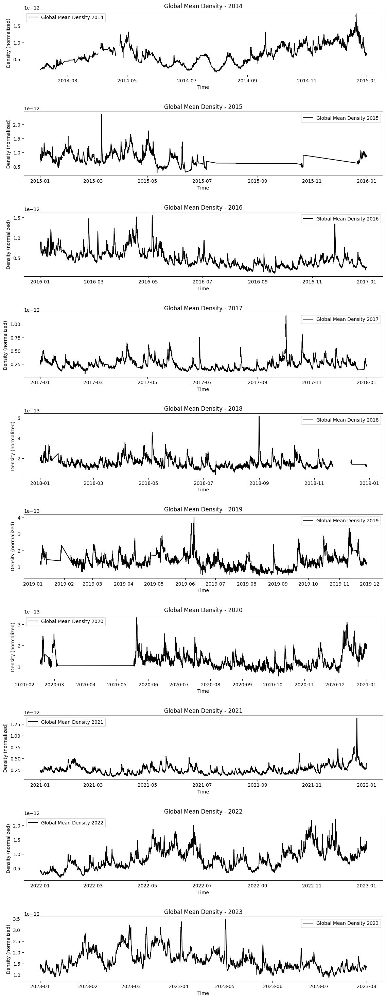

In [47]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from scipy.fftpack import fft, fftfreq, ifft
from scipy.interpolate import interp1d
import pandas as pd

# Path to the data directory
data_dir = 'data/SAT_C/CorrectedGridData/'

# Load all NetCDF files for years 2014–2023
files = sorted(glob(f"{data_dir}/*.nc"))

# Initialize lists to store global mean density and corresponding time
global_mean_densities = []
times = []

# Step 1: Load and Aggregate Data
for file in files:
    # Open the dataset
    ds = xr.open_dataset(file)
    
    # Extract density
    density = ds['density']
    
    # Compute global mean (average over latitude and solar local time)
    global_mean = density.mean(dim=['qd_latitude', 'solar_local_time'])
    
    # Ensure the result is 1D by flattening if necessary
    global_mean = global_mean.mean(dim='altitude') if 'altitude' in global_mean.dims else global_mean
    
    # Append the global mean density and corresponding time
    global_mean_densities.append(global_mean.values.flatten())
    times.append(global_mean['time'].values)
    
    # Close the dataset
    ds.close()

# Step 2: Concatenate Data
global_mean_densities = np.concatenate(global_mean_densities)
times = np.concatenate(times)

# Convert time to a continuous time array (in days since the first observation)
time_days = (times - times[0]) / np.timedelta64(1, 'D')

# Step 3: Resample time series if necessary (to handle non-uniform time spacing)
time_uniform = np.linspace(time_days.min(), time_days.max(), len(global_mean_densities))
interpolator = interp1d(time_days, global_mean_densities, kind='linear', fill_value="extrapolate")
global_mean_densities = interpolator(time_uniform)
time_days = time_uniform

# Convert times to pandas datetime for better handling of years
time_dates = pd.to_datetime(times)

# Step 4: Plot the Data
fig, axes = plt.subplots(len(np.unique(time_dates.year)), 1, figsize=(12, 3 * len(np.unique(time_dates.year))))

# Get unique years
years = np.unique(time_dates.year)

# Iterate over each year and create separate plots
for i, year in enumerate(years):
    year_mask = (time_dates.year == year)

    # Plot the global mean density for the current year
    axes[i].plot(time_dates[year_mask], global_mean_densities[year_mask], label=f"Global Mean Density {year}", color='black')
    axes[i].set_title(f"Global Mean Density - {year}")
    axes[i].set_xlabel("Time")
    axes[i].set_ylabel("Density (normalized)")
    axes[i].legend()

# Adjust the layout to avoid overlap
plt.tight_layout(pad=3.0)
plt.show()


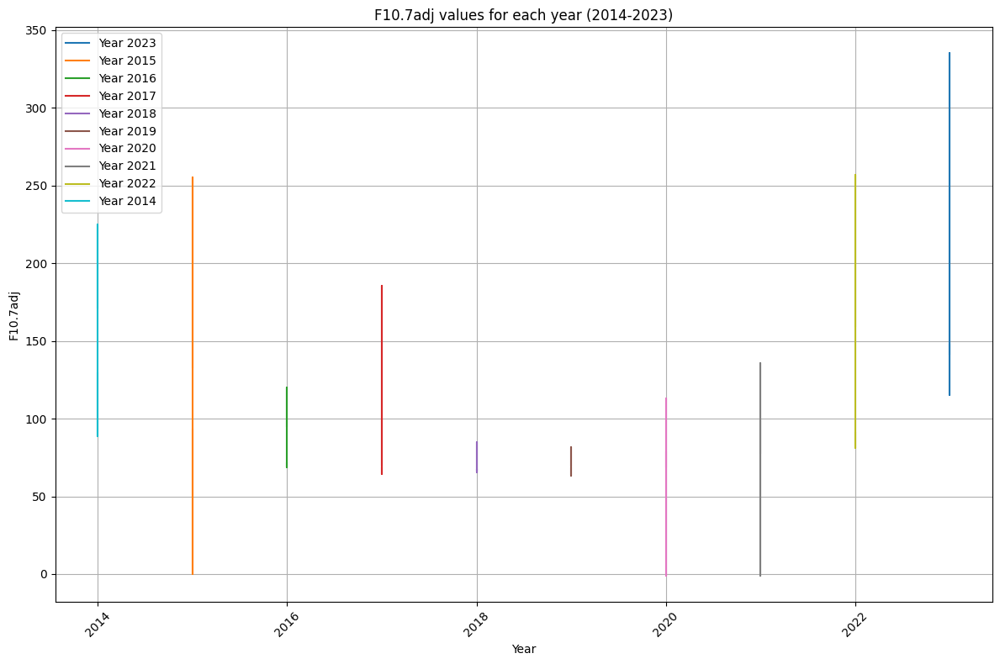

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Path to your data directory where the CSV files are stored
data_dir = 'data/SAT_C/Kp,Ap,f10.7'  # Replace with the actual path to your file

# Get a list of all CSV files in the directory
csv_files = [f for f in os.listdir(data_dir) if f.endswith('.csv')]

# Initialize an empty dictionary to store the data for each year
yearly_f107_data = {}

# Loop through each CSV file and read the data
for file in csv_files:
    # Full file path
    file_path = os.path.join(data_dir, file)
    
    # Load the CSV file into a pandas DataFrame
    df = pd.read_csv(file_path)
    
    # Check if the required columns ('YYY', 'F10.7adj') exist in the DataFrame
    if 'YYY' in df.columns and 'F10.7adj' in df.columns:
        # Extract the 'F10.7adj' values and the 'Year' column
        yearly_data = df[['YYY', 'F10.7adj']].dropna()
        
        # Extract the year from the 'YYY' column
        for year in yearly_data['YYY'].unique():
            # Filter the data for each year
            year_data = yearly_data[yearly_data['YYY'] == year]
            if year not in yearly_f107_data:
                yearly_f107_data[year] = year_data
            else:
                yearly_f107_data[year] = pd.concat([yearly_f107_data[year], year_data])

# Now plot the F10.7adj for each year
plt.figure(figsize=(12, 8))

# Loop through each year and plot the F10.7adj values
for year, data in yearly_f107_data.items():
    plt.plot(data['YYY'], data['F10.7adj'], label=f'Year {year}')

# Format the plot
plt.title('F10.7adj values for each year (2014-2023)')
plt.xlabel('Year')
plt.ylabel('F10.7adj')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


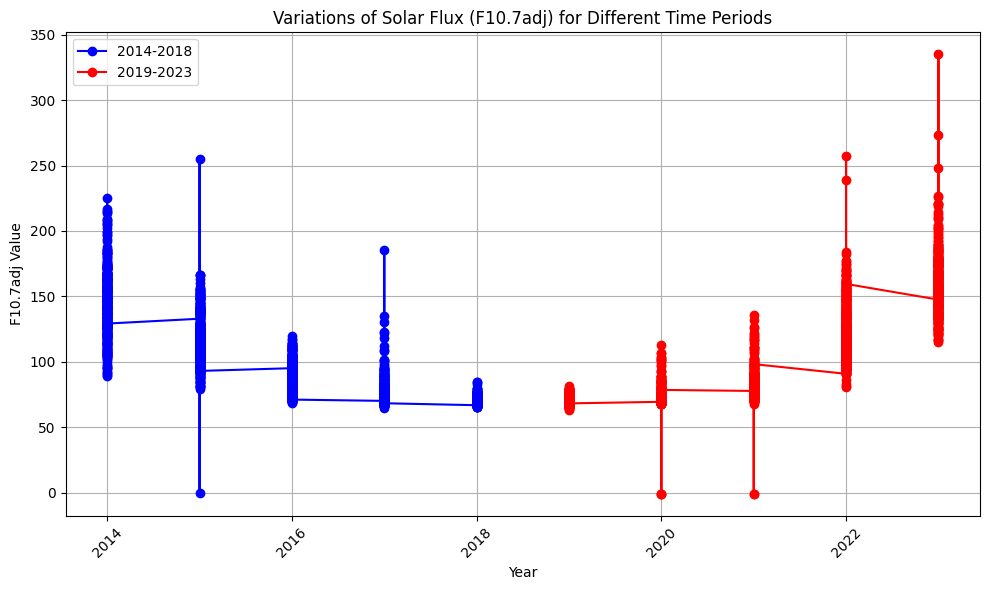

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Path to your data directory where the CSV files are stored
data_dir = 'data/SAT_C/Kp,Ap,f10.7'  # Replace with the actual path to your file

# Get a list of all CSV files in the directory
csv_files = [f for f in os.listdir(data_dir) if f.endswith('.csv')]

# Initialize an empty dictionary to store the data for each year
yearly_f107_data = {}

# Loop through each CSV file and read the data
for file in csv_files:
    # Full file path
    file_path = os.path.join(data_dir, file)
    
    # Load the CSV file into a pandas DataFrame
    df = pd.read_csv(file_path)
    
    # Check if the required columns ('YYY', 'F10.7adj') exist in the DataFrame
    if 'YYY' in df.columns and 'F10.7adj' in df.columns:
        # Extract the 'F10.7adj' values and the 'Year' column
        yearly_data = df[['YYY', 'F10.7adj']].dropna()
        
        # Extract the year from the 'YYY' column
        for year in yearly_data['YYY'].unique():
            # Filter the data for each year
            year_data = yearly_data[yearly_data['YYY'] == year]
            if year not in yearly_f107_data:
                yearly_f107_data[year] = year_data
            else:
                yearly_f107_data[year] = pd.concat([yearly_f107_data[year], year_data])

# Define periods for plotting
period_1_years = list(range(2014, 2019))  # 2014 to 2018
period_2_years = list(range(2019, 2024))  # 2019 to 2023

# Prepare the data for the two periods
period_1_data = pd.concat([yearly_f107_data[year] for year in period_1_years if year in yearly_f107_data], ignore_index=True)
period_2_data = pd.concat([yearly_f107_data[year] for year in period_2_years if year in yearly_f107_data], ignore_index=True)

# Plot the data for the two periods
plt.figure(figsize=(10, 6))

# Plot for Period 1 (2014-2018)
plt.plot(period_1_data['YYY'], period_1_data['F10.7adj'], label='2014-2018', color='b', linestyle='-', marker='o')

# Plot for Period 2 (2019-2023)
plt.plot(period_2_data['YYY'], period_2_data['F10.7adj'], label='2019-2023', color='r', linestyle='-', marker='o')

# Add titles and labels
plt.title('Variations of Solar Flux (F10.7adj) for Different Time Periods')
plt.xlabel('Year')
plt.ylabel('F10.7adj Value')
plt.legend()

# Improve the plot appearance
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


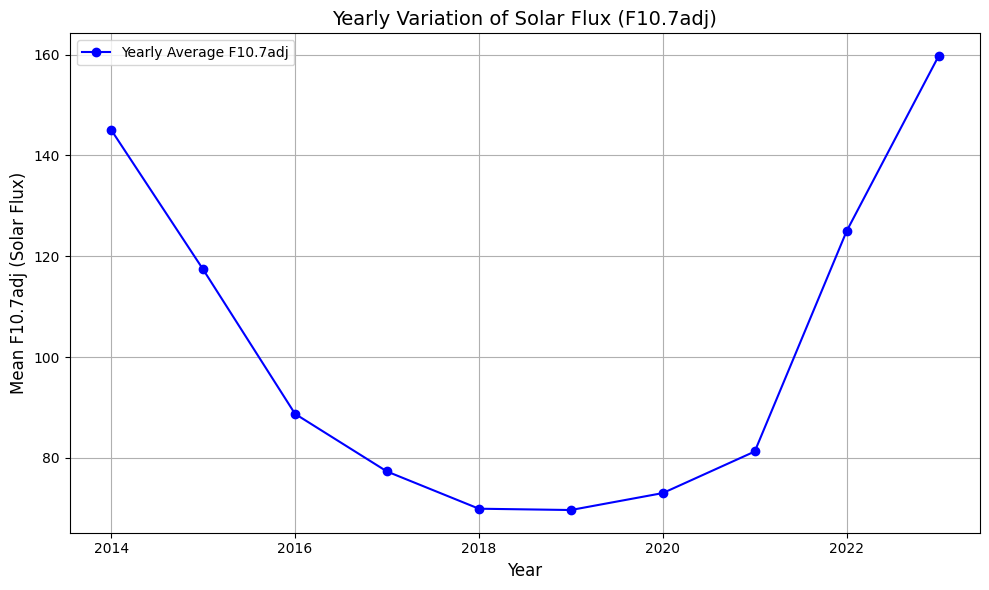

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Path to your data directory where the CSV files are stored
data_dir = 'data/SAT_C/Kp,Ap,f10.7'  # Replace with the actual path to your file

# Get a list of all CSV files in the directory
csv_files = [f for f in os.listdir(data_dir) if f.endswith('.csv')]

# Initialize an empty DataFrame to store all the data
f107_data_all = pd.DataFrame()

# Loop through each CSV file and read the data
for file in csv_files:
    # Full file path
    file_path = os.path.join(data_dir, file)
    
    # Load the CSV file into a pandas DataFrame
    df = pd.read_csv(file_path)
    
    # Check if the required columns ('YYY', 'MM', 'DD', 'F10.7adj') exist
    if 'YYY' in df.columns and 'F10.7adj' in df.columns:
        # Add the F10.7adj data and the year to the DataFrame
        df['Year'] = df['YYY']  # Assuming 'YYY' is the year column
        f107_data_all = pd.concat([f107_data_all, df[['Year', 'F10.7adj']]], ignore_index=True)

# Group by year and calculate the mean F10.7adj for each year
f107_yearly_avg = f107_data_all.groupby('Year')['F10.7adj'].mean()

# Plot the yearly average F10.7adj values
plt.figure(figsize=(10, 6))
plt.plot(f107_yearly_avg.index, f107_yearly_avg.values, marker='o', linestyle='-', color='b', label='Yearly Average F10.7adj')

# Add title and labels
plt.title('Yearly Variation of Solar Flux (F10.7adj)', fontsize=14)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Mean F10.7adj (Solar Flux)', fontsize=12)

# Add grid lines for clarity
plt.grid(True)

# Tight layout for better spacing
plt.tight_layout()

# Show the plot
plt.legend()
plt.show()


No data found for 3 in SAT_C_ACC_GridData_2020-02-16_qd_Altitude.nc.
No data found for 6 in SAT_C_ACC_GridData_2020-02-16_qd_Altitude.nc.
No data found for 9 in SAT_C_ACC_GridData_2020-02-16_qd_Altitude.nc.
No data found for 12 in SAT_C_ACC_GridData_2020-02-16_qd_Altitude.nc.
No data found for 3 in SAT_C_ACC_GridData_2020-02-17_qd_Altitude.nc.
No data found for 6 in SAT_C_ACC_GridData_2020-02-17_qd_Altitude.nc.
No data found for 9 in SAT_C_ACC_GridData_2020-02-17_qd_Altitude.nc.
No data found for 12 in SAT_C_ACC_GridData_2020-02-17_qd_Altitude.nc.
No data found for 3 in SAT_C_ACC_GridData_2020-02-18_qd_Altitude.nc.
No data found for 6 in SAT_C_ACC_GridData_2020-02-18_qd_Altitude.nc.
No data found for 9 in SAT_C_ACC_GridData_2020-02-18_qd_Altitude.nc.
No data found for 12 in SAT_C_ACC_GridData_2020-02-18_qd_Altitude.nc.
No data found for 3 in SAT_C_ACC_GridData_2020-02-19_qd_Altitude.nc.
No data found for 6 in SAT_C_ACC_GridData_2020-02-19_qd_Altitude.nc.
No data found for 9 in SAT_C_AC

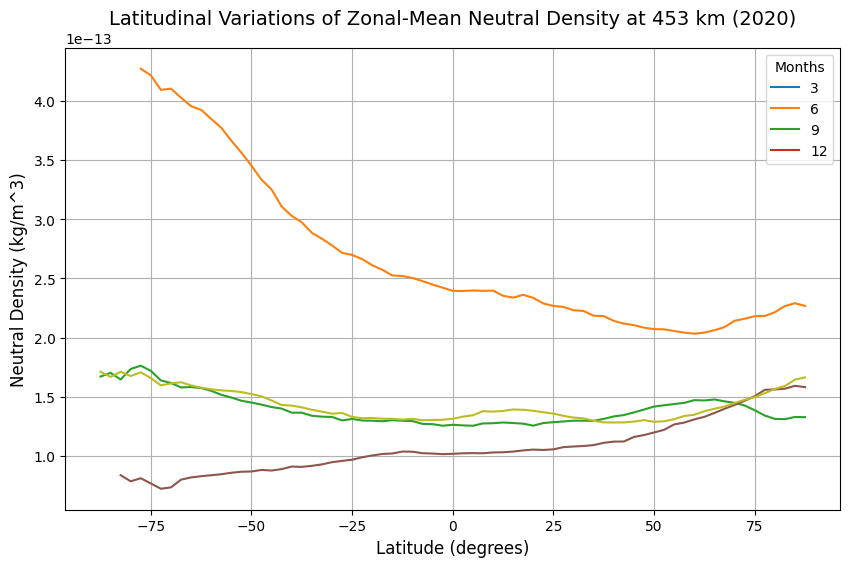

In [43]:
import os
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

# Folder containing your NetCDF files
data_dir = 'data/SAT_C/CorrectedGridData/'

# List all files in the data directory
files = [f for f in os.listdir(data_dir) if f.endswith('.nc')]

# Filter files for the year 2020
files_2020 = [f for f in files if '2020' in f]

# List of months to analyze
months = [3, 6, 9, 12]
month_labels = {
    3: "March Equinox",
    6: "June Solstice",
    9: "September Equinox",
    12: "December Solstice"
}
# Dictionary to store average neutral density for each month
avg_density_per_month = {}

# Loop over the files for 2020
for file in files_2020:
    # Open the NetCDF file for the current year 2020 file
    file_path = os.path.join(data_dir, file)
    ds = xr.open_dataset(file_path)
    
    # Print the dataset to check its structure and variable names
    #print(f"Processing file: {file}")
    #print(ds)

    # Filter data for 2020 (if not already in the file)
    ds_2020 = ds.sel(time=ds['time'].dt.year == 2020)
    
    # Loop through the selected months and calculate average neutral density
    for month in months:
        # Check if the month exists in the time dimension for this file
        month_data = ds_2020.sel(time=ds_2020['time'].dt.month == month, drop=True)
        
        if len(month_data.time) > 0:  # Only process if there is data for the month
            print(f"Data found for {month} in {file}.")
            
            # Check if 'density' variable exists in the dataset and extract it
            if 'density' in month_data.variables:
                avg_density = month_data['density'].mean(dim='time')  # Average along time dimension
                avg_density = avg_density.mean(dim='solar_local_time')  # Optionally average along time of day

                # Store the results in a dictionary
                if month not in avg_density_per_month:
                    avg_density_per_month[month] = []
                avg_density_per_month[month].append(avg_density)
            else:
                print(f"Density variable not found in the dataset for {month} in {file}.")
        else:
            print(f"No data found for {month} in {file}.")

# Check if the dictionary has data for each month
#print(f"Data for each month: {avg_density_per_month}")

# Plot the results
plt.figure(figsize=(10, 6))

# List to keep track of the legend labels
legend_labels = []

# Plot latitudinal variations for each month
for month in months:
    # Check if there's data for the current month
    if month in avg_density_per_month and len(avg_density_per_month[month]) > 0:
        # Calculate the average of the results for each month
        avg_density_across_files = np.mean(avg_density_per_month[month], axis=0)
        
        # Get latitude values (assuming the latitude variable is 'qd_latitude')
        latitude_values = month_data['qd_latitude'].values  # Assuming the latitude variable is 'qd_latitude'
        
        # Plot the latitudinal variation for the current month
        plt.plot(latitude_values, avg_density_across_files, label=f'{month}')

        # Add the month to the legend labels list
        legend_labels.append(f'{month}')

# Adding labels and title
plt.title('Latitudinal Variations of Zonal-Mean Neutral Density at 453 km (2020)', fontsize=14)
plt.xlabel('Latitude (degrees)', fontsize=12)
plt.ylabel('Neutral Density (kg/m^3)', fontsize=12)

# Display the legend with only the months that have data
plt.legend(title="Months", labels=legend_labels)
plt.grid(True)

# Show plot
plt.show()
